# EDA

## 讀取,轉換字串成可以訓練的資料

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import math

%matplotlib inline
data_path = '../../data'

random_seed = 2000

In [2]:
data_list=["raw_data.csv","FE_data1.csv","FE_data2.csv","FE_data2_2.csv","FE_data3.csv","FE_data4.csv",\
           "FE_data4_2.csv","FE_data5.csv","FE_data6.csv","FE_data7.csv","FE_data7_2.csv",\
            "pca_feature.csv","isolationtree_feature.csv","kmeans_feature.csv","svm_rbf_feature.csv"]
# data_list=["raw_data.csv","FE_data6.csv"]
data=[]
for d in data_list:
    x = pd.read_csv('../../data/preprocess/{}'.format(d))
    print('\n',d,x.shape)
    x_null = x.isnull().sum()
    print("Null columns:\n",x_null[x_null>0])
    
    if (d=='FE_data1.csv') or (d=='FE_data2.csv'):
        x.fillna(value=-1,inplace=True)
        
    data.append(x)

all_data = pd.concat(data,axis=1)

all_data_numsum = all_data.isnull().sum()
print('ALL data null:')
print(all_data_numsum[all_data_numsum>0])


 raw_data.csv (1943452, 23)
Null columns:
 fraud_ind    421665
dtype: int64

 FE_data1.csv (1943452, 56)
Null columns:
 cano_conam_skew      92612
cano_conam_kurt     155720
cano_conam_var       38678
bacno_locdt_skew     58303
bacno_locdt_kurt    101191
cano_locdt_skew      92612
cano_locdt_kurt     155720
dtype: int64

 FE_data2.csv (1943452, 30)
Null columns:
 Series([], dtype: int64)

 FE_data2_2.csv (1943452, 31)
Null columns:
 Series([], dtype: int64)

 FE_data3.csv (1943452, 9)
Null columns:
 Series([], dtype: int64)

 FE_data4.csv (1943452, 4)
Null columns:
 Series([], dtype: int64)

 FE_data4_2.csv (1943452, 3)
Null columns:
 Series([], dtype: int64)

 FE_data5.csv (1943452, 4)
Null columns:
 Series([], dtype: int64)

 FE_data6.csv (1943452, 17)
Null columns:
 Series([], dtype: int64)

 FE_data7.csv (1943452, 33)
Null columns:
 Series([], dtype: int64)

 FE_data7_2.csv (1943452, 33)
Null columns:
 Series([], dtype: int64)

 pca_feature.csv (1943452, 5)
Null columns:
 Series([

In [3]:
bool_cols = all_data.columns[all_data.dtypes==bool].values
for b in bool_cols:
    all_data[b] = all_data[b].map({True:1,False:0}) 

## EDA(觀察資料分佈, 找特徵工程的Idea）

#### 方法（四種）:
1. 比較train, validation data, test data各個feature(不包括fraud_ind)的分佈，看各個feature是否會隨時間不同而改變
    * 見 function compare_distribution
    * 檢查差異,目測結果: txkey有一點差異，其他幾乎一樣
    

2. 比較train, validation data各個feature相對於fraud_ind的關係，看他們與fraud_ind的關係是否會隨時間改變，如果會就不適合做training feature
    * 見 function analze_distribution
    * 檢查差異，目測結果:
        * 明顯差異,應該去除,或應該抽取更高層的穩定特徵(TODO): csmcu,mcc,loctm_hr2
        * 無法判讀:應該找出來並想辦法去除或找更高層特徵(TODO): 蠻多特徵都看不出來有沒有差,因為類別太多＝＝


3. 比較normal, fraud data的各個feature分佈差異，找有問題的feature!
    * 結果:


4. 但這樣無法看出單一用戶在normal和fraud的關係，所以要另外印出檢查，看有fraud data的用戶，該資料特點在哪
    * 根據時間順序,以每個bacno來看fraud情況(最重要,適合找data leakage!!!!)
    

## 觀測 train, validation, test的distribution
* 跟fraud_ind相關的，檢查train和validation就好（假設test data跟validation類似）
* 每筆feature的distribution，檢查train,validation和test


In [4]:
def analze_distribution(data, target_col, feature, data_test):
#     if data[feature].nunique()!=data_test[feature].nunique():
#         print('data nunique not the same')
    print(feature)
    plt.clf()
    mean_data = data.groupby(feature)[target_col].mean()
    mean_data_test = data_test.groupby(feature)[target_col].mean()
    distribution_data = data[feature].value_counts(dropna=False)
    distribution_data_test = data_test[feature].value_counts(dropna=False)
    
    fig, axs = plt.subplots(2,2,figsize=(10,5))
    axs[0,0].plot(mean_data.index, mean_data.values, marker='o')
    axs[0,0].set_title('Average {} wrt {}'.format(target_col,feature))
    axs[0,0].set_ylabel('mean of {}'.format(target_col))
    axs[0,0].set_xlabel(feature)
    
    
    bins = data[feature].nunique() if data[feature].nunique()<100 else 100
    data[feature].hist(bins=bins,ax=axs[0,1])

#     axs[0,1].bar(distribution_data.index, distribution_data.values, alpha=0.5)
    axs[0,1].set_title('distribution of {}'.format(feature))
    axs[0,1].set_ylabel('count of {}'.format(feature))
    axs[0,1].set_xlabel(feature)
    
    # Add text in figure coordinates
    plt.figtext(0.5, 1,   'Train data plot', ha='center', va='center', fontsize=15)
    plt.figtext(0.5, 0.5, 'Test data plot', ha='center', va='center', fontsize=15)
    axs[1,0].plot(mean_data_test.index, mean_data_test.values, marker='o')
    axs[1,0].set_title('Average {} wrt {}'.format(target_col,feature))
    axs[1,0].set_ylabel('mean of {}'.format(target_col))
    axs[1,0].set_xlabel(feature)
    
    bins = data_test[feature].nunique() if data_test[feature].nunique()<100 else 100
    data_test[feature].hist(bins=bins,ax=axs[1,1])
#     axs[1,1].bar(distribution_data_test.index, distribution_data_test.values, alpha=0.5)
    distribution_data_test.hist
    axs[1,1].set_title('distribution of {}'.format(feature))
    axs[1,1].set_ylabel('count of {}'.format(feature))
    axs[1,1].set_xlabel(feature)
    plt.tight_layout(pad=3)
    plt.show()

acqic


<Figure size 432x288 with 0 Axes>

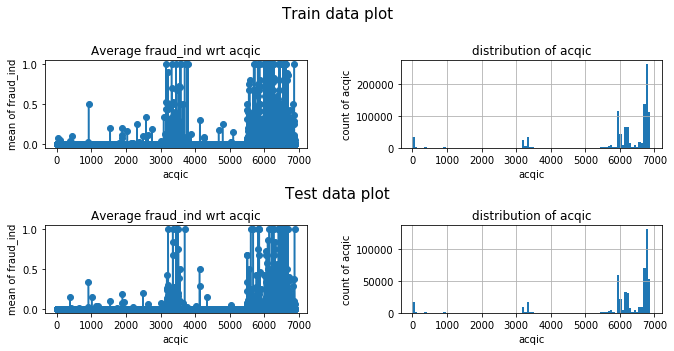

bacno


<Figure size 432x288 with 0 Axes>

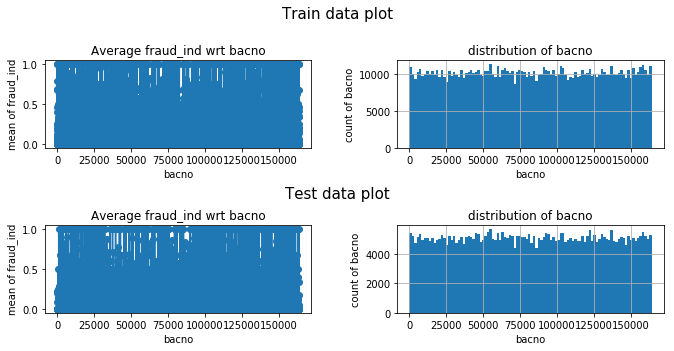

cano


<Figure size 432x288 with 0 Axes>

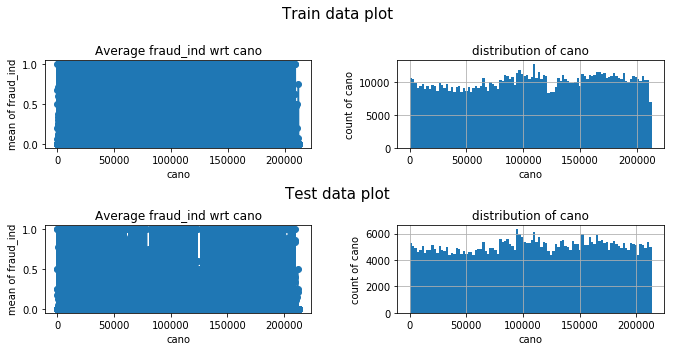

conam


<Figure size 432x288 with 0 Axes>

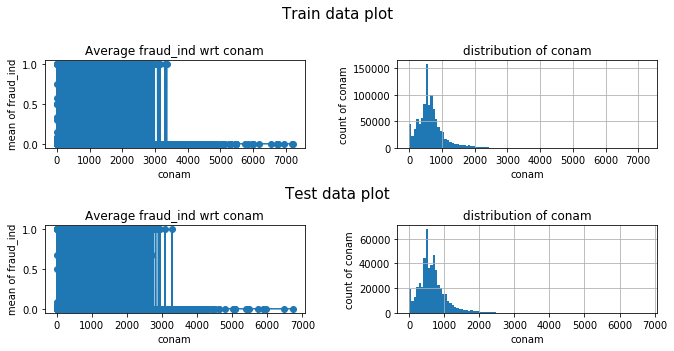

contp


<Figure size 432x288 with 0 Axes>

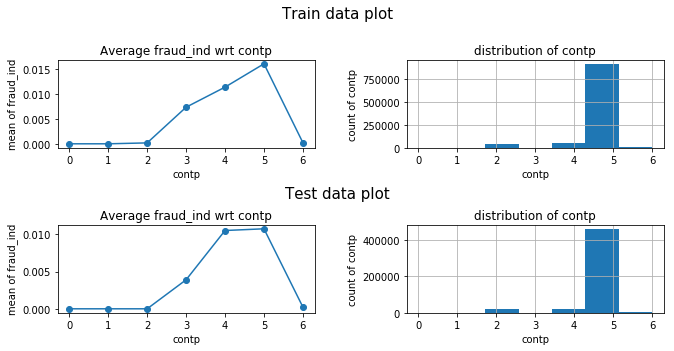

csmcu


<Figure size 432x288 with 0 Axes>

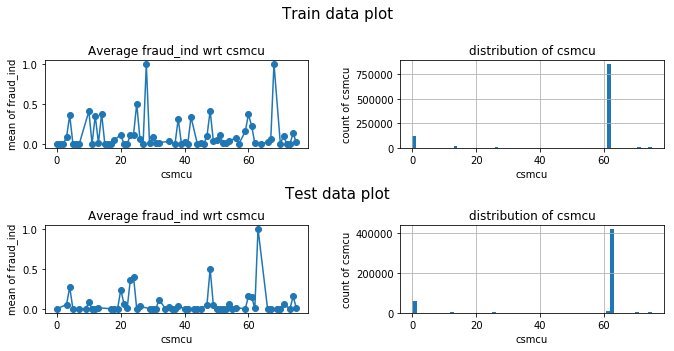

ecfg


<Figure size 432x288 with 0 Axes>

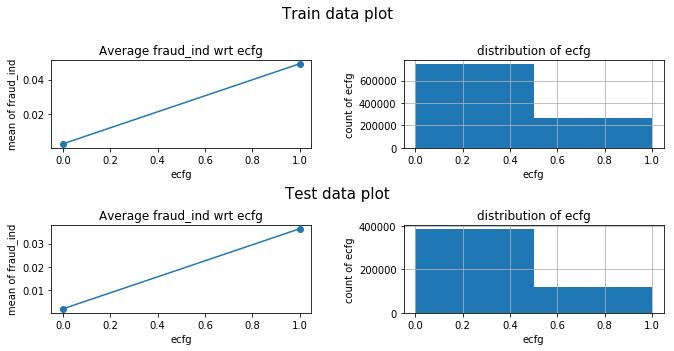

etymd


<Figure size 432x288 with 0 Axes>

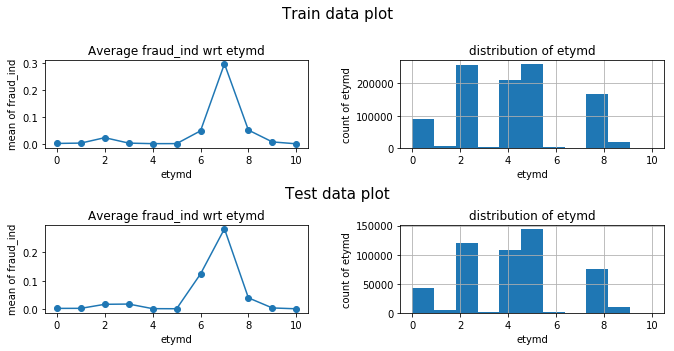

flbmk


<Figure size 432x288 with 0 Axes>

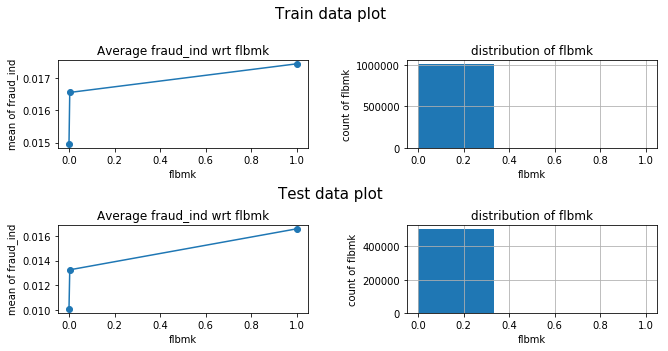

flg_3dsmk


<Figure size 432x288 with 0 Axes>

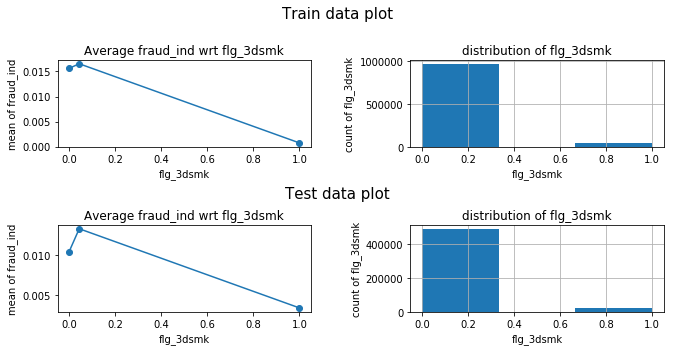

fraud_ind


<Figure size 432x288 with 0 Axes>

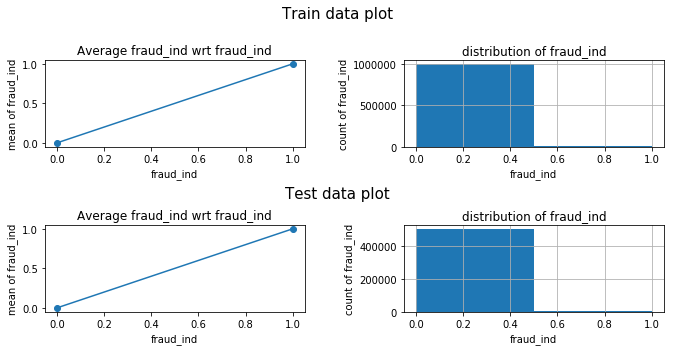

hcefg


<Figure size 432x288 with 0 Axes>

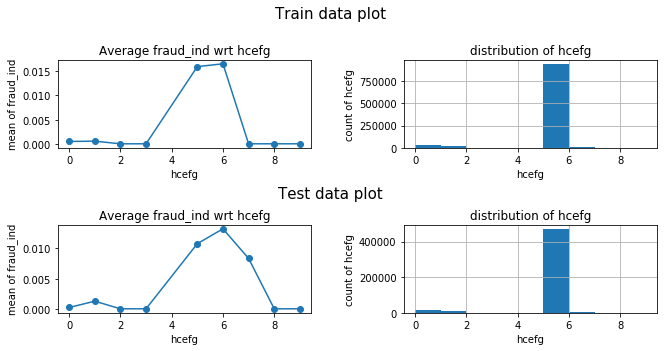

insfg


<Figure size 432x288 with 0 Axes>

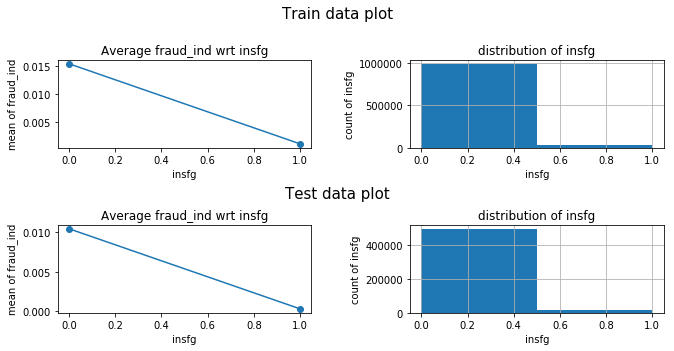

iterm


<Figure size 432x288 with 0 Axes>

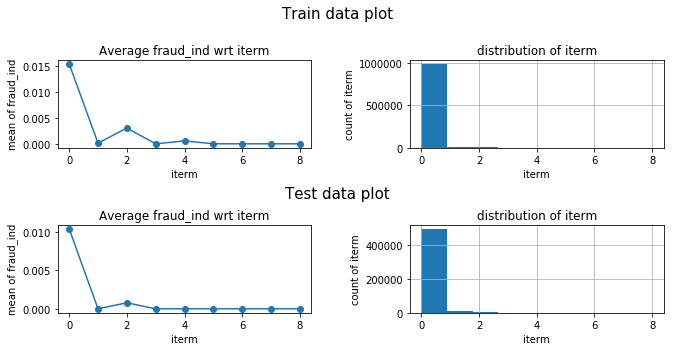

locdt


<Figure size 432x288 with 0 Axes>

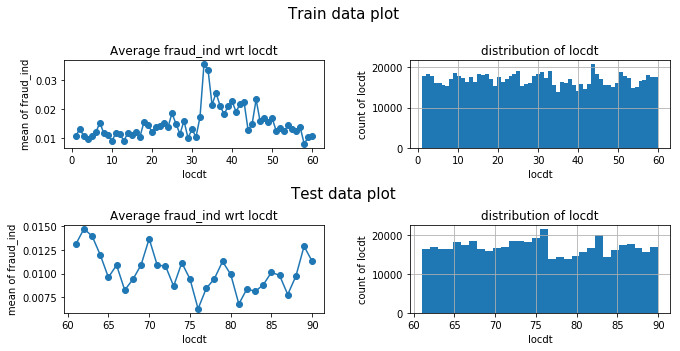

loctm


<Figure size 432x288 with 0 Axes>

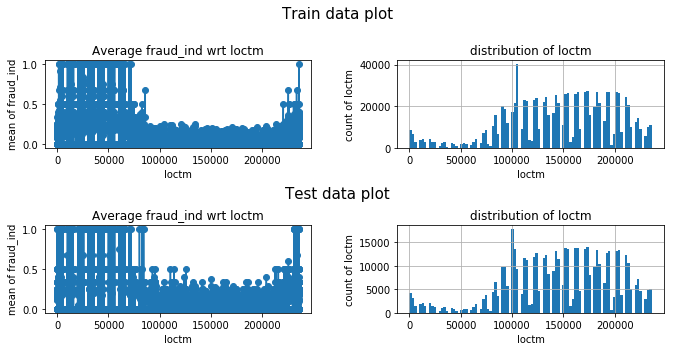

mcc


<Figure size 432x288 with 0 Axes>

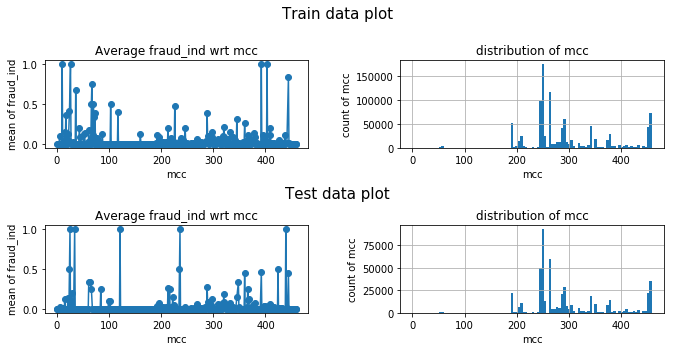

mchno


<Figure size 432x288 with 0 Axes>

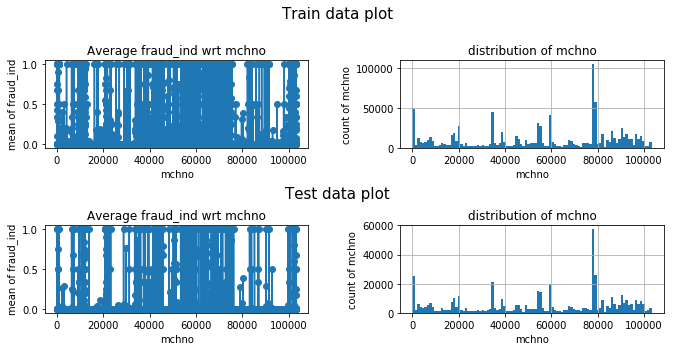

ovrlt


<Figure size 432x288 with 0 Axes>

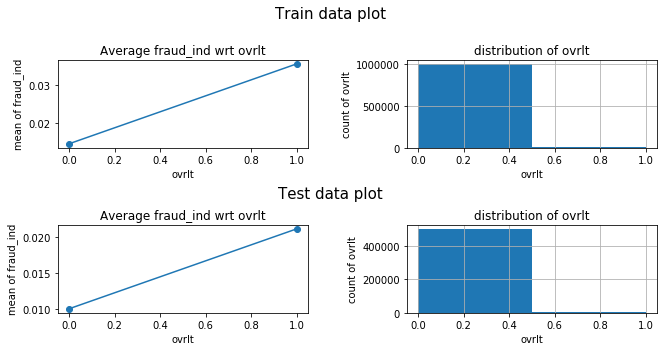

scity


<Figure size 432x288 with 0 Axes>

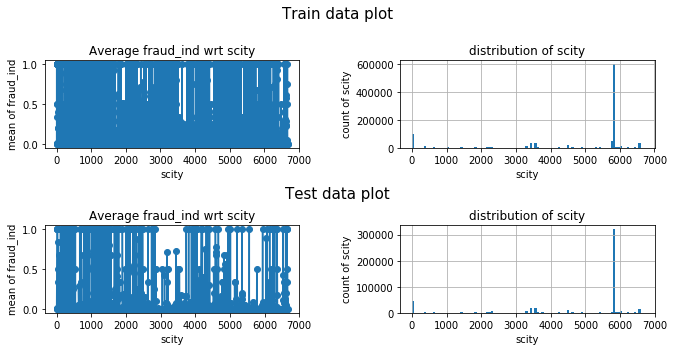

stocn


<Figure size 432x288 with 0 Axes>

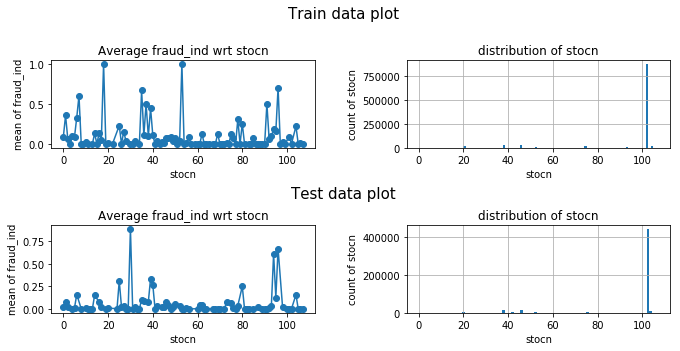

stscd


<Figure size 432x288 with 0 Axes>

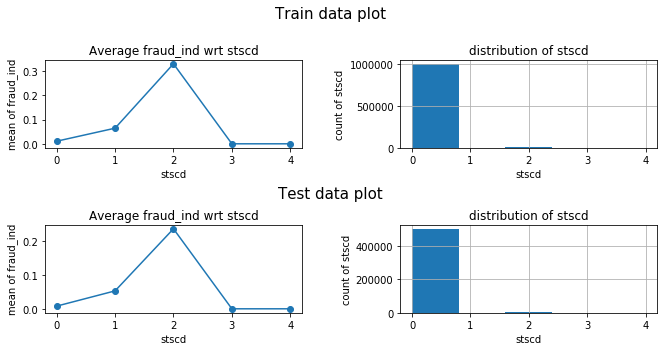

txkey


<Figure size 432x288 with 0 Axes>

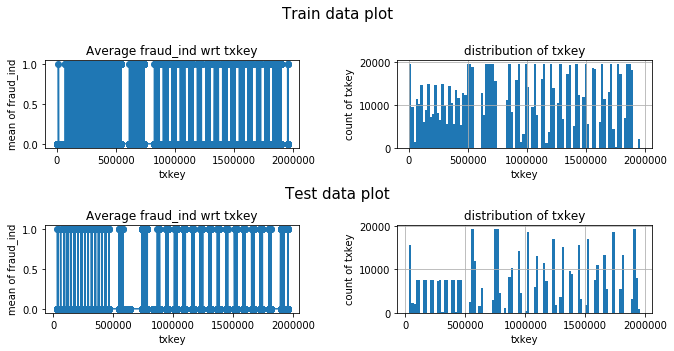

bacno_cano_nunique


<Figure size 432x288 with 0 Axes>

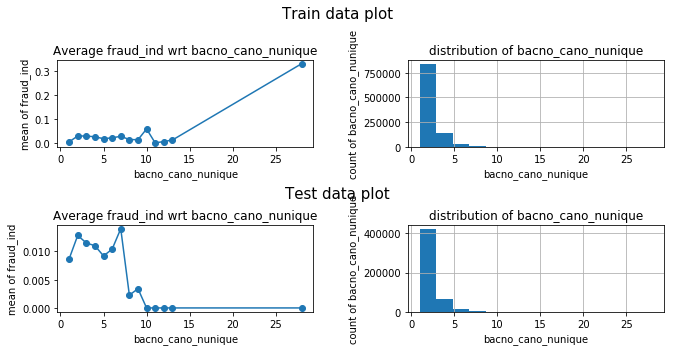

bacno_txkey_nunique


<Figure size 432x288 with 0 Axes>

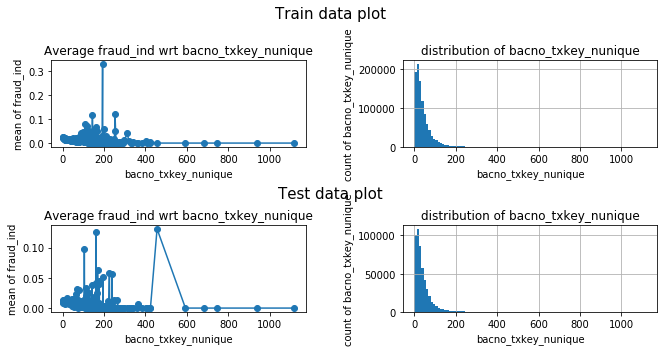

conam_log


<Figure size 432x288 with 0 Axes>

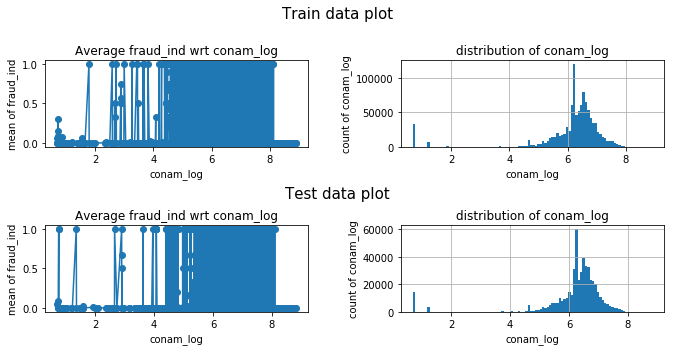

bacno_mean_conam


<Figure size 432x288 with 0 Axes>

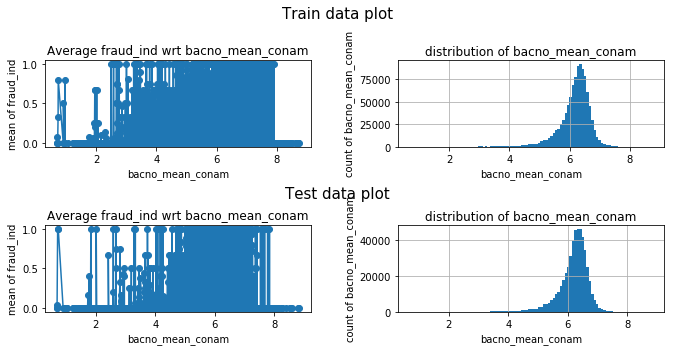

bacno_scale_conam


<Figure size 432x288 with 0 Axes>

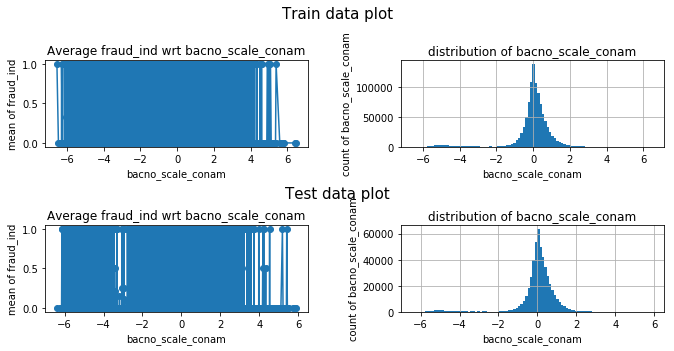

cano_mean_conam


<Figure size 432x288 with 0 Axes>

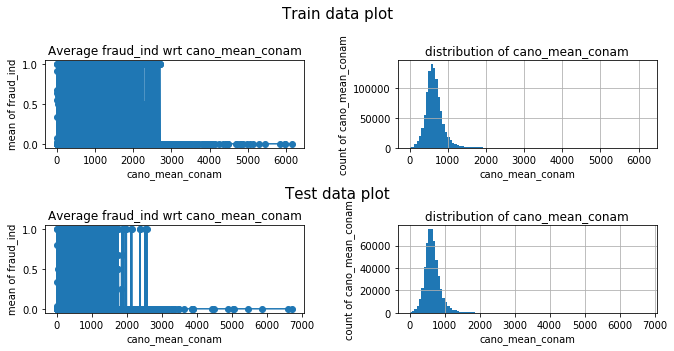

cano_scale_conam


<Figure size 432x288 with 0 Axes>

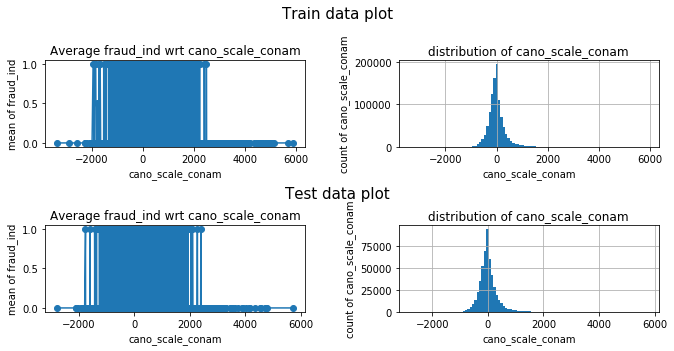

cano_conam_skew


<Figure size 432x288 with 0 Axes>

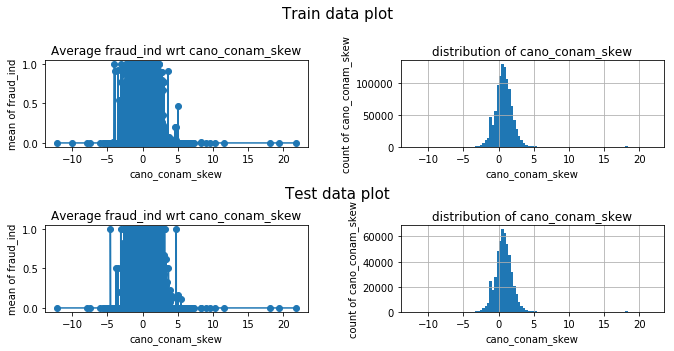

cano_conam_kurt


<Figure size 432x288 with 0 Axes>

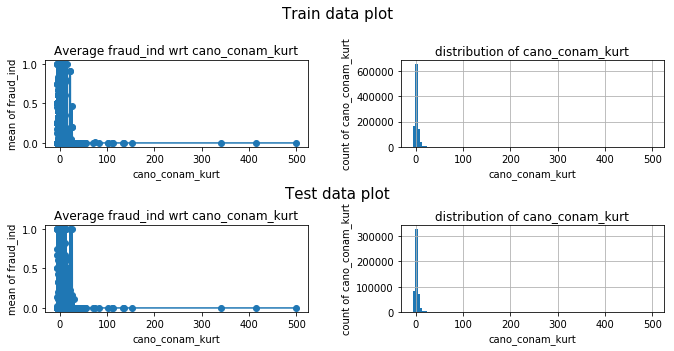

cano_conam_mean


<Figure size 432x288 with 0 Axes>

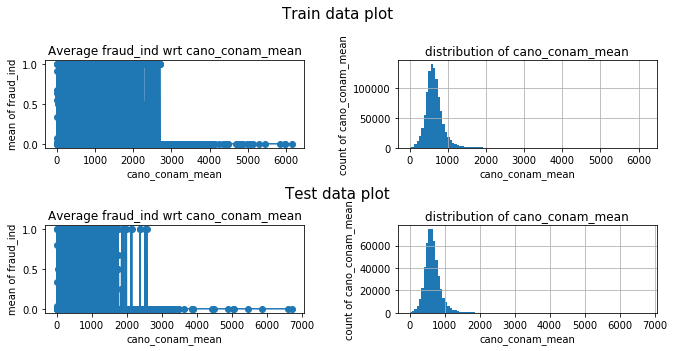

cano_conam_var


<Figure size 432x288 with 0 Axes>

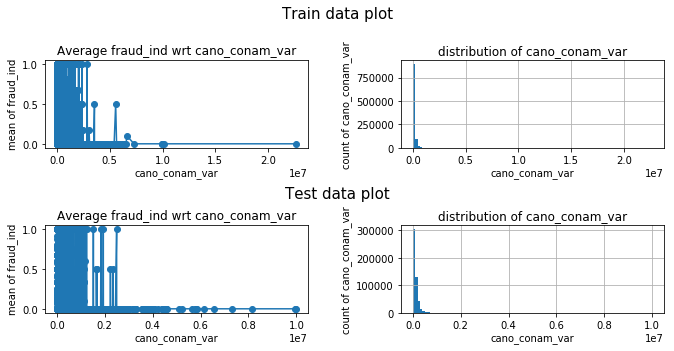

bacno_max_conam


<Figure size 432x288 with 0 Axes>

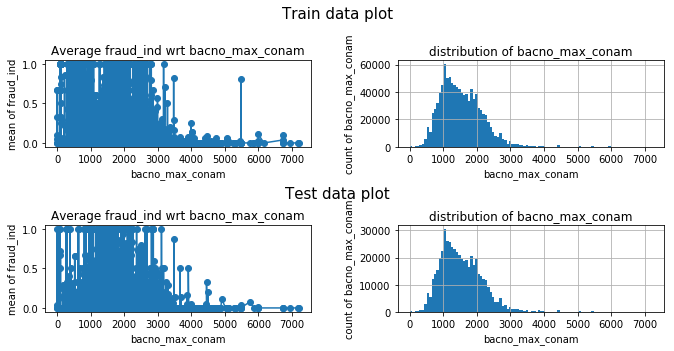

bacno_ismax_conam


<Figure size 432x288 with 0 Axes>

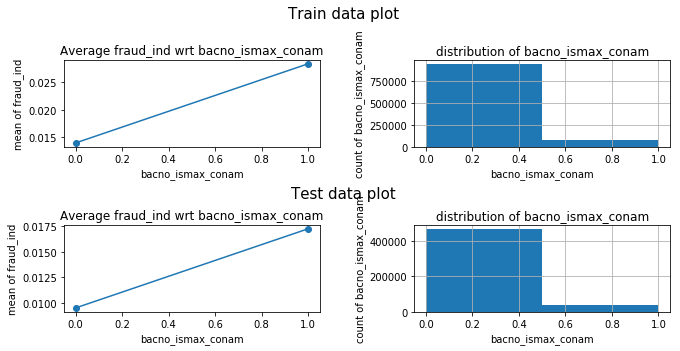

bacno_min_conam


<Figure size 432x288 with 0 Axes>

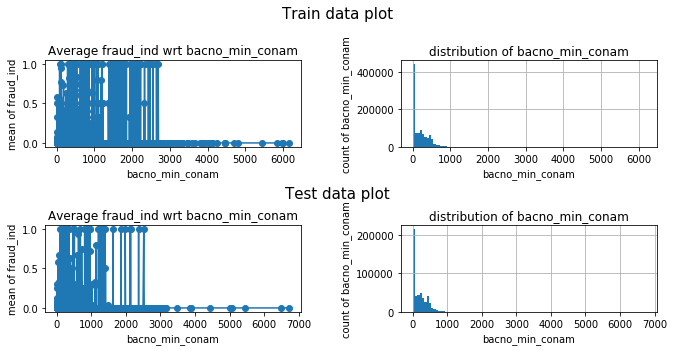

bacno_ismin_conam


<Figure size 432x288 with 0 Axes>

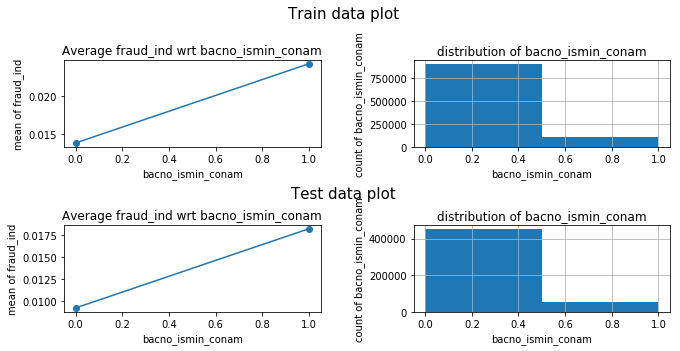

bacno_ratio_ecfg


<Figure size 432x288 with 0 Axes>

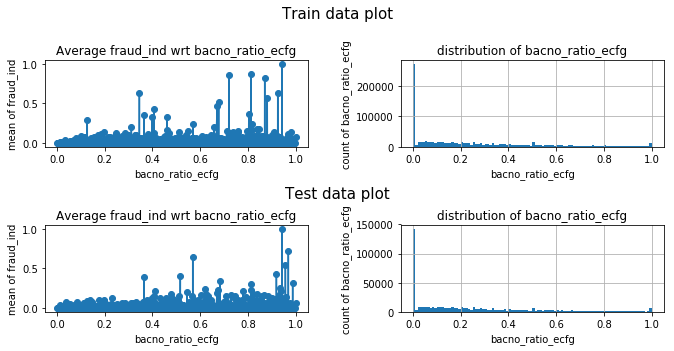

cano_ratio_ecfg


<Figure size 432x288 with 0 Axes>

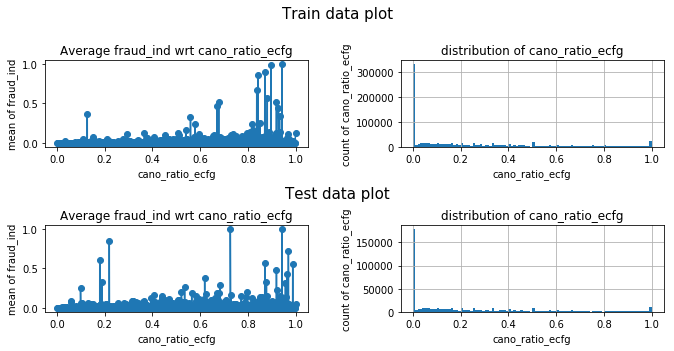

locdt_week


<Figure size 432x288 with 0 Axes>

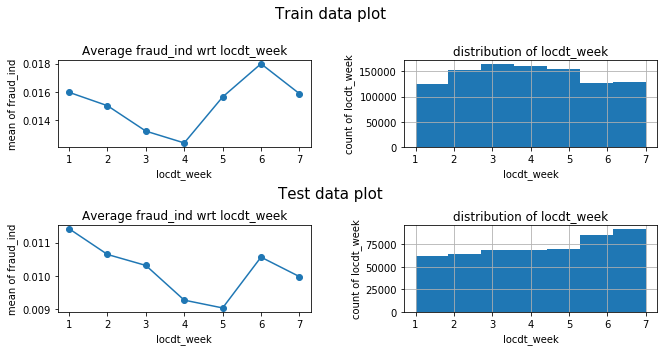

loctm_hr


<Figure size 432x288 with 0 Axes>

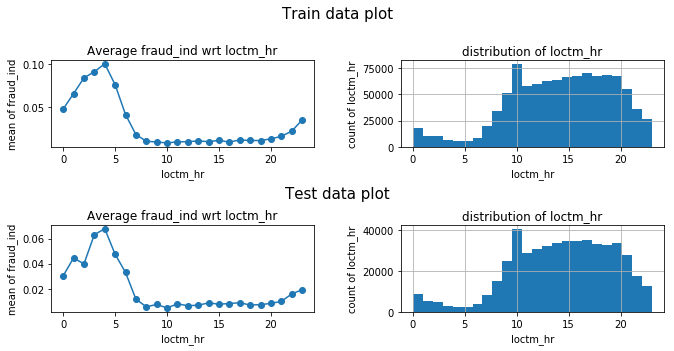

bacno_locdt_skew


<Figure size 432x288 with 0 Axes>

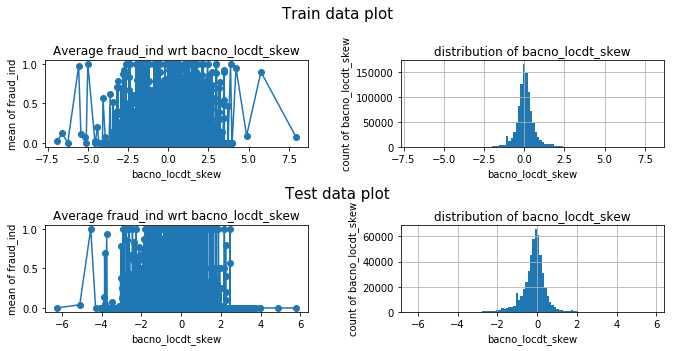

bacno_locdt_kurt


<Figure size 432x288 with 0 Axes>

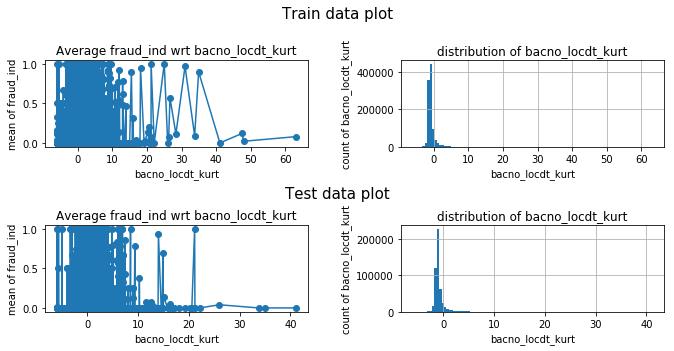

cano_locdt_skew


<Figure size 432x288 with 0 Axes>

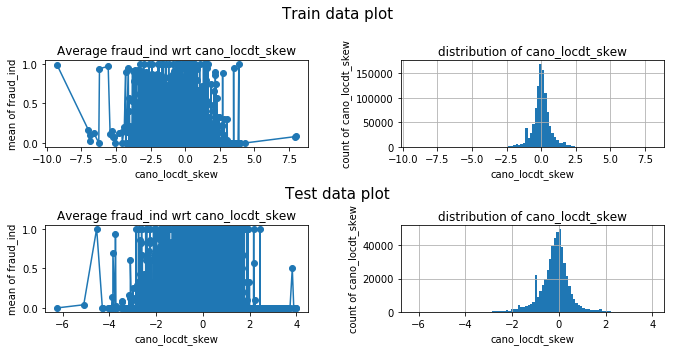

cano_locdt_kurt


<Figure size 432x288 with 0 Axes>

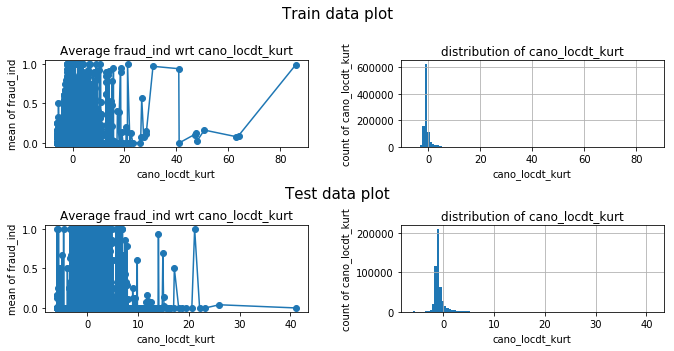

bacno_stocn_mode


<Figure size 432x288 with 0 Axes>

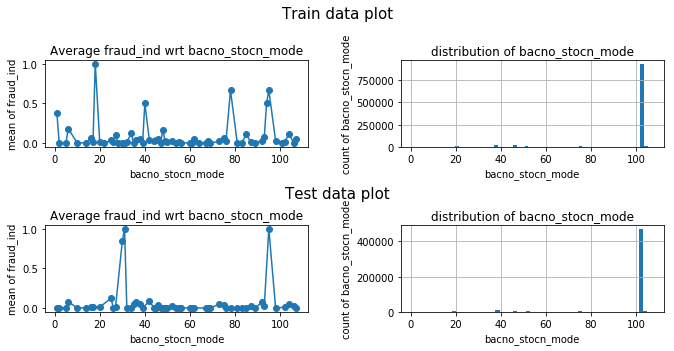

bacno_scity_mode


<Figure size 432x288 with 0 Axes>

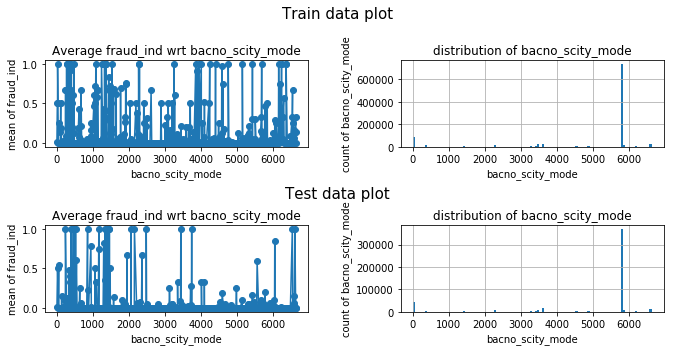

bacno_csmcu_mode


<Figure size 432x288 with 0 Axes>

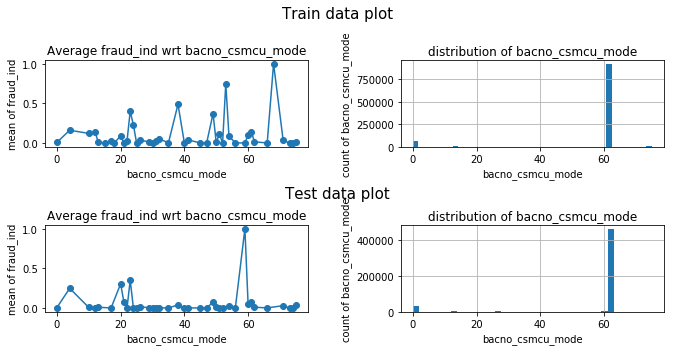

bacno_stocn_ismode


<Figure size 432x288 with 0 Axes>

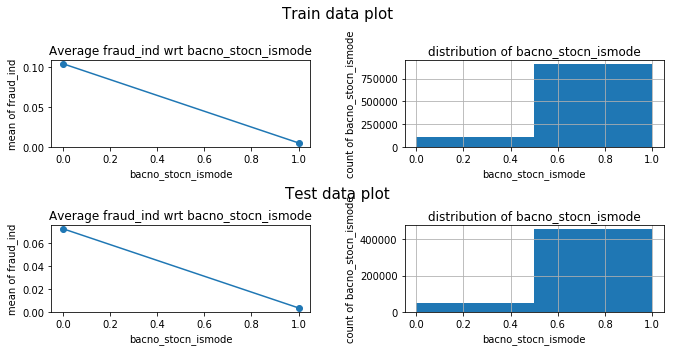

bacno_scity_ismode


<Figure size 432x288 with 0 Axes>

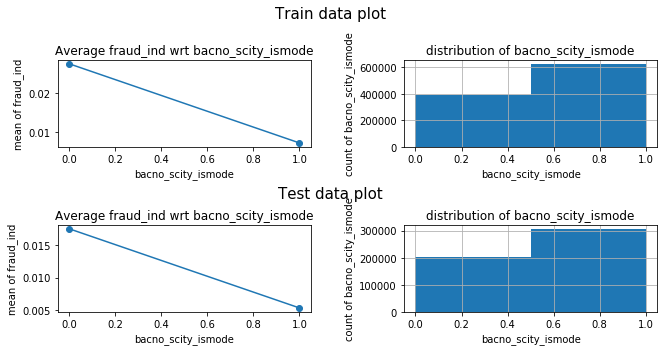

bacno_csmcu_ismode


<Figure size 432x288 with 0 Axes>

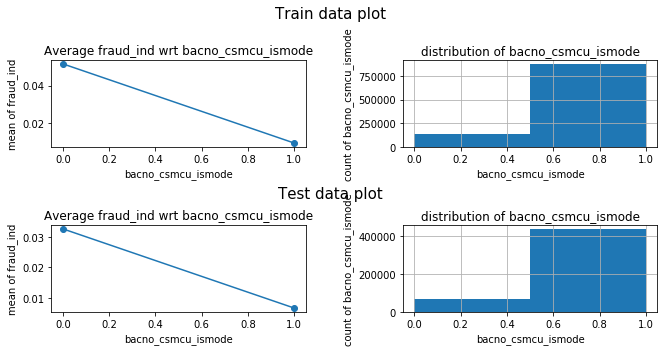

cano_stocn_mode


<Figure size 432x288 with 0 Axes>

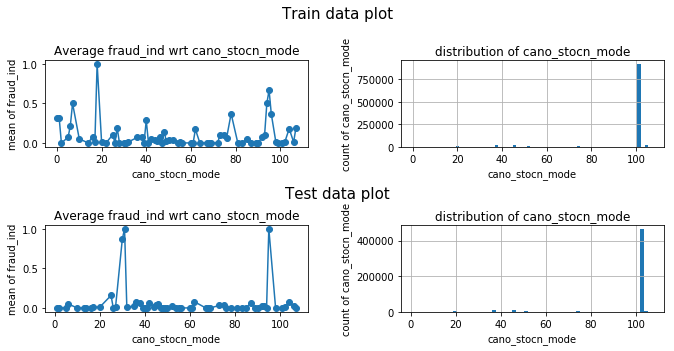

cano_scity_mode


<Figure size 432x288 with 0 Axes>

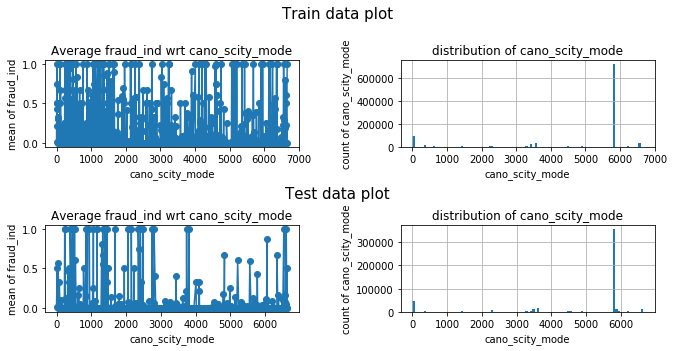

cano_csmcu_mode


<Figure size 432x288 with 0 Axes>

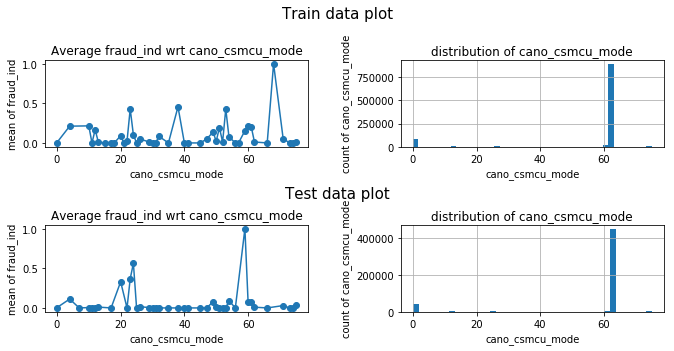

cano_stocn_ismode


<Figure size 432x288 with 0 Axes>

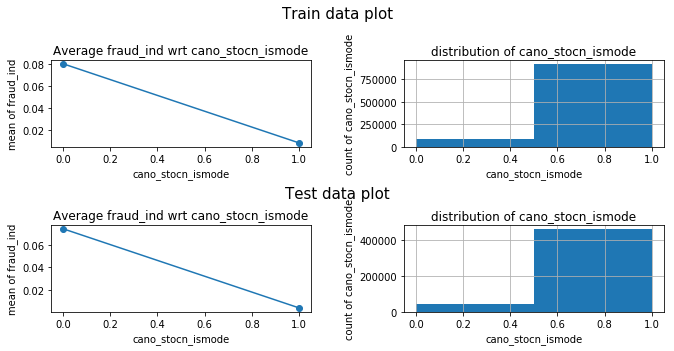

cano_scity_ismode


<Figure size 432x288 with 0 Axes>

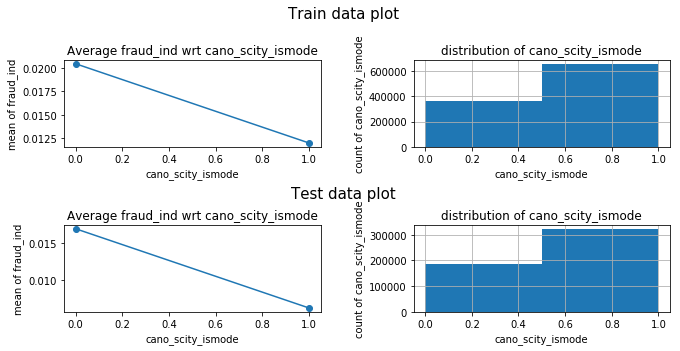

cano_csmcu_ismode


<Figure size 432x288 with 0 Axes>

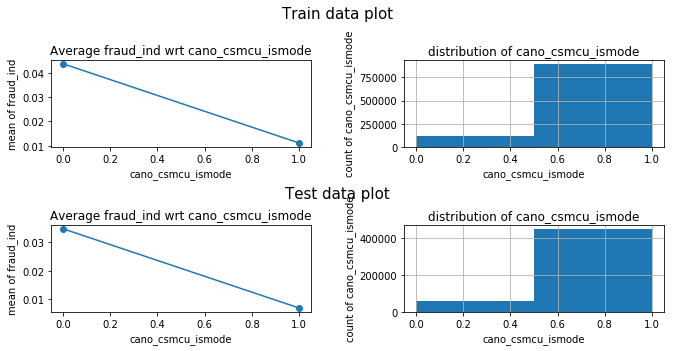

mchno_fraud_mean


<Figure size 432x288 with 0 Axes>

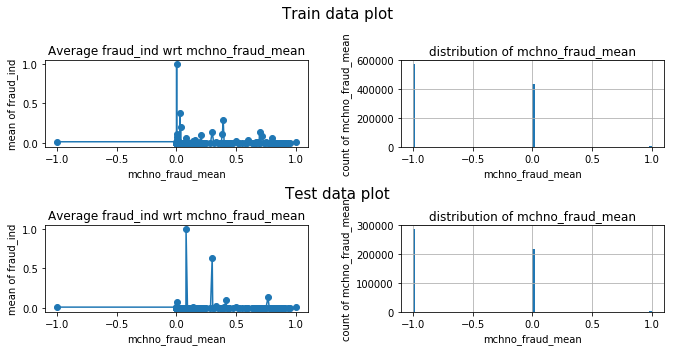

mcc_fraud_mean


<Figure size 432x288 with 0 Axes>

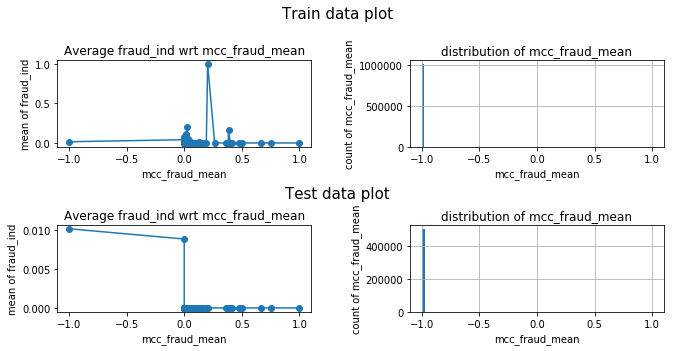

acqic_fraud_mean


<Figure size 432x288 with 0 Axes>

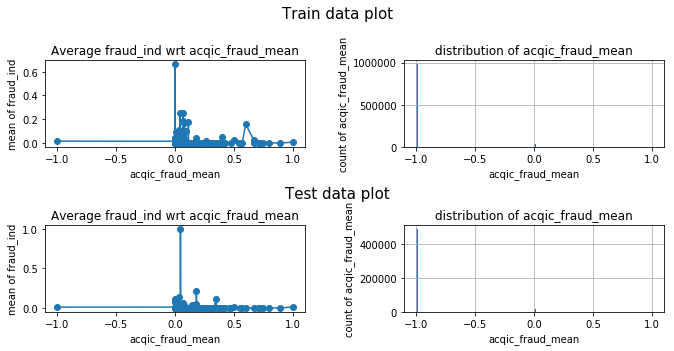

mchno_bacno_nunique


<Figure size 432x288 with 0 Axes>

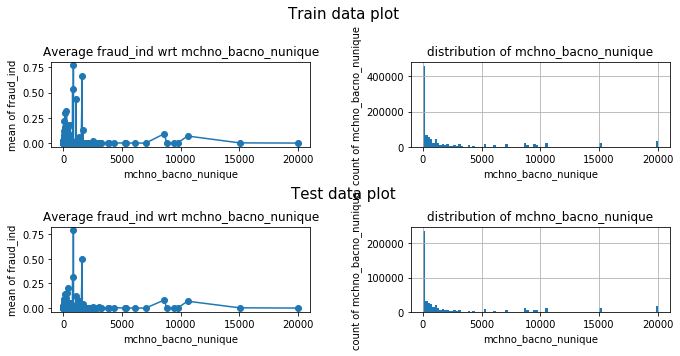

acqic_bacno_nunique


<Figure size 432x288 with 0 Axes>

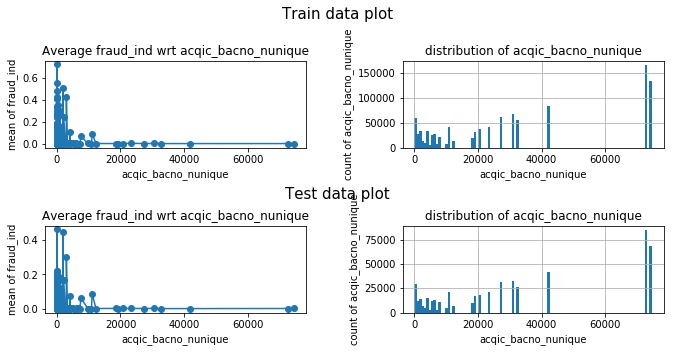

mcc_bacno_nunique


<Figure size 432x288 with 0 Axes>

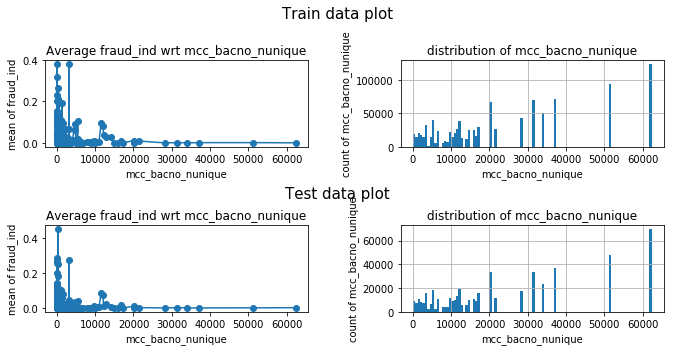

stocn_bacno_nunique


<Figure size 432x288 with 0 Axes>

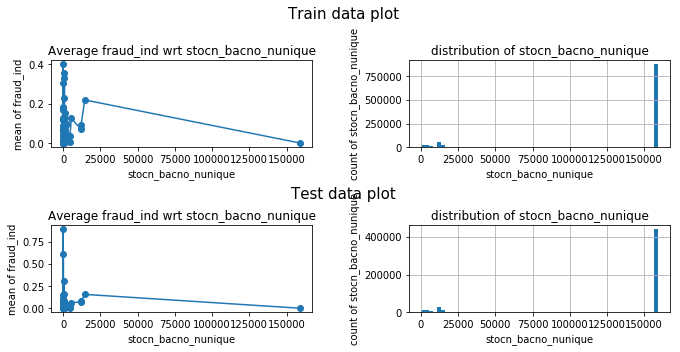

scity_bacno_nunique


<Figure size 432x288 with 0 Axes>

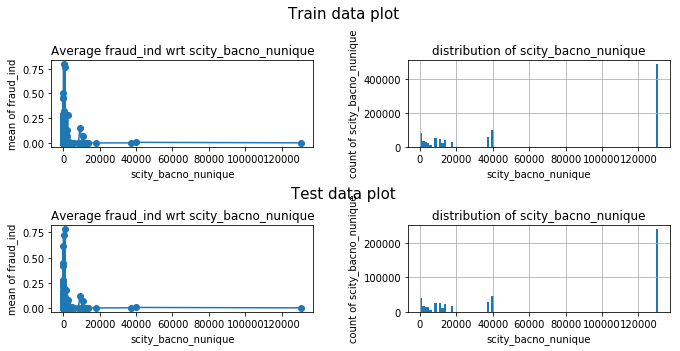

csmcu_bacno_nunique


<Figure size 432x288 with 0 Axes>

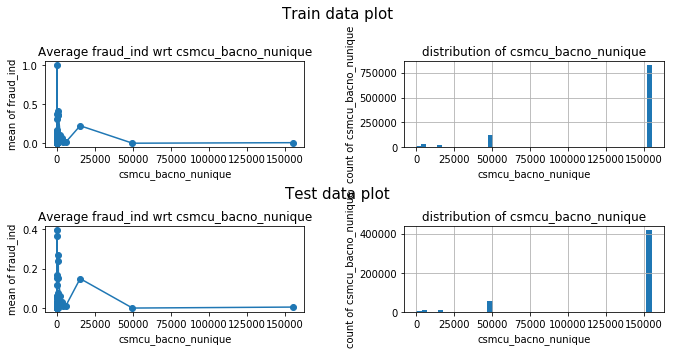

mchno_cano_nunique


<Figure size 432x288 with 0 Axes>

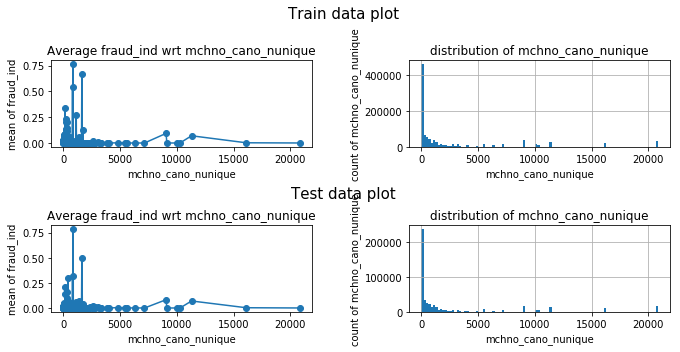

acqic_cano_nunique


<Figure size 432x288 with 0 Axes>

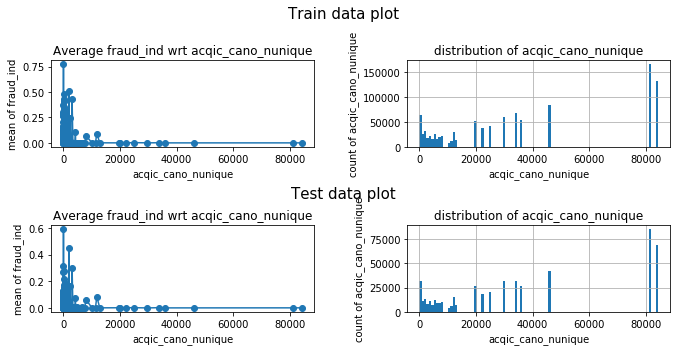

mcc_cano_nunique


<Figure size 432x288 with 0 Axes>

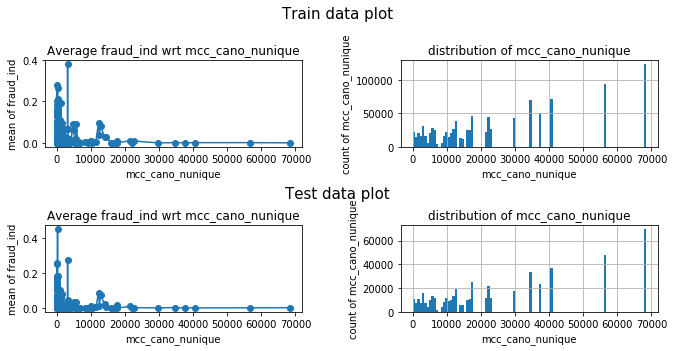

stocn_cano_nunique


<Figure size 432x288 with 0 Axes>

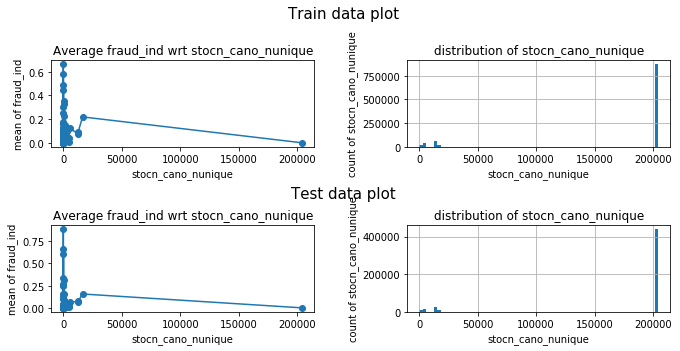

scity_cano_nunique


<Figure size 432x288 with 0 Axes>

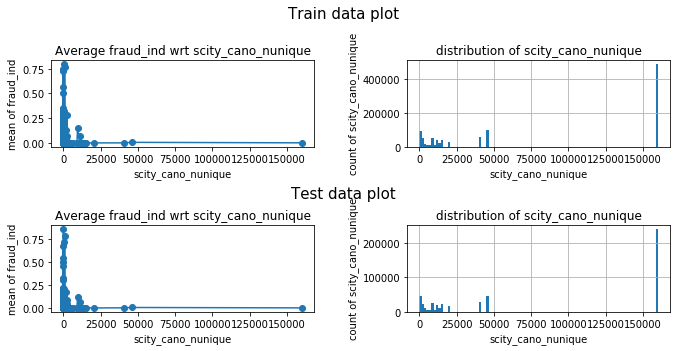

csmcu_cano_nunique


<Figure size 432x288 with 0 Axes>

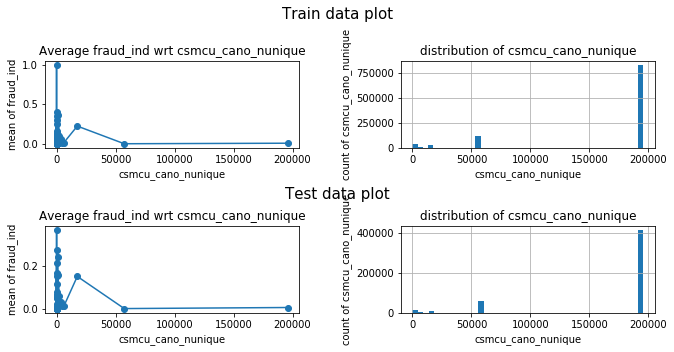

mchno_value_counts_all


<Figure size 432x288 with 0 Axes>

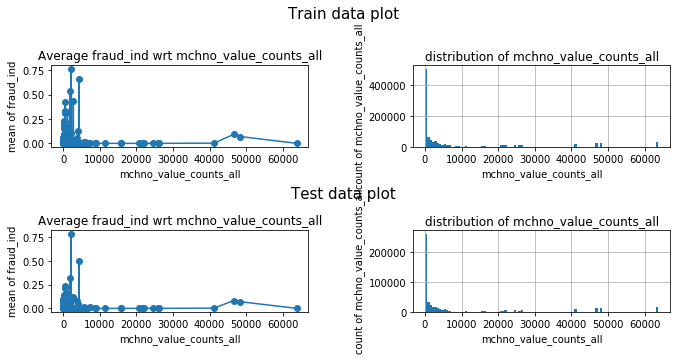

acqic_value_counts_all


<Figure size 432x288 with 0 Axes>

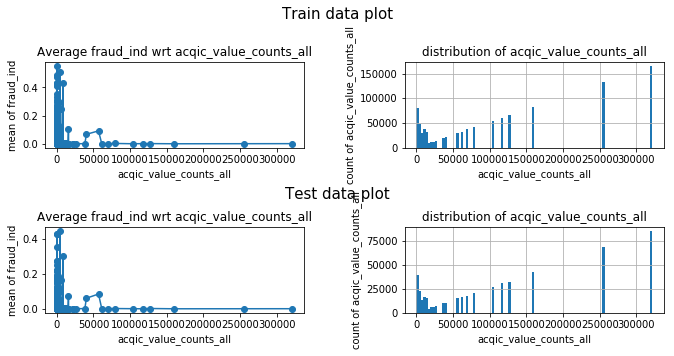

mcc_value_counts_all


<Figure size 432x288 with 0 Axes>

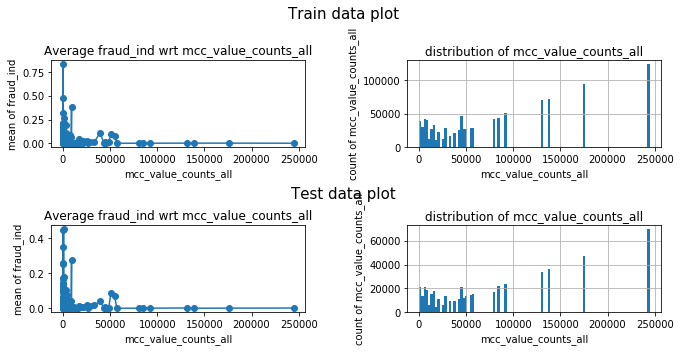

stocn_value_counts_all


<Figure size 432x288 with 0 Axes>

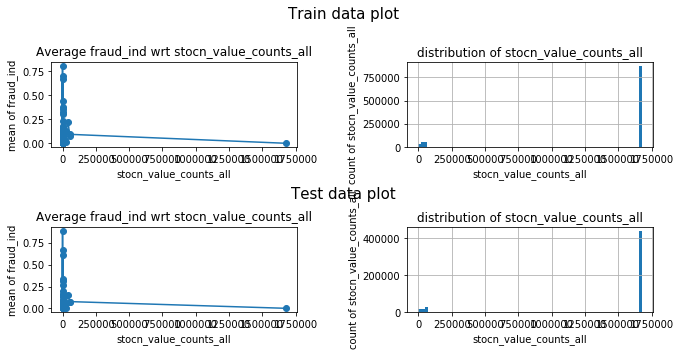

scity_value_counts_all


<Figure size 432x288 with 0 Axes>

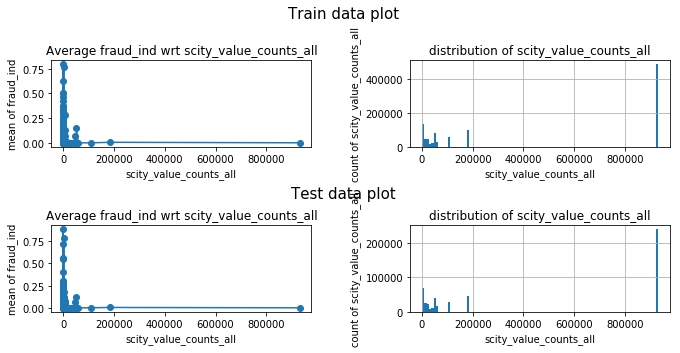

csmcu_value_counts_all


<Figure size 432x288 with 0 Axes>

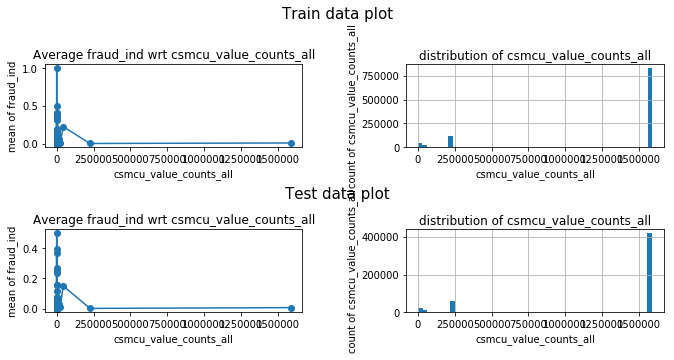

bacno_stocn_nunique


<Figure size 432x288 with 0 Axes>

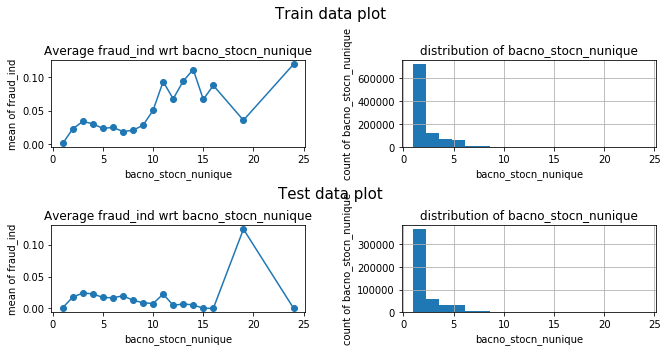

stocn_value_counts


<Figure size 432x288 with 0 Axes>

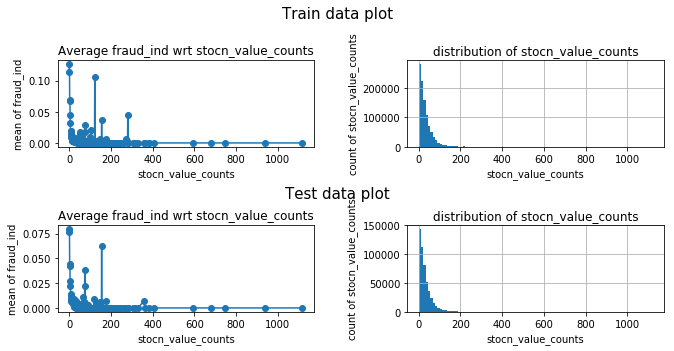

stocn_ratio


<Figure size 432x288 with 0 Axes>

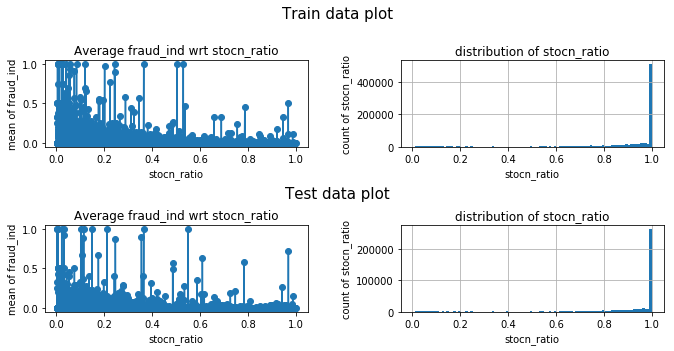

bacno_csmcu_nunique


<Figure size 432x288 with 0 Axes>

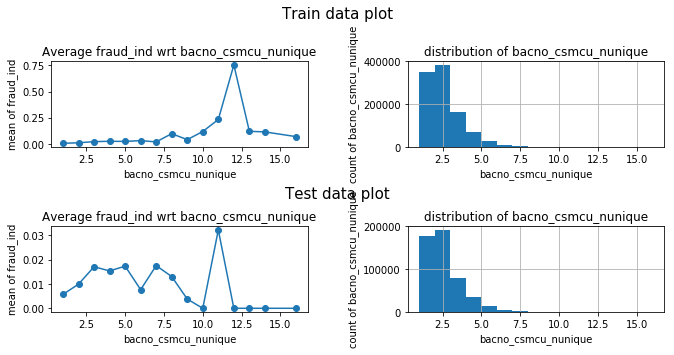

csmcu_value_counts


<Figure size 432x288 with 0 Axes>

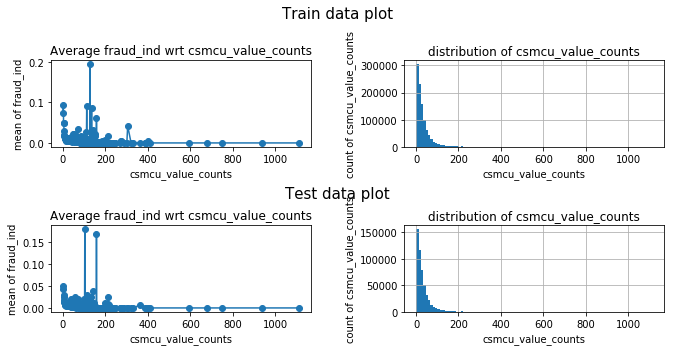

csmcu_ratio


<Figure size 432x288 with 0 Axes>

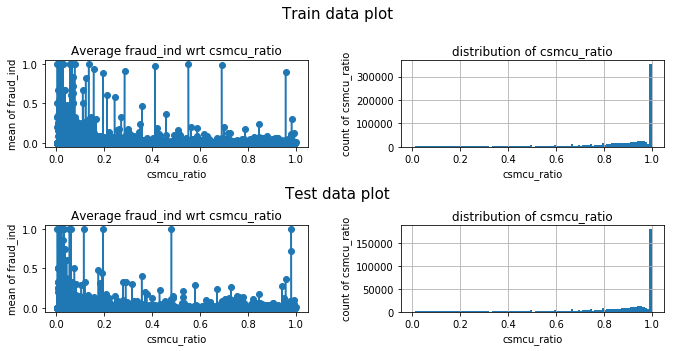

bacno_mchno_nunique


<Figure size 432x288 with 0 Axes>

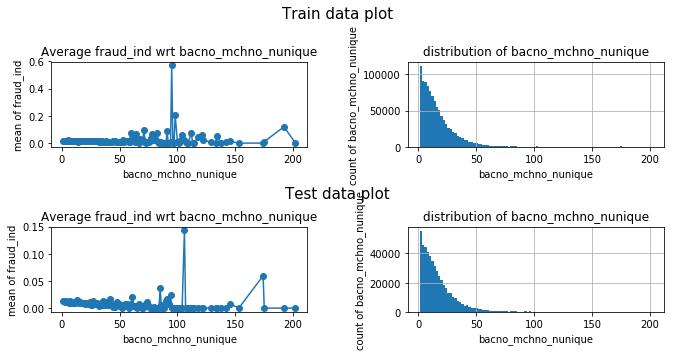

mchno_value_counts


<Figure size 432x288 with 0 Axes>

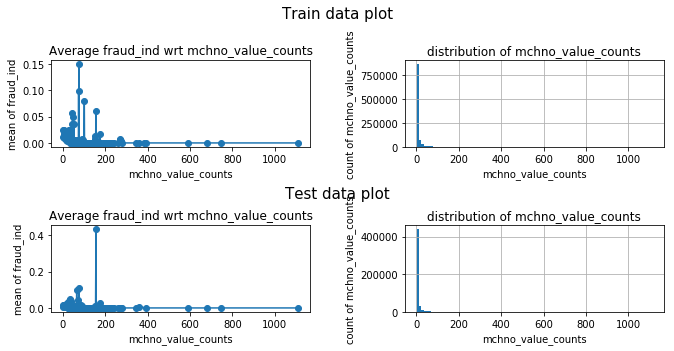

mchno_ratio


<Figure size 432x288 with 0 Axes>

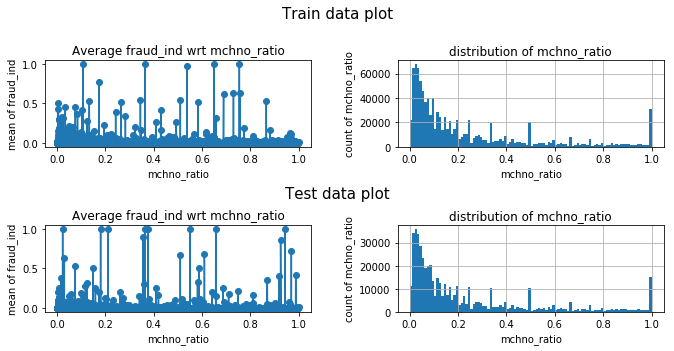

bacno_acqic_nunique


<Figure size 432x288 with 0 Axes>

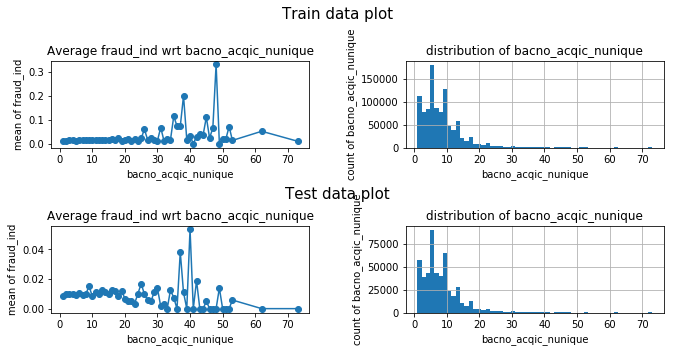

acqic_value_counts


<Figure size 432x288 with 0 Axes>

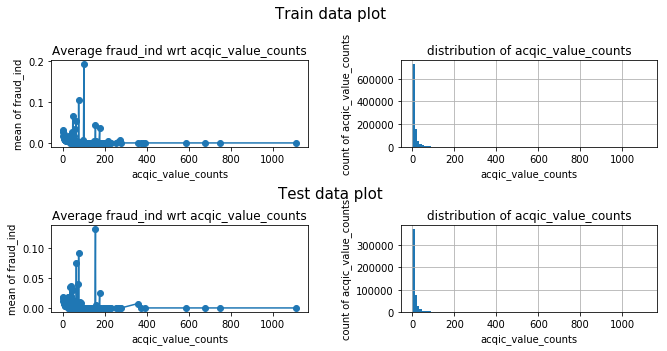

acqic_ratio


<Figure size 432x288 with 0 Axes>

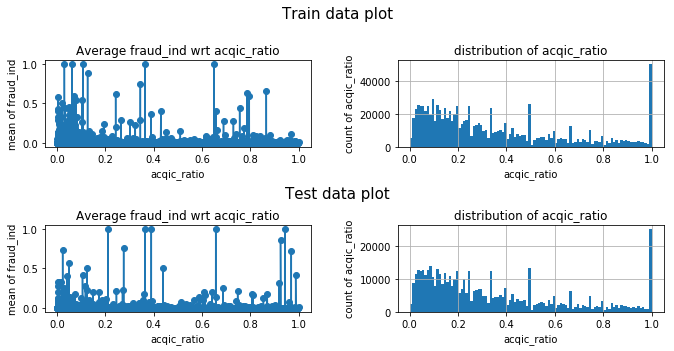

bacno_mcc_nunique


<Figure size 432x288 with 0 Axes>

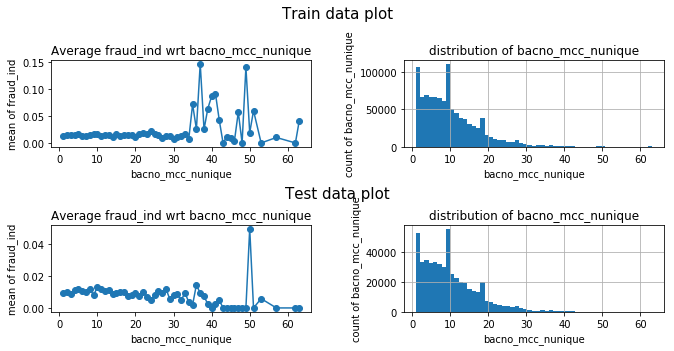

mcc_value_counts


<Figure size 432x288 with 0 Axes>

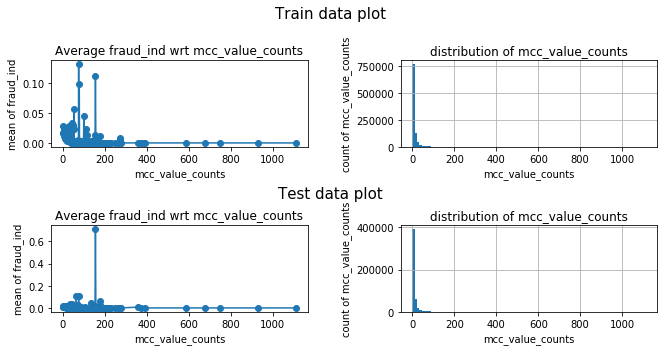

mcc_ratio


<Figure size 432x288 with 0 Axes>

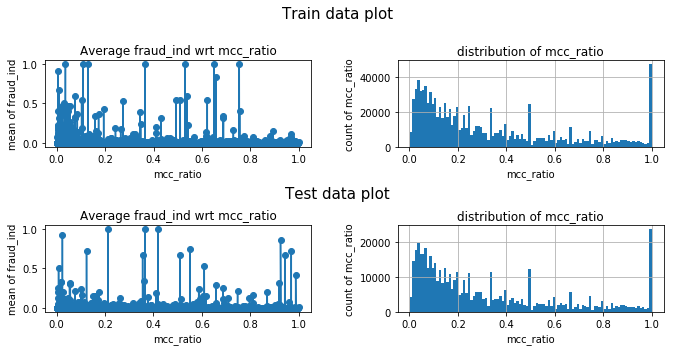

bacno_scity_nunique


<Figure size 432x288 with 0 Axes>

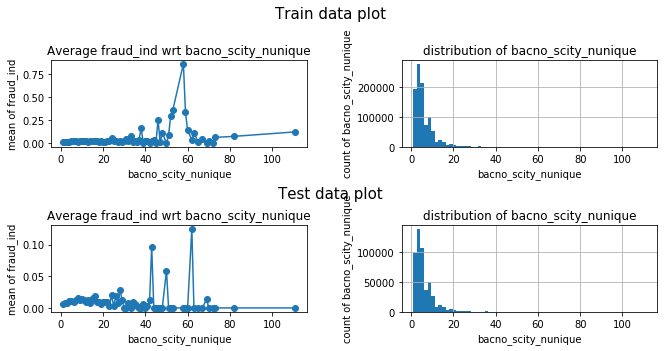

scity_value_counts


<Figure size 432x288 with 0 Axes>

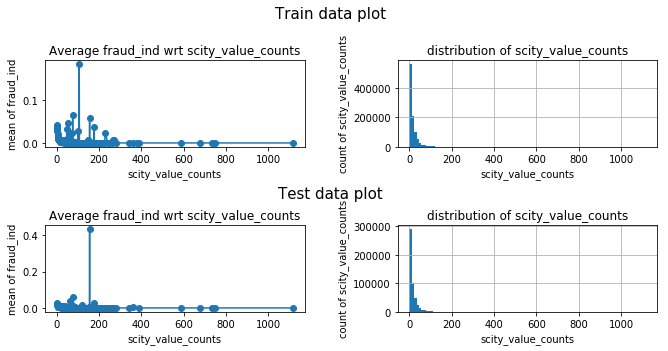

scity_ratio


<Figure size 432x288 with 0 Axes>

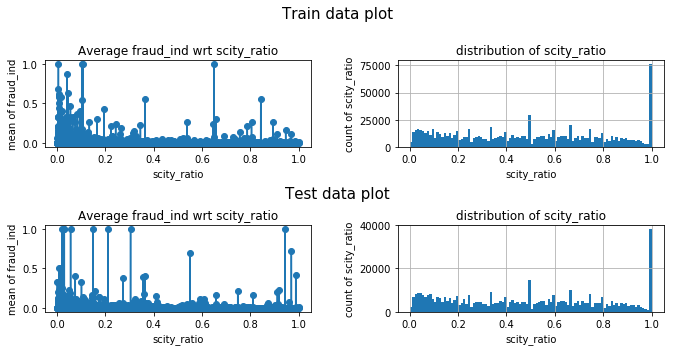

bacno_contp_nunique


<Figure size 432x288 with 0 Axes>

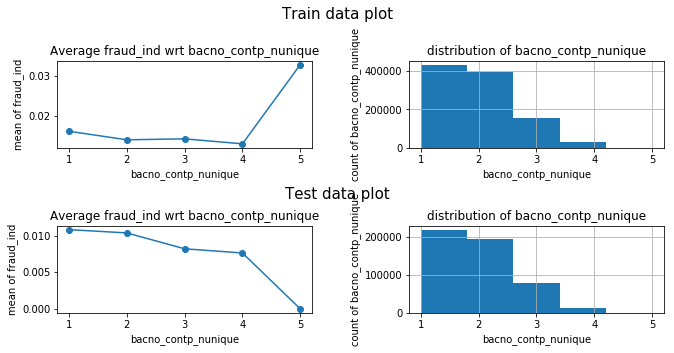

contp_value_counts


<Figure size 432x288 with 0 Axes>

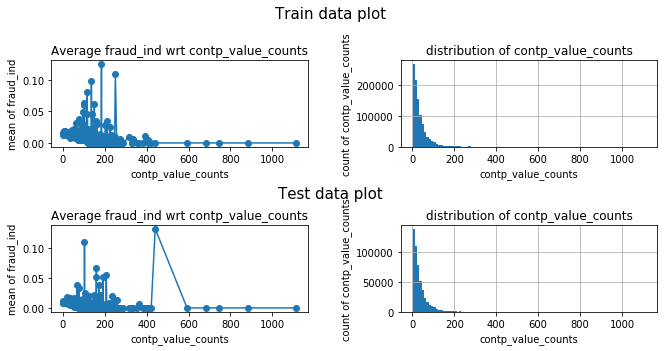

contp_ratio


<Figure size 432x288 with 0 Axes>

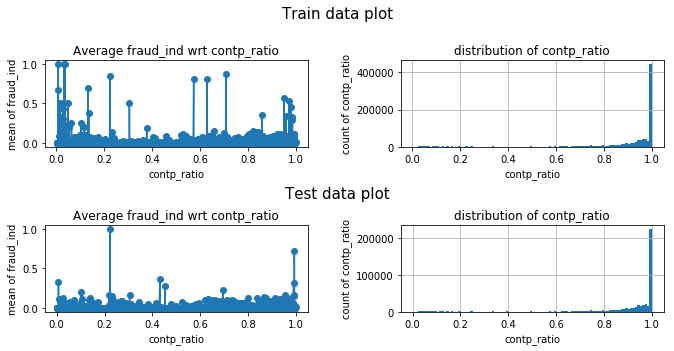

bacno_etymd_nunique


<Figure size 432x288 with 0 Axes>

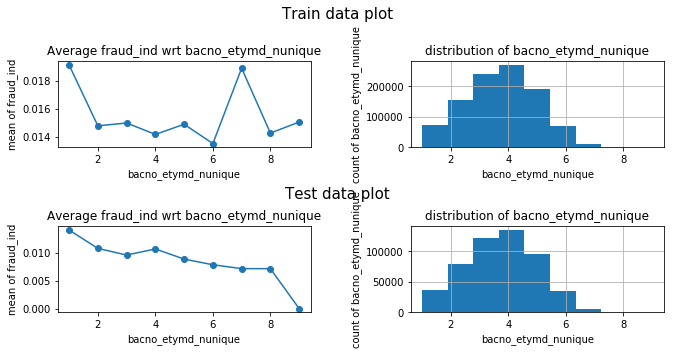

etymd_value_counts


<Figure size 432x288 with 0 Axes>

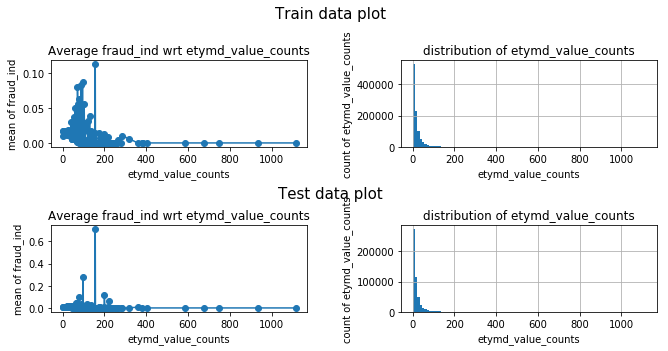

etymd_ratio


<Figure size 432x288 with 0 Axes>

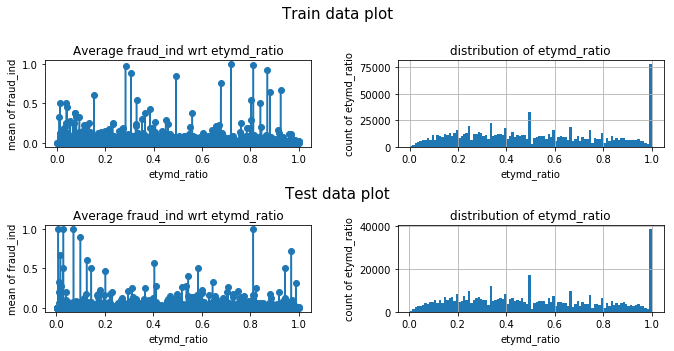

bacno_stscd_nunique


<Figure size 432x288 with 0 Axes>

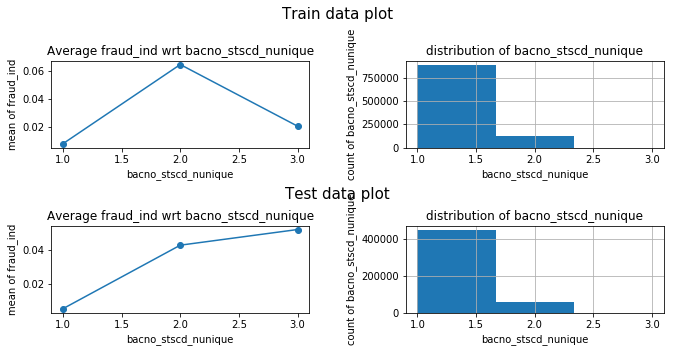

stscd_value_counts


<Figure size 432x288 with 0 Axes>

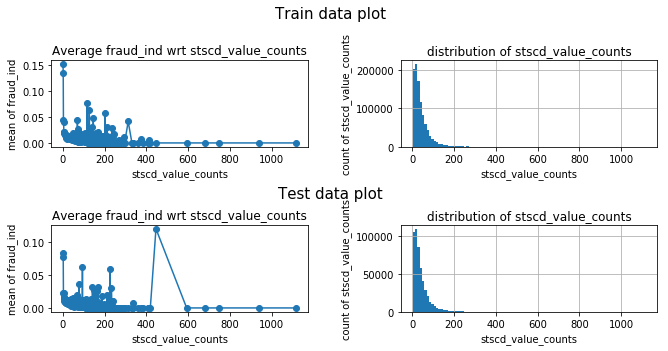

stscd_ratio


<Figure size 432x288 with 0 Axes>

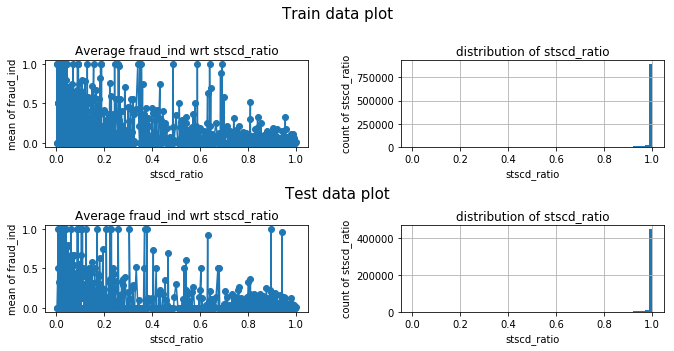

bacno_hcefg_nunique


<Figure size 432x288 with 0 Axes>

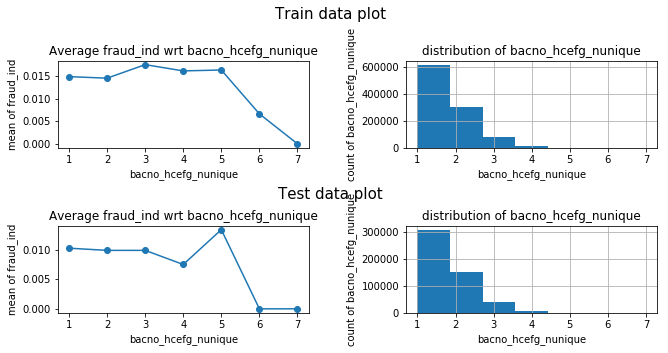

hcefg_value_counts


<Figure size 432x288 with 0 Axes>

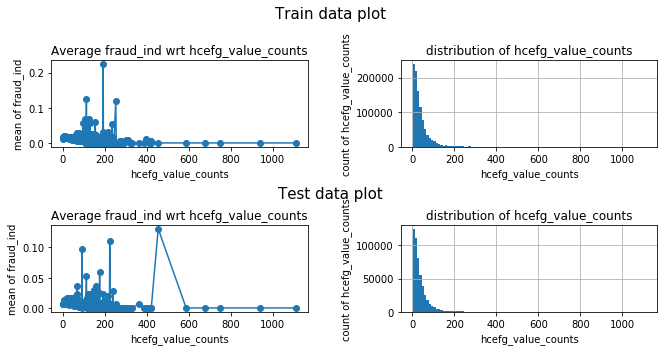

hcefg_ratio


<Figure size 432x288 with 0 Axes>

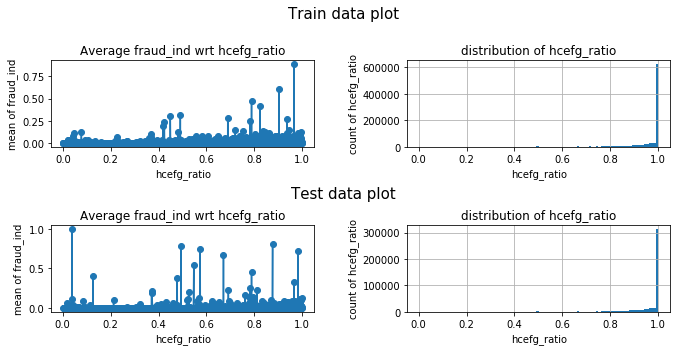

cano_txkey_nunique


<Figure size 432x288 with 0 Axes>

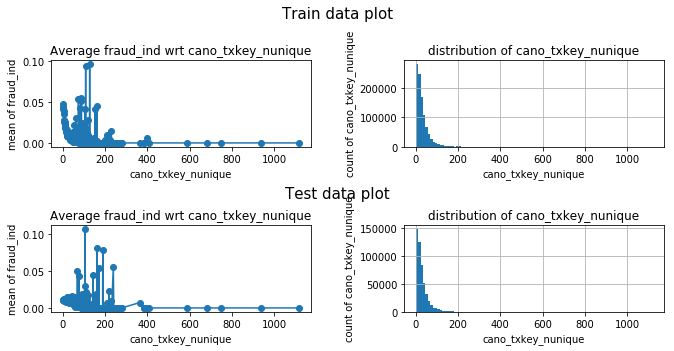

cano_stocn_nunique


<Figure size 432x288 with 0 Axes>

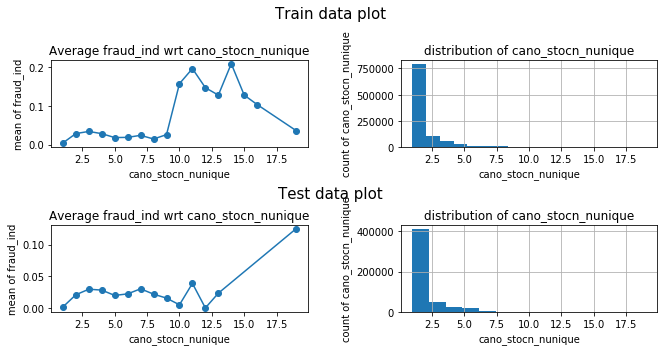

stocn_value_counts_cano


<Figure size 432x288 with 0 Axes>

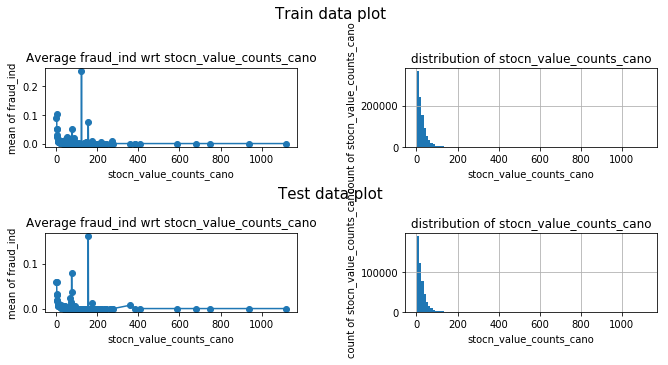

stocn_ratio_cano


<Figure size 432x288 with 0 Axes>

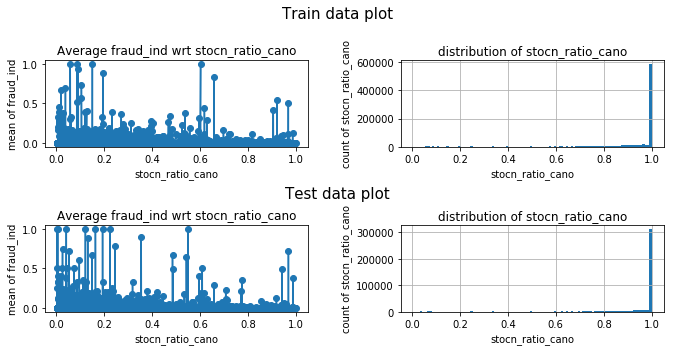

cano_csmcu_nunique


<Figure size 432x288 with 0 Axes>

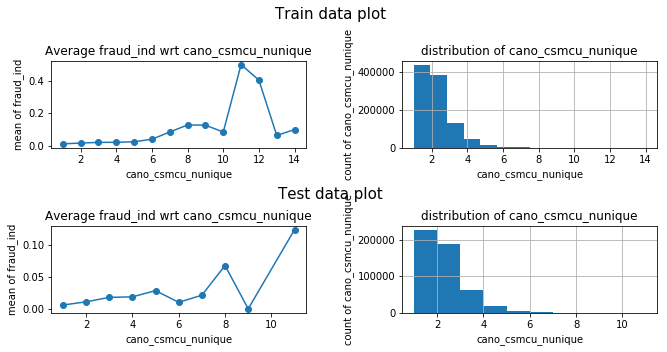

csmcu_value_counts_cano


<Figure size 432x288 with 0 Axes>

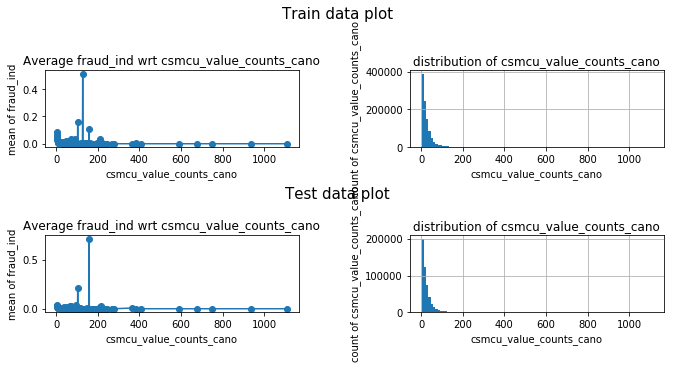

csmcu_ratio_cano


<Figure size 432x288 with 0 Axes>

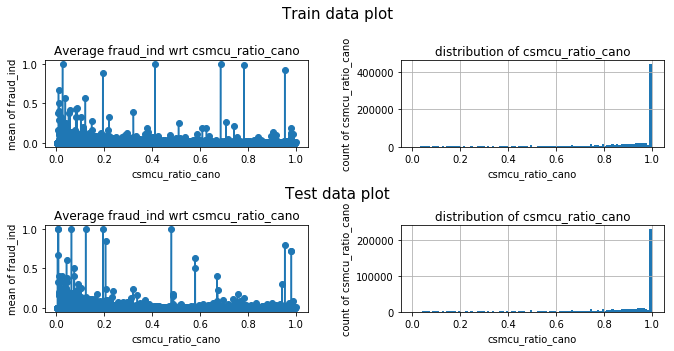

cano_mchno_nunique


<Figure size 432x288 with 0 Axes>

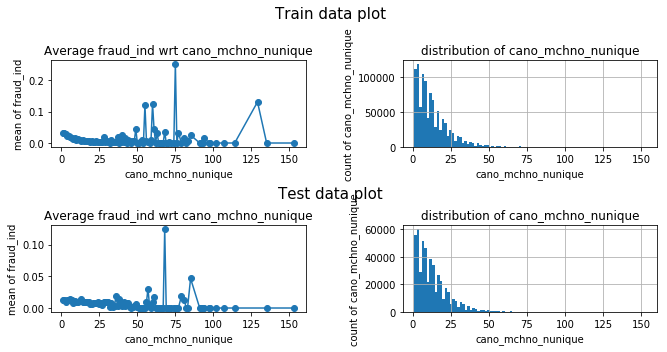

mchno_value_counts_cano


<Figure size 432x288 with 0 Axes>

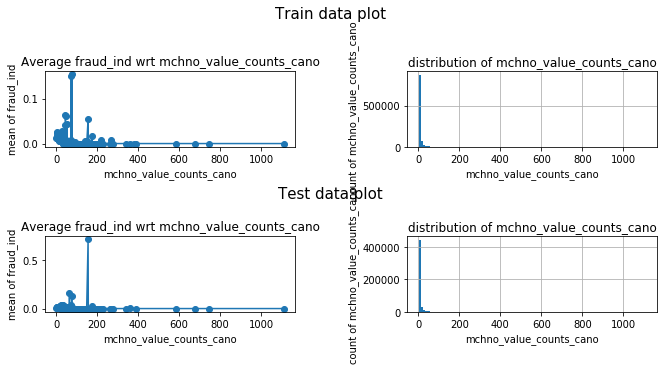

mchno_ratio_cano


<Figure size 432x288 with 0 Axes>

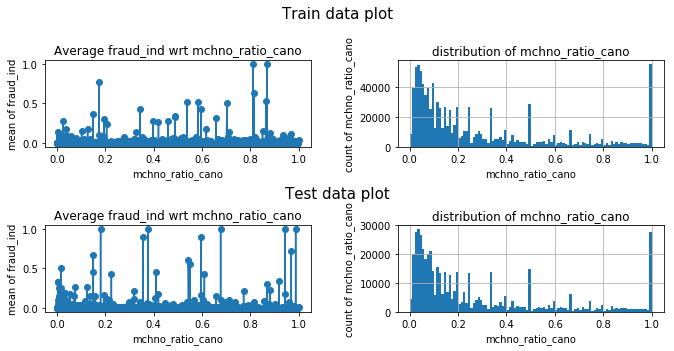

cano_acqic_nunique


<Figure size 432x288 with 0 Axes>

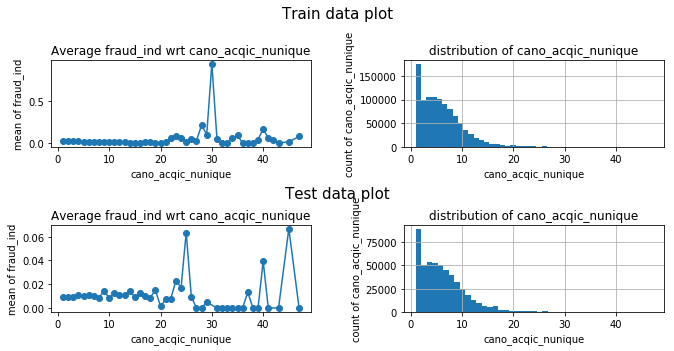

acqic_value_counts_cano


<Figure size 432x288 with 0 Axes>

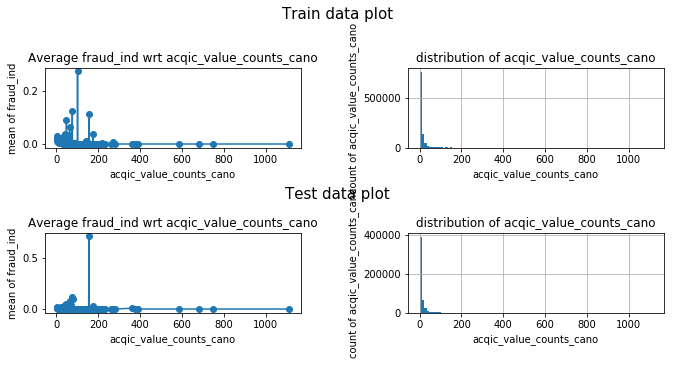

acqic_ratio_cano


<Figure size 432x288 with 0 Axes>

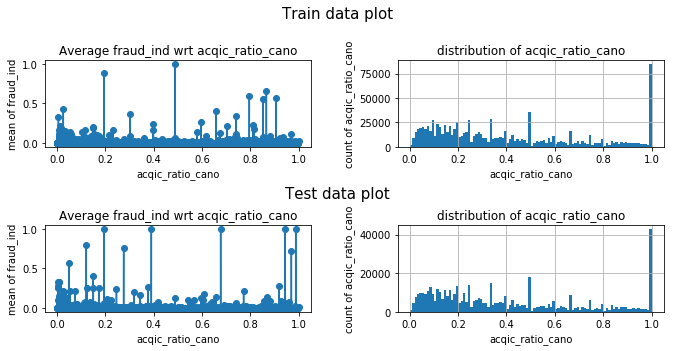

cano_mcc_nunique


<Figure size 432x288 with 0 Axes>

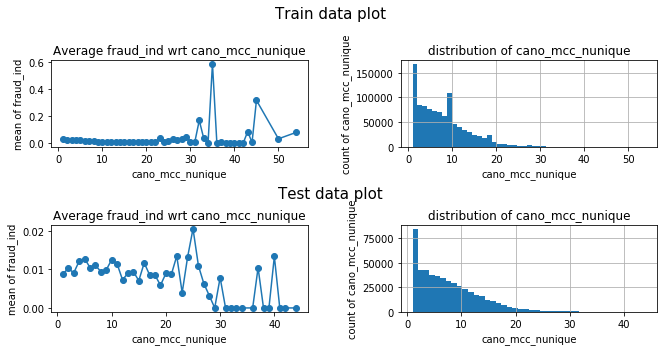

mcc_value_counts_cano


<Figure size 432x288 with 0 Axes>

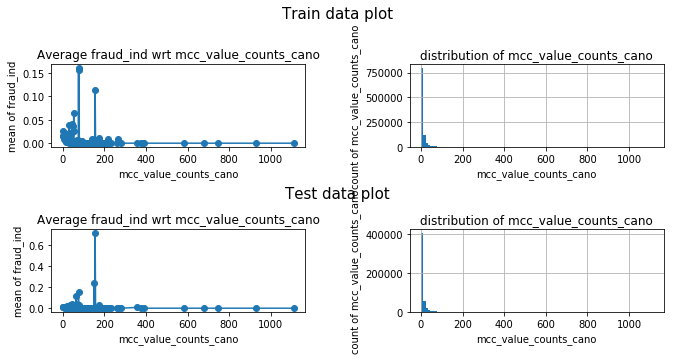

mcc_ratio_cano


<Figure size 432x288 with 0 Axes>

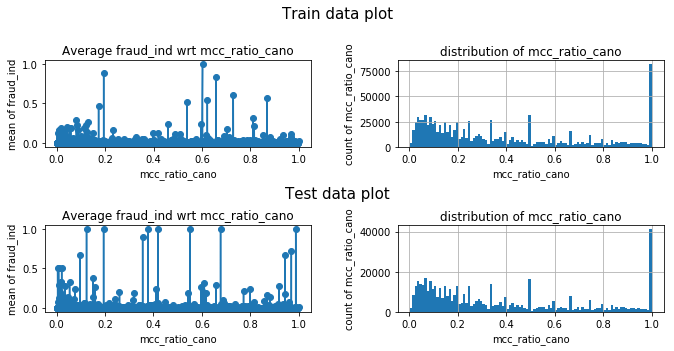

cano_scity_nunique


<Figure size 432x288 with 0 Axes>

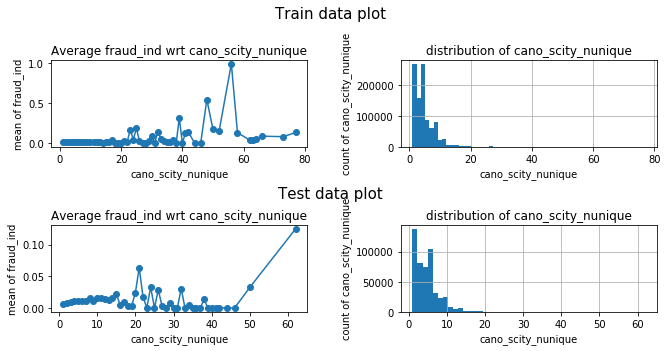

scity_value_counts_cano


<Figure size 432x288 with 0 Axes>

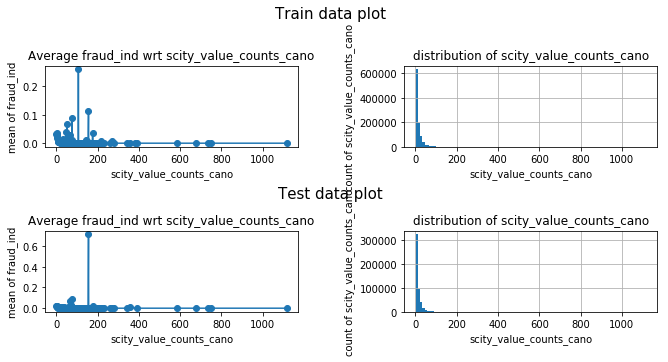

scity_ratio_cano


<Figure size 432x288 with 0 Axes>

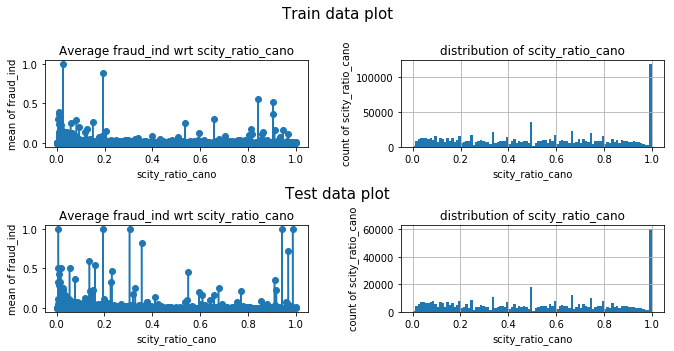

cano_contp_nunique


<Figure size 432x288 with 0 Axes>

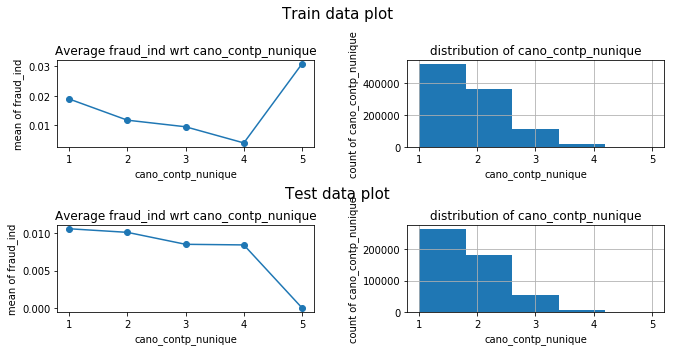

contp_value_counts_cano


<Figure size 432x288 with 0 Axes>

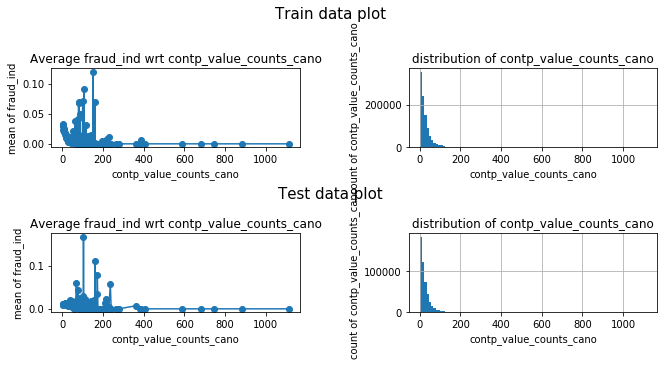

contp_ratio_cano


<Figure size 432x288 with 0 Axes>

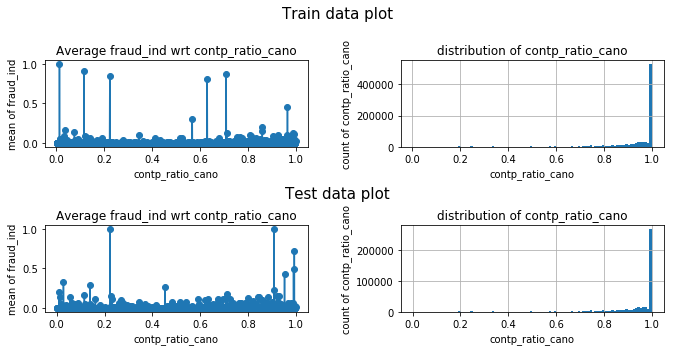

cano_etymd_nunique


<Figure size 432x288 with 0 Axes>

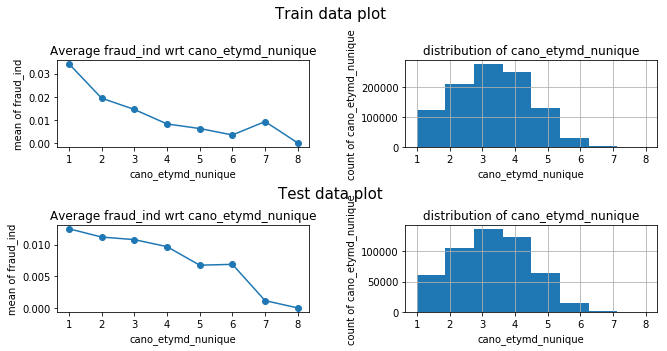

etymd_value_counts_cano


<Figure size 432x288 with 0 Axes>

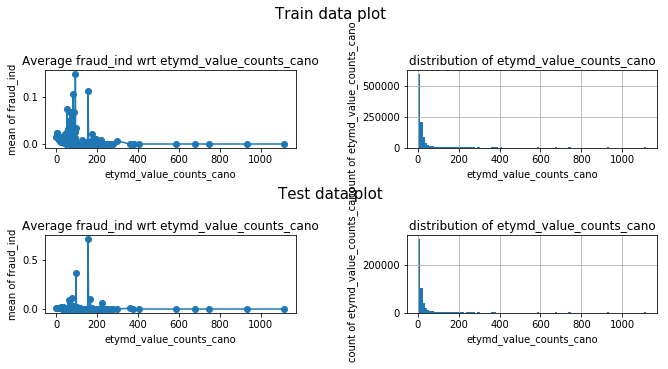

etymd_ratio_cano


<Figure size 432x288 with 0 Axes>

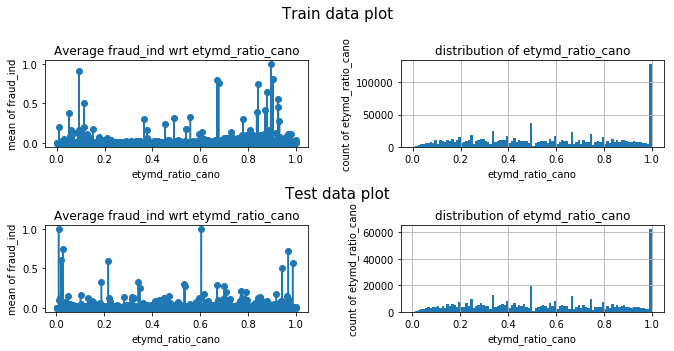

cano_stscd_nunique


<Figure size 432x288 with 0 Axes>

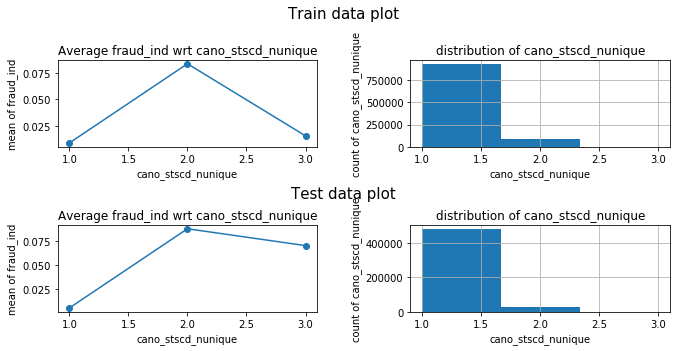

stscd_value_counts_cano


<Figure size 432x288 with 0 Axes>

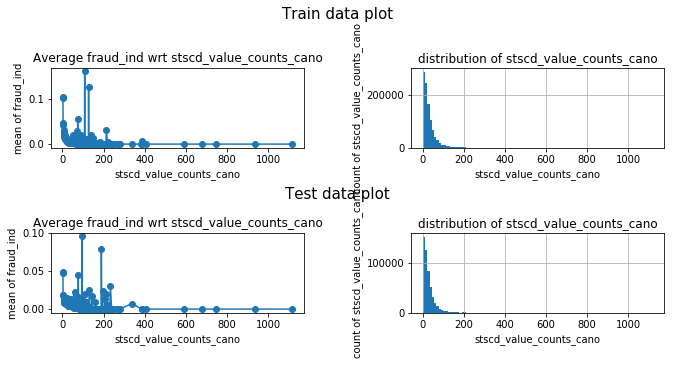

stscd_ratio_cano


<Figure size 432x288 with 0 Axes>

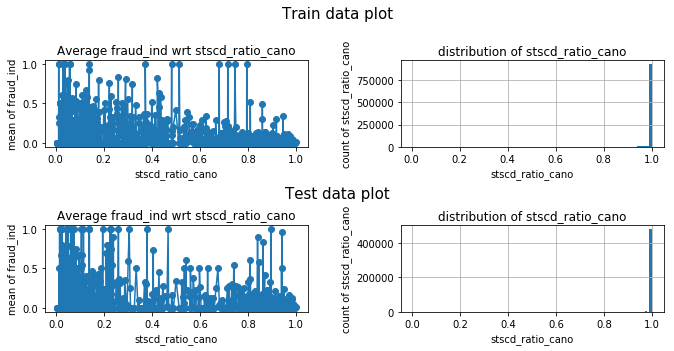

cano_hcefg_nunique


<Figure size 432x288 with 0 Axes>

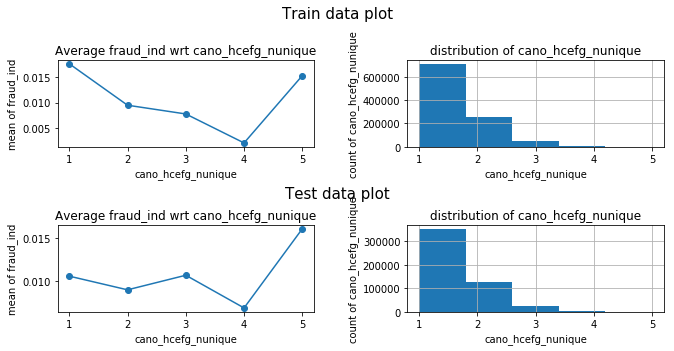

hcefg_value_counts_cano


<Figure size 432x288 with 0 Axes>

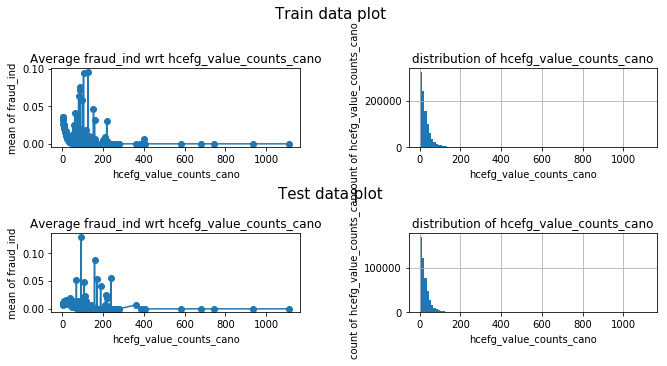

hcefg_ratio_cano


<Figure size 432x288 with 0 Axes>

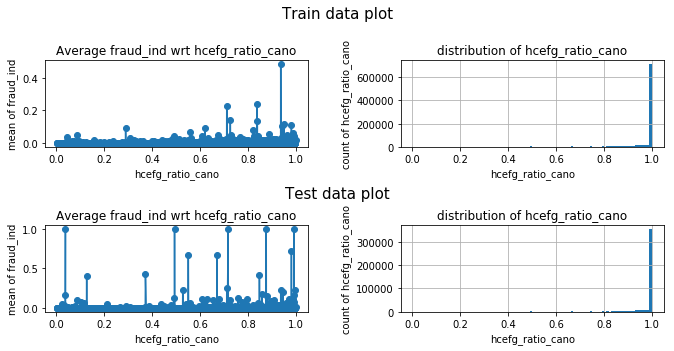

cano_only_consecutive_stscd2


<Figure size 432x288 with 0 Axes>

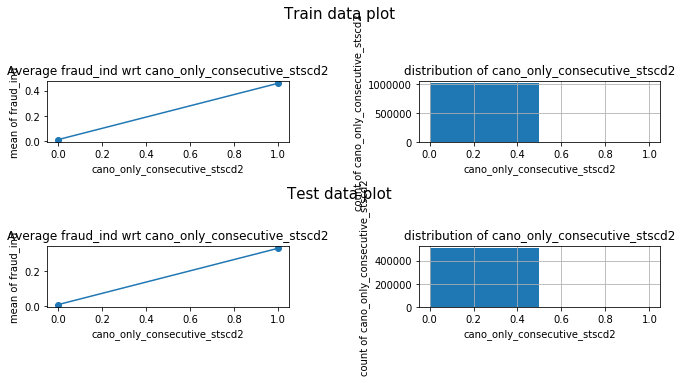

bacno_consecutive_and_only_ecfg


<Figure size 432x288 with 0 Axes>

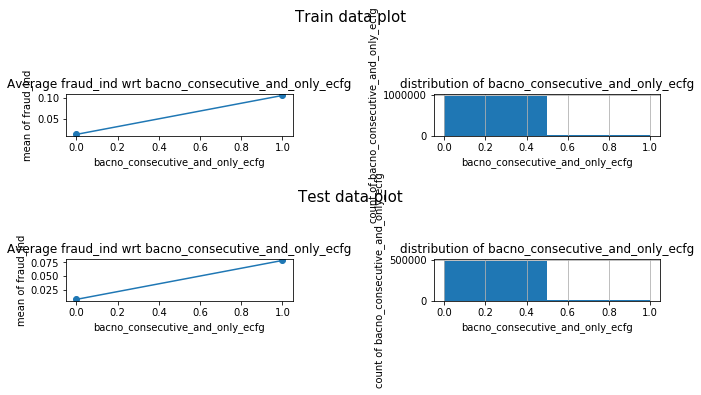

cano_lastday_use


<Figure size 432x288 with 0 Axes>

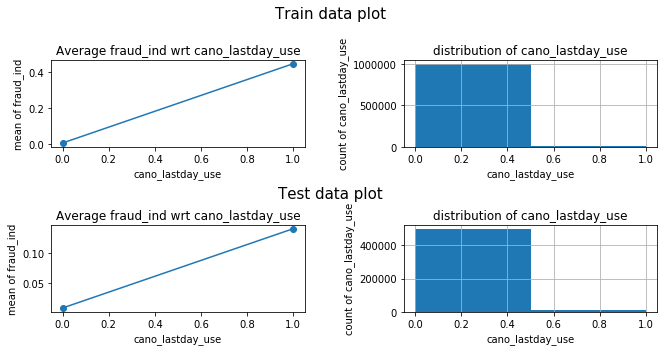

cano_lastday_use_twokind


<Figure size 432x288 with 0 Axes>

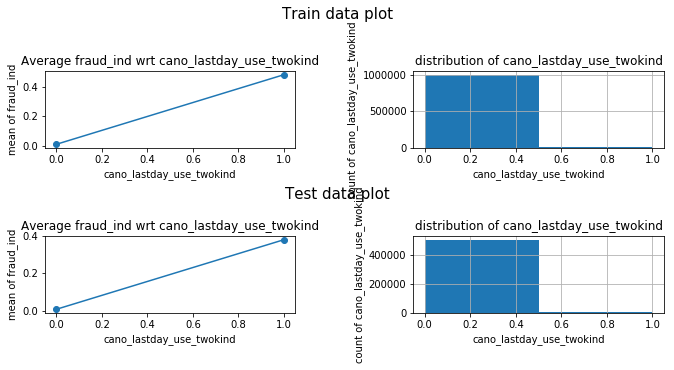

cano_lastlocdt


<Figure size 432x288 with 0 Axes>

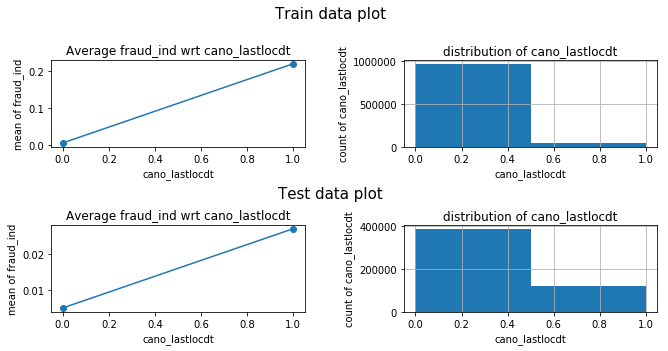

bacno_lastlocdt


<Figure size 432x288 with 0 Axes>

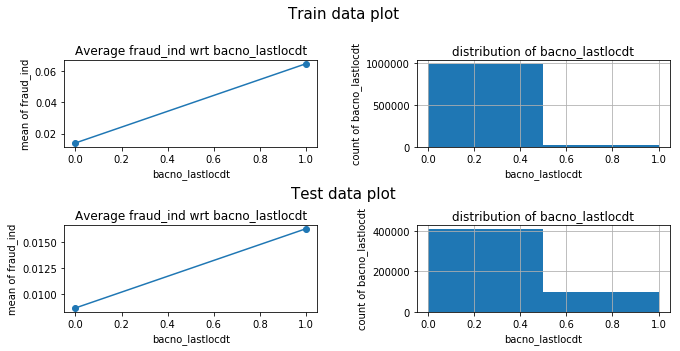

cano_lastlocdt2


<Figure size 432x288 with 0 Axes>

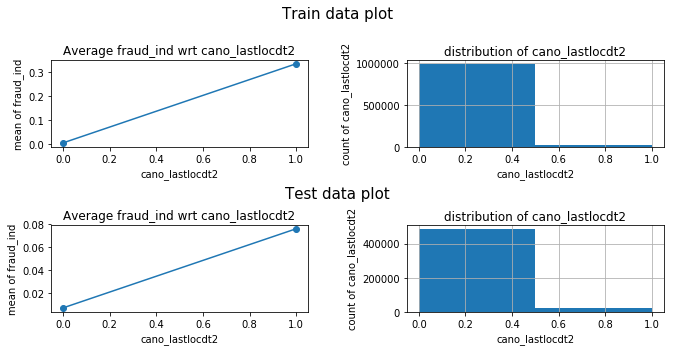

bacno_stscd_equal2


<Figure size 432x288 with 0 Axes>

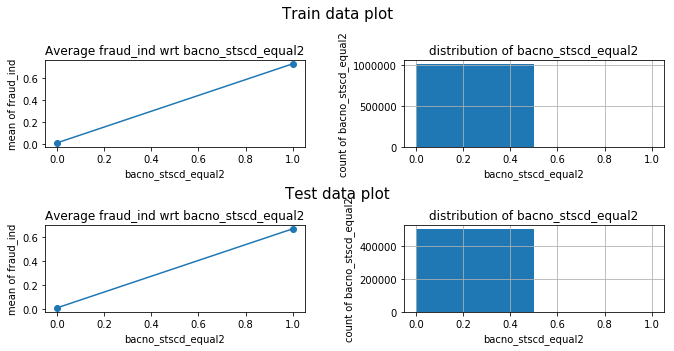

bacno_ecfg_equal1


<Figure size 432x288 with 0 Axes>

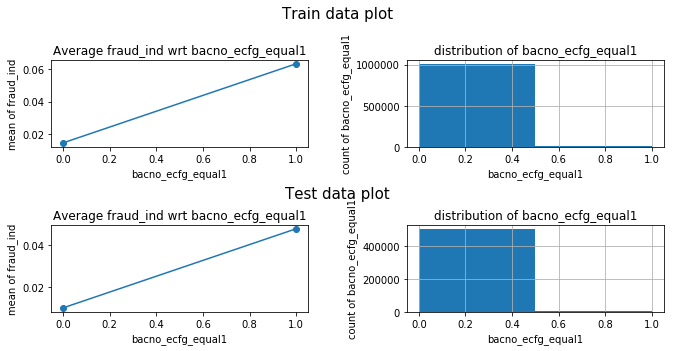

bacno_1_count


<Figure size 432x288 with 0 Axes>

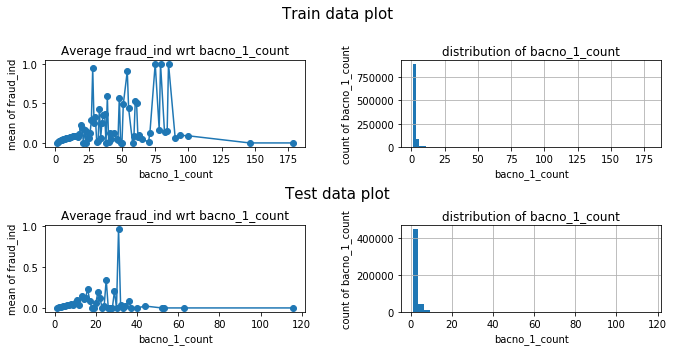

bacno_2day_count


<Figure size 432x288 with 0 Axes>

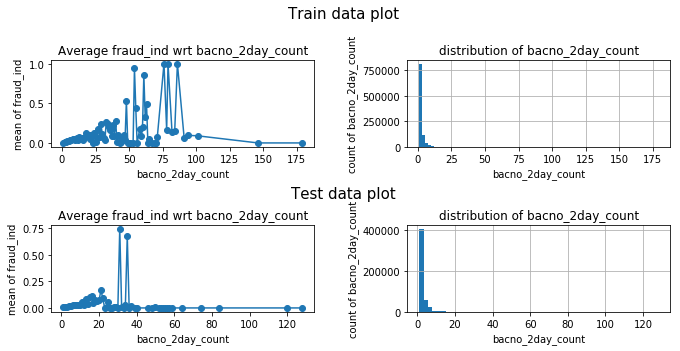

bacno_3day_count


<Figure size 432x288 with 0 Axes>

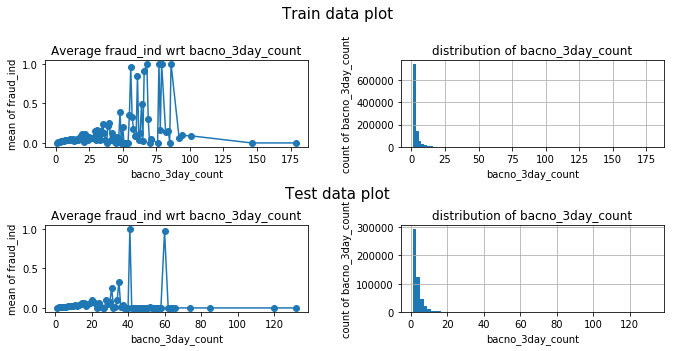

bacno_7day_count


<Figure size 432x288 with 0 Axes>

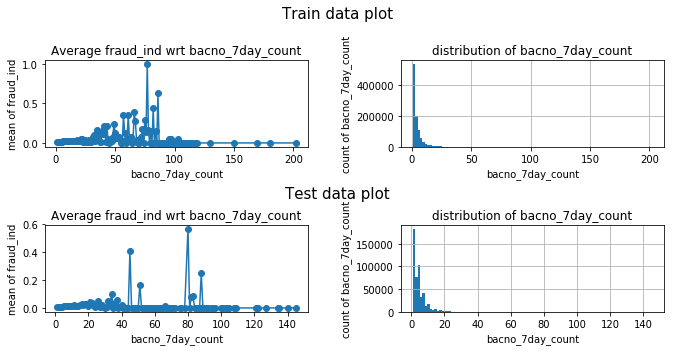

bacno_2day_after_count


<Figure size 432x288 with 0 Axes>

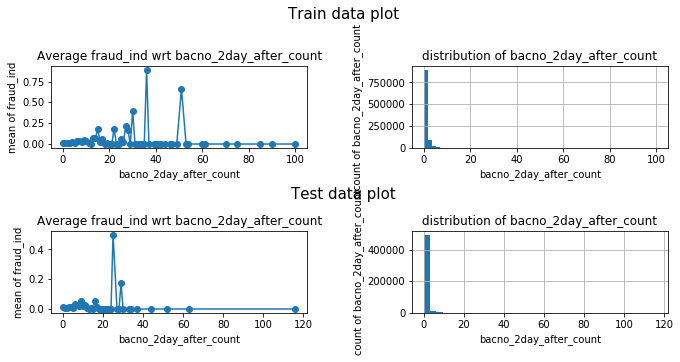

bacno_3day_after_count


<Figure size 432x288 with 0 Axes>

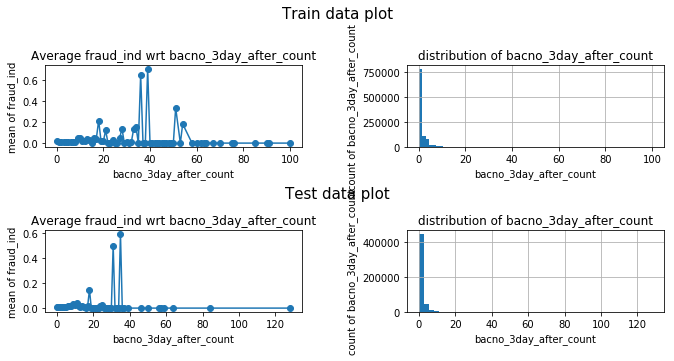

bacno_7day_after_count


<Figure size 432x288 with 0 Axes>

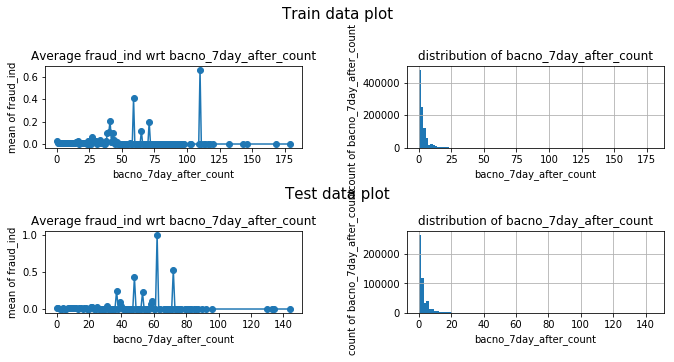

bacno_cano_changetimes


<Figure size 432x288 with 0 Axes>

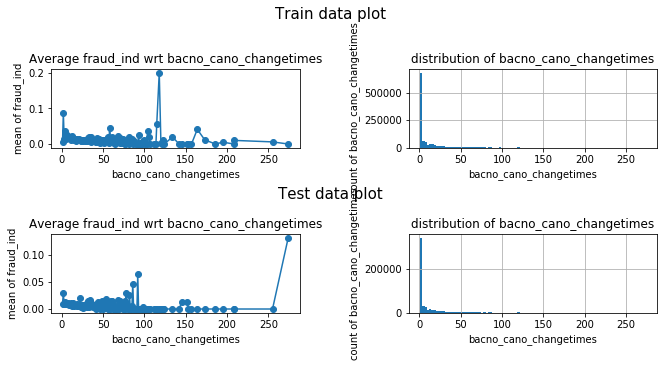

cano_change_ratio


<Figure size 432x288 with 0 Axes>

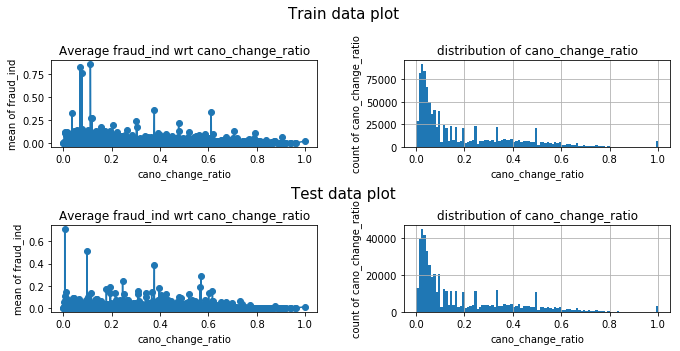

bacno_locdt_diff


<Figure size 432x288 with 0 Axes>

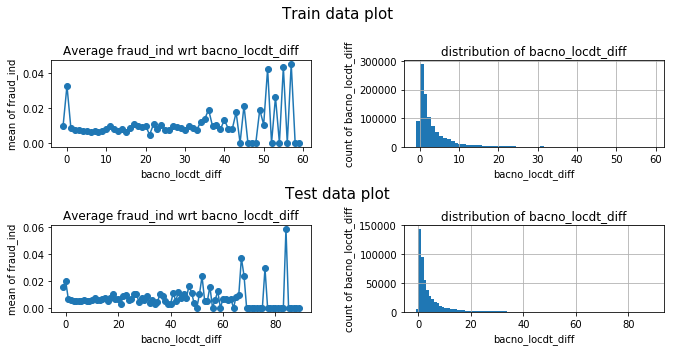

bacno_loctm_diff


<Figure size 432x288 with 0 Axes>

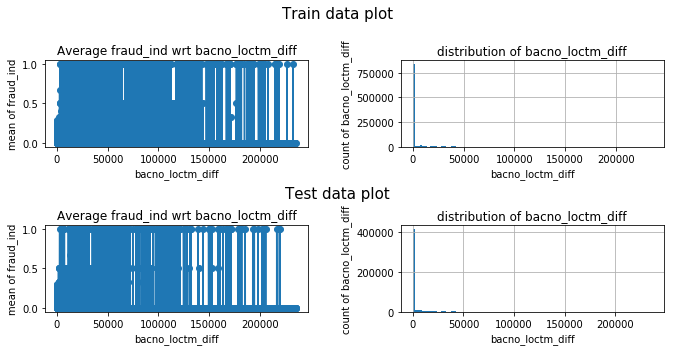

bacno_cano_monoincrease


<Figure size 432x288 with 0 Axes>

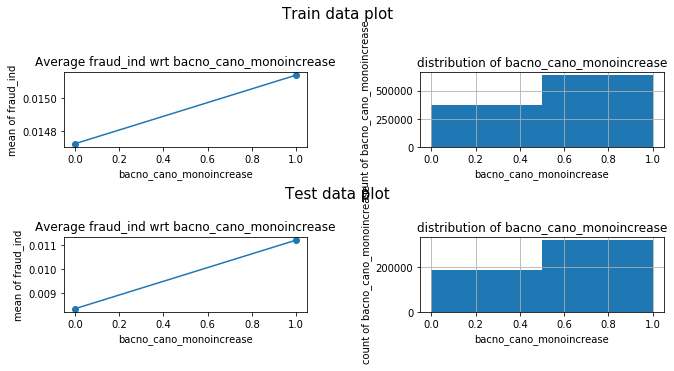

bacno_contp_mode


<Figure size 432x288 with 0 Axes>

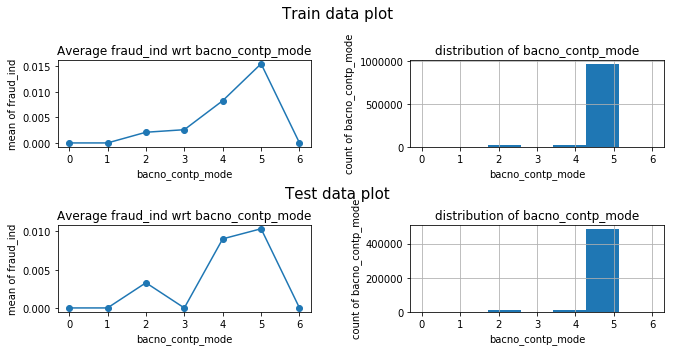

cano_contp_mode


<Figure size 432x288 with 0 Axes>

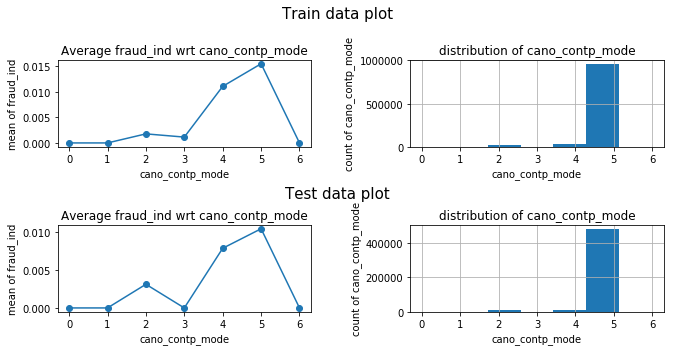

bacno_etymd_mode


<Figure size 432x288 with 0 Axes>

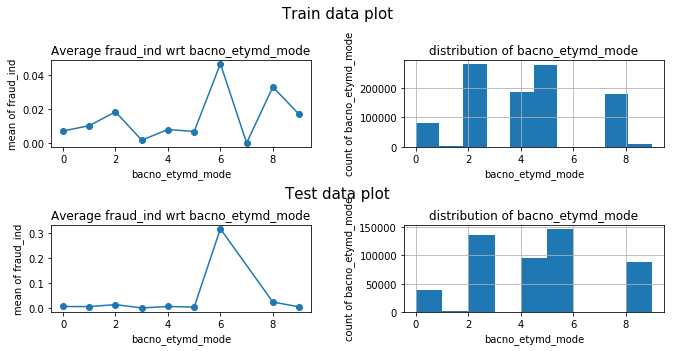

cano_etymd_mode


<Figure size 432x288 with 0 Axes>

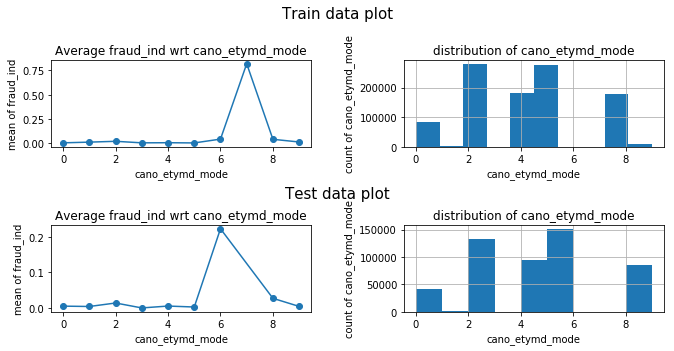

bacno_mchno_mode


<Figure size 432x288 with 0 Axes>

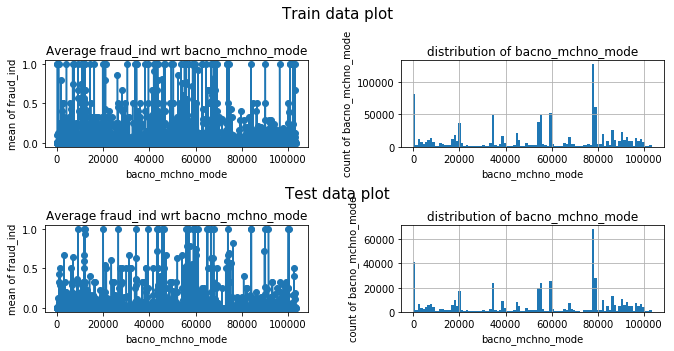

cano_mchno_mode


<Figure size 432x288 with 0 Axes>

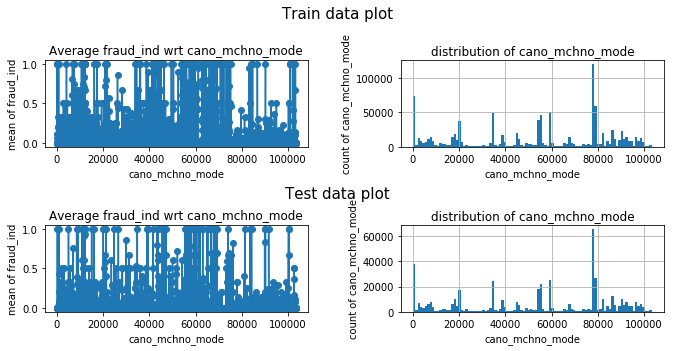

bacno_acqic_mode


<Figure size 432x288 with 0 Axes>

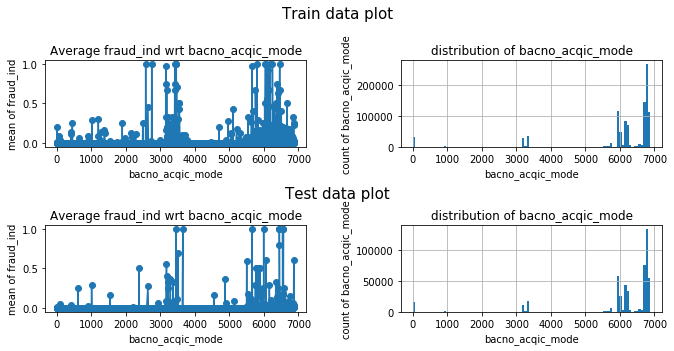

cano_acqic_mode


<Figure size 432x288 with 0 Axes>

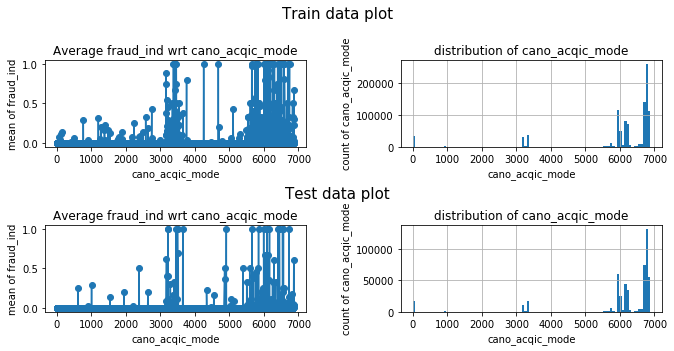

bacno_mcc_mode


<Figure size 432x288 with 0 Axes>

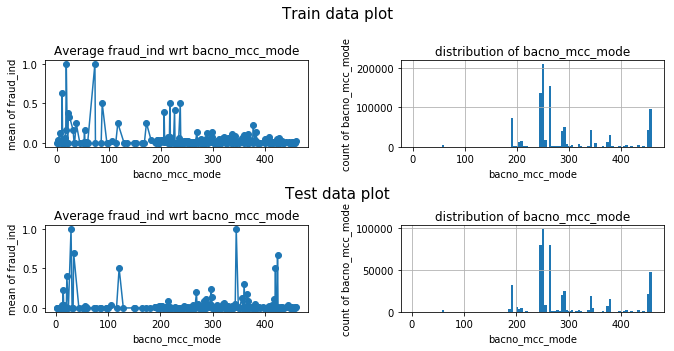

cano_mcc_mode


<Figure size 432x288 with 0 Axes>

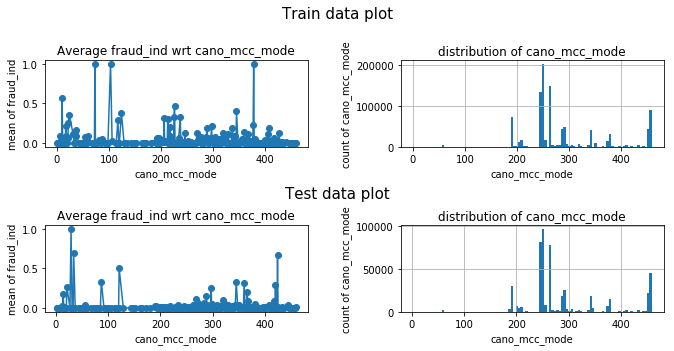

bacno_ecfg_mode


<Figure size 432x288 with 0 Axes>

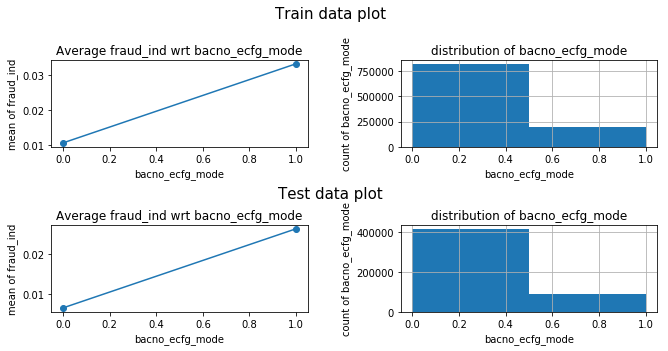

cano_ecfg_mode


<Figure size 432x288 with 0 Axes>

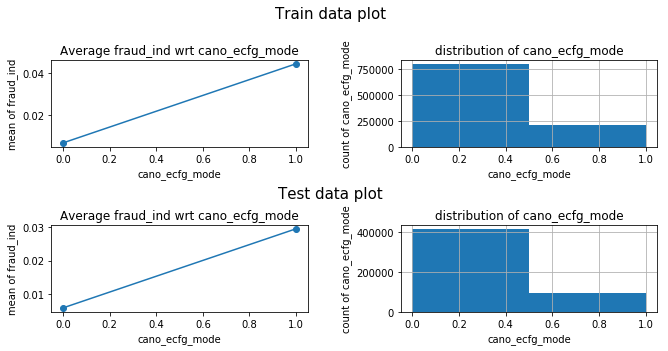

bacno_hcefg_mode


<Figure size 432x288 with 0 Axes>

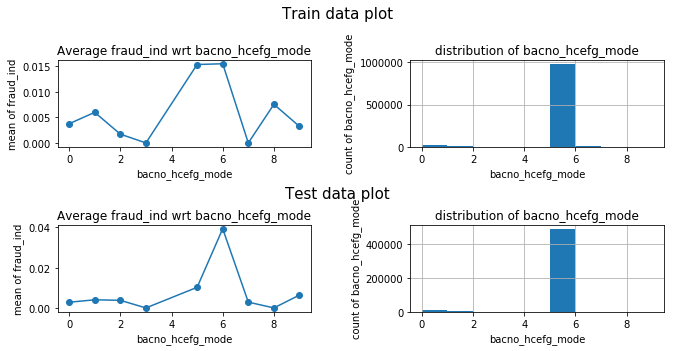

cano_hcefg_mode


<Figure size 432x288 with 0 Axes>

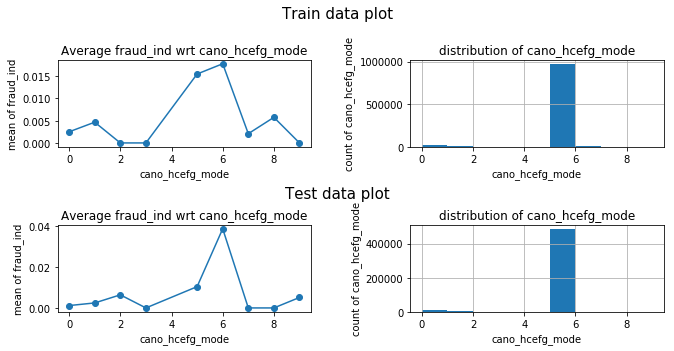

bacno_stscd_mode


<Figure size 432x288 with 0 Axes>

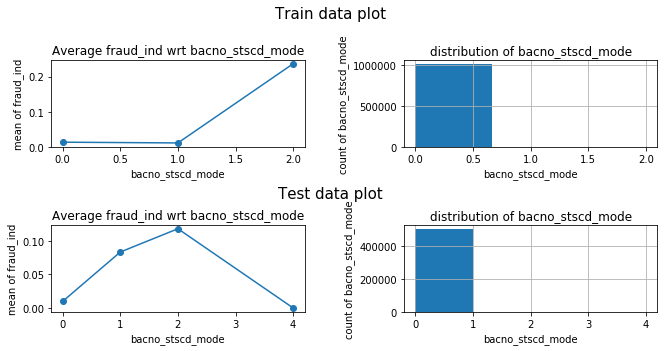

cano_stscd_mode


<Figure size 432x288 with 0 Axes>

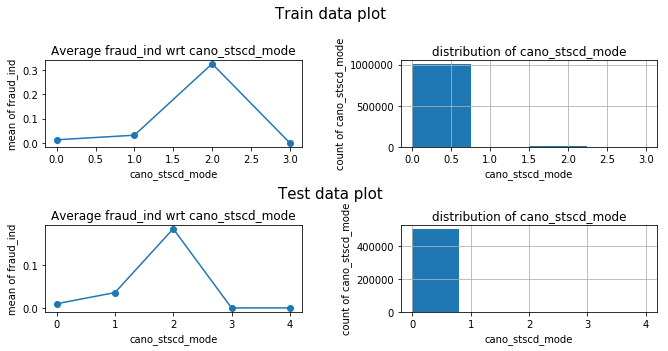

bacno_contp_diff1


<Figure size 432x288 with 0 Axes>

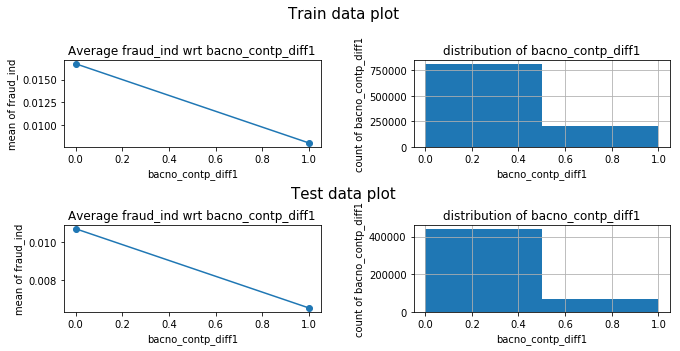

bacno_contp_diff2


<Figure size 432x288 with 0 Axes>

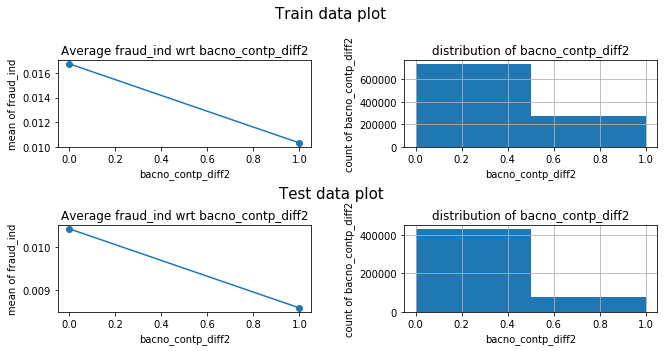

bacno_contp_diff3


<Figure size 432x288 with 0 Axes>

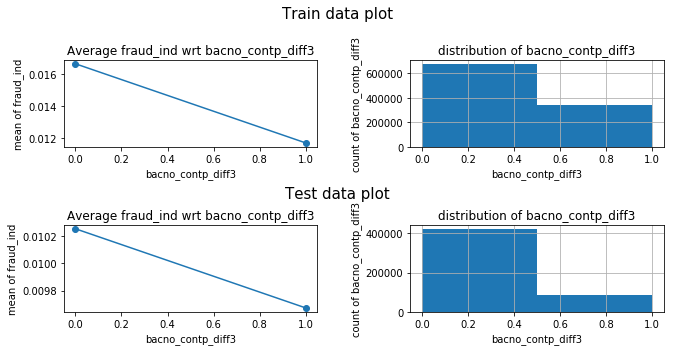

bacno_etymd_diff1


<Figure size 432x288 with 0 Axes>

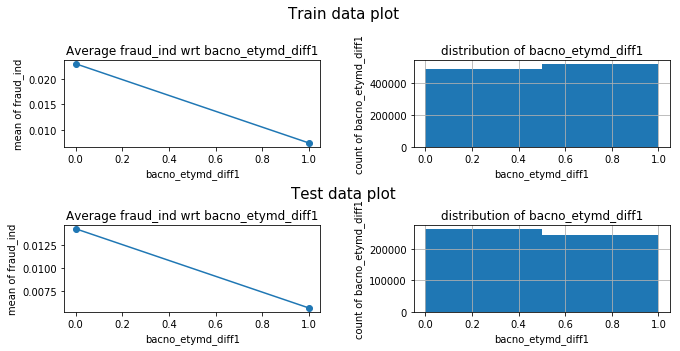

bacno_etymd_diff2


<Figure size 432x288 with 0 Axes>

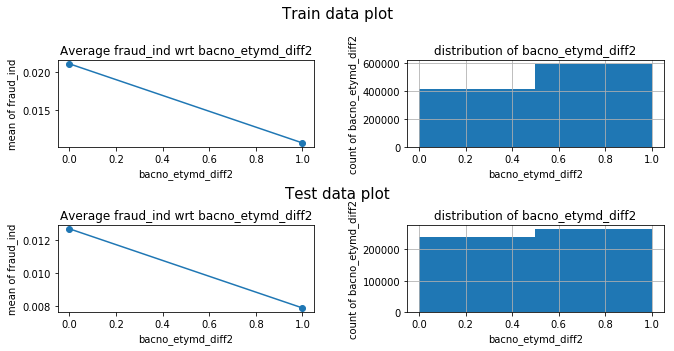

bacno_etymd_diff3


<Figure size 432x288 with 0 Axes>

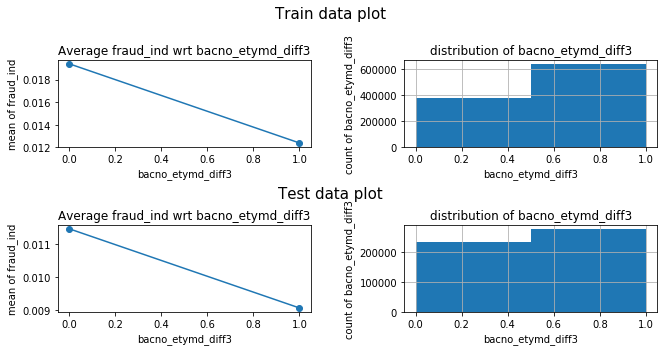

bacno_mchno_diff1


<Figure size 432x288 with 0 Axes>

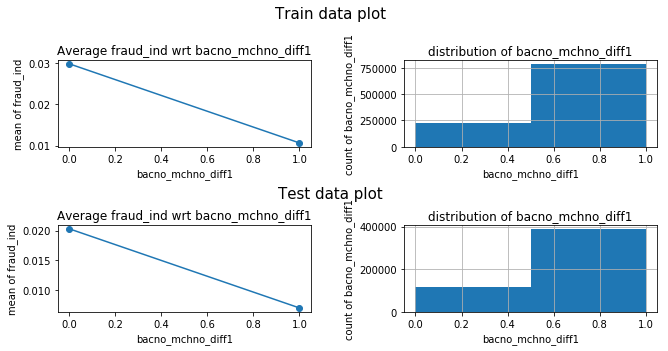

bacno_mchno_diff2


<Figure size 432x288 with 0 Axes>

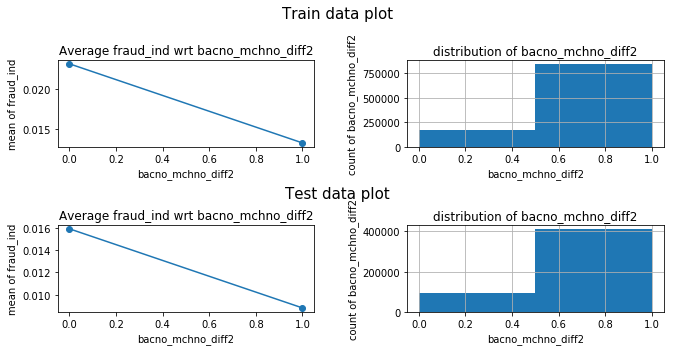

bacno_mchno_diff3


<Figure size 432x288 with 0 Axes>

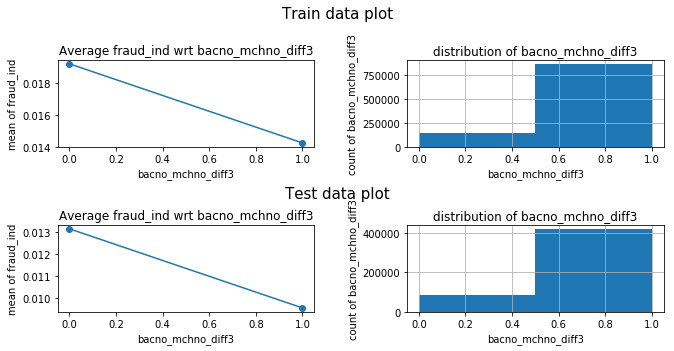

bacno_acqic_diff1


<Figure size 432x288 with 0 Axes>

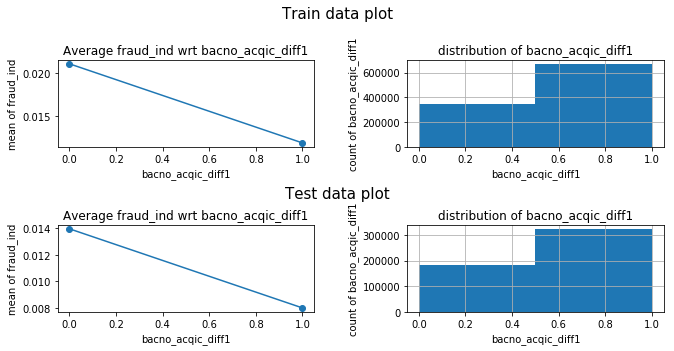

bacno_acqic_diff2


<Figure size 432x288 with 0 Axes>

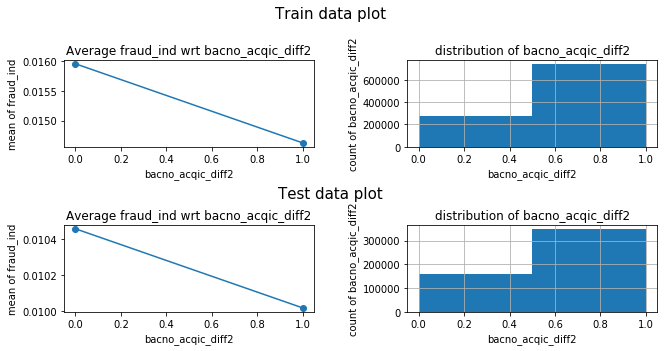

bacno_acqic_diff3


<Figure size 432x288 with 0 Axes>

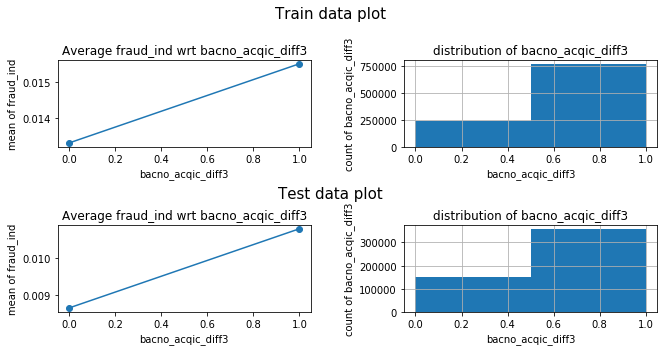

bacno_mcc_diff1


<Figure size 432x288 with 0 Axes>

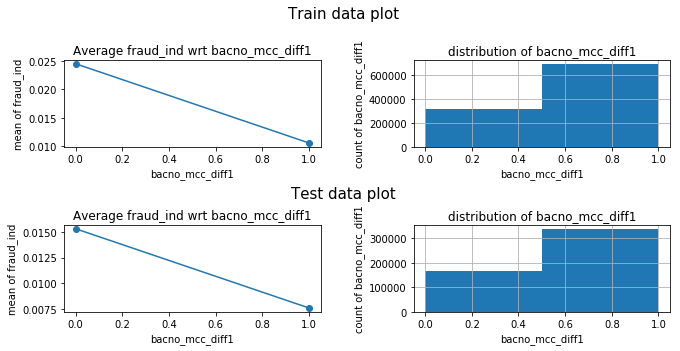

bacno_mcc_diff2


<Figure size 432x288 with 0 Axes>

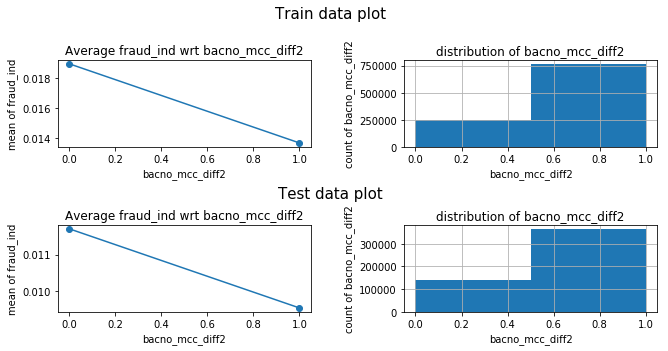

bacno_mcc_diff3


<Figure size 432x288 with 0 Axes>

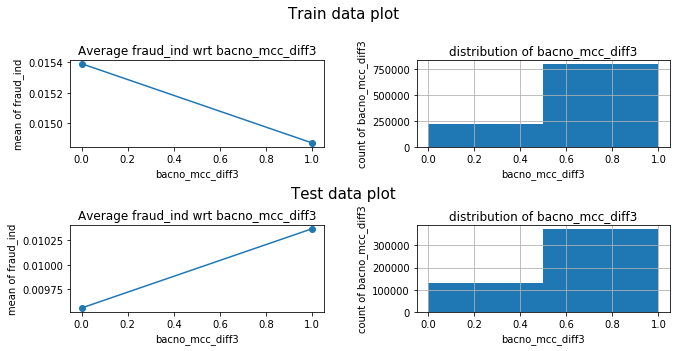

bacno_ecfg_diff1


<Figure size 432x288 with 0 Axes>

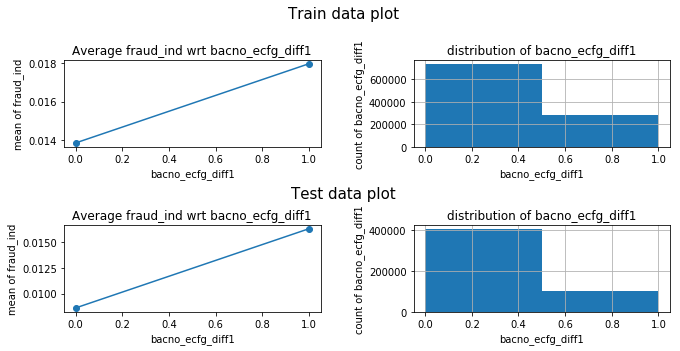

bacno_ecfg_diff2


<Figure size 432x288 with 0 Axes>

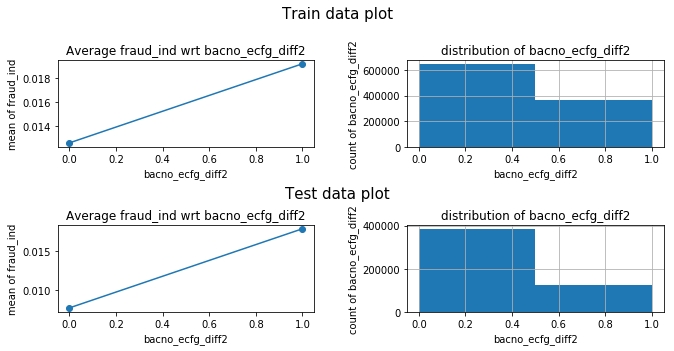

bacno_ecfg_diff3


<Figure size 432x288 with 0 Axes>

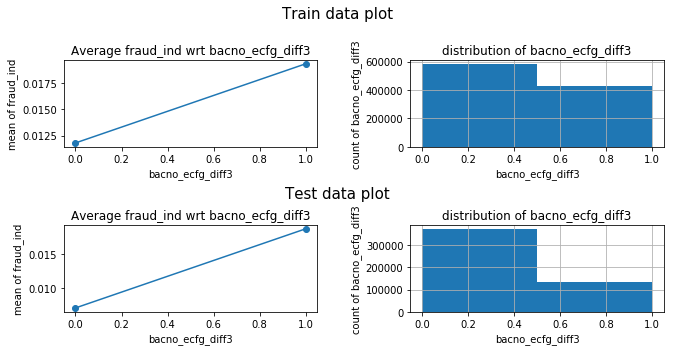

bacno_hcefg_diff1


<Figure size 432x288 with 0 Axes>

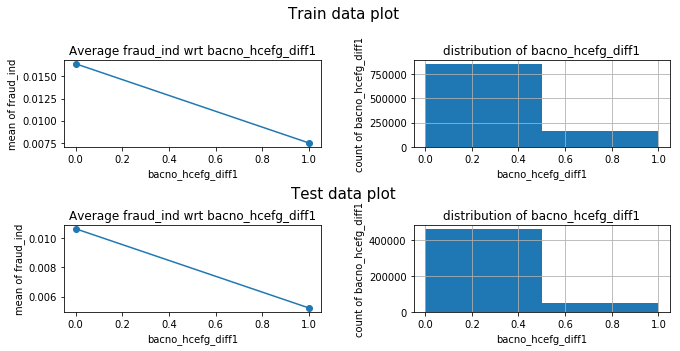

bacno_hcefg_diff2


<Figure size 432x288 with 0 Axes>

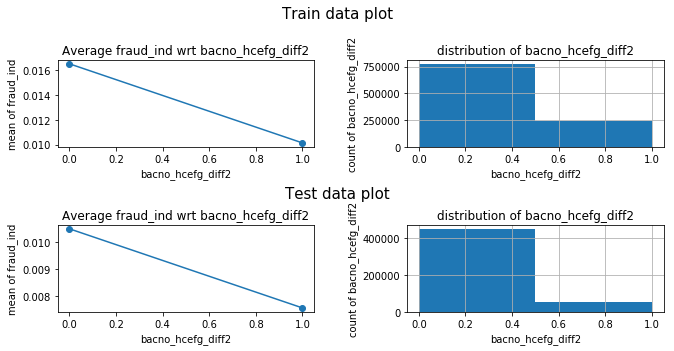

bacno_hcefg_diff3


<Figure size 432x288 with 0 Axes>

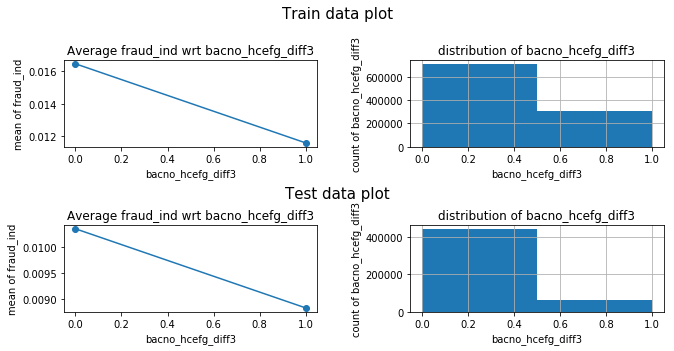

bacno_stscd_diff1


<Figure size 432x288 with 0 Axes>

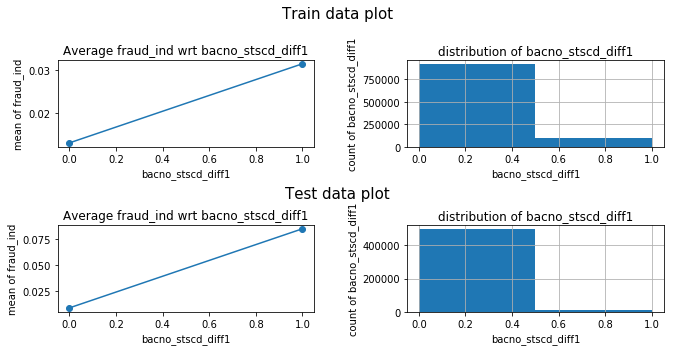

bacno_stscd_diff2


<Figure size 432x288 with 0 Axes>

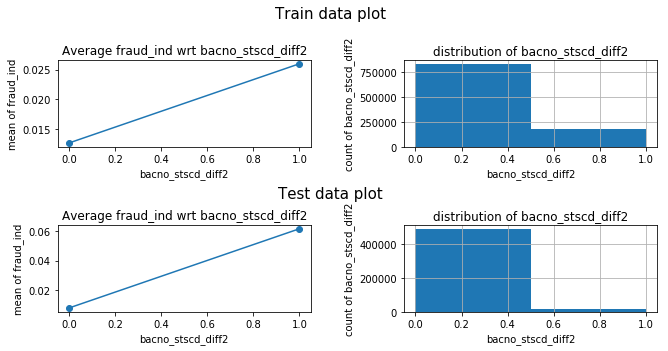

bacno_stscd_diff3


<Figure size 432x288 with 0 Axes>

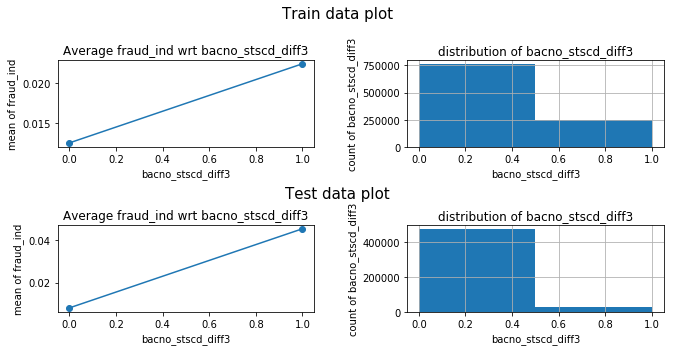

bacno_stocn_diff1


<Figure size 432x288 with 0 Axes>

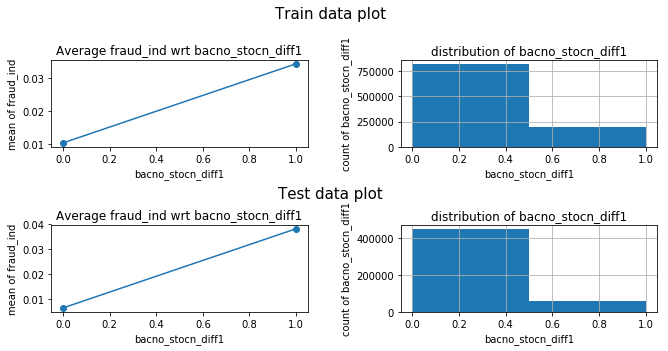

bacno_stocn_diff2


<Figure size 432x288 with 0 Axes>

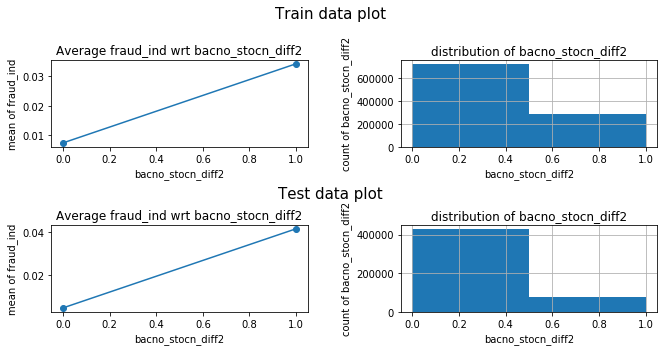

bacno_stocn_diff3


<Figure size 432x288 with 0 Axes>

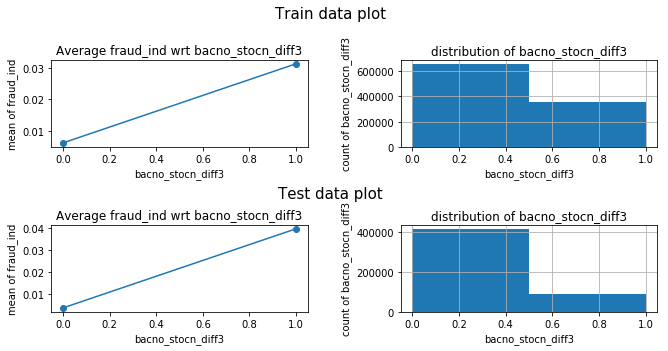

bacno_scity_diff1


<Figure size 432x288 with 0 Axes>

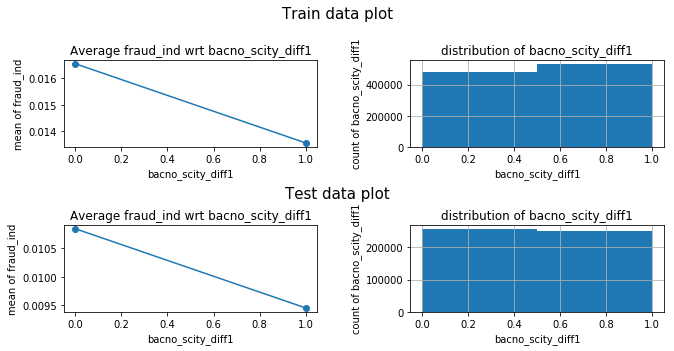

bacno_scity_diff2


<Figure size 432x288 with 0 Axes>

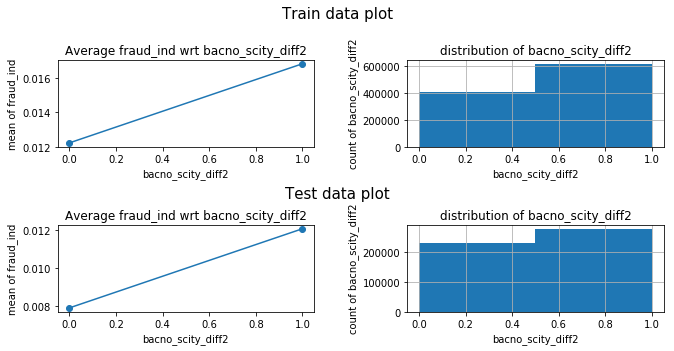

bacno_scity_diff3


<Figure size 432x288 with 0 Axes>

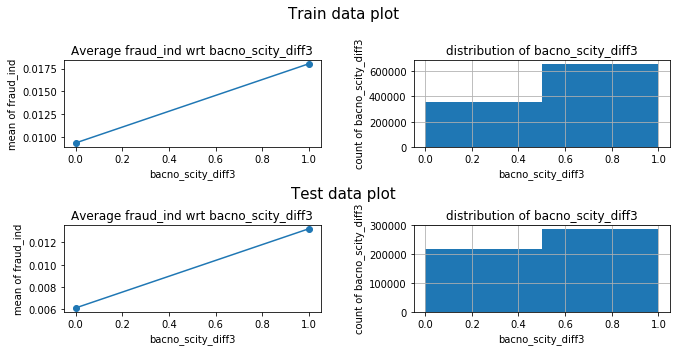

bacno_csmcu_diff1


<Figure size 432x288 with 0 Axes>

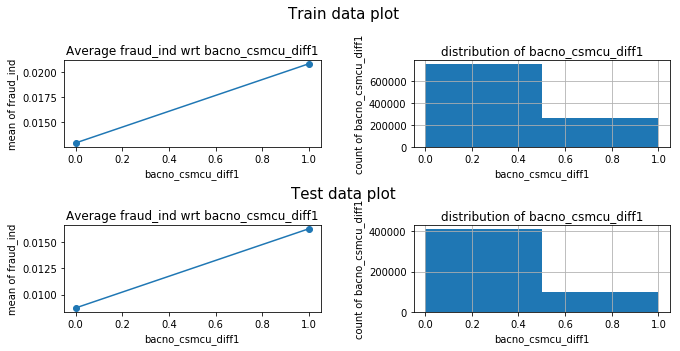

bacno_csmcu_diff2


<Figure size 432x288 with 0 Axes>

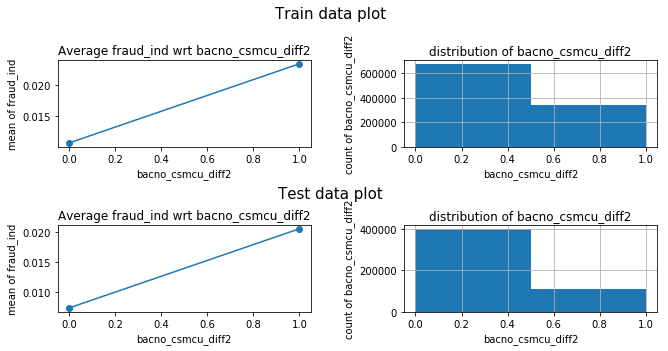

bacno_csmcu_diff3


<Figure size 432x288 with 0 Axes>

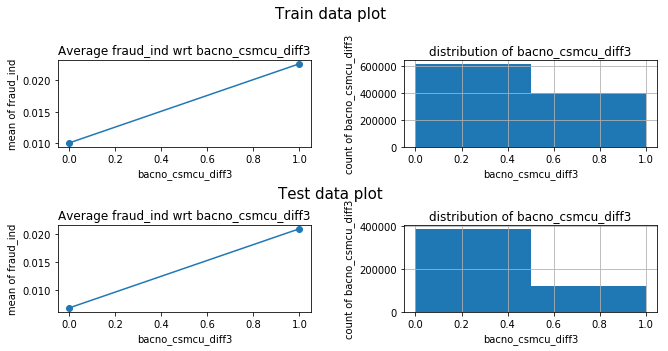

cano_contp_diff1


<Figure size 432x288 with 0 Axes>

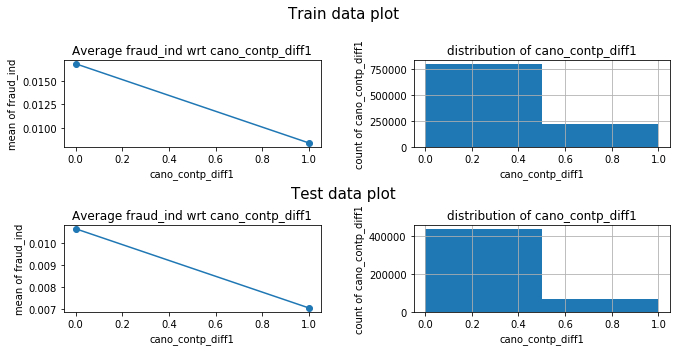

cano_contp_diff2


<Figure size 432x288 with 0 Axes>

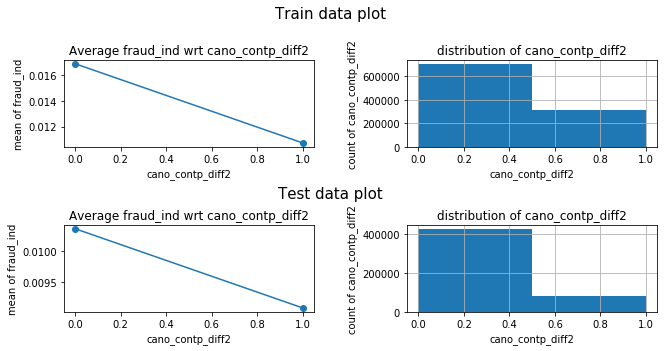

cano_contp_diff3


<Figure size 432x288 with 0 Axes>

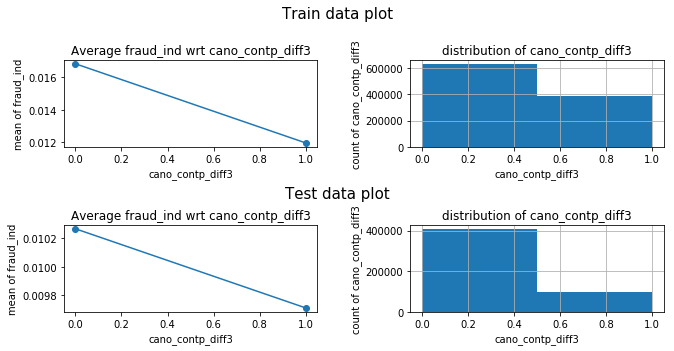

cano_etymd_diff1


<Figure size 432x288 with 0 Axes>

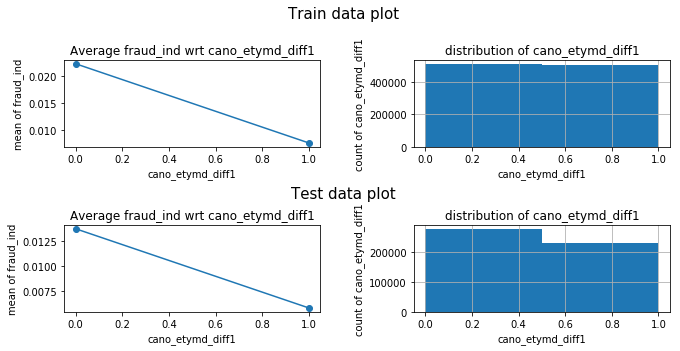

cano_etymd_diff2


<Figure size 432x288 with 0 Axes>

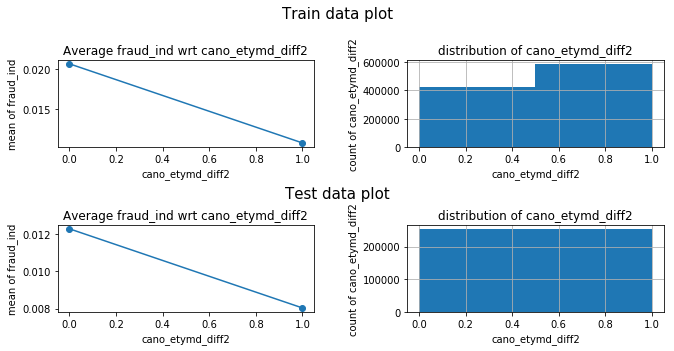

cano_etymd_diff3


<Figure size 432x288 with 0 Axes>

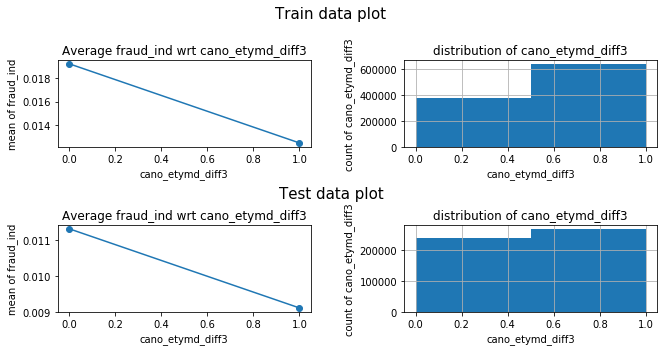

cano_mchno_diff1


<Figure size 432x288 with 0 Axes>

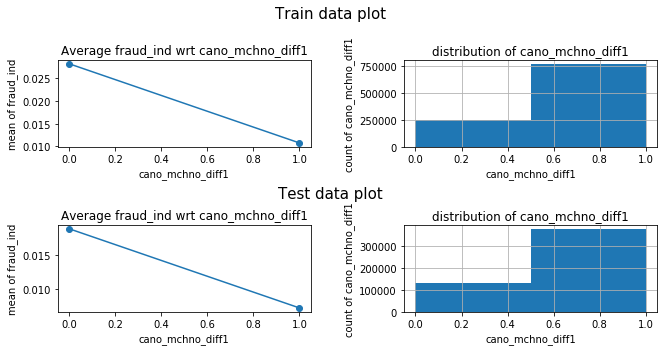

cano_mchno_diff2


<Figure size 432x288 with 0 Axes>

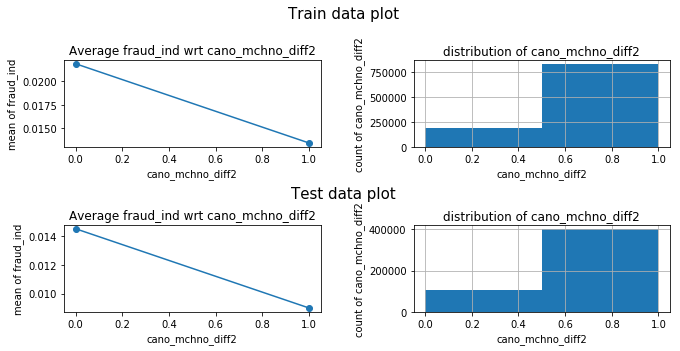

cano_mchno_diff3


<Figure size 432x288 with 0 Axes>

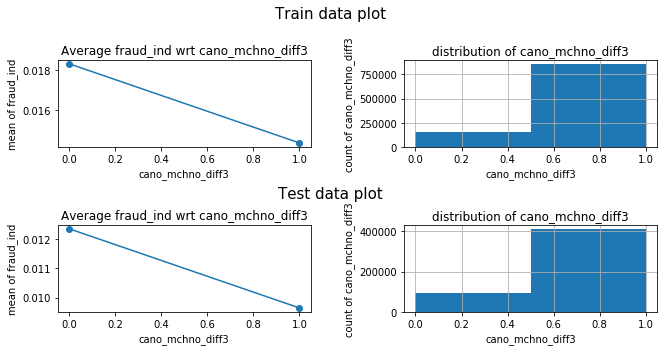

cano_acqic_diff1


<Figure size 432x288 with 0 Axes>

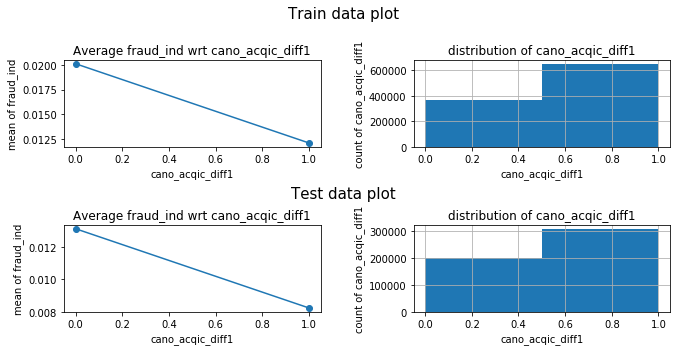

cano_acqic_diff2


<Figure size 432x288 with 0 Axes>

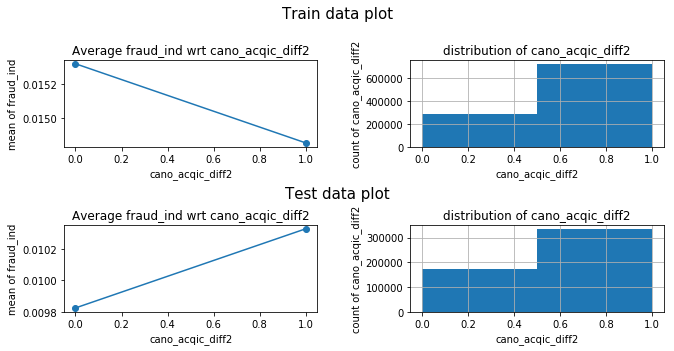

cano_acqic_diff3


<Figure size 432x288 with 0 Axes>

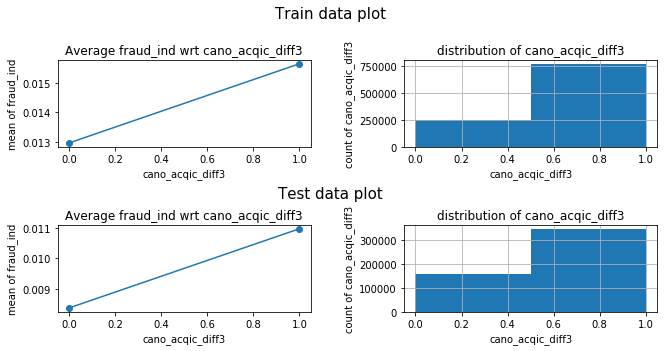

cano_mcc_diff1


<Figure size 432x288 with 0 Axes>

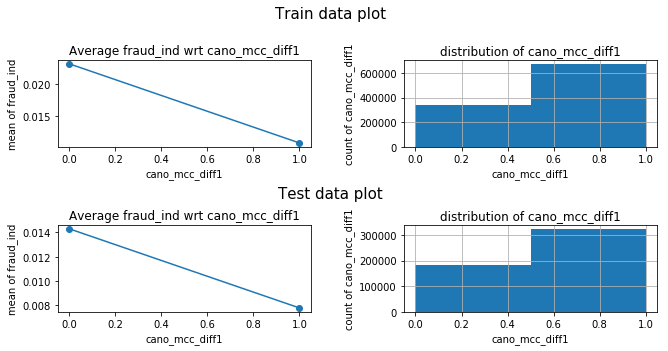

cano_mcc_diff2


<Figure size 432x288 with 0 Axes>

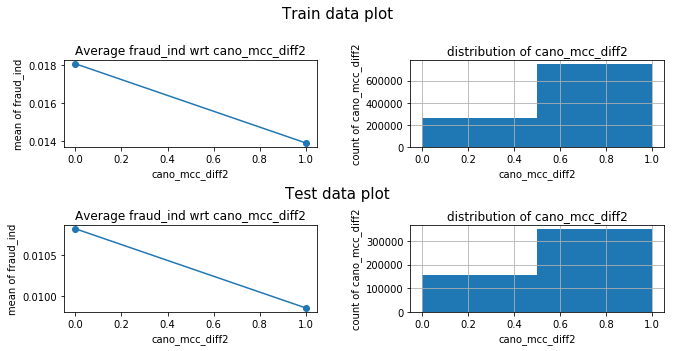

cano_mcc_diff3


<Figure size 432x288 with 0 Axes>

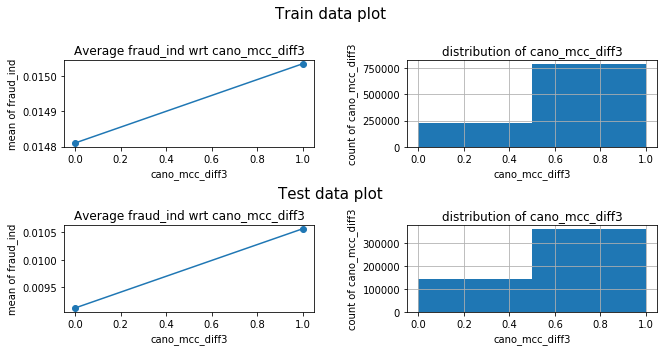

cano_ecfg_diff1


<Figure size 432x288 with 0 Axes>

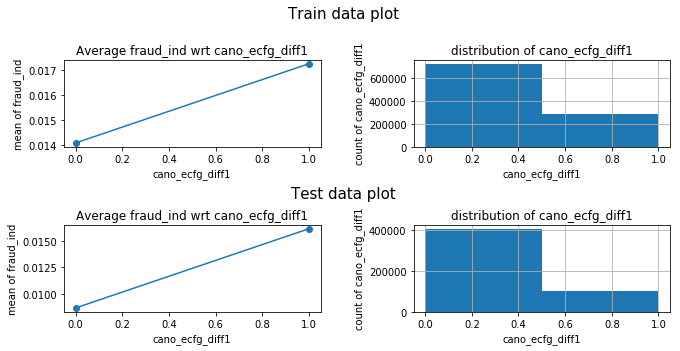

cano_ecfg_diff2


<Figure size 432x288 with 0 Axes>

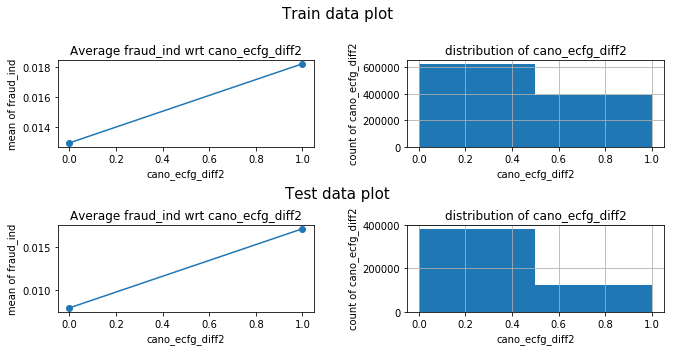

cano_ecfg_diff3


<Figure size 432x288 with 0 Axes>

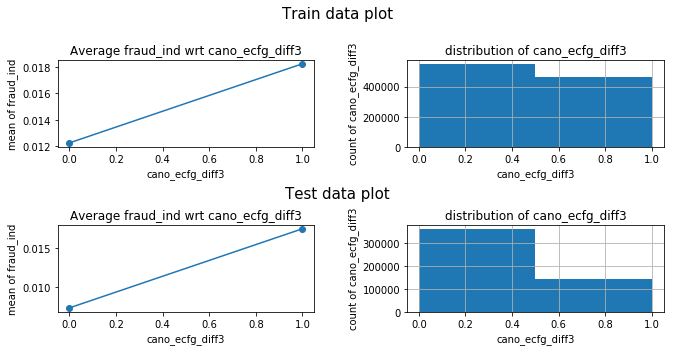

cano_hcefg_diff1


<Figure size 432x288 with 0 Axes>

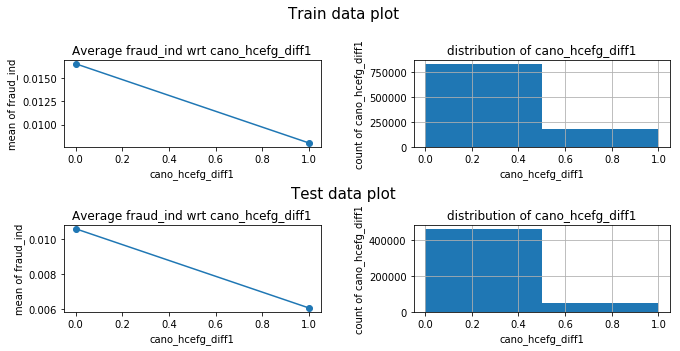

cano_hcefg_diff2


<Figure size 432x288 with 0 Axes>

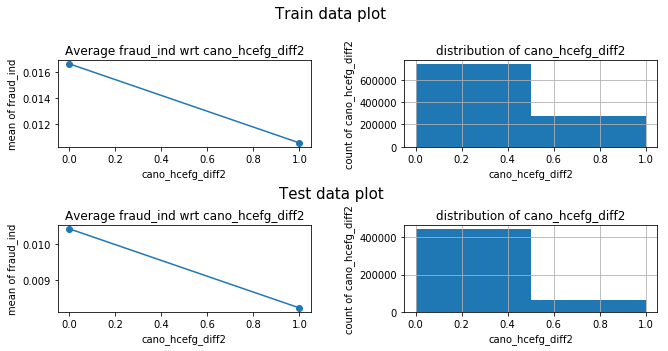

cano_hcefg_diff3


<Figure size 432x288 with 0 Axes>

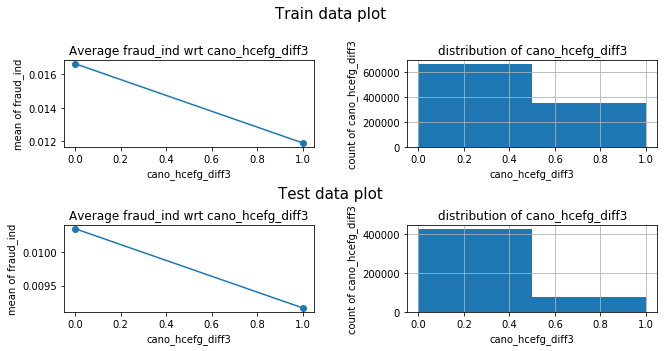

cano_stscd_diff1


<Figure size 432x288 with 0 Axes>

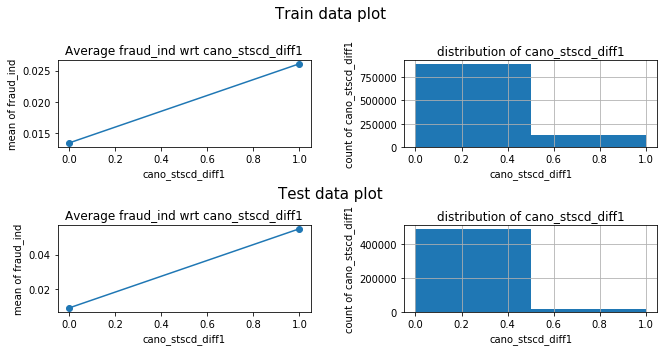

cano_stscd_diff2


<Figure size 432x288 with 0 Axes>

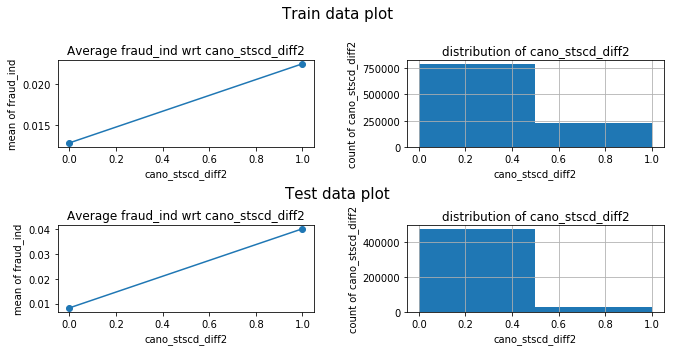

cano_stscd_diff3


<Figure size 432x288 with 0 Axes>

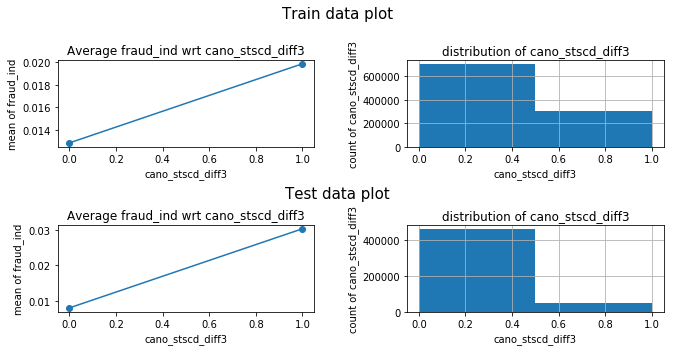

cano_stocn_diff1


<Figure size 432x288 with 0 Axes>

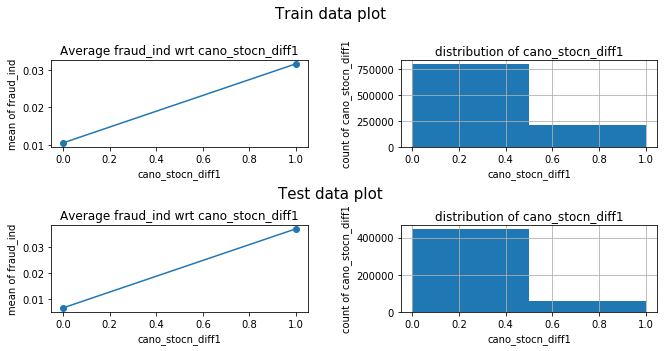

cano_stocn_diff2


<Figure size 432x288 with 0 Axes>

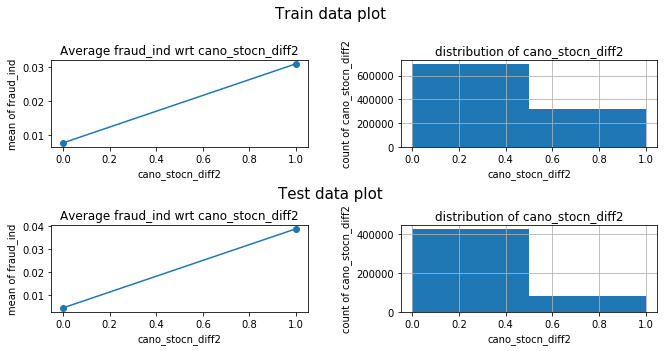

cano_stocn_diff3


<Figure size 432x288 with 0 Axes>

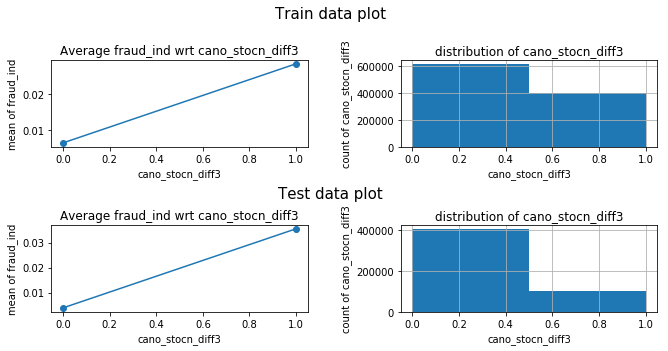

cano_scity_diff1


<Figure size 432x288 with 0 Axes>

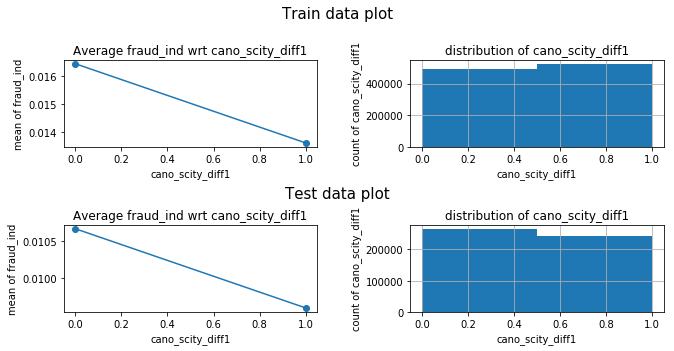

cano_scity_diff2


<Figure size 432x288 with 0 Axes>

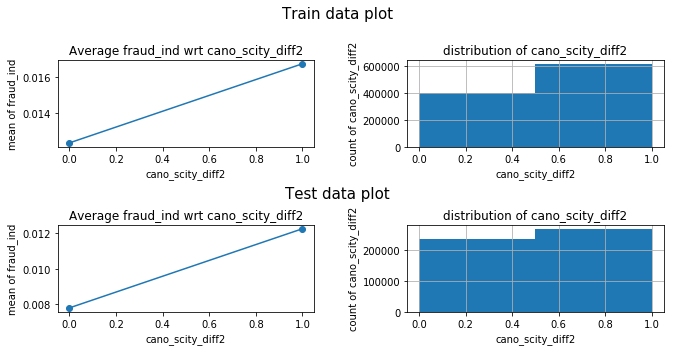

cano_scity_diff3


<Figure size 432x288 with 0 Axes>

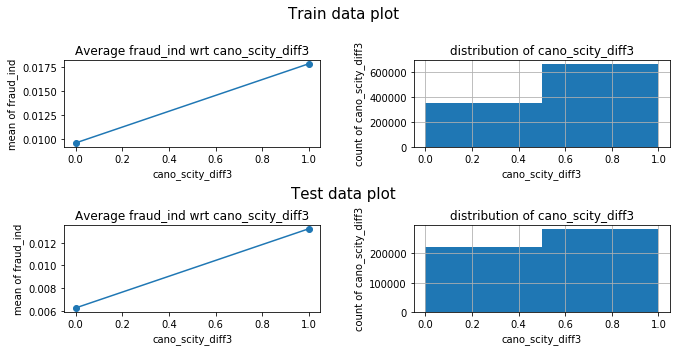

cano_csmcu_diff1


<Figure size 432x288 with 0 Axes>

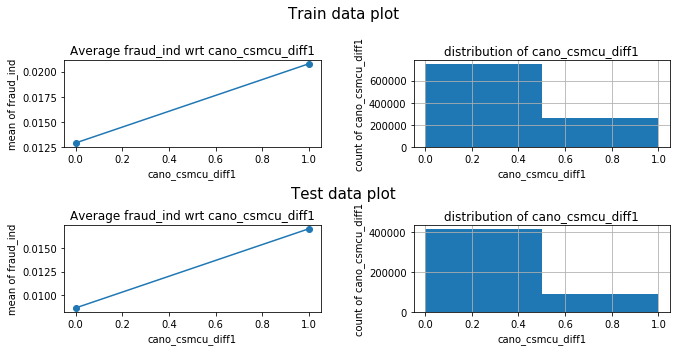

cano_csmcu_diff2


<Figure size 432x288 with 0 Axes>

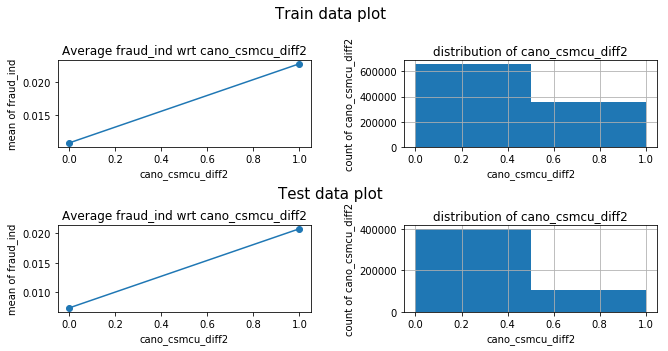

cano_csmcu_diff3


<Figure size 432x288 with 0 Axes>

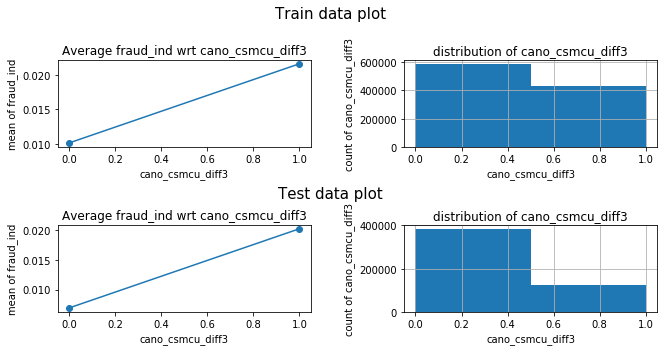

pca2_feature_1


<Figure size 432x288 with 0 Axes>

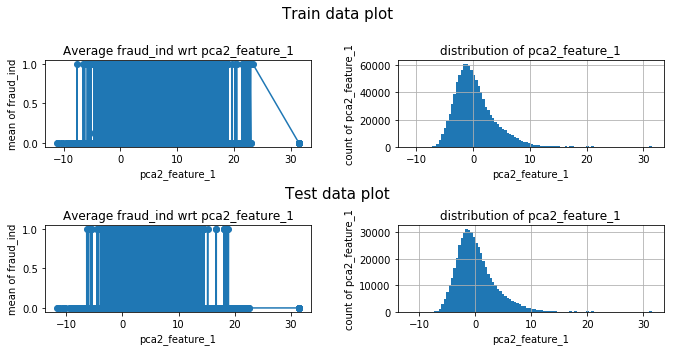

pca2_feature_2


<Figure size 432x288 with 0 Axes>

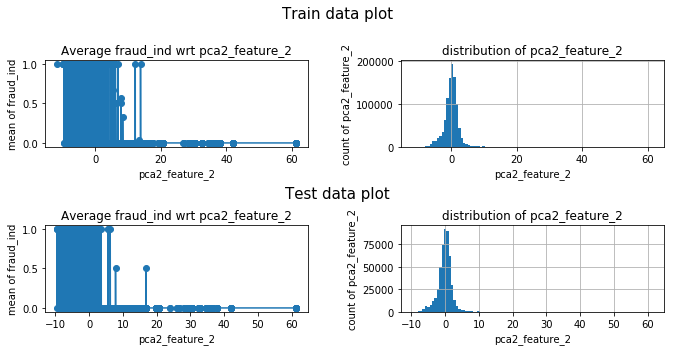

pca3_feature_1


<Figure size 432x288 with 0 Axes>

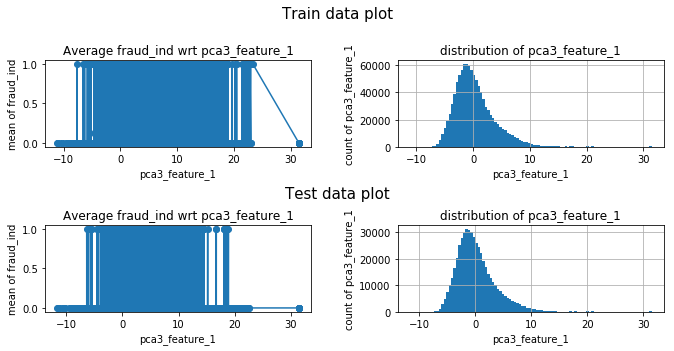

pca3_feature_2


<Figure size 432x288 with 0 Axes>

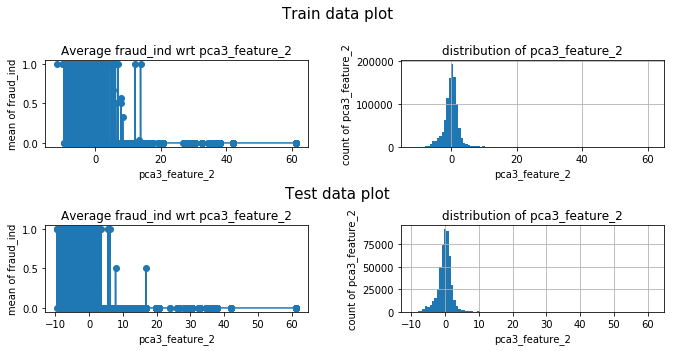

pca3_feature_3


<Figure size 432x288 with 0 Axes>

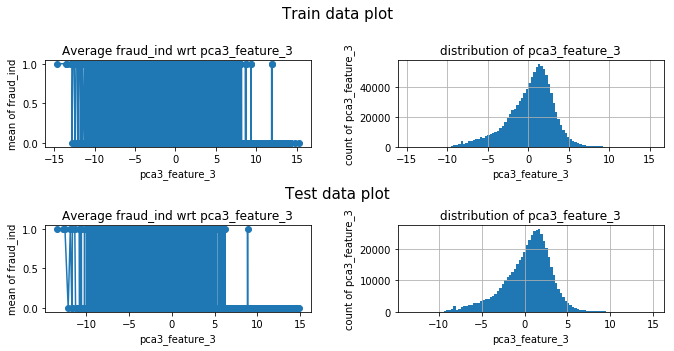

isolationtree_all_feature


<Figure size 432x288 with 0 Axes>

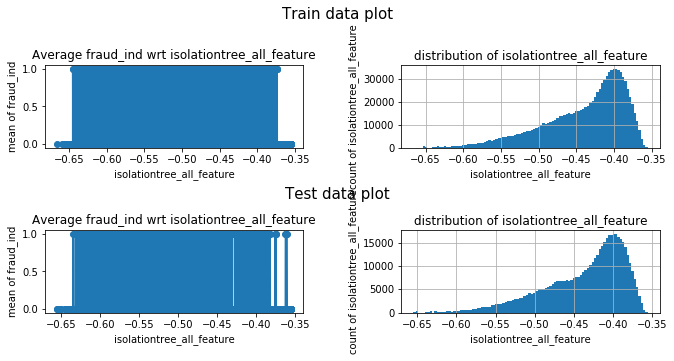

isolationtree_all_feature2


<Figure size 432x288 with 0 Axes>

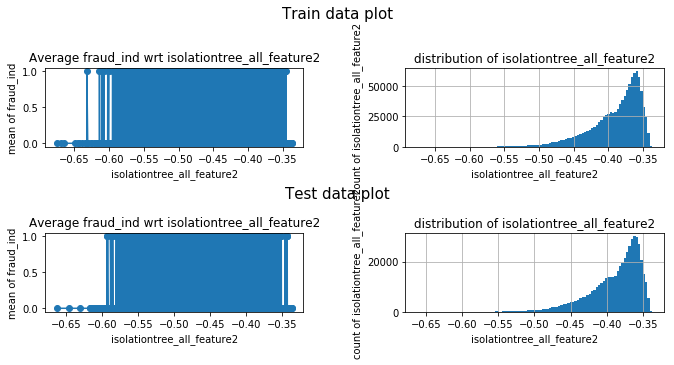

isolationtree_all_feature3


<Figure size 432x288 with 0 Axes>

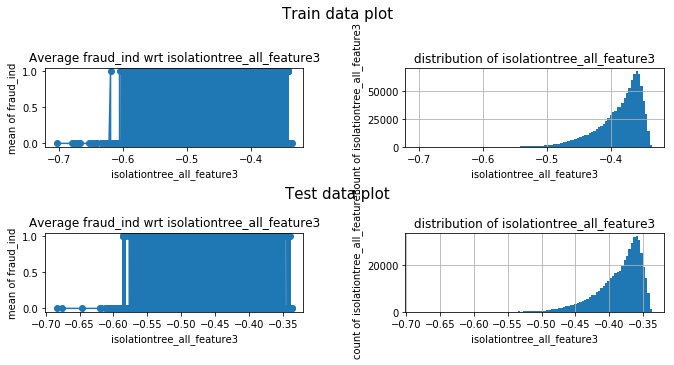

isolationtree_all_feature4


<Figure size 432x288 with 0 Axes>

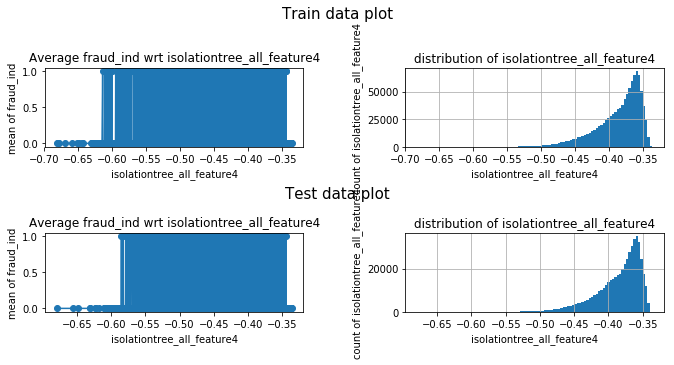

kmeans_all_feature


<Figure size 432x288 with 0 Axes>

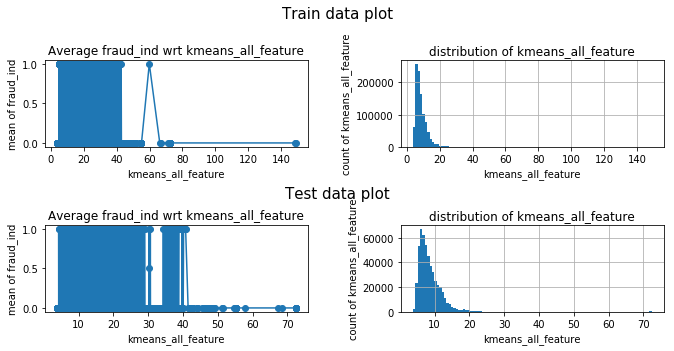

kmeans_all_feature2


<Figure size 432x288 with 0 Axes>

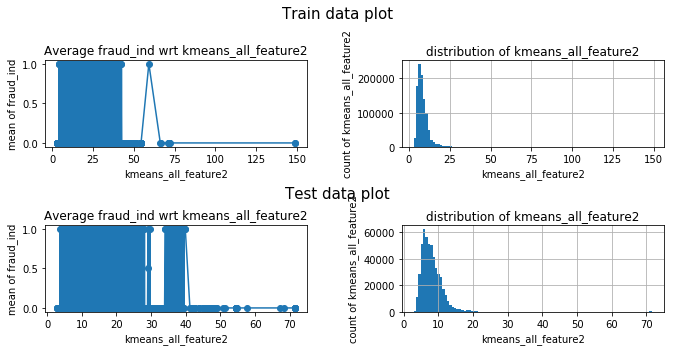

kmeans_all_feature3


<Figure size 432x288 with 0 Axes>

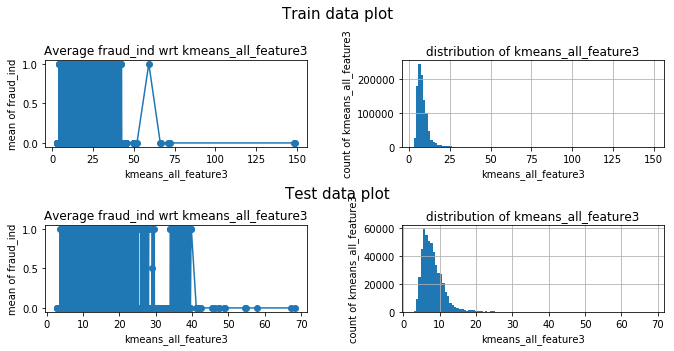

kmeans_all_feature4


<Figure size 432x288 with 0 Axes>

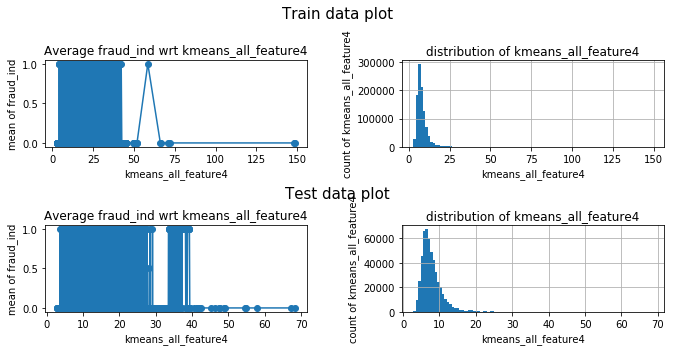

kmeans_all_feature5


<Figure size 432x288 with 0 Axes>

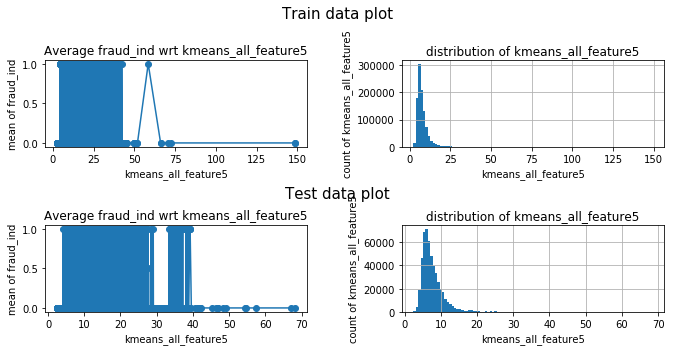

svm_rbf


<Figure size 432x288 with 0 Axes>

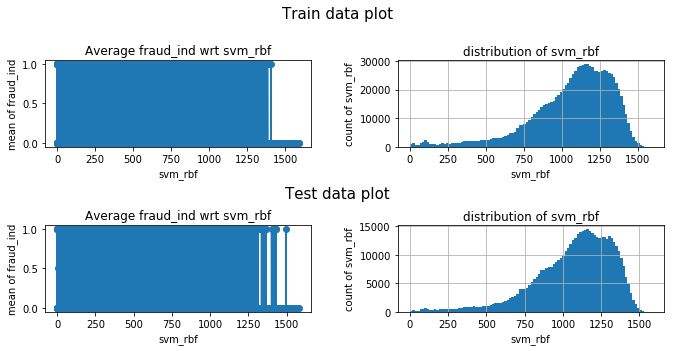

In [5]:
train_d = all_data[all_data['locdt']<=60]
valid_d = all_data[(all_data['locdt']>60)&(all_data['locdt']<=90)]
# 自己做的圖表function，畵資料分佈的bar chart和對fraud_ind的關係

for c in train_d.columns:
    analze_distribution(train_d,'fraud_ind',c,valid_d)


from featexp import get_univariate_plots
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['hcefg'], bins=100, data_test=valid_d)
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['loctm_hr'], bins=10, data_test=valid_d)
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['flg_3dsmk'], bins=10, data_test=valid_d)
# get_univariate_plots(data=train_d, target_col='fraud_ind', features_list=['csmcu'], bins=100, data_test=valid_d)

## 檢查train和test data的分佈有哪裡不一樣

acqic
nunique train 6051
nunique test 3748
max train 6884
max test 6884


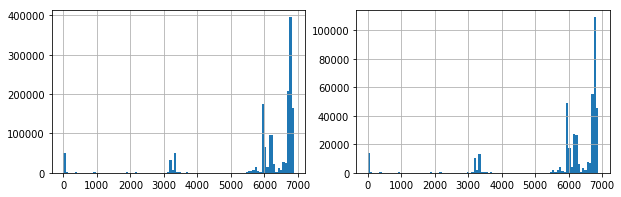

bacno
nunique train 95214
nunique test 71099
max train 163884
max test 163886


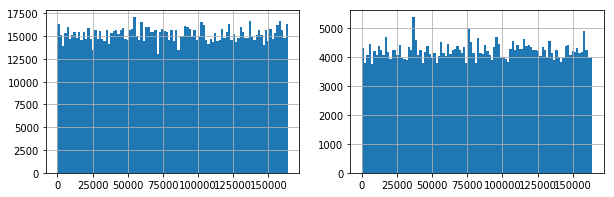

cano
nunique train 129413
nunique test 86808
max train 213334
max test 213575


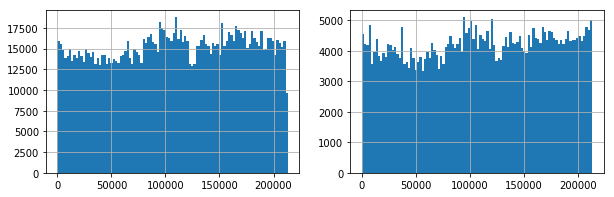

conam
nunique train 72961
nunique test 31977
max train 7208.77
max test 6728.97


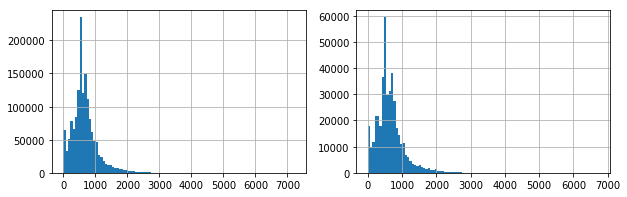

contp
nunique train 7
nunique test 7
max train 6
max test 6


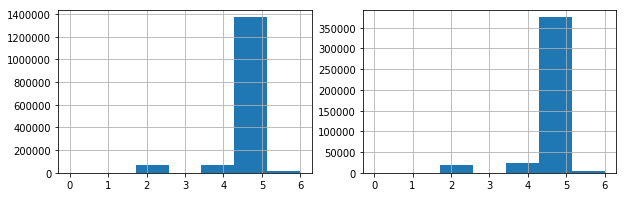

csmcu
nunique train 72
nunique test 57
max train 75
max test 75


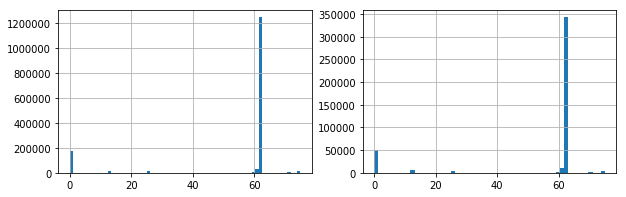

ecfg
nunique train 2
nunique test 2
max train 1
max test 1


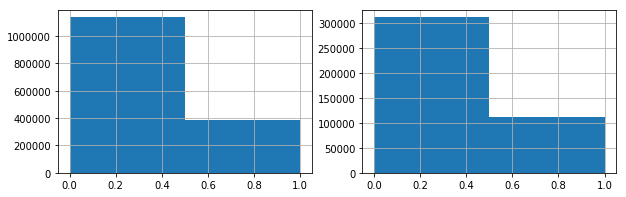

etymd
nunique train 11
nunique test 11
max train 10
max test 10


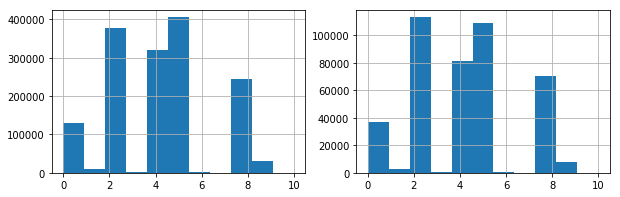

flbmk
nunique train 3
nunique test 3
max train 1.0
max test 1.0


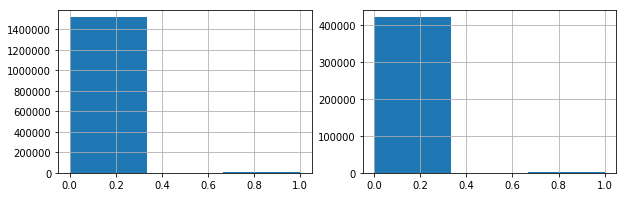

flg_3dsmk
nunique train 3
nunique test 3
max train 1.0
max test 1.0


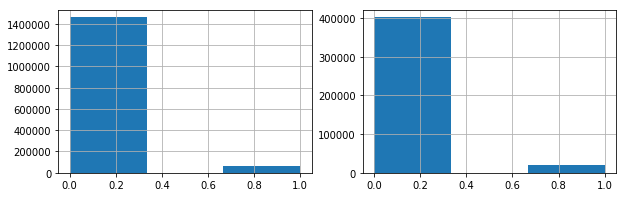

hcefg
nunique train 9
nunique test 10
max train 9
max test 9


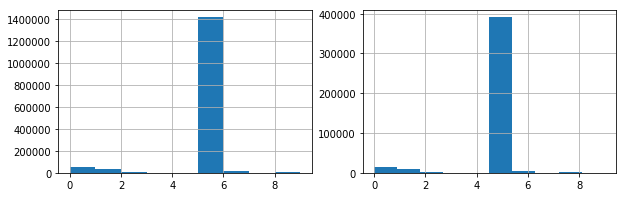

insfg
nunique train 2
nunique test 2
max train 1
max test 1


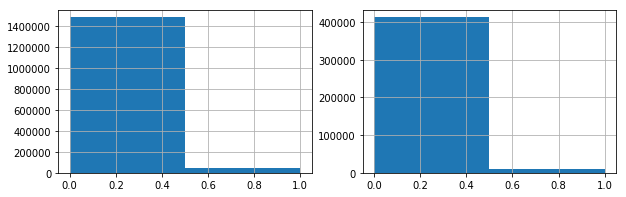

iterm
nunique train 9
nunique test 9
max train 8
max test 8


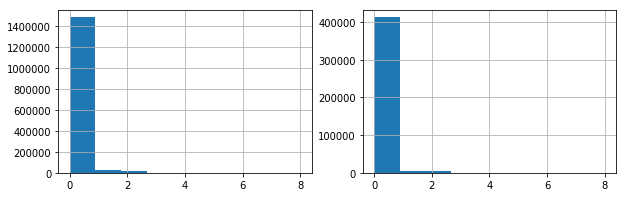

locdt
nunique train 90
nunique test 30
max train 90
max test 120


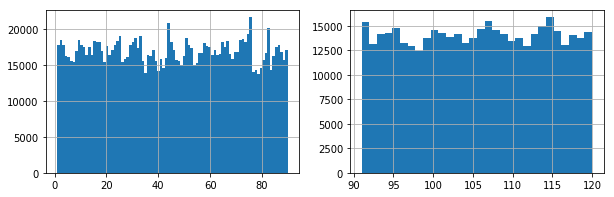

loctm
nunique train 84810
nunique test 75210
max train 235959
max test 235959


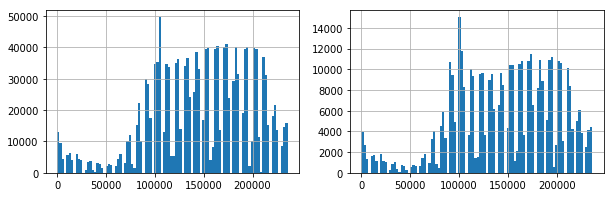

mcc
nunique train 434
nunique test 372
max train 459
max test 459


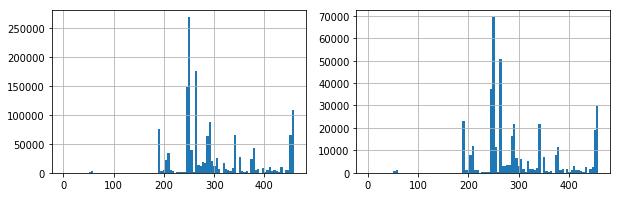

mchno
nunique train 89316
nunique test 45501
max train 103307
max test 103307


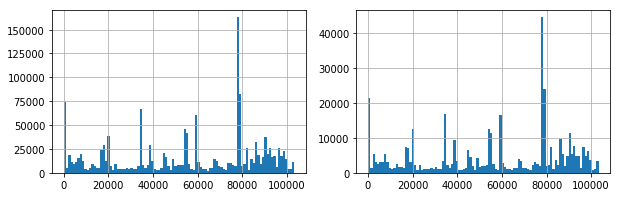

ovrlt
nunique train 2
nunique test 2
max train 1
max test 1


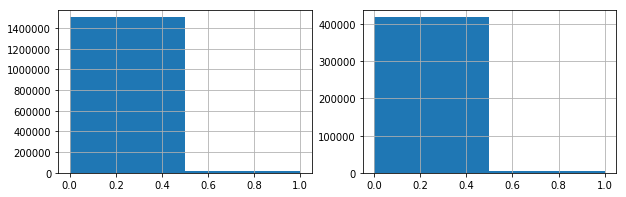

scity
nunique train 5698
nunique test 2857
max train 6671
max test 6670


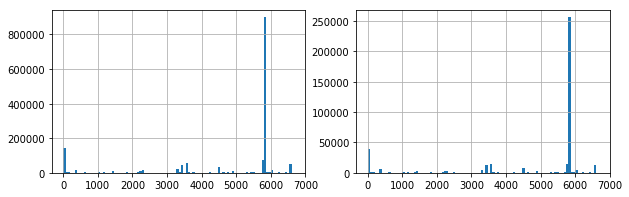

stocn
nunique train 103
nunique test 87
max train 107
max test 108


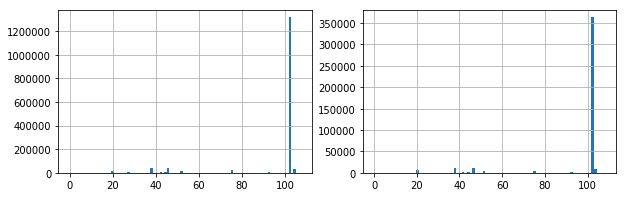

stscd
nunique train 5
nunique test 5
max train 4
max test 4


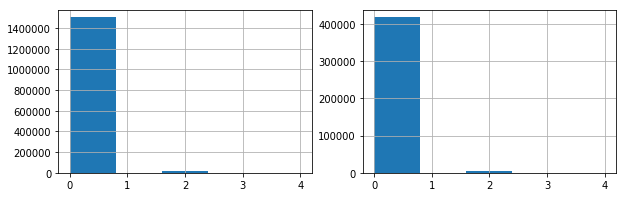

txkey
nunique train 1521787
nunique test 421665
max train 1958239
max test 1959018


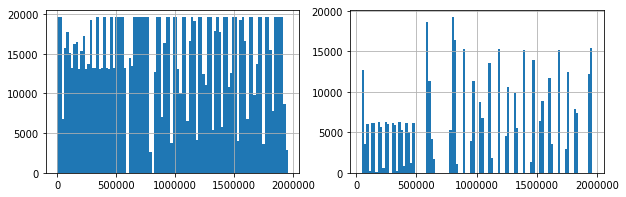

bacno_cano_nunique
nunique train 14
nunique test 13
max train 28
max test 15


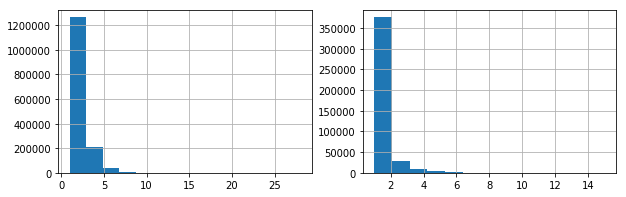

bacno_txkey_nunique
nunique train 268
nunique test 171
max train 1117
max test 983


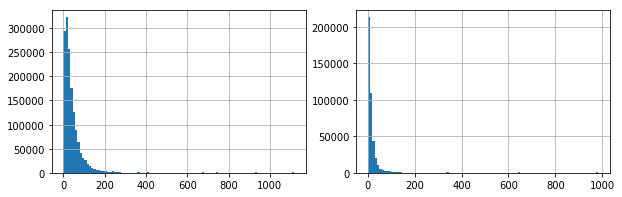

conam_log
nunique train 72961
nunique test 31977
max train 8.8833310206932
max test 8.814474543010734


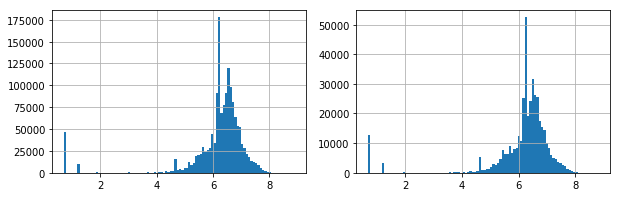

bacno_mean_conam
nunique train 88835
nunique test 58423
max train 8.814474543010734
max test 8.604932969723869


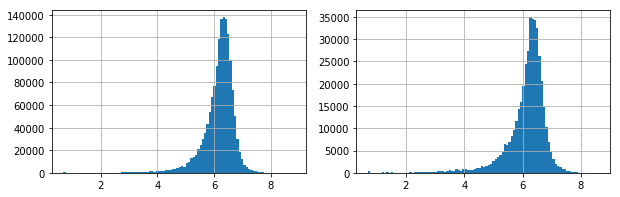

bacno_scale_conam
nunique train 1158913
nunique test 334804
max train 6.467199901131175
max test 6.0306240752530975


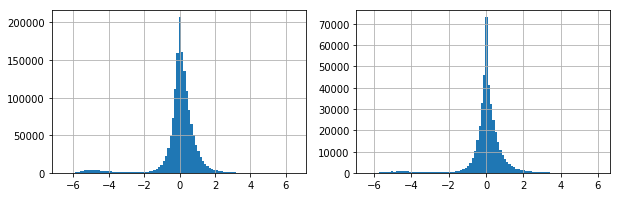

cano_mean_conam
nunique train 111373
nunique test 64011
max train 6728.97
max test 5456.52


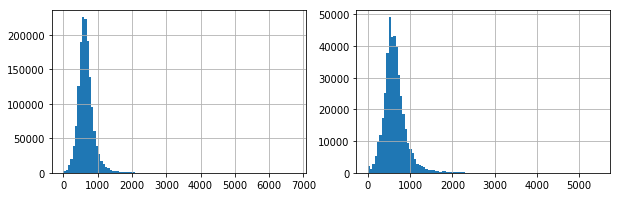

cano_scale_conam
nunique train 1138684
nunique test 318168
max train 5878.421034482759
max test 4572.242


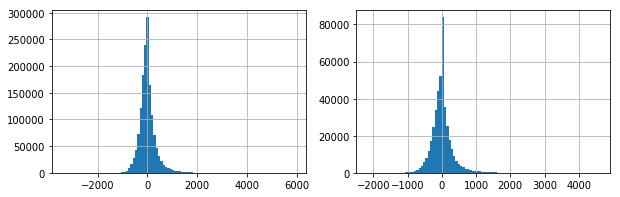

cano_conam_skew
nunique train 94471
nunique test 46405
max train 21.787801710032376
max test 8.452604904428956


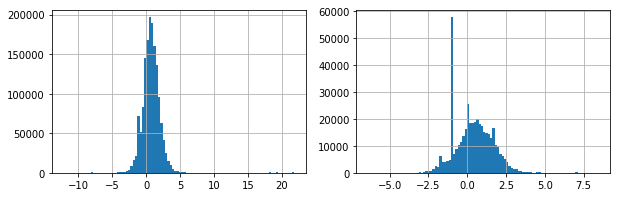

cano_conam_kurt
nunique train 85902
nunique test 37925
max train 498.92018883033137
max test 112.90240921193308


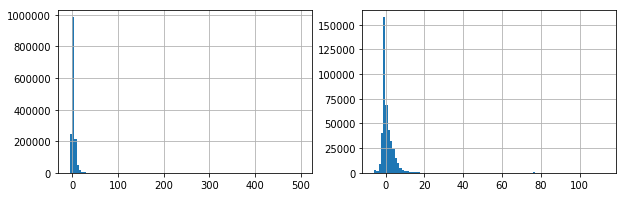

cano_conam_mean
nunique train 111373
nunique test 64011
max train 6728.97
max test 5456.52


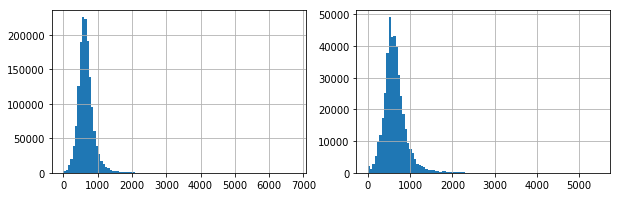

cano_conam_var
nunique train 106857
nunique test 59387
max train 22630233.60405
max test 9001736.651250001


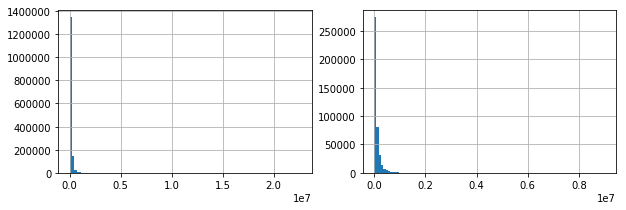

bacno_max_conam
nunique train 26836
nunique test 16881
max train 7208.77
max test 6728.97


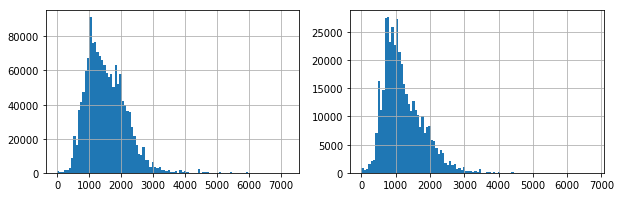

bacno_ismax_conam
nunique train 2
nunique test 2
max train 1
max test 1


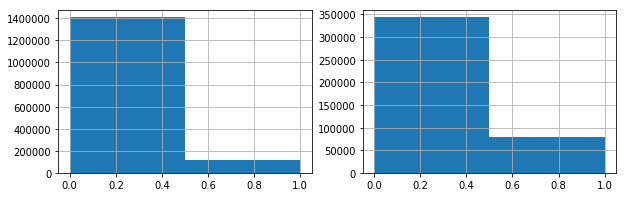

bacno_min_conam
nunique train 7345
nunique test 6886
max train 6728.97
max test 5456.52


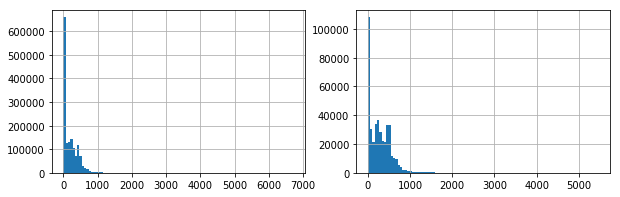

bacno_ismin_conam
nunique train 2
nunique test 2
max train 1
max test 1


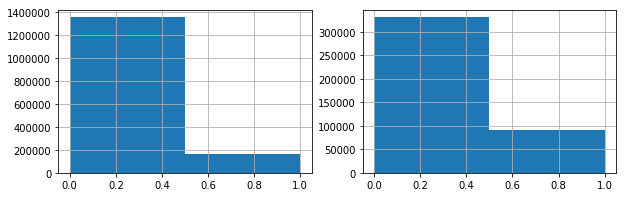

bacno_ratio_ecfg
nunique train 2419
nunique test 945
max train 1.0
max test 1.0


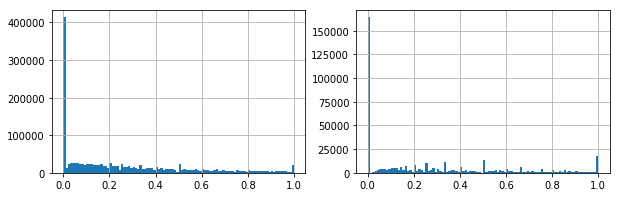

cano_ratio_ecfg
nunique train 1943
nunique test 789
max train 1.0
max test 1.0


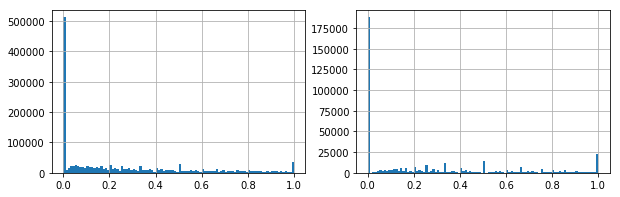

locdt_week
nunique train 7
nunique test 7
max train 7
max test 7


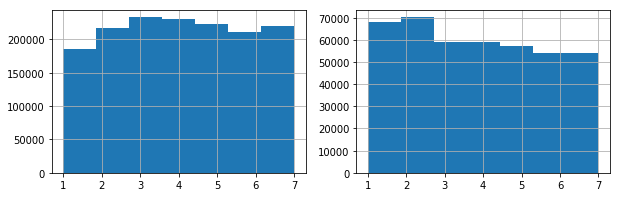

loctm_hr
nunique train 24
nunique test 24
max train 23
max test 23


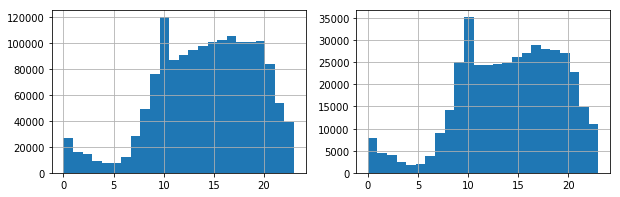

bacno_locdt_skew
nunique train 74170
nunique test 32808
max train 7.937253933193687
max test 4.720965167858198


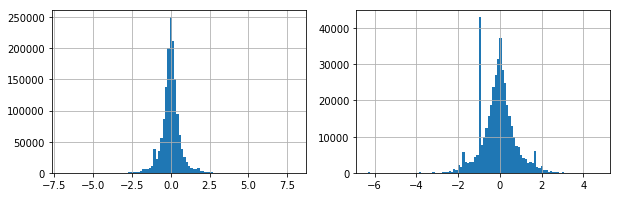

bacno_locdt_kurt
nunique train 71475
nunique test 31350
max train 62.999999999999076
max test 41.06840649002047


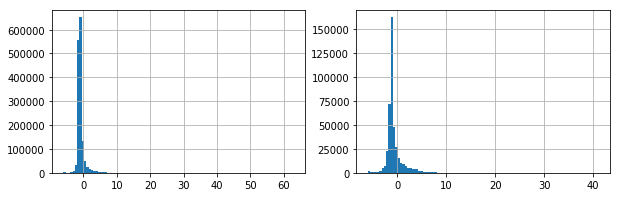

cano_locdt_skew
nunique train 88487
nunique test 33224
max train 8.000000000000002
max test 4.720965167858198


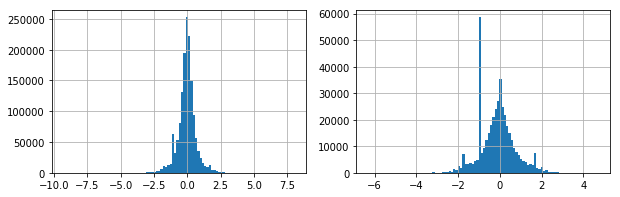

cano_locdt_kurt
nunique train 84848
nunique test 31557
max train 85.99999999999994
max test 41.06840649002047


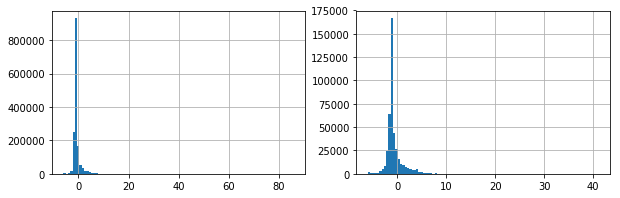

bacno_stocn_mode
nunique train 62
nunique test 61
max train 107
max test 108


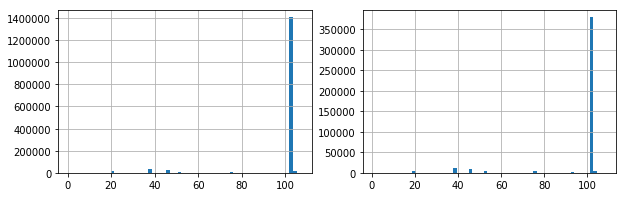

bacno_scity_mode
nunique train 765
nunique test 847
max train 6640
max test 6644


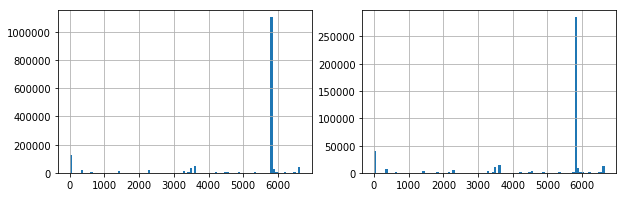

bacno_csmcu_mode
nunique train 42
nunique test 42
max train 75
max test 75


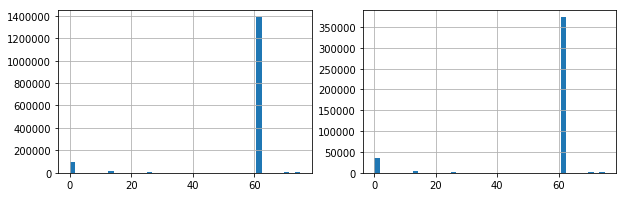

bacno_stocn_ismode
nunique train 2
nunique test 2
max train 1
max test 1


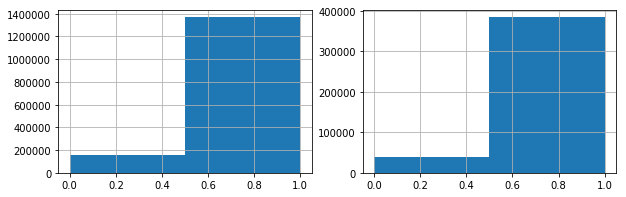

bacno_scity_ismode
nunique train 2
nunique test 2
max train 1
max test 1


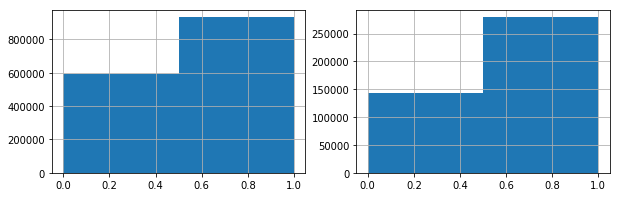

bacno_csmcu_ismode
nunique train 2
nunique test 2
max train 1
max test 1


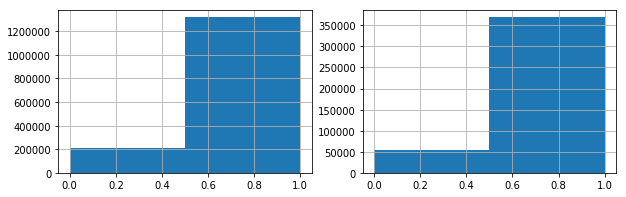

cano_stocn_mode
nunique train 69
nunique test 69
max train 107
max test 108


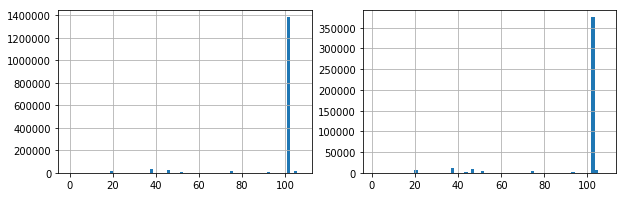

cano_scity_mode
nunique train 1212
nunique test 1035
max train 6665
max test 6644


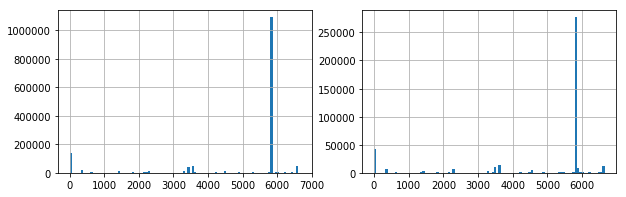

cano_csmcu_mode
nunique train 45
nunique test 43
max train 75
max test 75


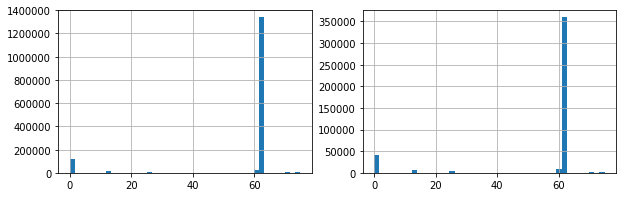

cano_stocn_ismode
nunique train 2
nunique test 2
max train 1
max test 1


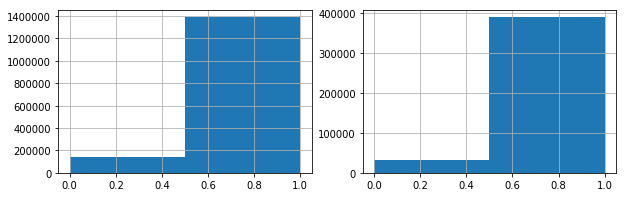

cano_scity_ismode
nunique train 2
nunique test 2
max train 1
max test 1


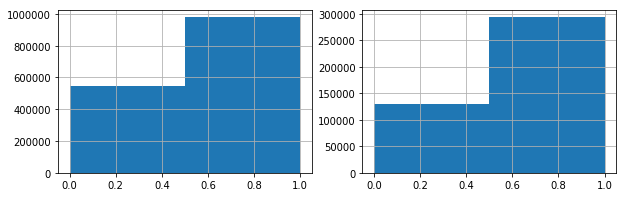

cano_csmcu_ismode
nunique train 2
nunique test 2
max train 1
max test 1


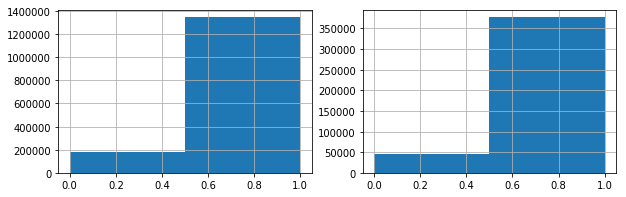

mchno_fraud_mean
nunique train 207
nunique test 163
max train 1.0
max test 1.0


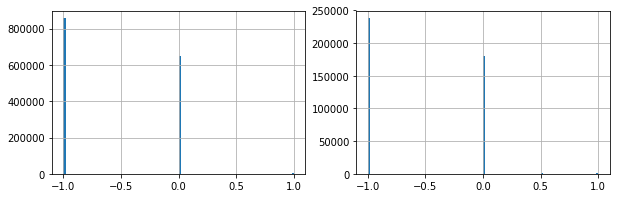

mcc_fraud_mean
nunique train 96
nunique test 79
max train 1.0
max test 1.0


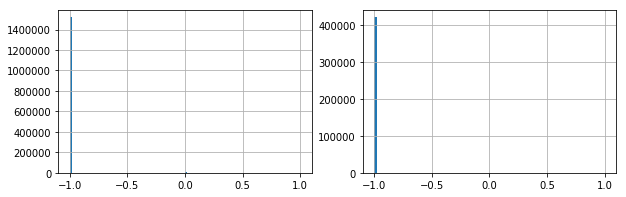

acqic_fraud_mean
nunique train 181
nunique test 141
max train 1.0
max test 1.0


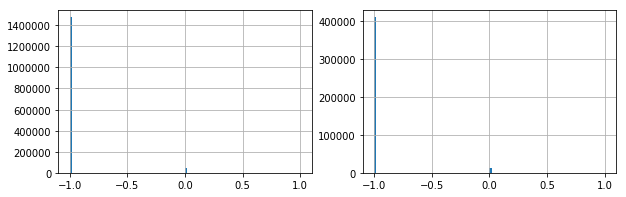

mchno_bacno_nunique
nunique train 580
nunique test 577
max train 20040
max test 20040


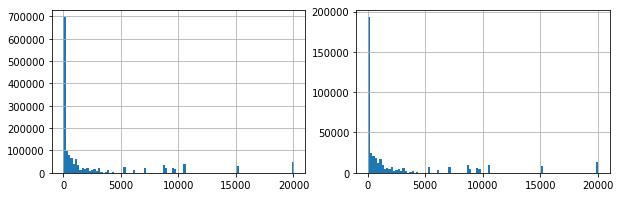

acqic_bacno_nunique
nunique train 259
nunique test 258
max train 74622
max test 74622


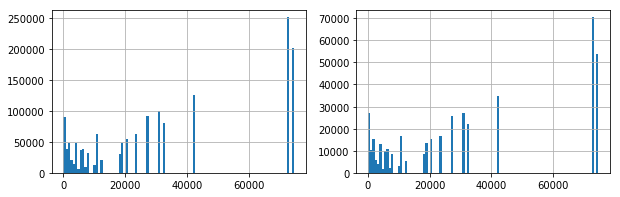

mcc_bacno_nunique
nunique train 215
nunique test 214
max train 62397
max test 62397


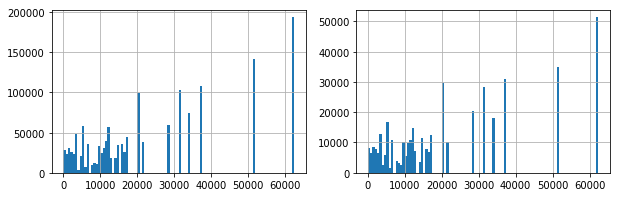

stocn_bacno_nunique
nunique train 60
nunique test 60
max train 159388
max test 159388


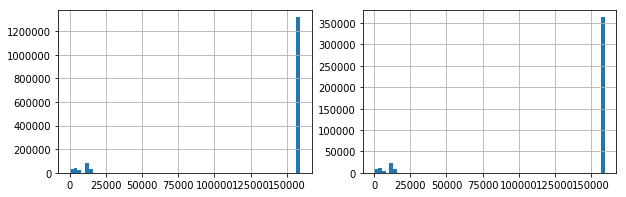

scity_bacno_nunique
nunique train 248
nunique test 247
max train 130881
max test 130881


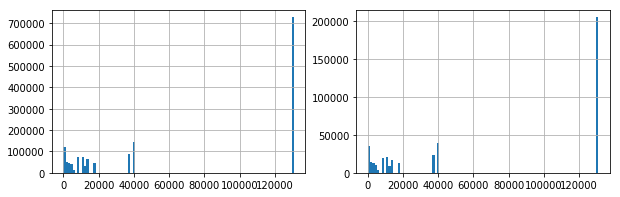

csmcu_bacno_nunique
nunique train 46
nunique test 44
max train 155199
max test 155199


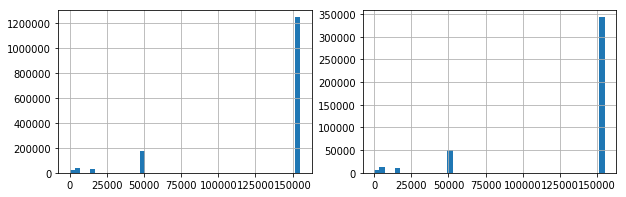

mchno_cano_nunique
nunique train 589
nunique test 585
max train 20869
max test 20869


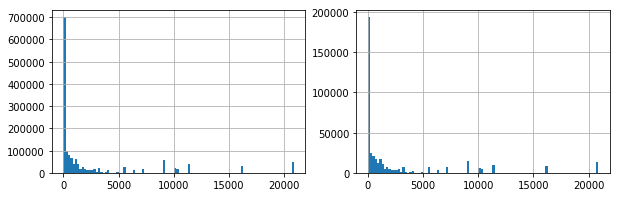

acqic_cano_nunique
nunique train 253
nunique test 251
max train 84353
max test 84353


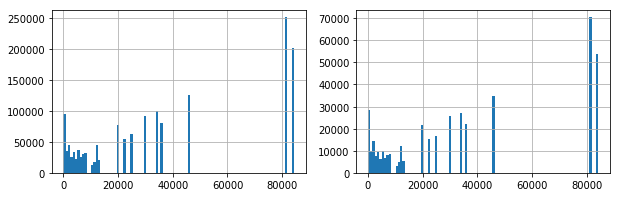

mcc_cano_nunique
nunique train 217
nunique test 217
max train 68408
max test 68408


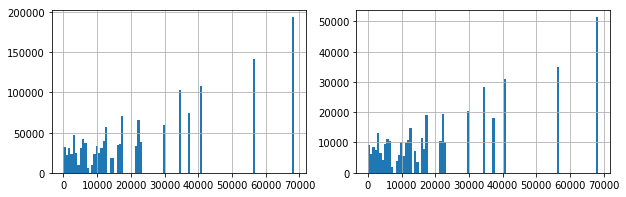

stocn_cano_nunique
nunique train 66
nunique test 66
max train 204341
max test 204341


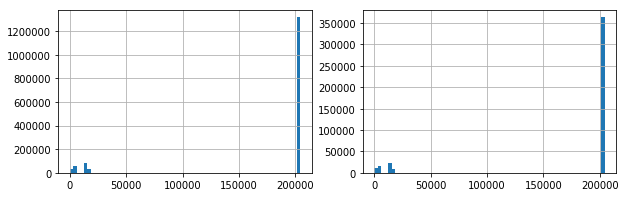

scity_cano_nunique
nunique train 246
nunique test 245
max train 160204
max test 160204


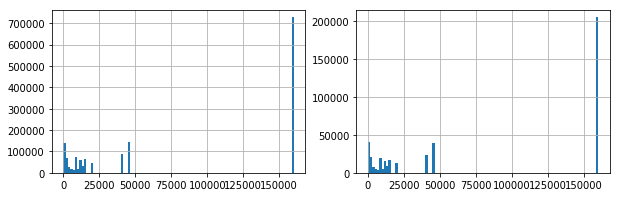

csmcu_cano_nunique
nunique train 44
nunique test 42
max train 195799
max test 195799


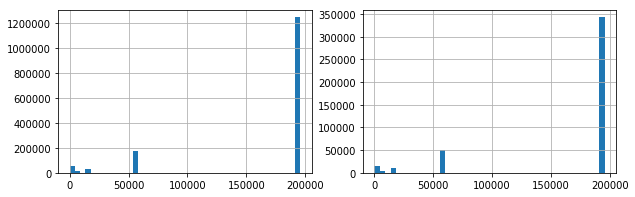

mchno_value_counts_all
nunique train 780
nunique test 772
max train 63719
max test 63719


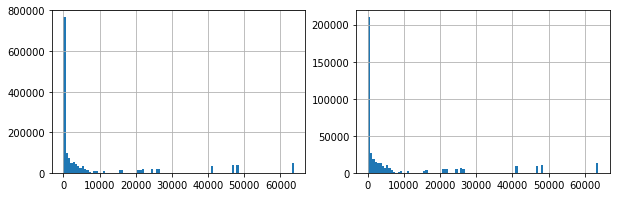

acqic_value_counts_all
nunique train 315
nunique test 313
max train 321217
max test 321217


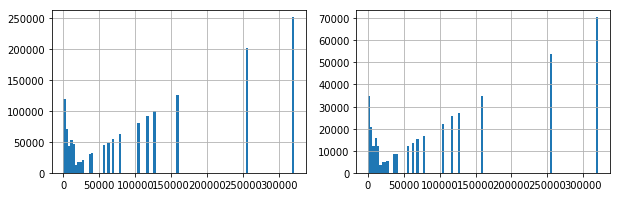

mcc_value_counts_all
nunique train 231
nunique test 231
max train 244585
max test 244585


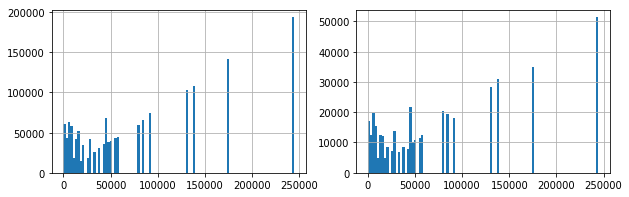

stocn_value_counts_all
nunique train 75
nunique test 73
max train 1676085
max test 1676085


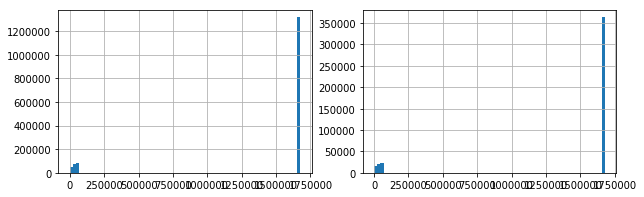

scity_value_counts_all
nunique train 309
nunique test 307
max train 930790
max test 930790


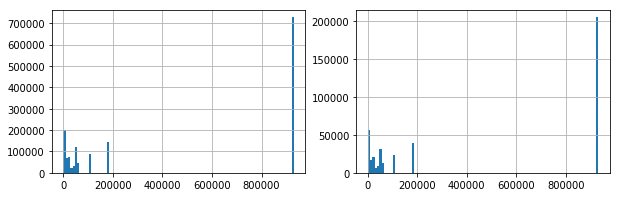

csmcu_value_counts_all
nunique train 56
nunique test 54
max train 1588534
max test 1588534


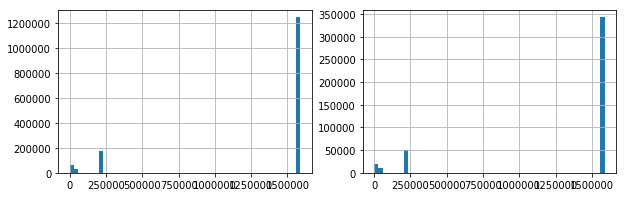

bacno_stocn_nunique
nunique train 18
nunique test 14
max train 24
max test 19


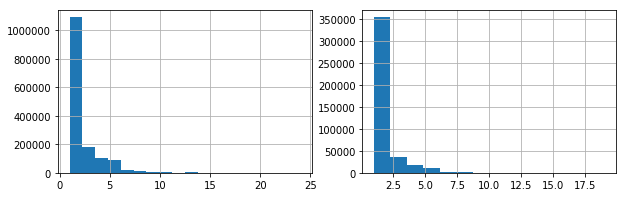

stocn_value_counts
nunique train 227
nunique test 152
max train 1117
max test 983


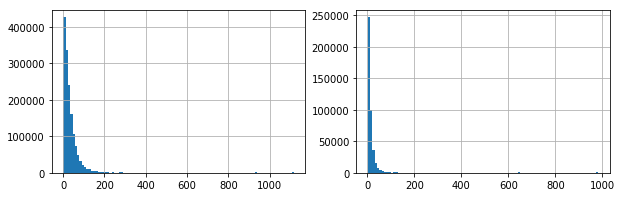

stocn_ratio
nunique train 3440
nunique test 1295
max train 1.0
max test 1.0


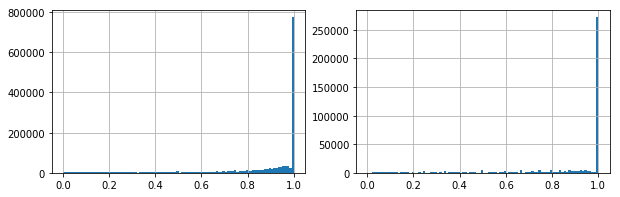

bacno_csmcu_nunique
nunique train 15
nunique test 11
max train 16
max test 11


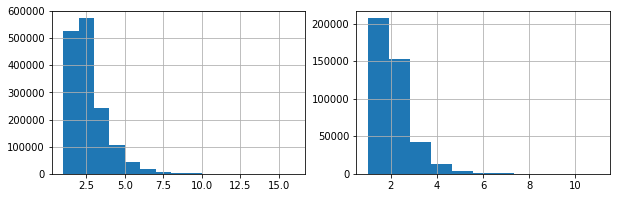

csmcu_value_counts
nunique train 237
nunique test 155
max train 1111
max test 983


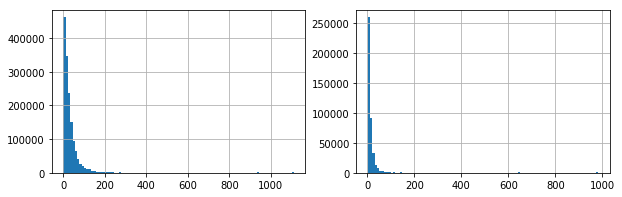

csmcu_ratio
nunique train 3578
nunique test 1308
max train 1.0
max test 1.0


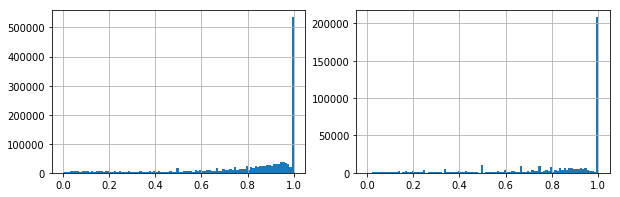

bacno_mchno_nunique
nunique train 123
nunique test 83
max train 202
max test 174


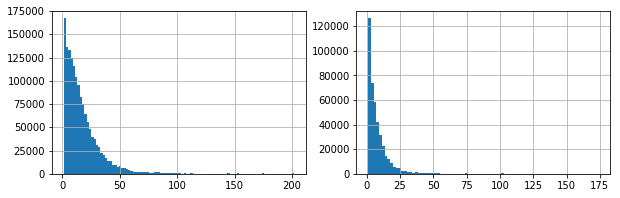

mchno_value_counts
nunique train 170
nunique test 97
max train 1111
max test 901


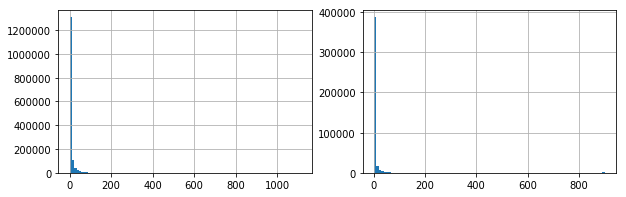

mchno_ratio
nunique train 3565
nunique test 1466
max train 1.0
max test 1.0


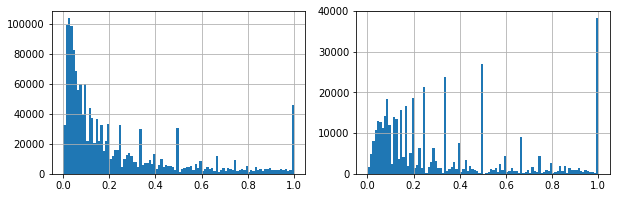

bacno_acqic_nunique
nunique train 55
nunique test 39
max train 73
max test 49


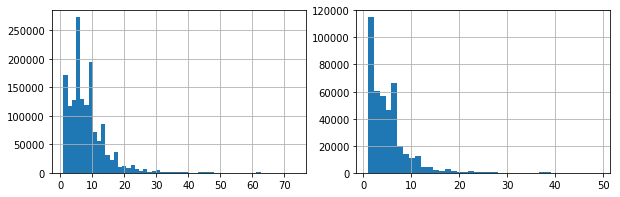

acqic_value_counts
nunique train 178
nunique test 104
max train 1111
max test 901


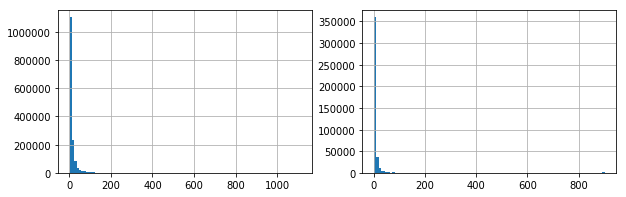

acqic_ratio
nunique train 4137
nunique test 1698
max train 1.0
max test 1.0


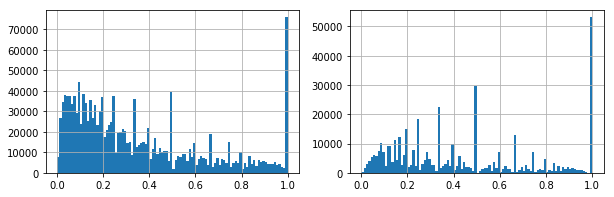

bacno_mcc_nunique
nunique train 55
nunique test 46
max train 63
max test 53


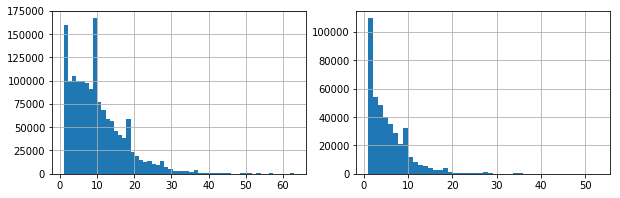

mcc_value_counts
nunique train 181
nunique test 108
max train 1111
max test 901


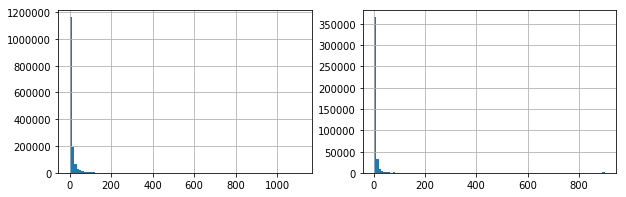

mcc_ratio
nunique train 4013
nunique test 1669
max train 1.0
max test 1.0


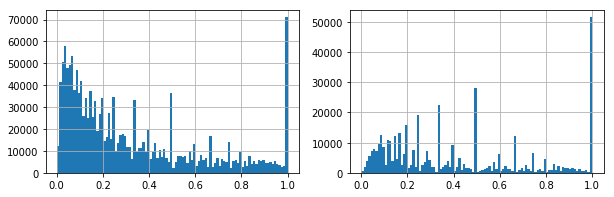

bacno_scity_nunique
nunique train 65
nunique test 38
max train 111
max test 69


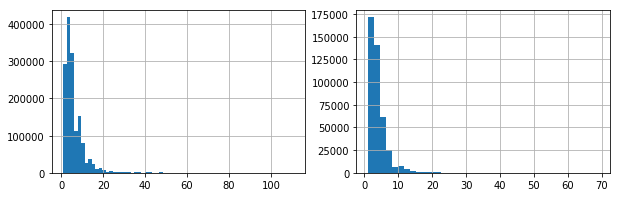

scity_value_counts
nunique train 196
nunique test 117
max train 1116
max test 983


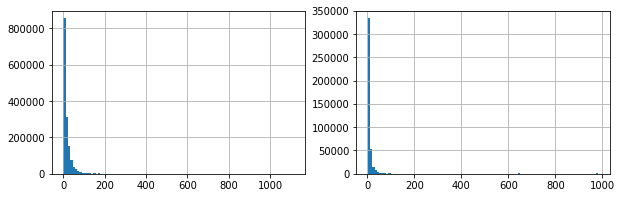

scity_ratio
nunique train 4292
nunique test 1690
max train 1.0
max test 1.0


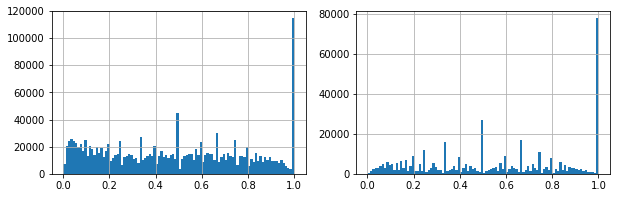

bacno_contp_nunique
nunique train 5
nunique test 4
max train 5
max test 4


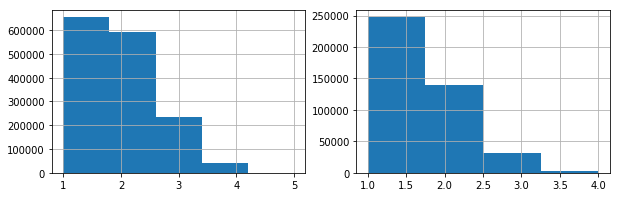

contp_value_counts
nunique train 254
nunique test 165
max train 1112
max test 983


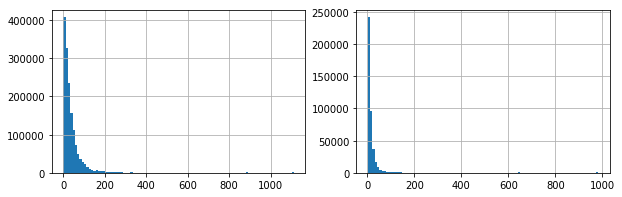

contp_ratio
nunique train 2687
nunique test 1037
max train 1.0
max test 1.0


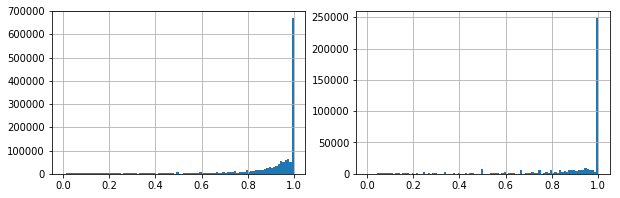

bacno_etymd_nunique
nunique train 9
nunique test 8
max train 9
max test 8


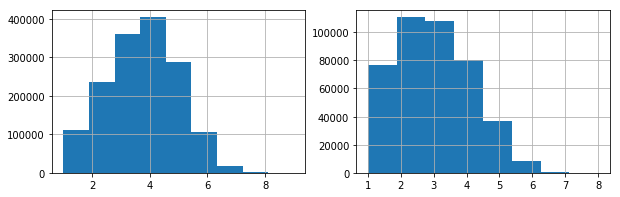

etymd_value_counts
nunique train 209
nunique test 124
max train 1116
max test 982


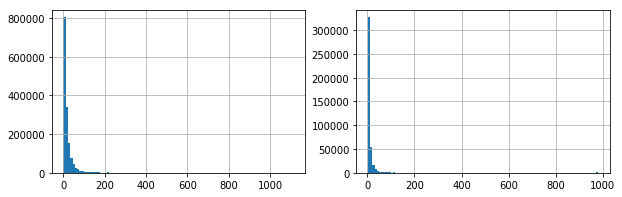

etymd_ratio
nunique train 4201
nunique test 1622
max train 1.0
max test 1.0


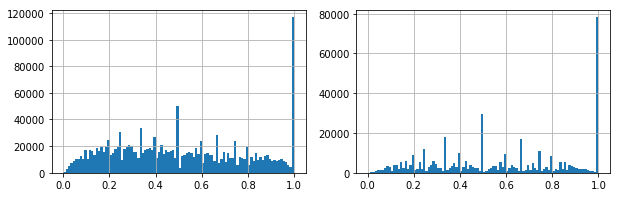

bacno_stscd_nunique
nunique train 3
nunique test 3
max train 3
max test 3


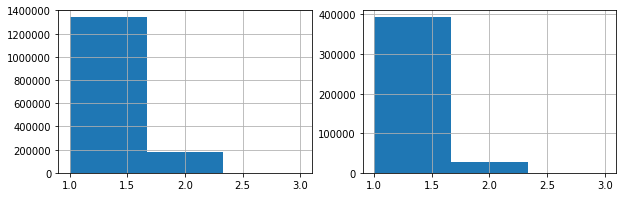

stscd_value_counts
nunique train 257
nunique test 165
max train 1117
max test 983


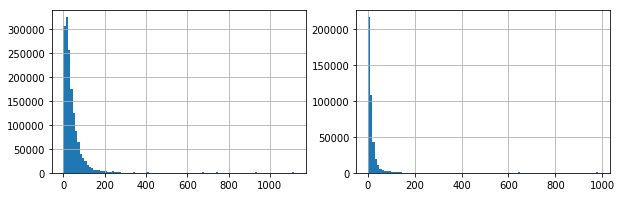

stscd_ratio
nunique train 1414
nunique test 505
max train 1.0
max test 1.0


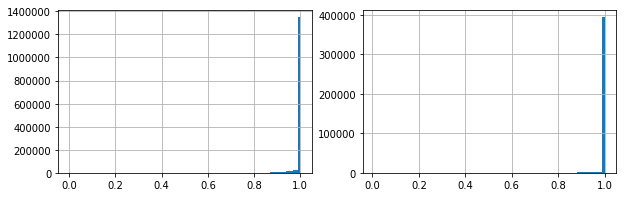

bacno_hcefg_nunique
nunique train 7
nunique test 6
max train 7
max test 6


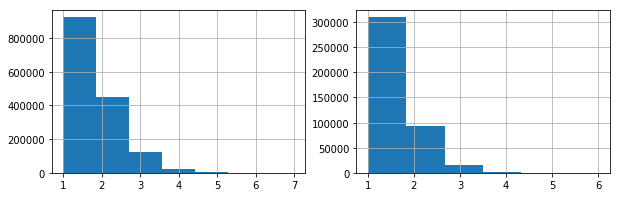

hcefg_value_counts
nunique train 256
nunique test 162
max train 1111
max test 983


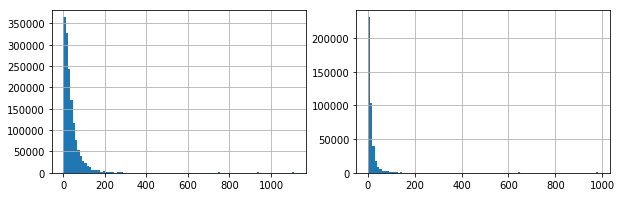

hcefg_ratio
nunique train 2508
nunique test 910
max train 1.0
max test 1.0


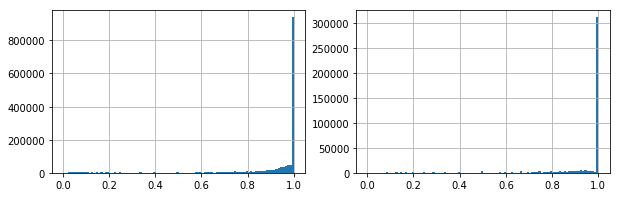

cano_txkey_nunique
nunique train 222
nunique test 143
max train 1117
max test 983


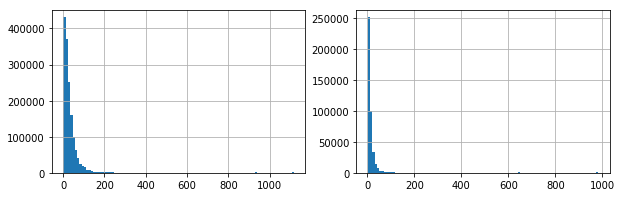

cano_stocn_nunique
nunique train 17
nunique test 13
max train 19
max test 19


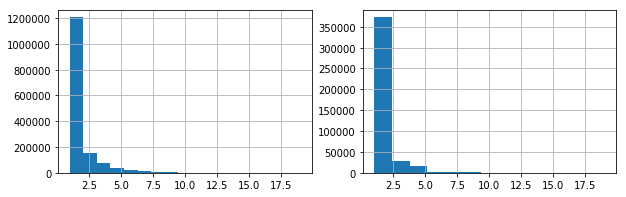

stocn_value_counts_cano
nunique train 206
nunique test 126
max train 1117
max test 983


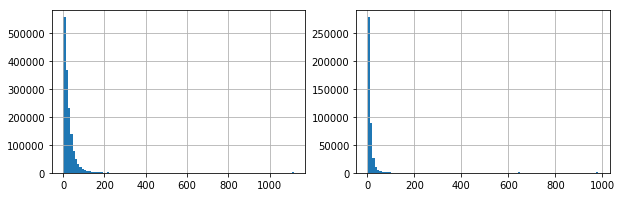

stocn_ratio_cano
nunique train 2502
nunique test 999
max train 1.0
max test 1.0


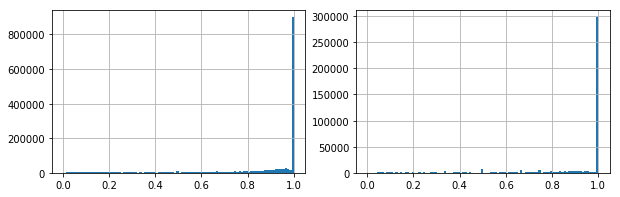

cano_csmcu_nunique
nunique train 14
nunique test 10
max train 14
max test 11


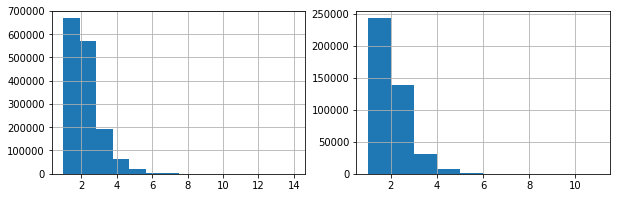

csmcu_value_counts_cano
nunique train 214
nunique test 128
max train 1111
max test 983


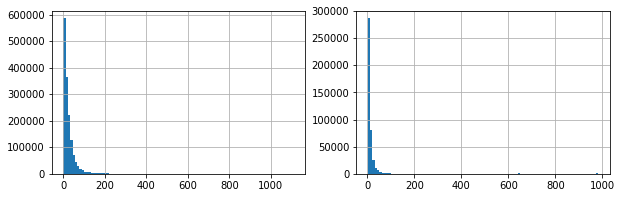

csmcu_ratio_cano
nunique train 2491
nunique test 1004
max train 1.0
max test 1.0


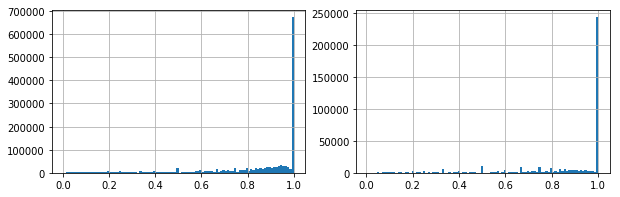

cano_mchno_nunique
nunique train 93
nunique test 68
max train 153
max test 102


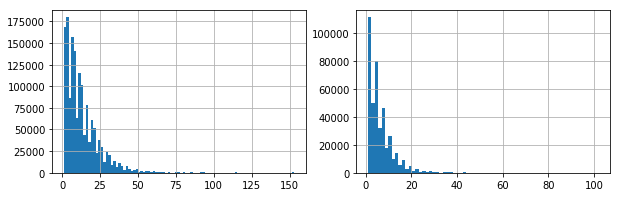

mchno_value_counts_cano
nunique train 160
nunique test 95
max train 1111
max test 901


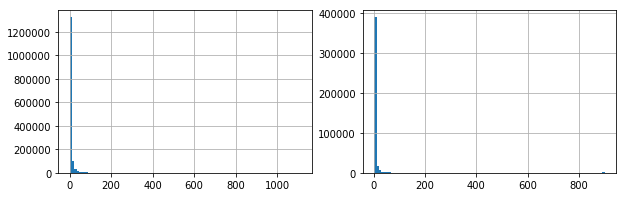

mchno_ratio_cano
nunique train 2817
nunique test 1177
max train 1.0
max test 1.0


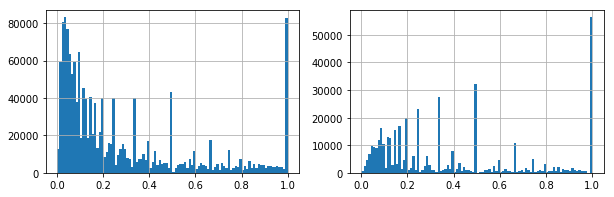

cano_acqic_nunique
nunique train 45
nunique test 31
max train 47
max test 45


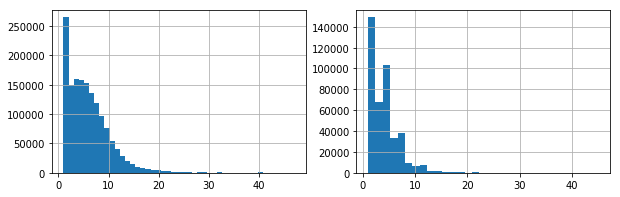

acqic_value_counts_cano
nunique train 175
nunique test 103
max train 1111
max test 901


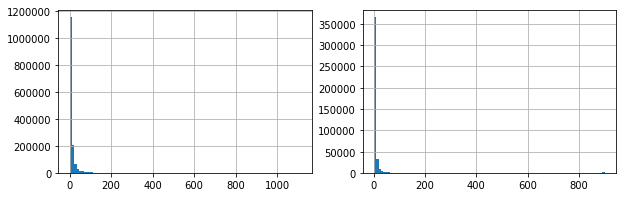

acqic_ratio_cano
nunique train 3190
nunique test 1352
max train 1.0
max test 1.0


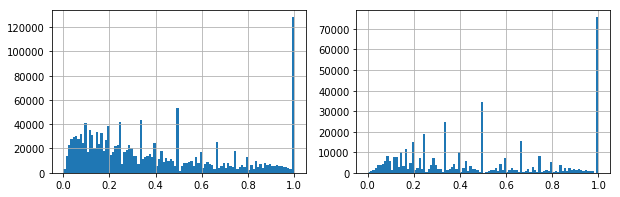

cano_mcc_nunique
nunique train 47
nunique test 35
max train 54
max test 42


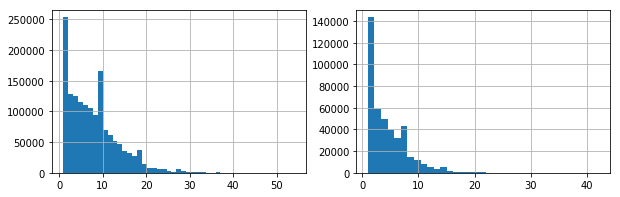

mcc_value_counts_cano
nunique train 181
nunique test 101
max train 1111
max test 901


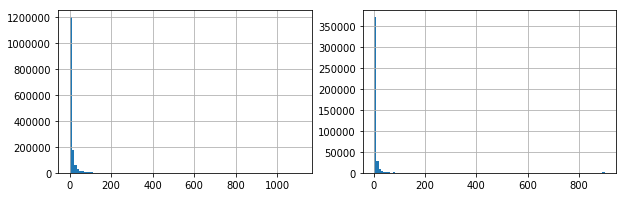

mcc_ratio_cano
nunique train 3059
nunique test 1322
max train 1.0
max test 1.0


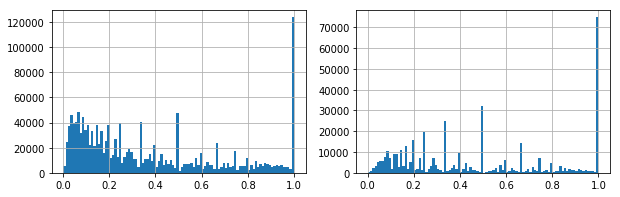

cano_scity_nunique
nunique train 55
nunique test 31
max train 77
max test 62


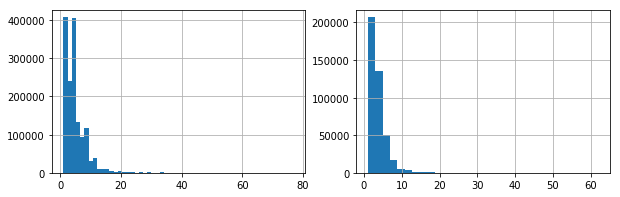

scity_value_counts_cano
nunique train 184
nunique test 105
max train 1116
max test 983


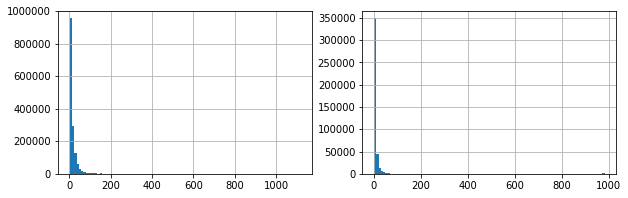

scity_ratio_cano
nunique train 3208
nunique test 1331
max train 1.0
max test 1.0


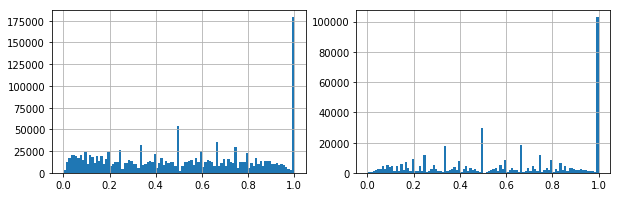

cano_contp_nunique
nunique train 5
nunique test 4
max train 5
max test 4


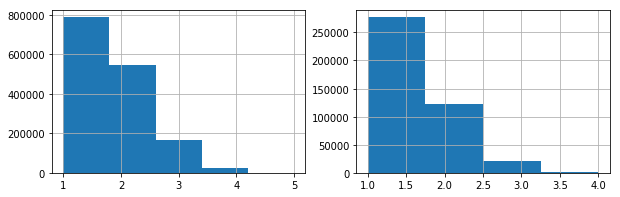

contp_value_counts_cano
nunique train 214
nunique test 137
max train 1112
max test 983


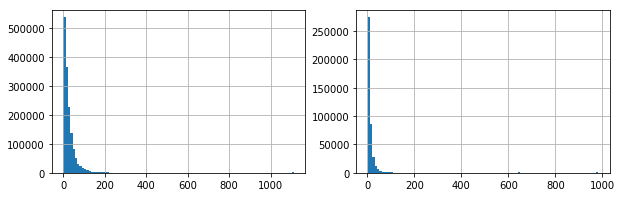

contp_ratio_cano
nunique train 2006
nunique test 793
max train 1.0
max test 1.0


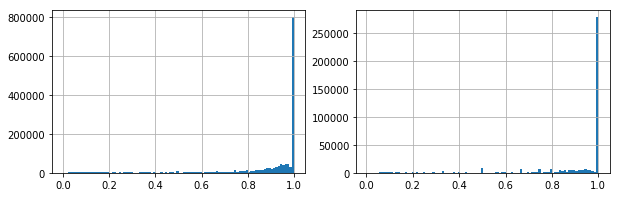

cano_etymd_nunique
nunique train 8
nunique test 7
max train 8
max test 7


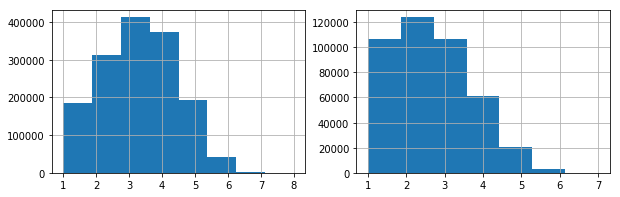

etymd_value_counts_cano
nunique train 194
nunique test 117
max train 1116
max test 982


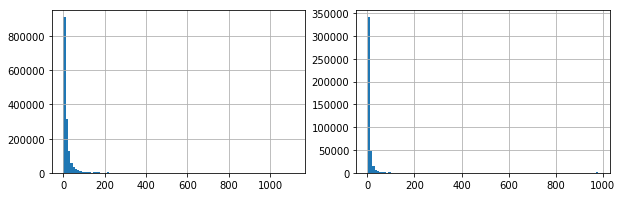

etymd_ratio_cano
nunique train 3101
nunique test 1289
max train 1.0
max test 1.0


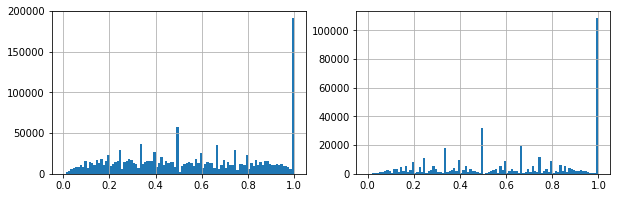

cano_stscd_nunique
nunique train 3
nunique test 3
max train 3
max test 3


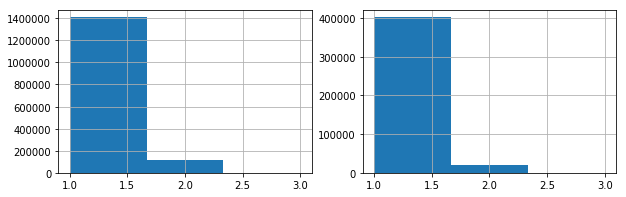

stscd_value_counts_cano
nunique train 226
nunique test 138
max train 1117
max test 983


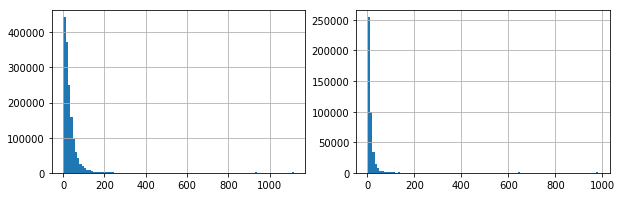

stscd_ratio_cano
nunique train 1119
nunique test 387
max train 1.0
max test 1.0


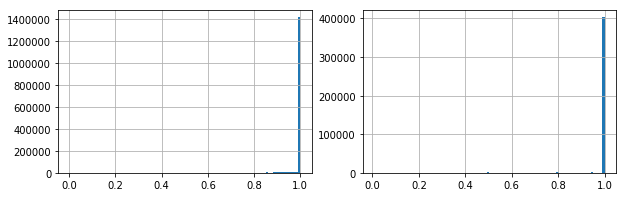

cano_hcefg_nunique
nunique train 5
nunique test 5
max train 5
max test 5


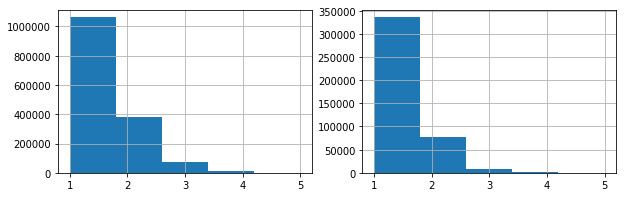

hcefg_value_counts_cano
nunique train 219
nunique test 136
max train 1111
max test 983


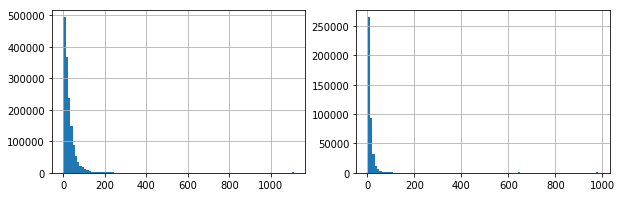

hcefg_ratio_cano
nunique train 1819
nunique test 698
max train 1.0
max test 1.0


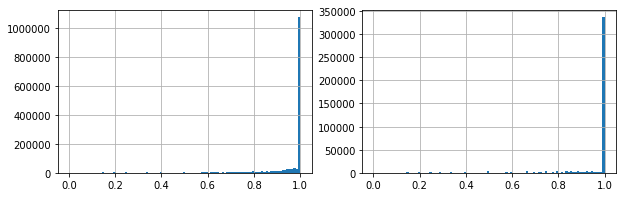

cano_only_consecutive_stscd2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


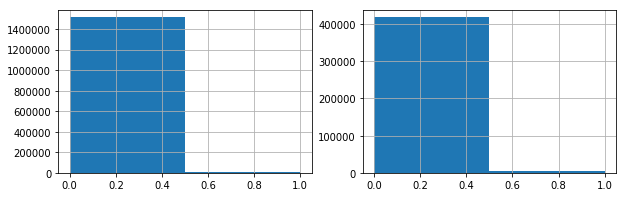

bacno_consecutive_and_only_ecfg
nunique train 2
nunique test 2
max train 1.0
max test 1.0


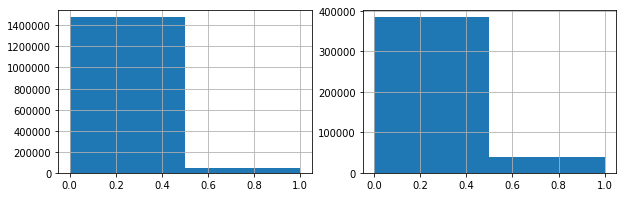

cano_lastday_use
nunique train 2
nunique test 2
max train 1
max test 1


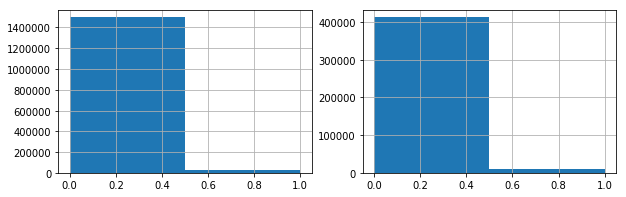

cano_lastday_use_twokind
nunique train 2
nunique test 2
max train 1.0
max test 1.0


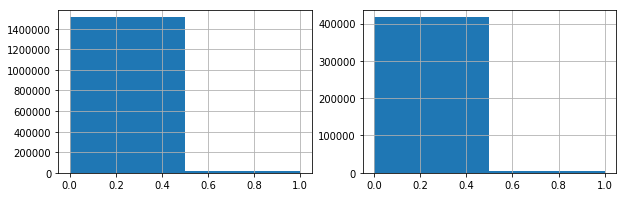

cano_lastlocdt
nunique train 2
nunique test 2
max train 1.0
max test 1.0


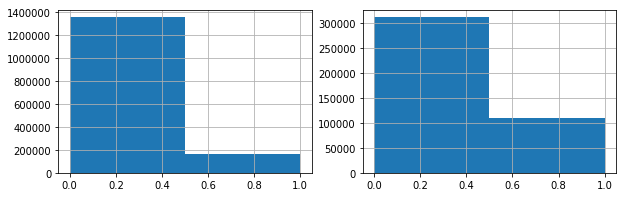

bacno_lastlocdt
nunique train 2
nunique test 2
max train 1.0
max test 1.0


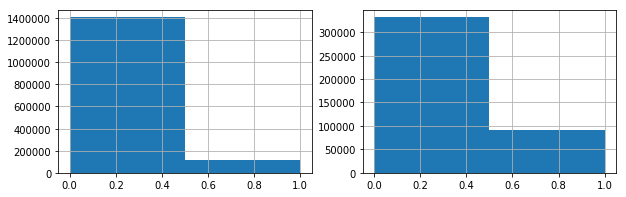

cano_lastlocdt2
nunique train 2
nunique test 2
max train 1
max test 1


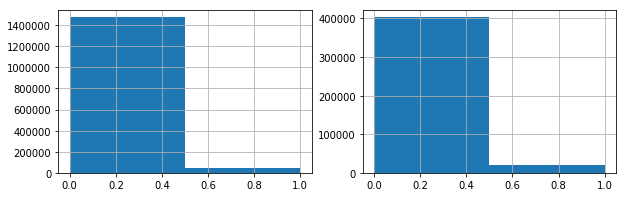

bacno_stscd_equal2
nunique train 2
nunique test 2
max train 1
max test 1


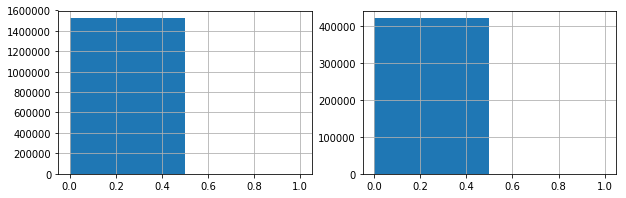

bacno_ecfg_equal1
nunique train 2
nunique test 2
max train 1
max test 1


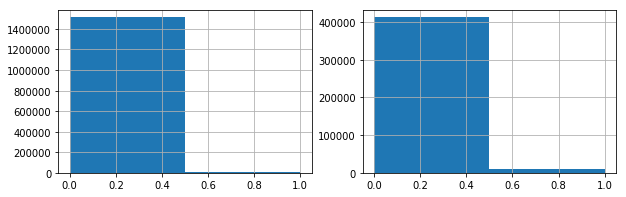

bacno_1_count
nunique train 74
nunique test 51
max train 179
max test 171


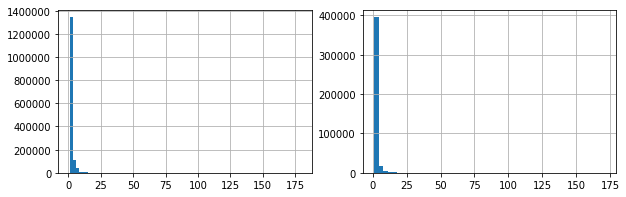

bacno_2day_count
nunique train 83
nunique test 68
max train 179
max test 201


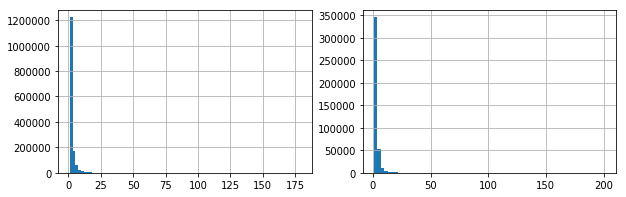

bacno_3day_count
nunique train 86
nunique test 77
max train 179
max test 350


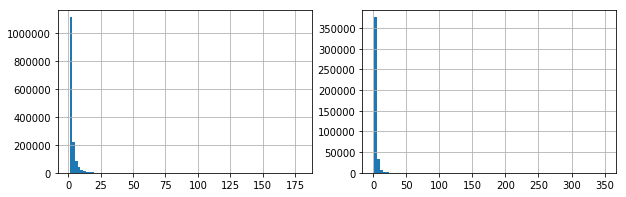

bacno_7day_count
nunique train 125
nunique test 119
max train 202
max test 495


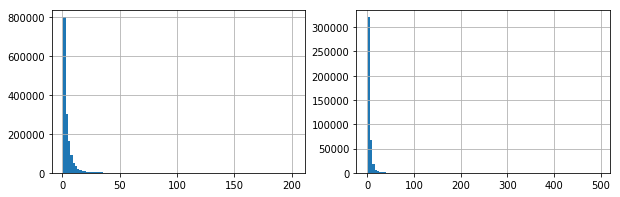

bacno_2day_after_count
nunique train 59
nunique test 44
max train 116.0
max test 171.0


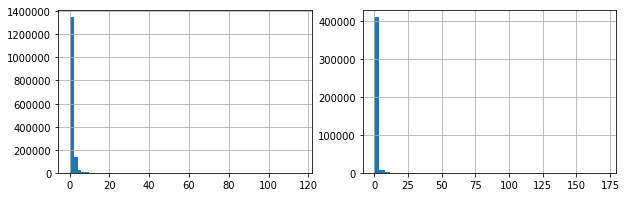

bacno_3day_after_count
nunique train 72
nunique test 64
max train 128.0
max test 201.0


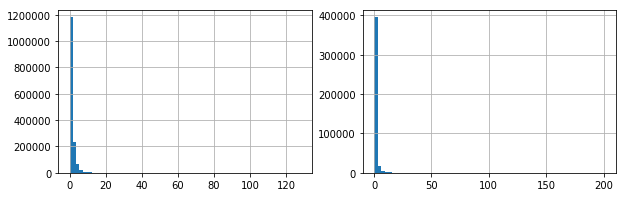

bacno_7day_after_count
nunique train 117
nunique test 107
max train 179.0
max test 451.0


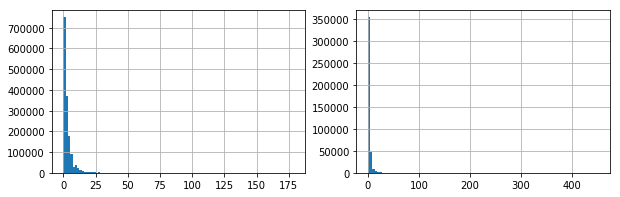

bacno_cano_changetimes
nunique train 126
nunique test 78
max train 274
max test 274


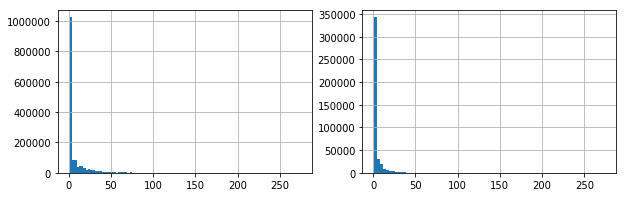

cano_change_ratio
nunique train 1993
nunique test 775
max train 1.0
max test 1.0


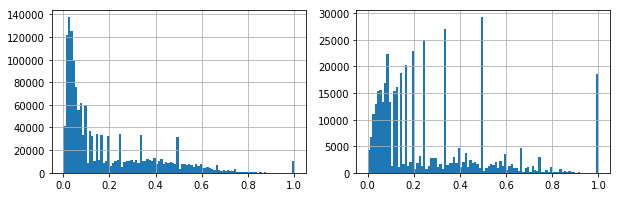

bacno_locdt_diff
nunique train 91
nunique test 103
max train 89.0
max test 107.0


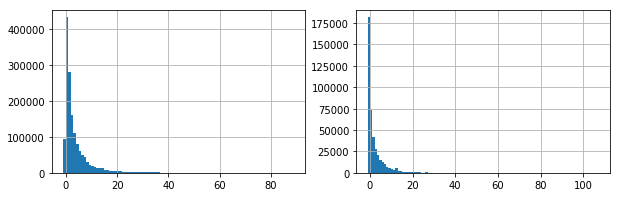

bacno_loctm_diff
nunique train 96549
nunique test 46632
max train 235832.0
max test 235143.0


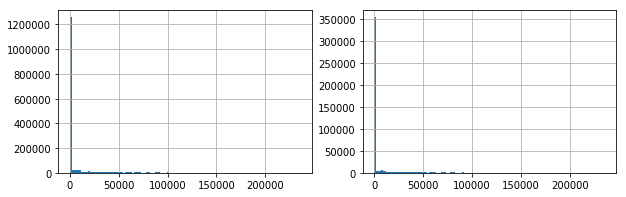

bacno_cano_monoincrease
nunique train 2
nunique test 2
max train 1
max test 1


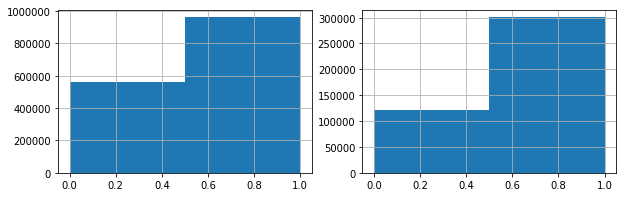

bacno_contp_mode
nunique train 7
nunique test 7
max train 6
max test 6


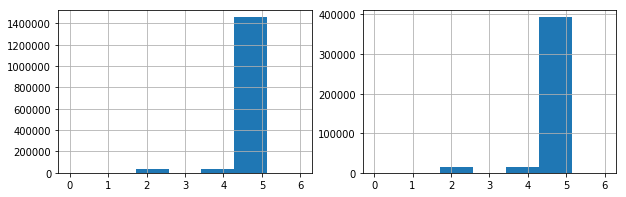

cano_contp_mode
nunique train 7
nunique test 7
max train 6
max test 6


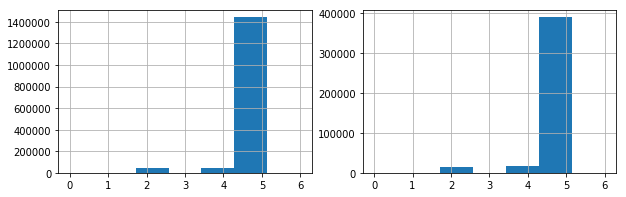

bacno_etymd_mode
nunique train 10
nunique test 10
max train 9
max test 9


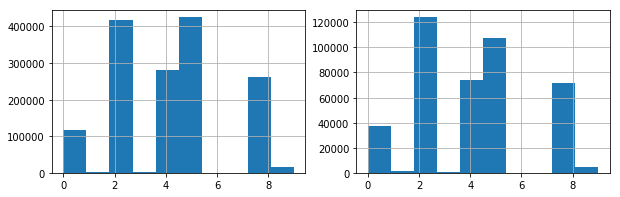

cano_etymd_mode
nunique train 10
nunique test 10
max train 9
max test 9


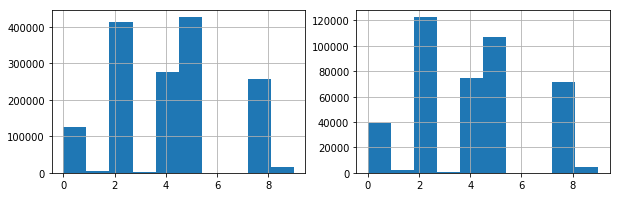

bacno_mchno_mode
nunique train 15691
nunique test 15122
max train 103307
max test 103299


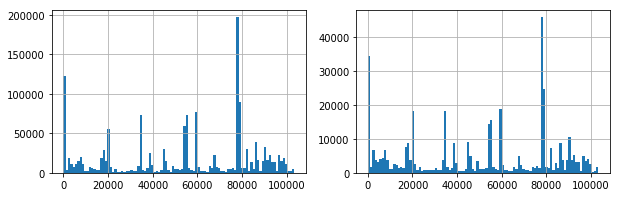

cano_mchno_mode
nunique train 19914
nunique test 17469
max train 103307
max test 103299


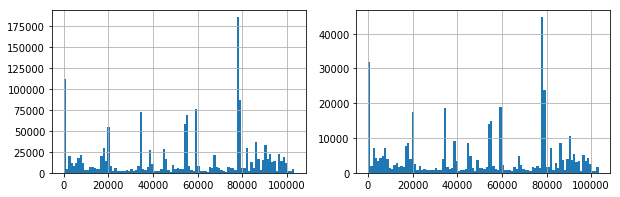

bacno_acqic_mode
nunique train 1307
nunique test 1451
max train 6883
max test 6883


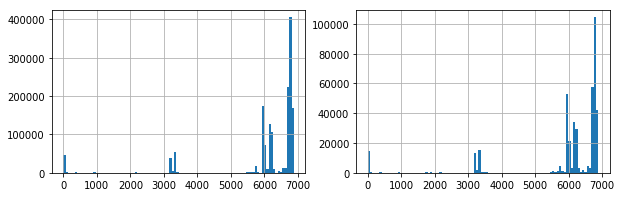

cano_acqic_mode
nunique train 2053
nunique test 1905
max train 6883
max test 6883


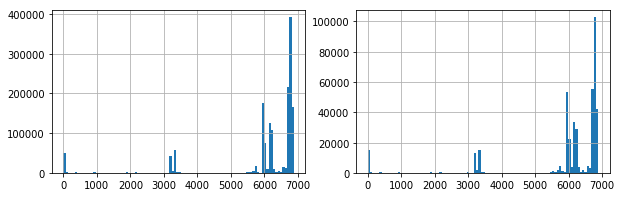

bacno_mcc_mode
nunique train 250
nunique test 259
max train 459
max test 459


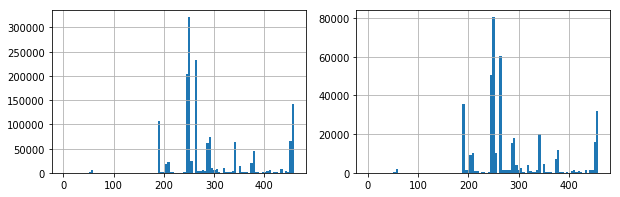

cano_mcc_mode
nunique train 289
nunique test 273
max train 459
max test 459


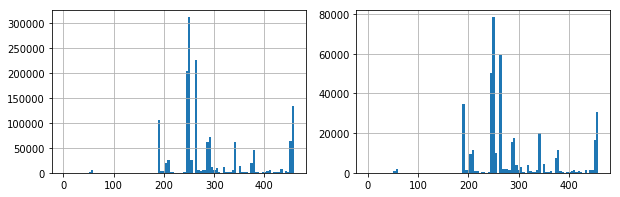

bacno_ecfg_mode
nunique train 2
nunique test 2
max train 1
max test 1


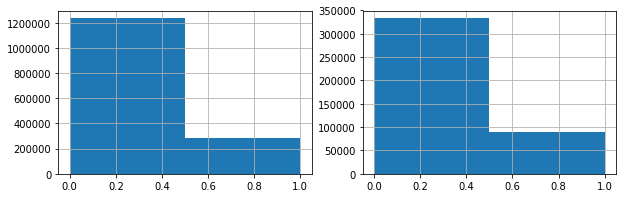

cano_ecfg_mode
nunique train 2
nunique test 2
max train 1
max test 1


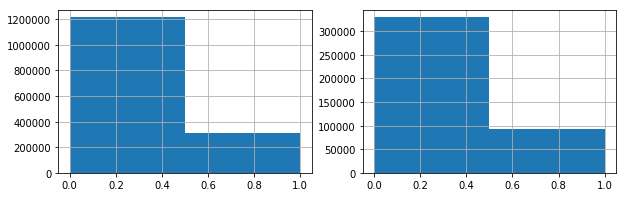

bacno_hcefg_mode
nunique train 9
nunique test 10
max train 9
max test 9


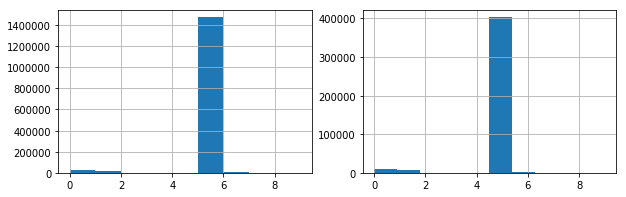

cano_hcefg_mode
nunique train 9
nunique test 10
max train 9
max test 9


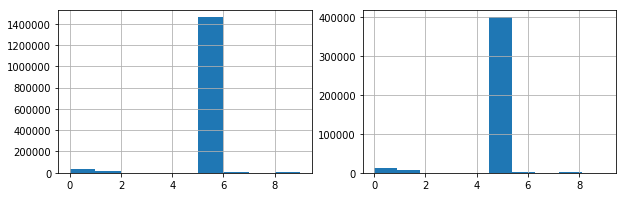

bacno_stscd_mode
nunique train 4
nunique test 4
max train 4
max test 3


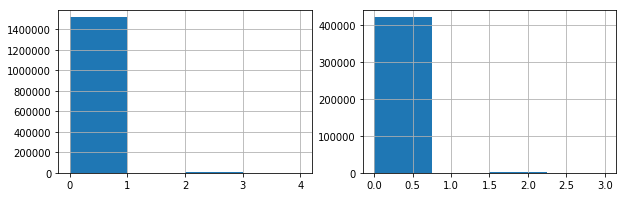

cano_stscd_mode
nunique train 5
nunique test 4
max train 4
max test 3


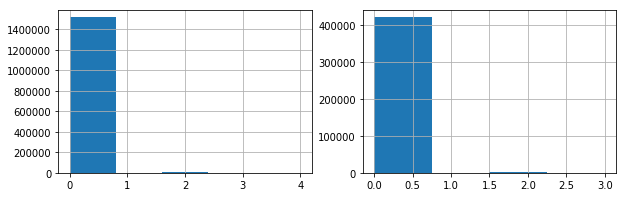

bacno_contp_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


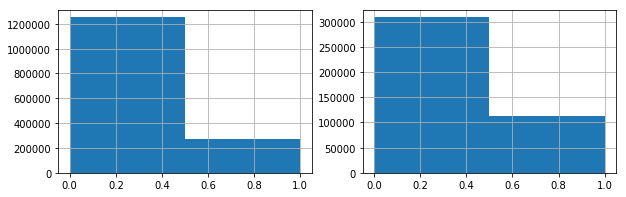

bacno_contp_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


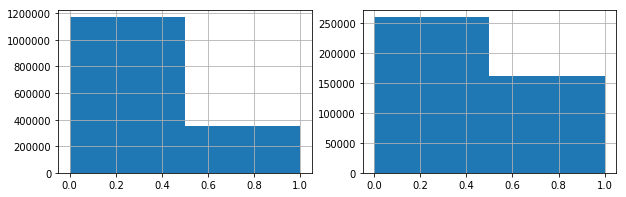

bacno_contp_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


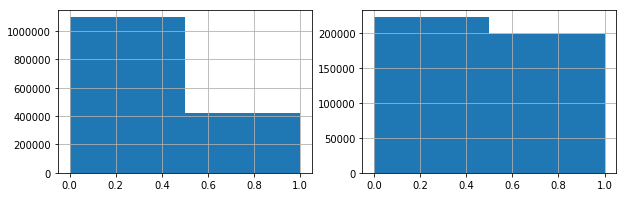

bacno_etymd_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


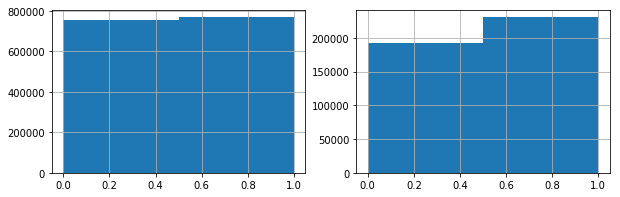

bacno_etymd_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


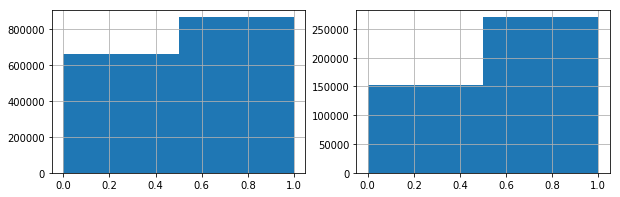

bacno_etymd_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


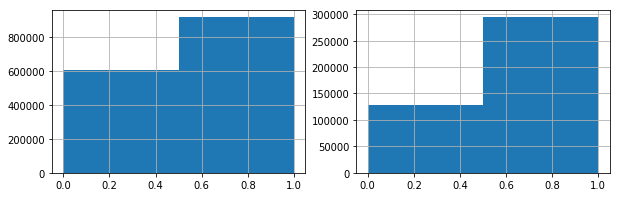

bacno_mchno_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


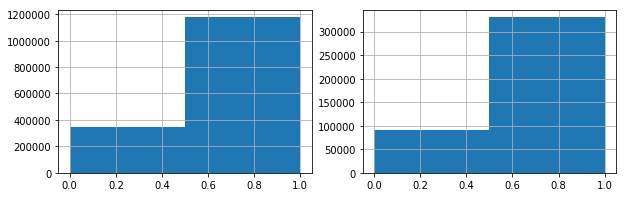

bacno_mchno_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


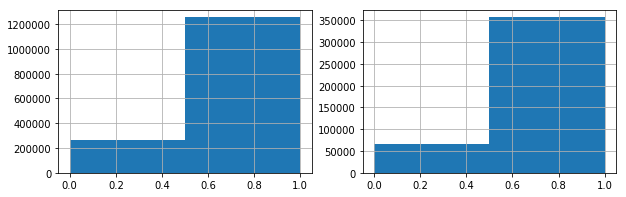

bacno_mchno_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


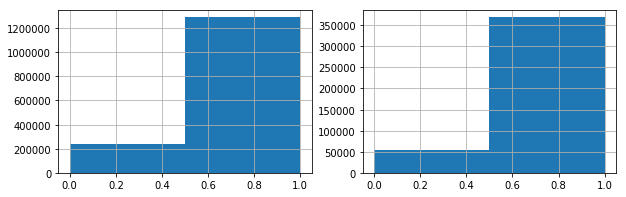

bacno_acqic_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


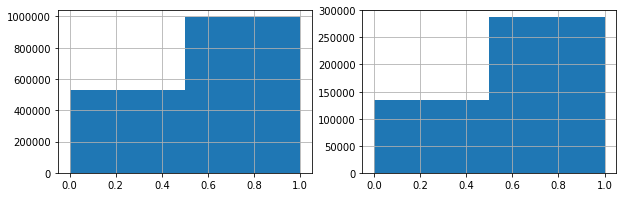

bacno_acqic_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


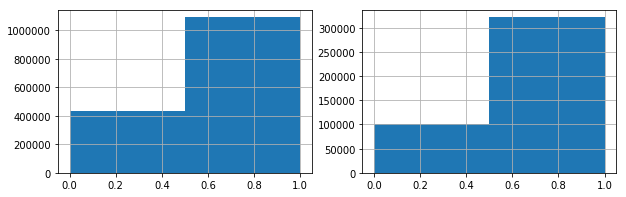

bacno_acqic_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


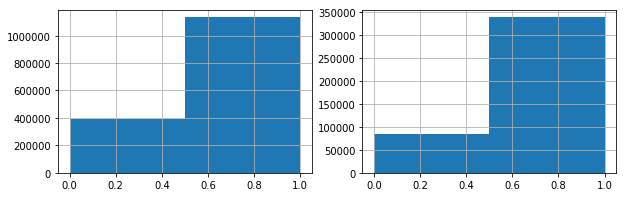

bacno_mcc_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


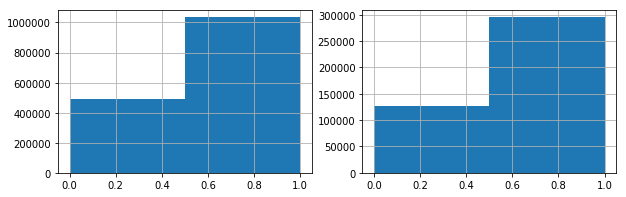

bacno_mcc_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


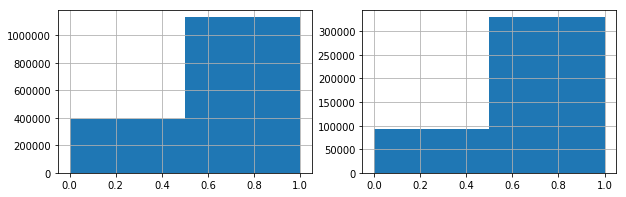

bacno_mcc_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


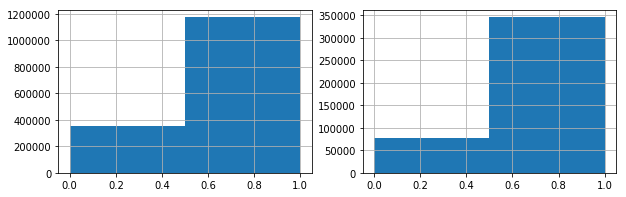

bacno_ecfg_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


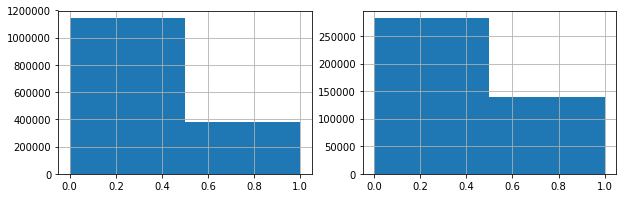

bacno_ecfg_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


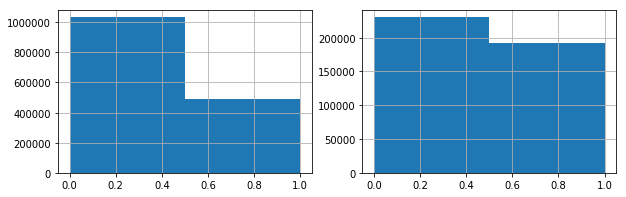

bacno_ecfg_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


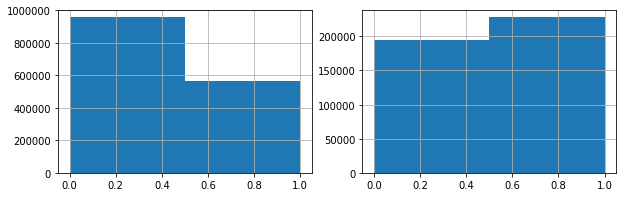

bacno_hcefg_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


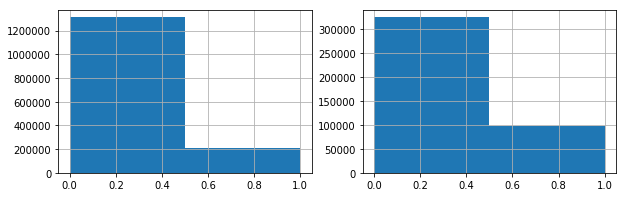

bacno_hcefg_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


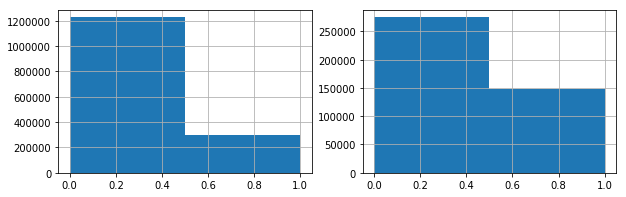

bacno_hcefg_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


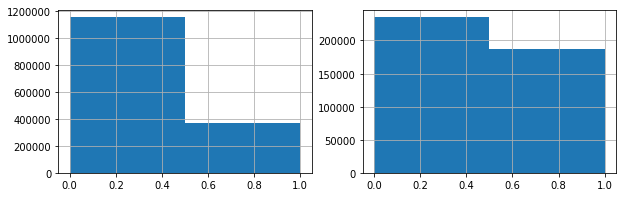

bacno_stscd_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


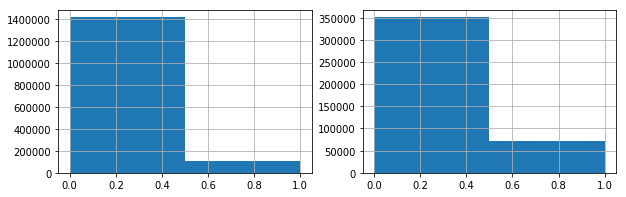

bacno_stscd_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


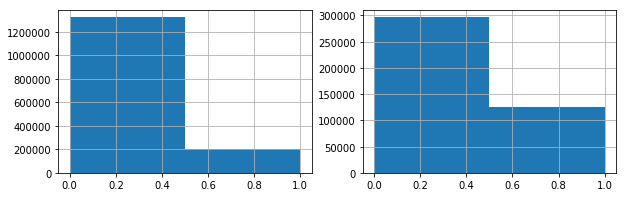

bacno_stscd_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


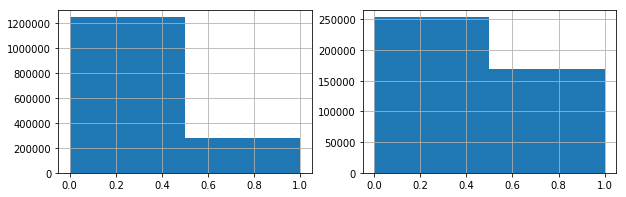

bacno_stocn_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


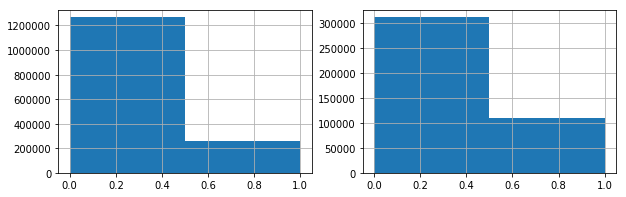

bacno_stocn_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


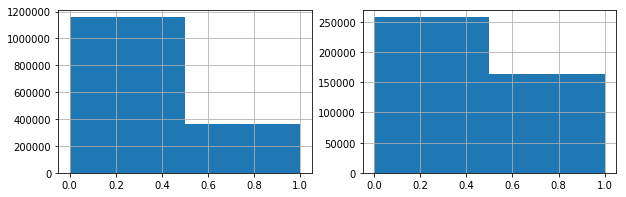

bacno_stocn_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


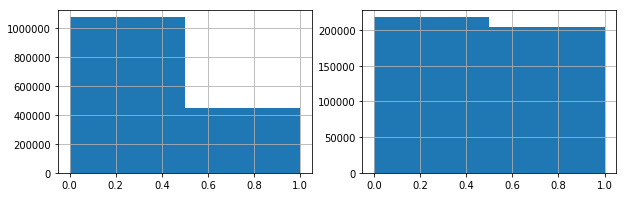

bacno_scity_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


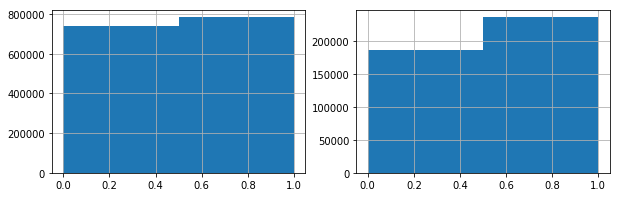

bacno_scity_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


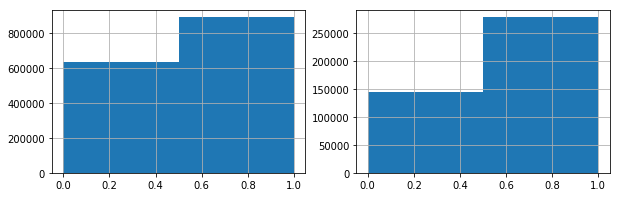

bacno_scity_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


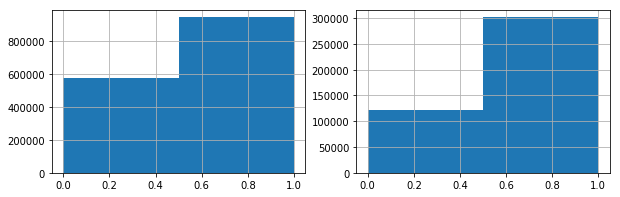

bacno_csmcu_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


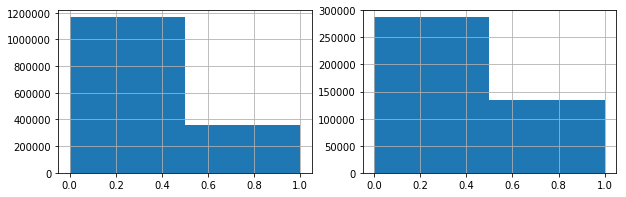

bacno_csmcu_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


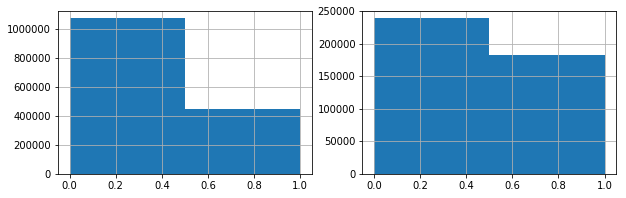

bacno_csmcu_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


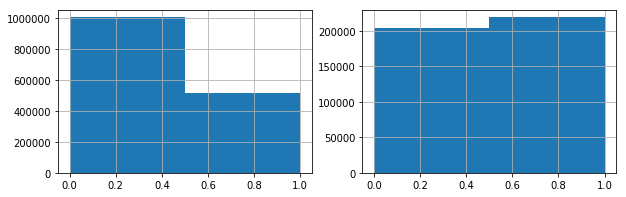

cano_contp_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


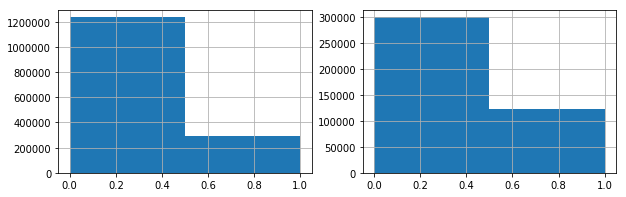

cano_contp_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


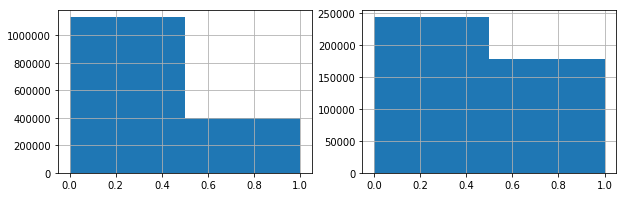

cano_contp_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


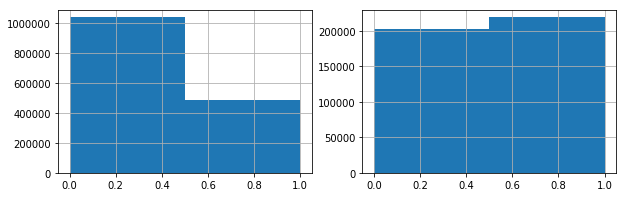

cano_etymd_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


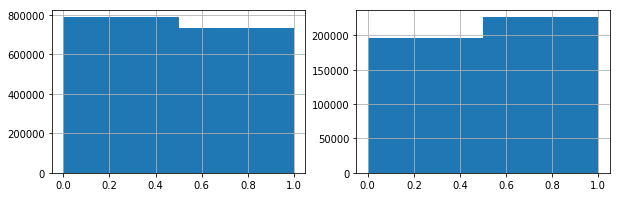

cano_etymd_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


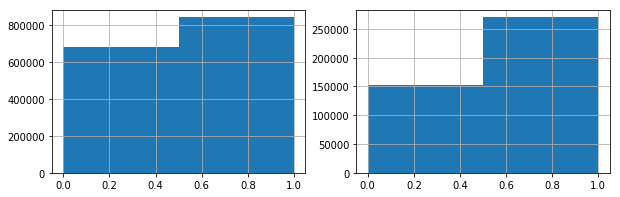

cano_etymd_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


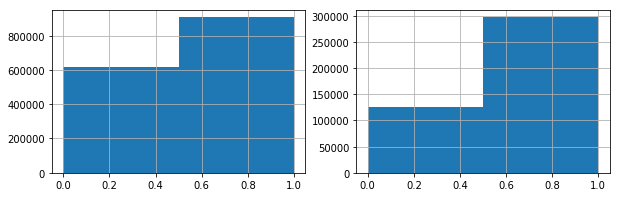

cano_mchno_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


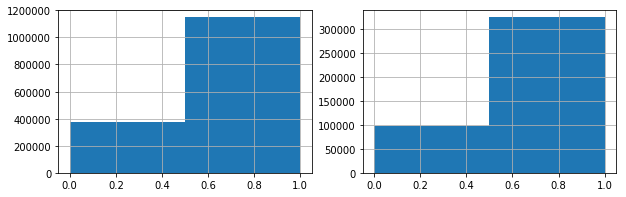

cano_mchno_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


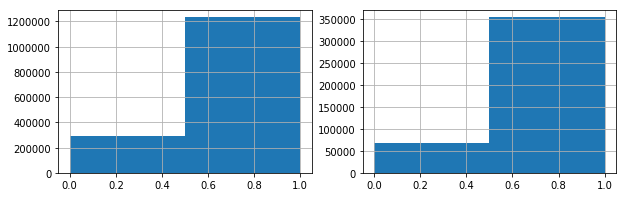

cano_mchno_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


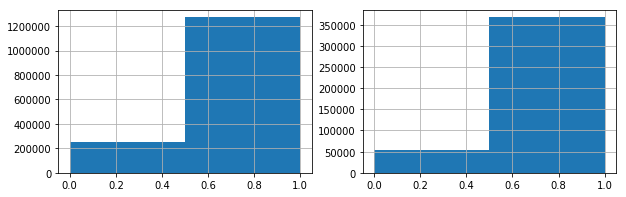

cano_acqic_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


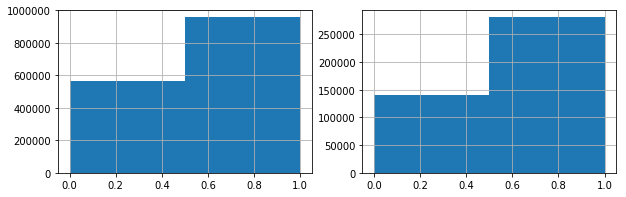

cano_acqic_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


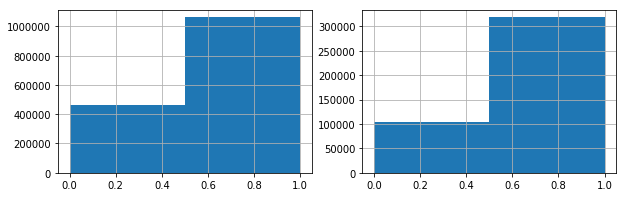

cano_acqic_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


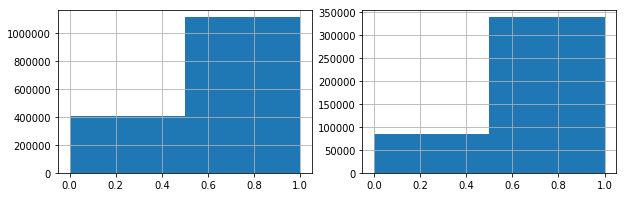

cano_mcc_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


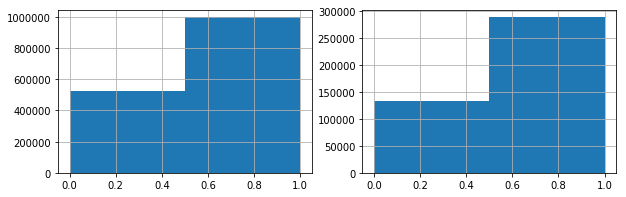

cano_mcc_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


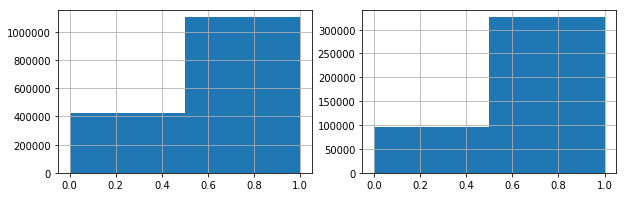

cano_mcc_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


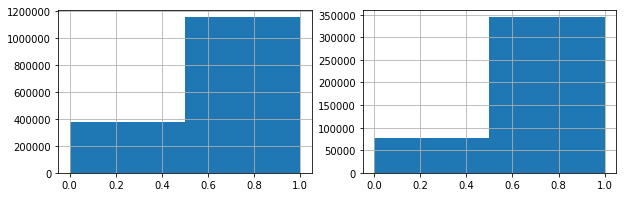

cano_ecfg_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


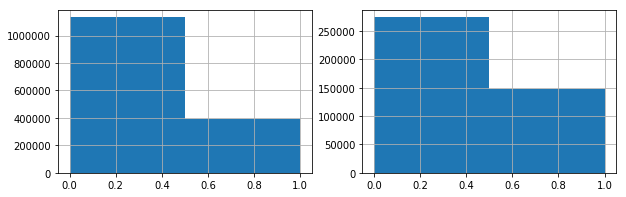

cano_ecfg_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


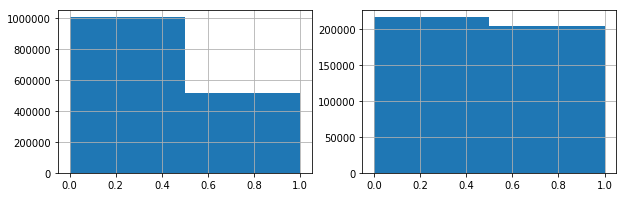

cano_ecfg_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


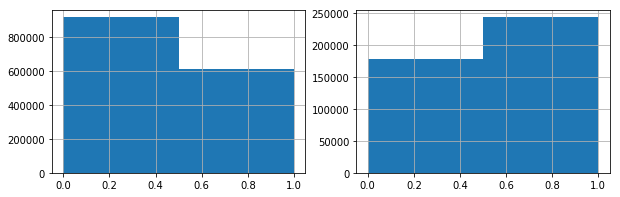

cano_hcefg_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


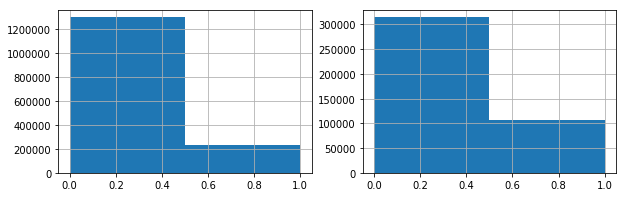

cano_hcefg_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


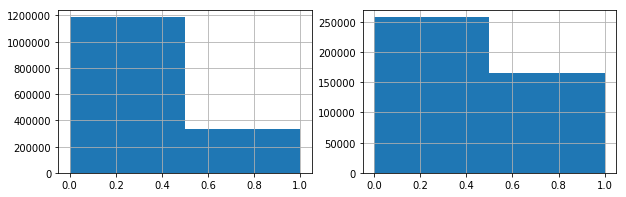

cano_hcefg_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


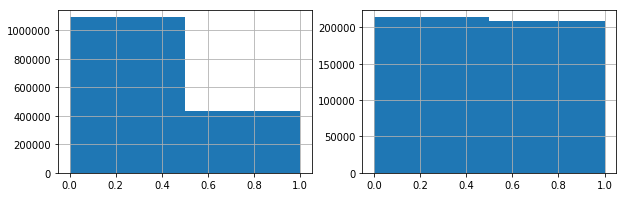

cano_stscd_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


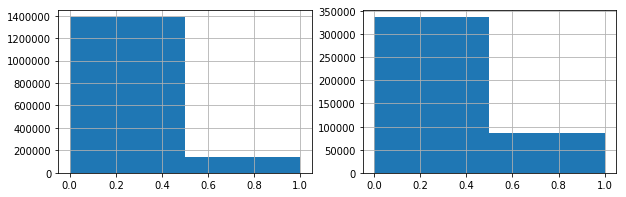

cano_stscd_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


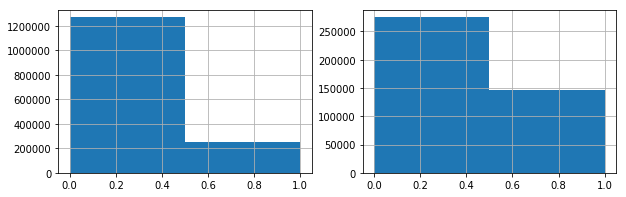

cano_stscd_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


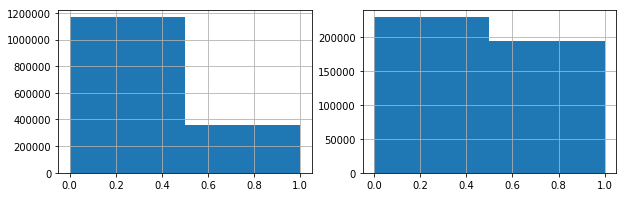

cano_stocn_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


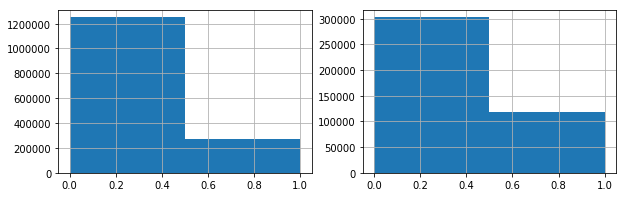

cano_stocn_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


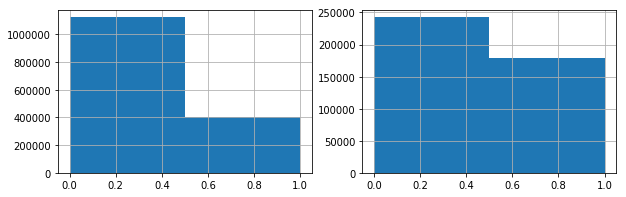

cano_stocn_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


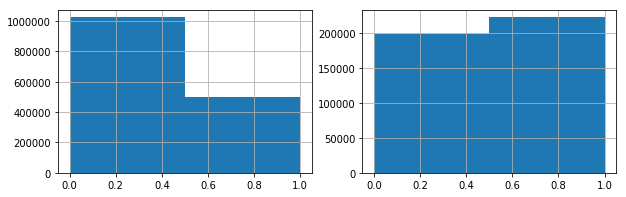

cano_scity_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


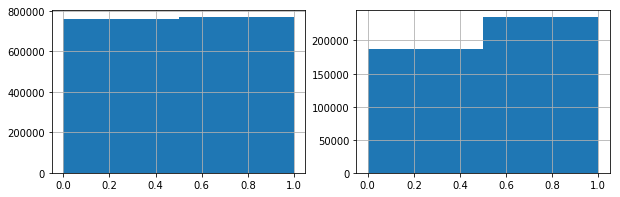

cano_scity_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


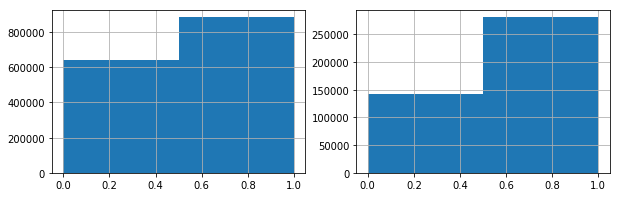

cano_scity_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


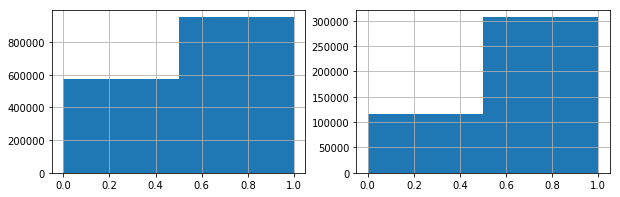

cano_csmcu_diff1
nunique train 2
nunique test 2
max train 1.0
max test 1.0


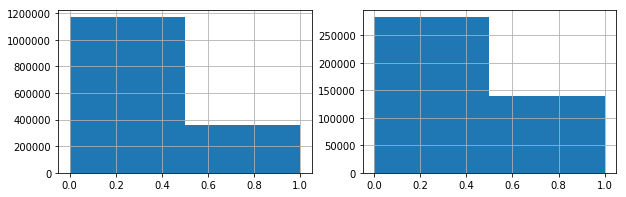

cano_csmcu_diff2
nunique train 2
nunique test 2
max train 1.0
max test 1.0


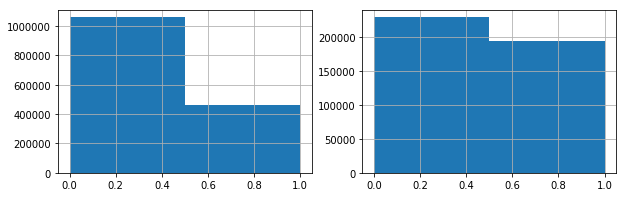

cano_csmcu_diff3
nunique train 2
nunique test 2
max train 1.0
max test 1.0


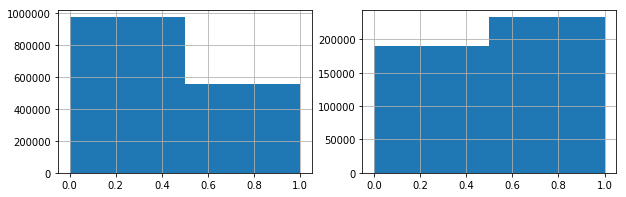

pca2_feature_1
nunique train 1451046
nunique test 403319
max train 31.455885812556144
max test 24.856976052008093


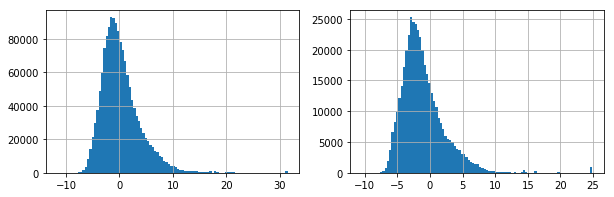

pca2_feature_2
nunique train 1451046
nunique test 403319
max train 61.22664959831769
max test 48.788328214271914


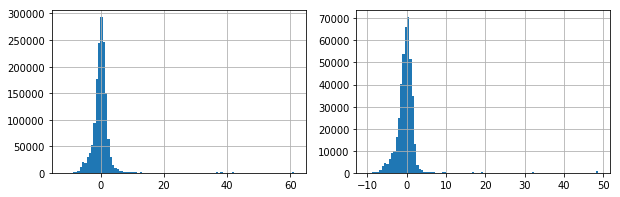

pca3_feature_1
nunique train 1451046
nunique test 403319
max train 31.45589165298817
max test 24.856983691554145


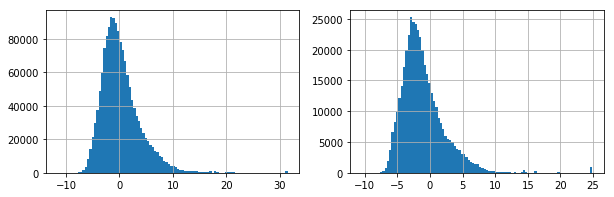

pca3_feature_2
nunique train 1451047
nunique test 403319
max train 61.22665556562065
max test 48.788317012654716


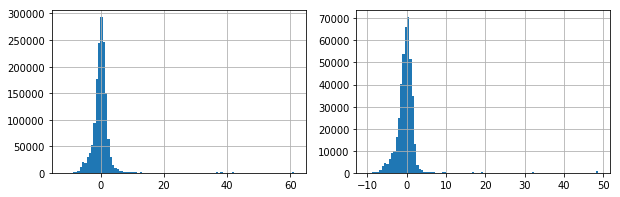

pca3_feature_3
nunique train 1451036
nunique test 403312
max train 15.249095179205096
max test 11.619233723716226


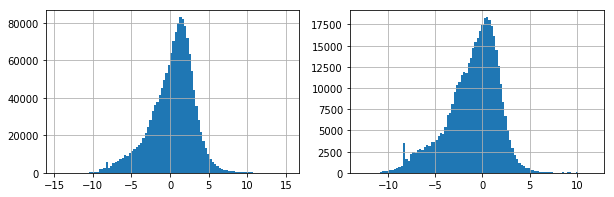

isolationtree_all_feature
nunique train 1368708
nunique test 387355
max train -0.3549208110933962
max test -0.3555306197085744


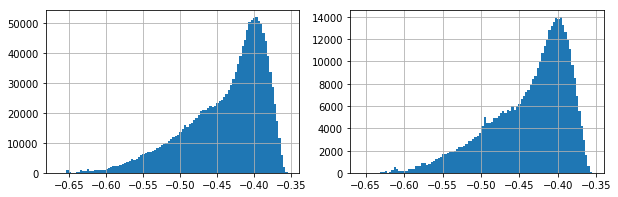

isolationtree_all_feature2
nunique train 1416637
nunique test 396072
max train -0.3370907068754212
max test -0.3366182238754383


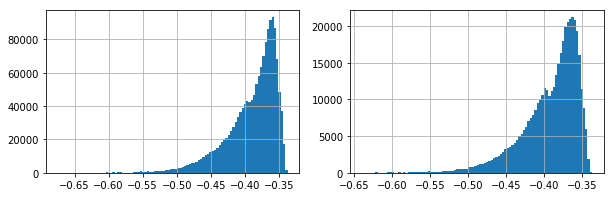

isolationtree_all_feature3
nunique train 1416068
nunique test 395953
max train -0.33631952845419744
max test -0.3372399855430586


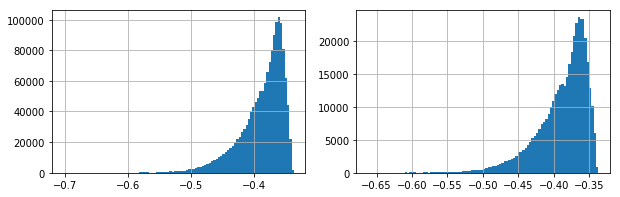

isolationtree_all_feature4
nunique train 1424922
nunique test 397870
max train -0.3364419160776421
max test -0.3369896158037507


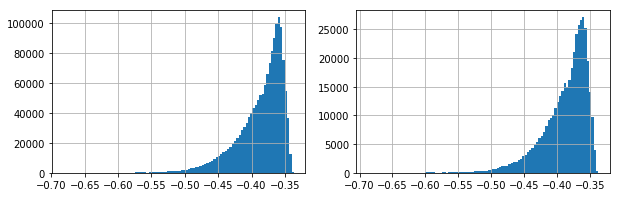

kmeans_all_feature
nunique train 1451034
nunique test 403315
max train 148.9151167959975
max test 63.770665437290894


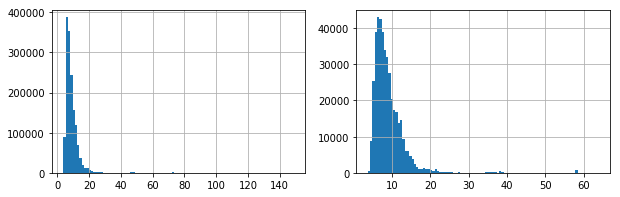

kmeans_all_feature2
nunique train 1451035
nunique test 403314
max train 148.85982465697003
max test 63.67473638110028


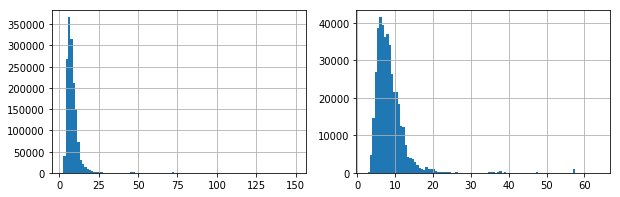

kmeans_all_feature3
nunique train 1451037
nunique test 403315
max train 148.8588421218861
max test 63.67488438749618


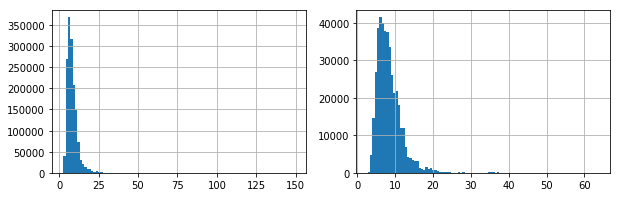

kmeans_all_feature4
nunique train 1451036
nunique test 403313
max train 148.85659936838252
max test 63.68187024020045


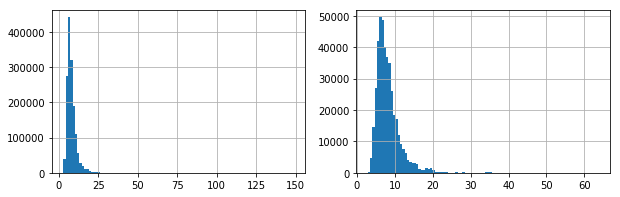

kmeans_all_feature5
nunique train 1451038
nunique test 403314
max train 148.74641154853148
max test 63.54150346208844


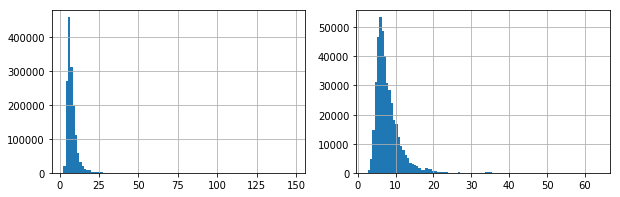

svm_rbf
nunique train 1451044
nunique test 403315
max train 1589.7572937637685
max test 1573.1549240639774


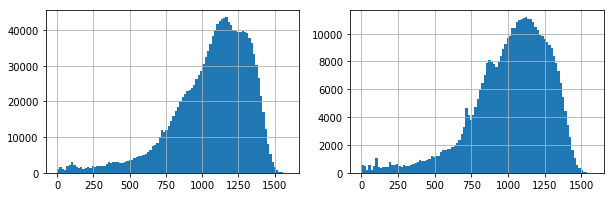

In [6]:
def compare_distribution(train_data,test_data,target_name):
    target = train_data[target_name]
    target2 = test_data[target_name]
    print(target_name)
    print('nunique train',target.nunique())
    print('nunique test',target2.nunique())
    print('max train',target.max())
    print('max test',target2.max())

    fig, axs = plt.subplots(1,2,figsize=(10,3))
    
    bins = target.nunique() if target.nunique()<100 else 100
    target.hist(bins=bins,ax=axs[0])
    
    bins = target2.nunique() if target2.nunique()<100 else 100
    target2.hist(bins=bins,ax=axs[1])
    plt.show()


for c in all_data.drop(columns='fraud_ind'):
    compare_distribution(all_data[all_data['locdt']<=90].drop(columns='fraud_ind'),all_data[all_data['locdt']>90].drop(columns='fraud_ind'),c)

## fraud資料和normal資料的各個特徵差異

acqic


<Figure size 432x288 with 0 Axes>

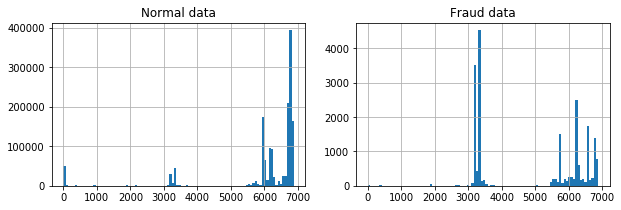

bacno


<Figure size 432x288 with 0 Axes>

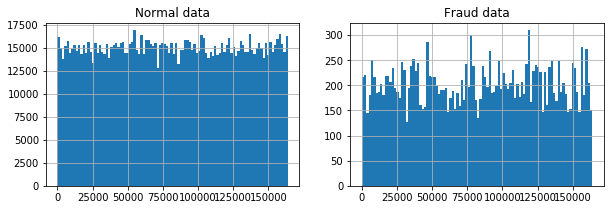

cano


<Figure size 432x288 with 0 Axes>

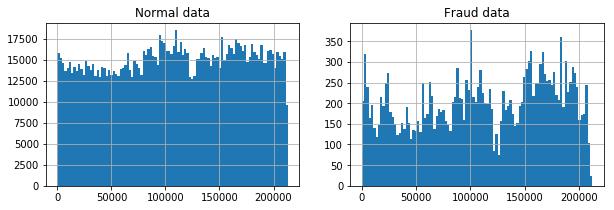

conam


<Figure size 432x288 with 0 Axes>

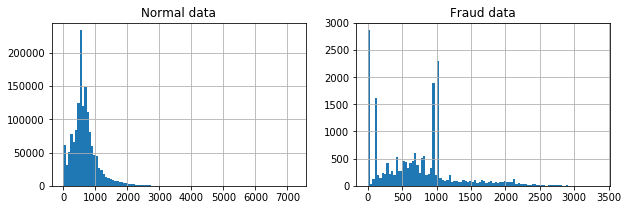

contp


<Figure size 432x288 with 0 Axes>

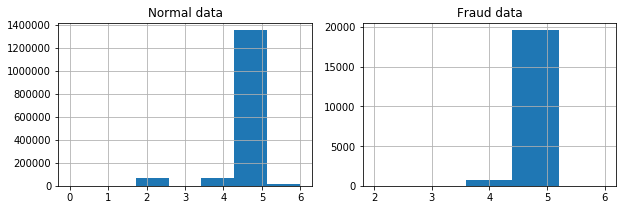

csmcu


<Figure size 432x288 with 0 Axes>

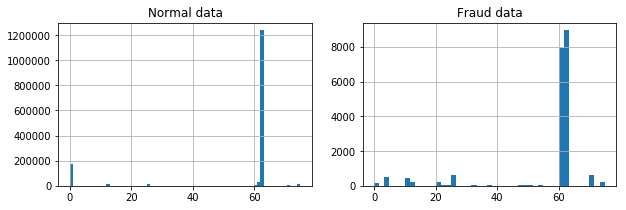

ecfg


<Figure size 432x288 with 0 Axes>

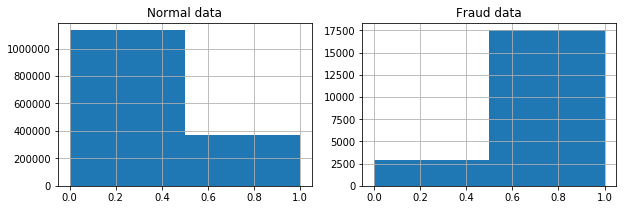

etymd


<Figure size 432x288 with 0 Axes>

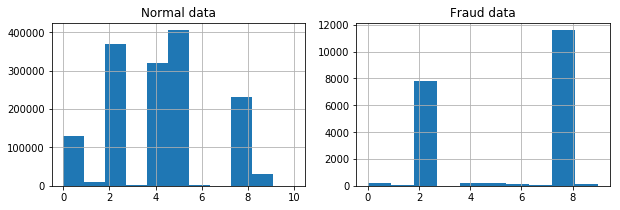

flbmk


<Figure size 432x288 with 0 Axes>

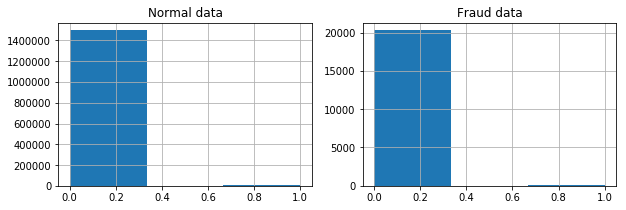

flg_3dsmk


<Figure size 432x288 with 0 Axes>

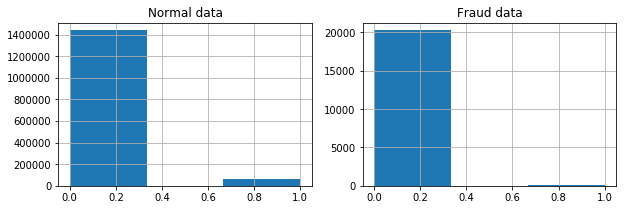

fraud_ind


<Figure size 432x288 with 0 Axes>

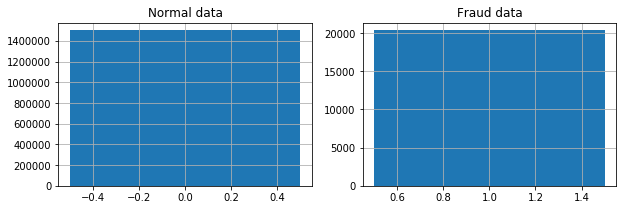

hcefg


<Figure size 432x288 with 0 Axes>

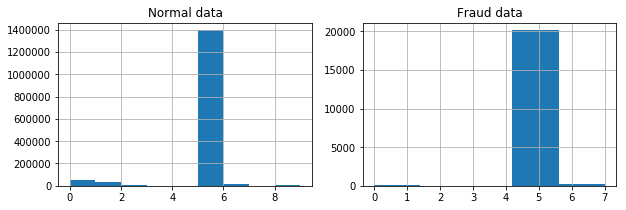

insfg


<Figure size 432x288 with 0 Axes>

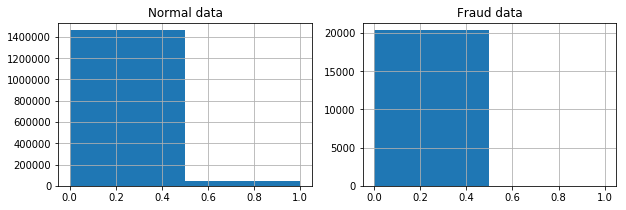

iterm


<Figure size 432x288 with 0 Axes>

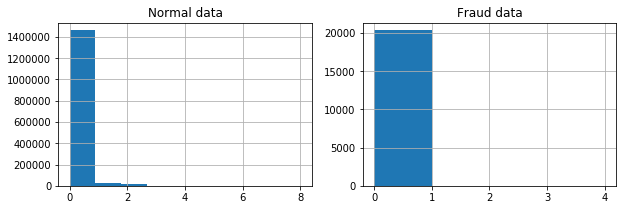

locdt


<Figure size 432x288 with 0 Axes>

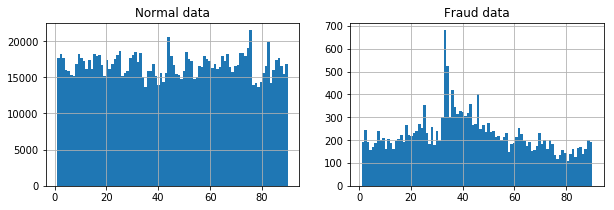

loctm


<Figure size 432x288 with 0 Axes>

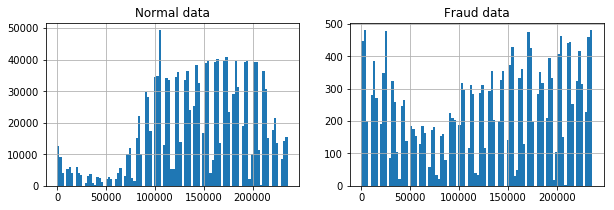

mcc


<Figure size 432x288 with 0 Axes>

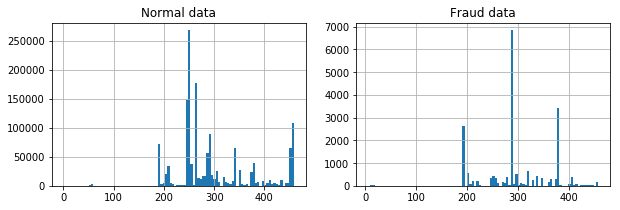

mchno


<Figure size 432x288 with 0 Axes>

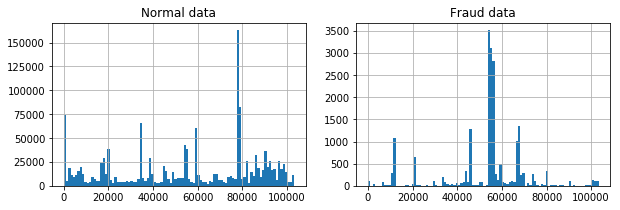

ovrlt


<Figure size 432x288 with 0 Axes>

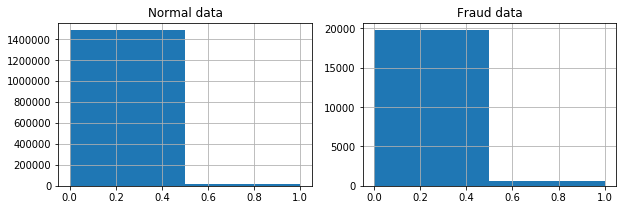

scity


<Figure size 432x288 with 0 Axes>

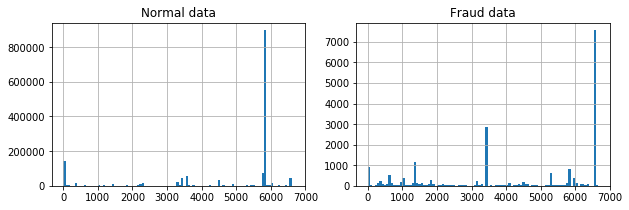

stocn


<Figure size 432x288 with 0 Axes>

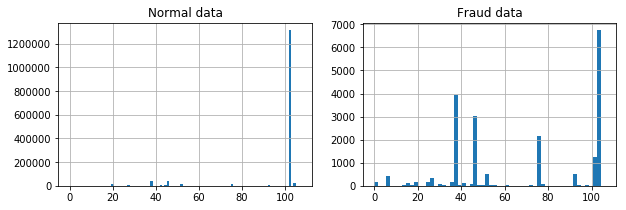

stscd


<Figure size 432x288 with 0 Axes>

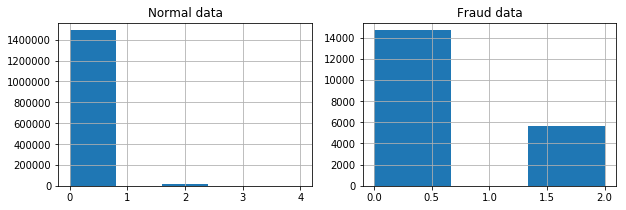

txkey


<Figure size 432x288 with 0 Axes>

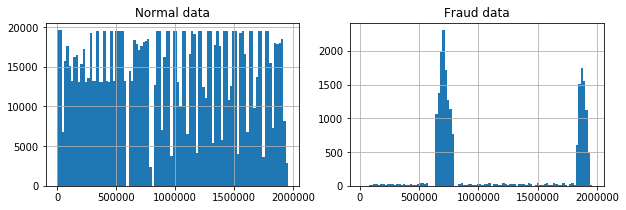

bacno_cano_nunique


<Figure size 432x288 with 0 Axes>

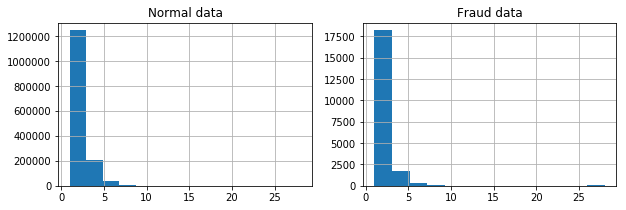

bacno_txkey_nunique


<Figure size 432x288 with 0 Axes>

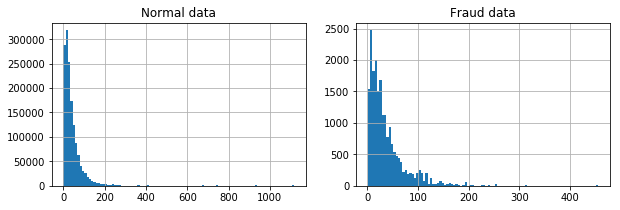

conam_log


<Figure size 432x288 with 0 Axes>

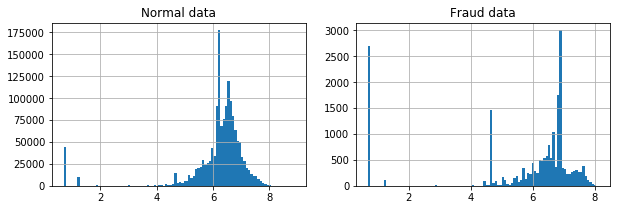

bacno_mean_conam


<Figure size 432x288 with 0 Axes>

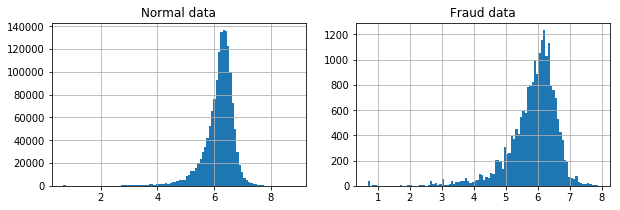

bacno_scale_conam


<Figure size 432x288 with 0 Axes>

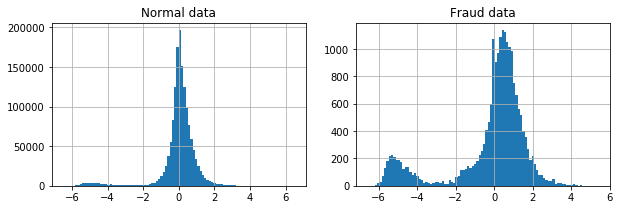

cano_mean_conam


<Figure size 432x288 with 0 Axes>

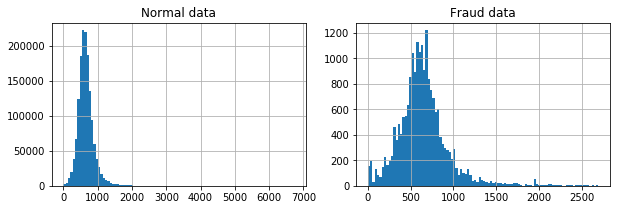

cano_scale_conam


<Figure size 432x288 with 0 Axes>

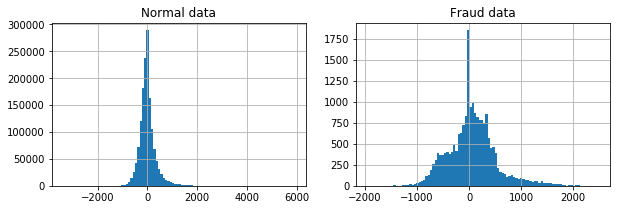

cano_conam_skew


<Figure size 432x288 with 0 Axes>

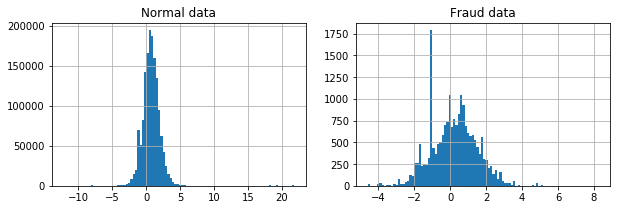

cano_conam_kurt


<Figure size 432x288 with 0 Axes>

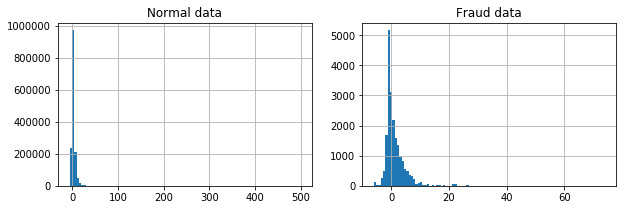

cano_conam_mean


<Figure size 432x288 with 0 Axes>

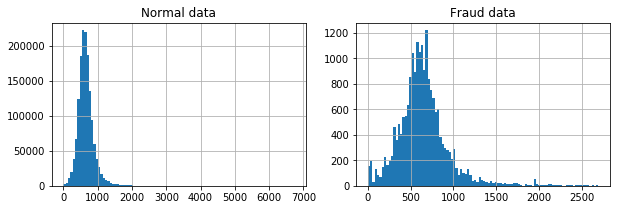

cano_conam_var


<Figure size 432x288 with 0 Axes>

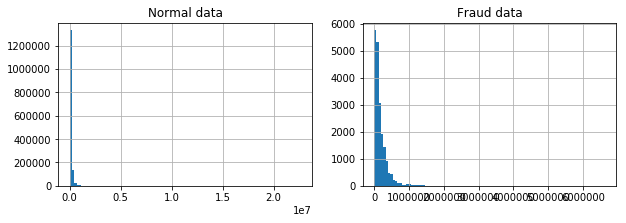

bacno_max_conam


<Figure size 432x288 with 0 Axes>

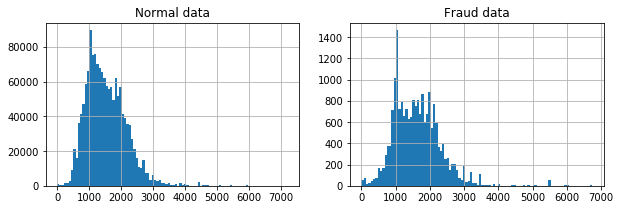

bacno_ismax_conam


<Figure size 432x288 with 0 Axes>

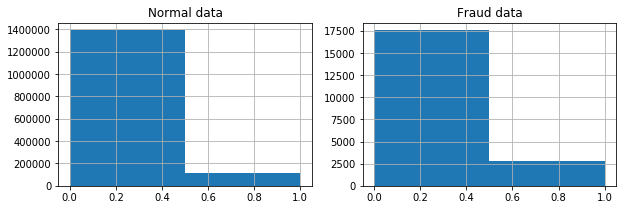

bacno_min_conam


<Figure size 432x288 with 0 Axes>

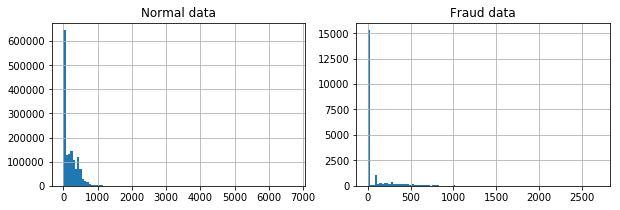

bacno_ismin_conam


<Figure size 432x288 with 0 Axes>

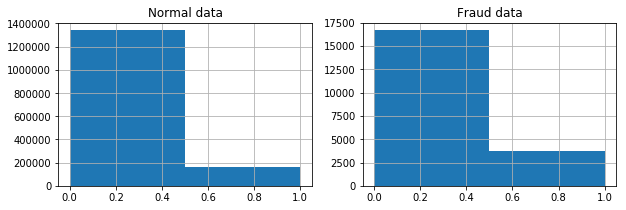

bacno_ratio_ecfg


<Figure size 432x288 with 0 Axes>

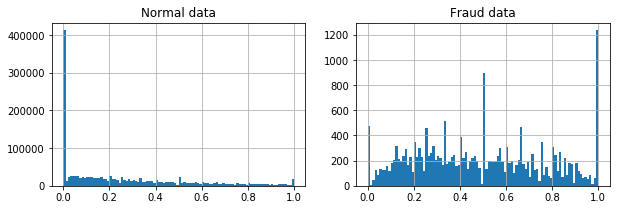

cano_ratio_ecfg


<Figure size 432x288 with 0 Axes>

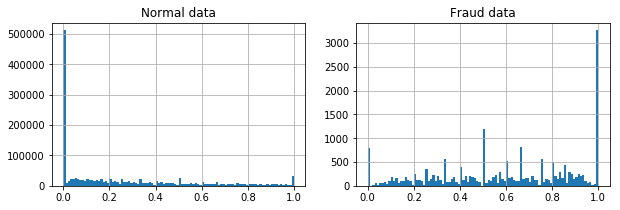

locdt_week


<Figure size 432x288 with 0 Axes>

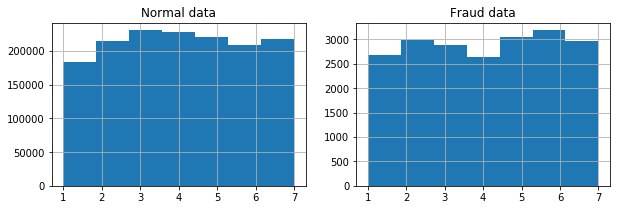

loctm_hr


<Figure size 432x288 with 0 Axes>

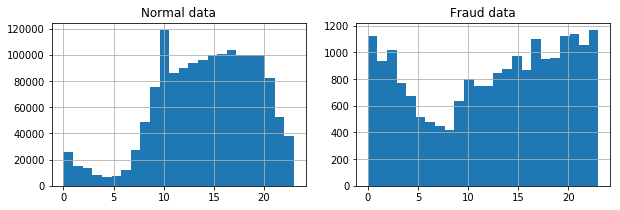

bacno_locdt_skew


<Figure size 432x288 with 0 Axes>

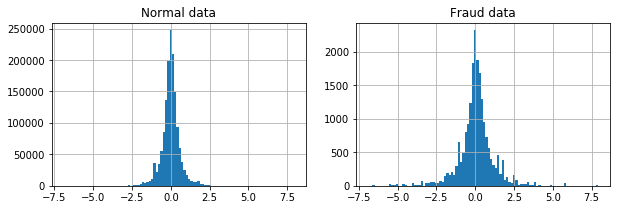

bacno_locdt_kurt


<Figure size 432x288 with 0 Axes>

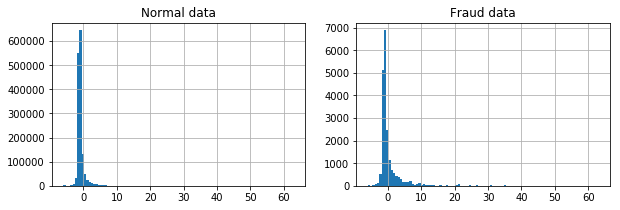

cano_locdt_skew


<Figure size 432x288 with 0 Axes>

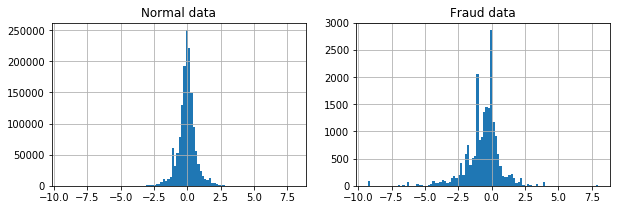

cano_locdt_kurt


<Figure size 432x288 with 0 Axes>

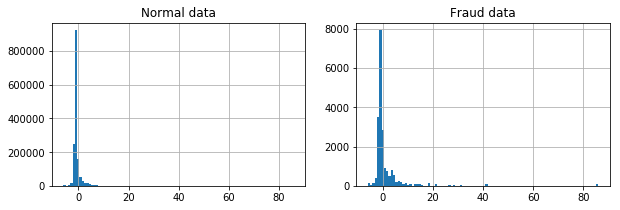

bacno_stocn_mode


<Figure size 432x288 with 0 Axes>

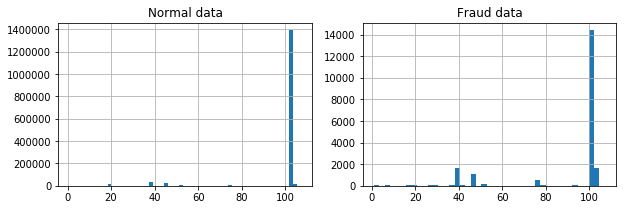

bacno_scity_mode


<Figure size 432x288 with 0 Axes>

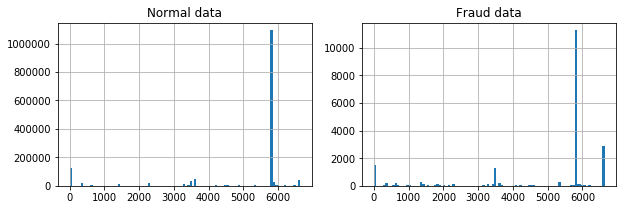

bacno_csmcu_mode


<Figure size 432x288 with 0 Axes>

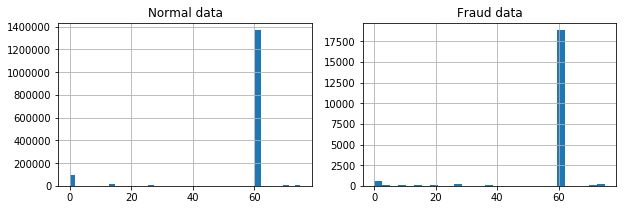

bacno_stocn_ismode


<Figure size 432x288 with 0 Axes>

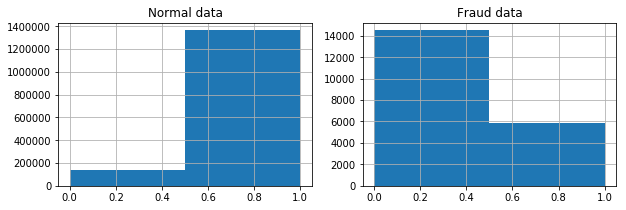

bacno_scity_ismode


<Figure size 432x288 with 0 Axes>

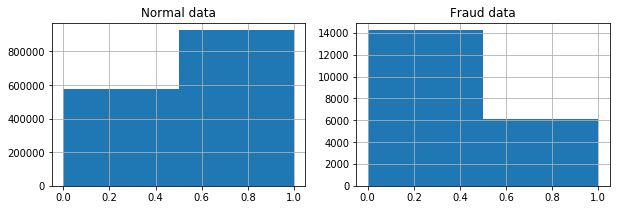

bacno_csmcu_ismode


<Figure size 432x288 with 0 Axes>

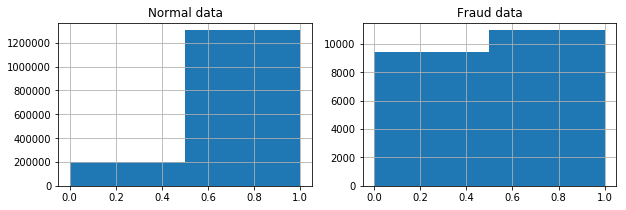

cano_stocn_mode


<Figure size 432x288 with 0 Axes>

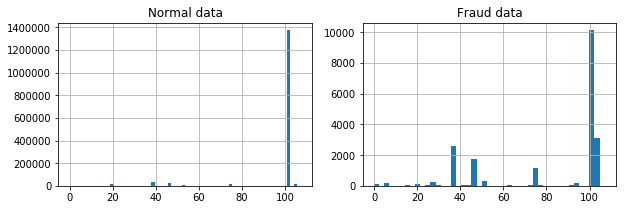

cano_scity_mode


<Figure size 432x288 with 0 Axes>

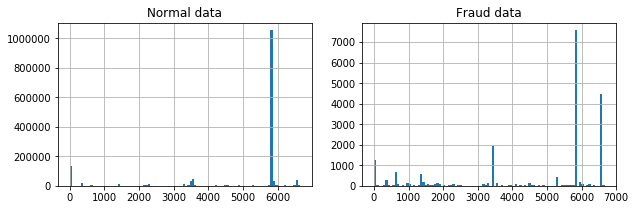

cano_csmcu_mode


<Figure size 432x288 with 0 Axes>

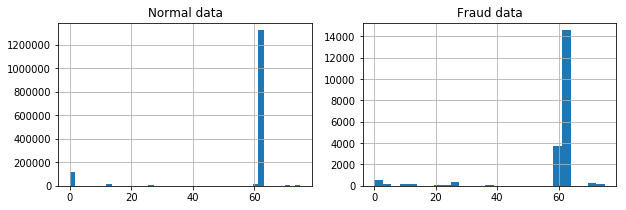

cano_stocn_ismode


<Figure size 432x288 with 0 Axes>

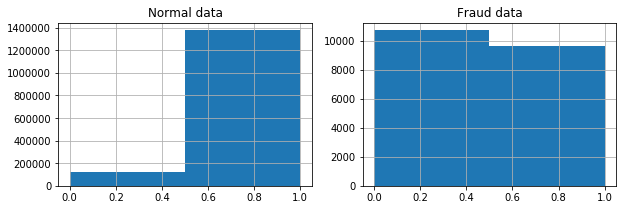

cano_scity_ismode


<Figure size 432x288 with 0 Axes>

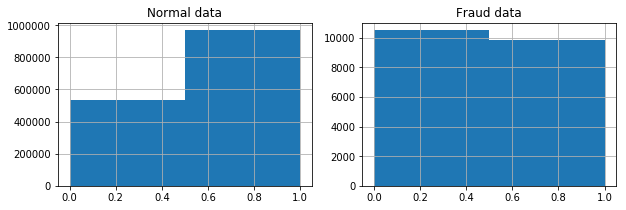

cano_csmcu_ismode


<Figure size 432x288 with 0 Axes>

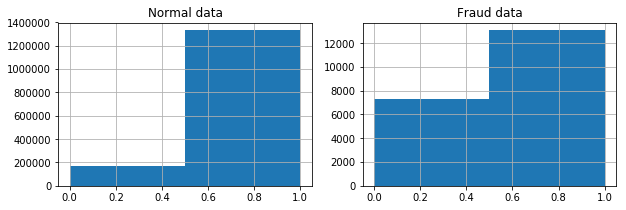

mchno_fraud_mean


<Figure size 432x288 with 0 Axes>

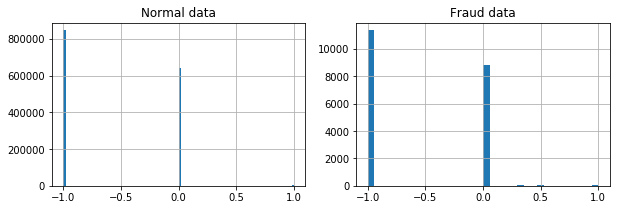

mcc_fraud_mean


<Figure size 432x288 with 0 Axes>

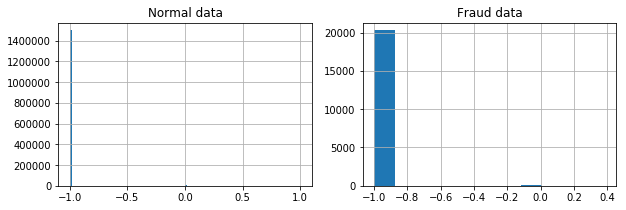

acqic_fraud_mean


<Figure size 432x288 with 0 Axes>

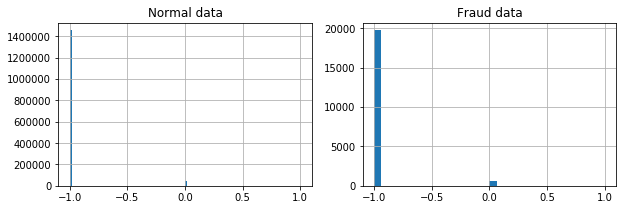

mchno_bacno_nunique


<Figure size 432x288 with 0 Axes>

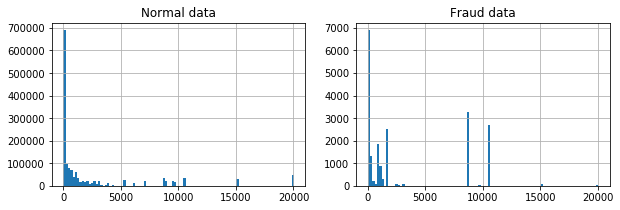

acqic_bacno_nunique


<Figure size 432x288 with 0 Axes>

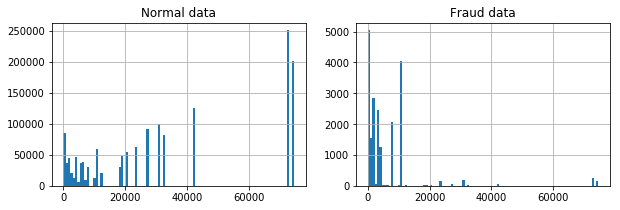

mcc_bacno_nunique


<Figure size 432x288 with 0 Axes>

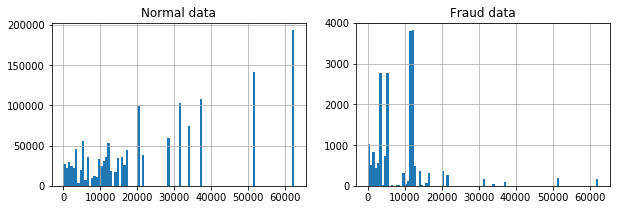

stocn_bacno_nunique


<Figure size 432x288 with 0 Axes>

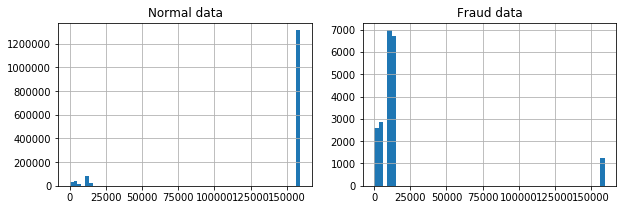

scity_bacno_nunique


<Figure size 432x288 with 0 Axes>

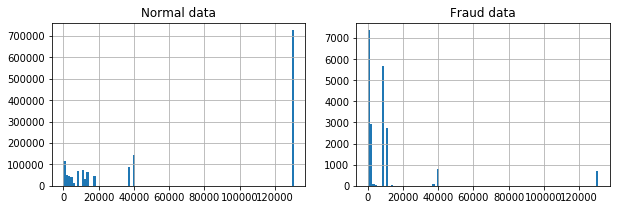

csmcu_bacno_nunique


<Figure size 432x288 with 0 Axes>

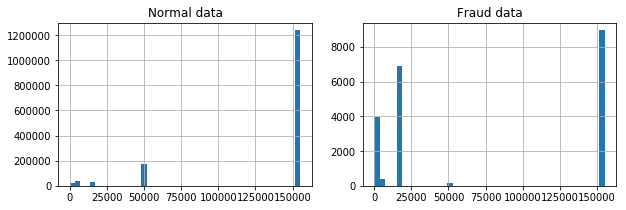

mchno_cano_nunique


<Figure size 432x288 with 0 Axes>

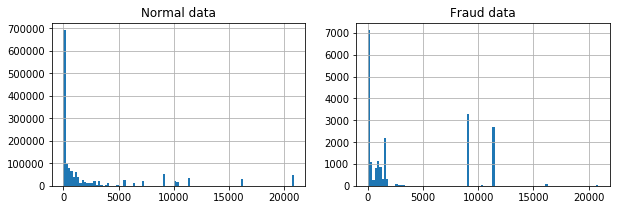

acqic_cano_nunique


<Figure size 432x288 with 0 Axes>

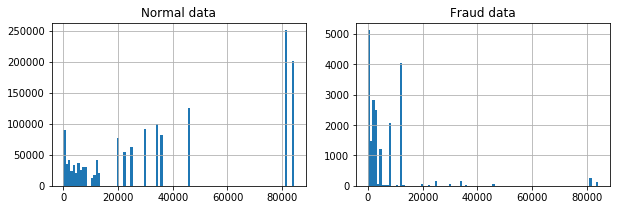

mcc_cano_nunique


<Figure size 432x288 with 0 Axes>

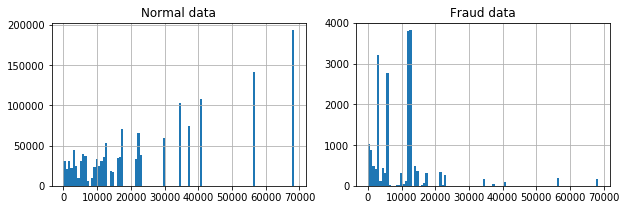

stocn_cano_nunique


<Figure size 432x288 with 0 Axes>

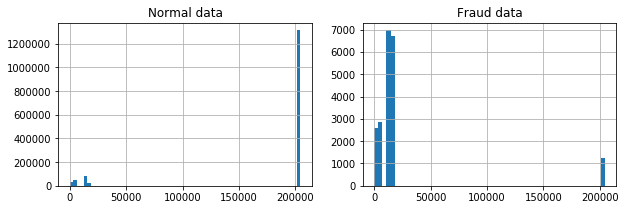

scity_cano_nunique


<Figure size 432x288 with 0 Axes>

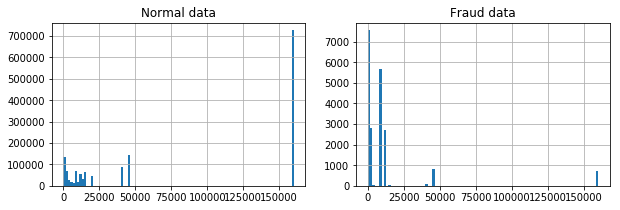

csmcu_cano_nunique


<Figure size 432x288 with 0 Axes>

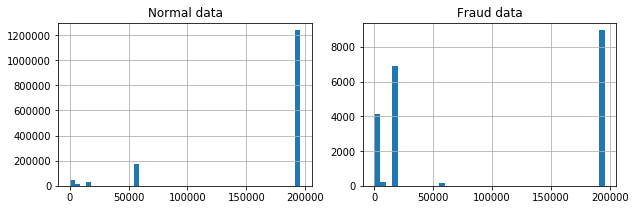

mchno_value_counts_all


<Figure size 432x288 with 0 Axes>

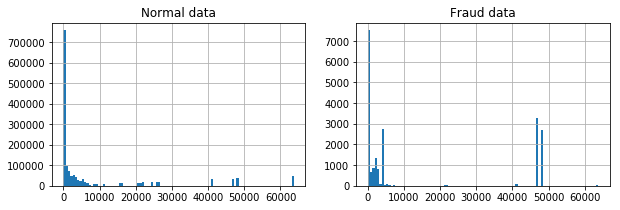

acqic_value_counts_all


<Figure size 432x288 with 0 Axes>

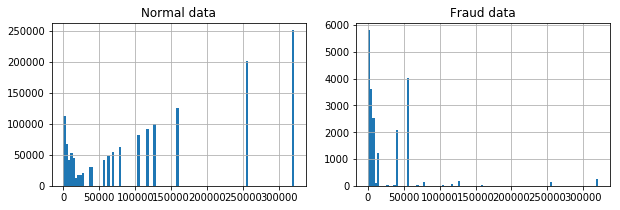

mcc_value_counts_all


<Figure size 432x288 with 0 Axes>

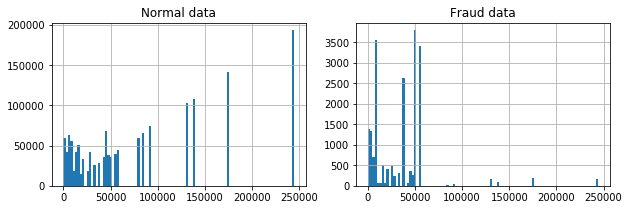

stocn_value_counts_all


<Figure size 432x288 with 0 Axes>

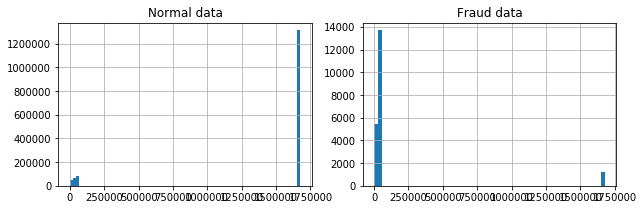

scity_value_counts_all


<Figure size 432x288 with 0 Axes>

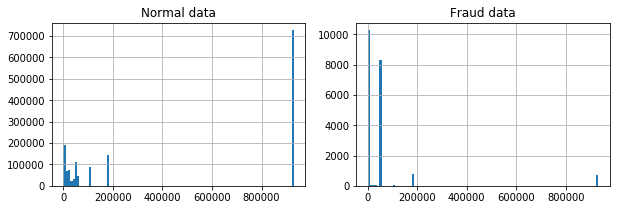

csmcu_value_counts_all


<Figure size 432x288 with 0 Axes>

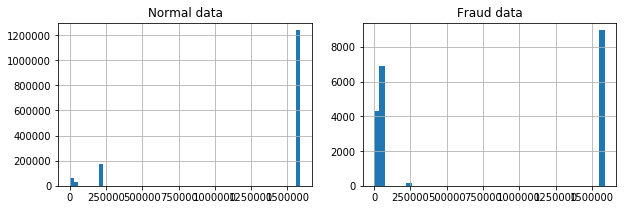

bacno_stocn_nunique


<Figure size 432x288 with 0 Axes>

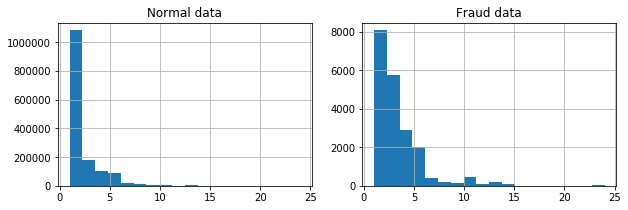

stocn_value_counts


<Figure size 432x288 with 0 Axes>

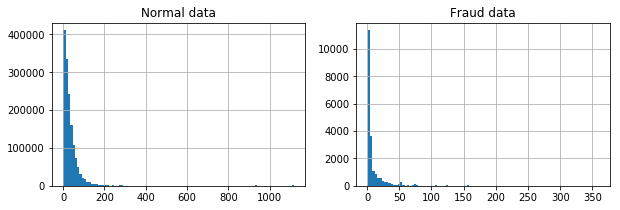

stocn_ratio


<Figure size 432x288 with 0 Axes>

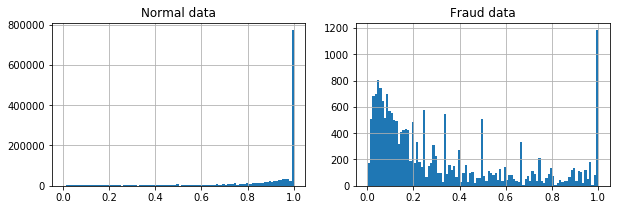

bacno_csmcu_nunique


<Figure size 432x288 with 0 Axes>

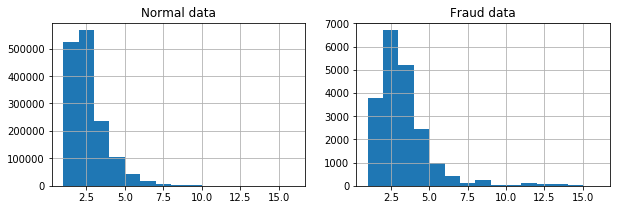

csmcu_value_counts


<Figure size 432x288 with 0 Axes>

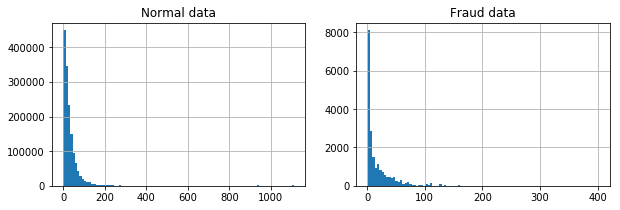

csmcu_ratio


<Figure size 432x288 with 0 Axes>

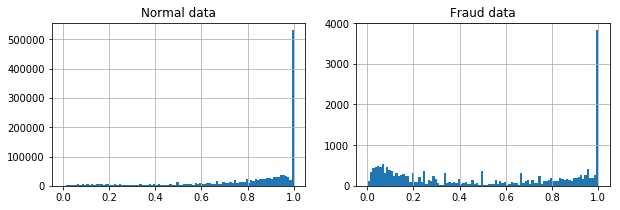

bacno_mchno_nunique


<Figure size 432x288 with 0 Axes>

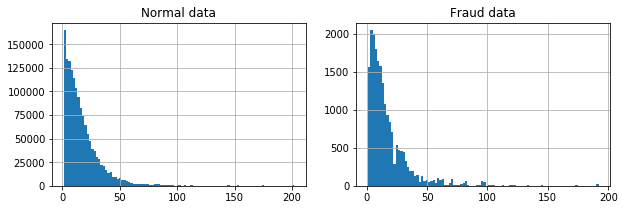

mchno_value_counts


<Figure size 432x288 with 0 Axes>

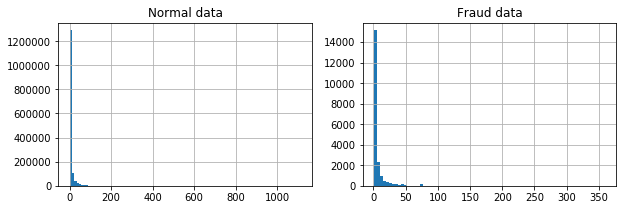

mchno_ratio


<Figure size 432x288 with 0 Axes>

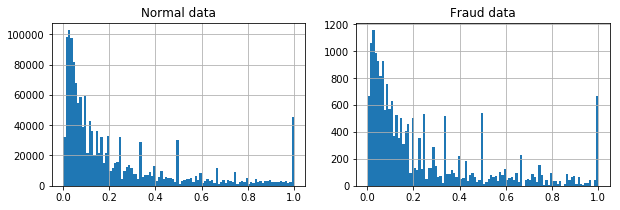

bacno_acqic_nunique


<Figure size 432x288 with 0 Axes>

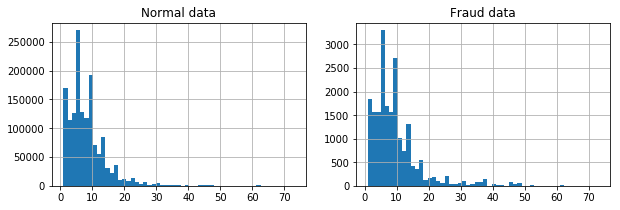

acqic_value_counts


<Figure size 432x288 with 0 Axes>

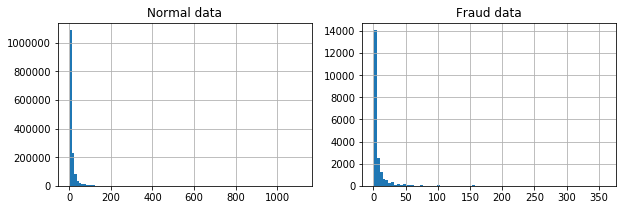

acqic_ratio


<Figure size 432x288 with 0 Axes>

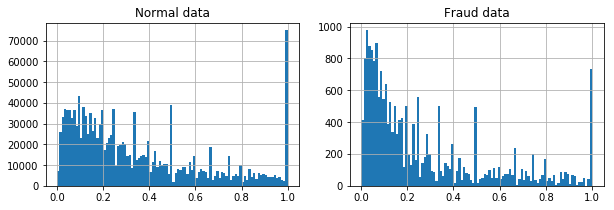

bacno_mcc_nunique


<Figure size 432x288 with 0 Axes>

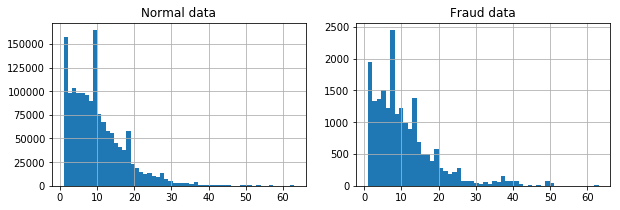

mcc_value_counts


<Figure size 432x288 with 0 Axes>

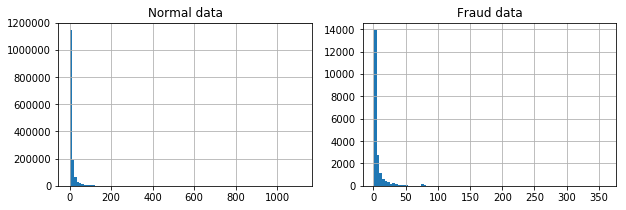

mcc_ratio


<Figure size 432x288 with 0 Axes>

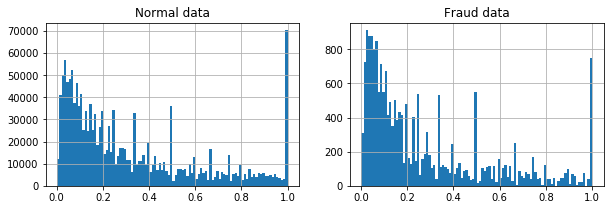

bacno_scity_nunique


<Figure size 432x288 with 0 Axes>

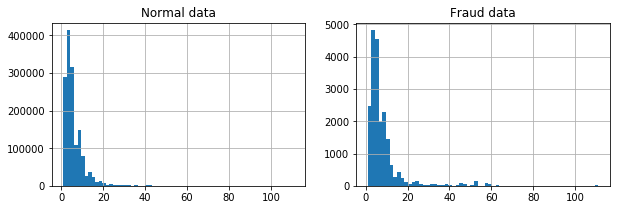

scity_value_counts


<Figure size 432x288 with 0 Axes>

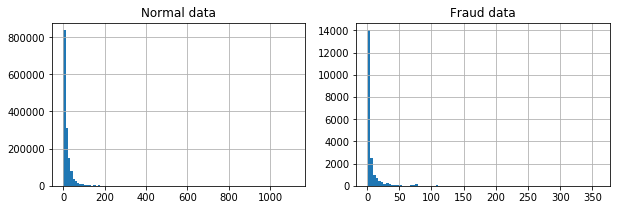

scity_ratio


<Figure size 432x288 with 0 Axes>

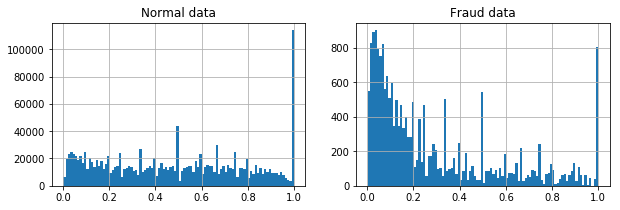

bacno_contp_nunique


<Figure size 432x288 with 0 Axes>

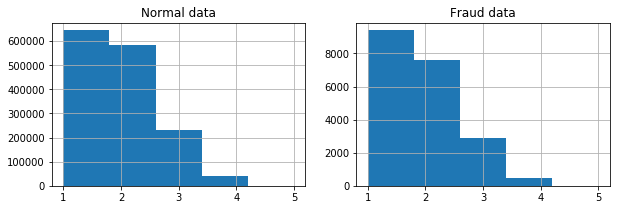

contp_value_counts


<Figure size 432x288 with 0 Axes>

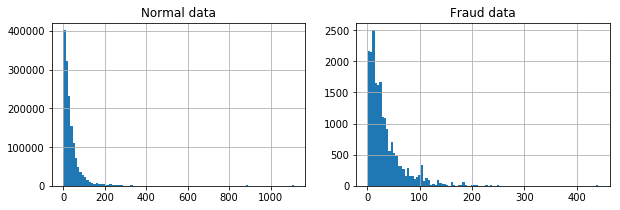

contp_ratio


<Figure size 432x288 with 0 Axes>

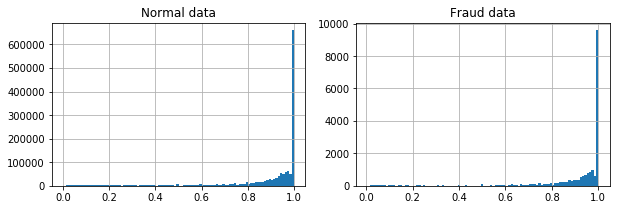

bacno_etymd_nunique


<Figure size 432x288 with 0 Axes>

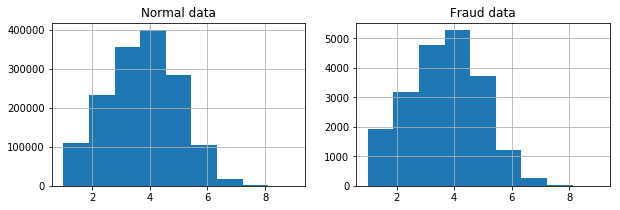

etymd_value_counts


<Figure size 432x288 with 0 Axes>

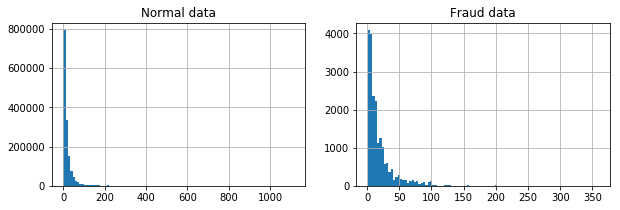

etymd_ratio


<Figure size 432x288 with 0 Axes>

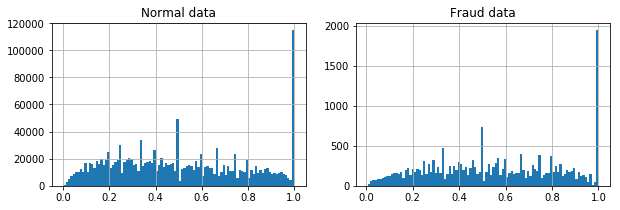

bacno_stscd_nunique


<Figure size 432x288 with 0 Axes>

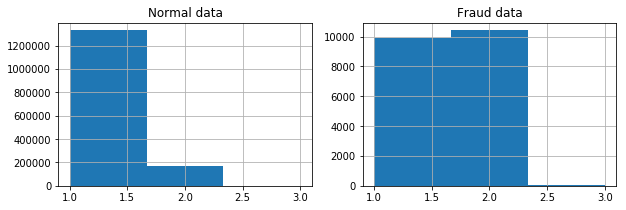

stscd_value_counts


<Figure size 432x288 with 0 Axes>

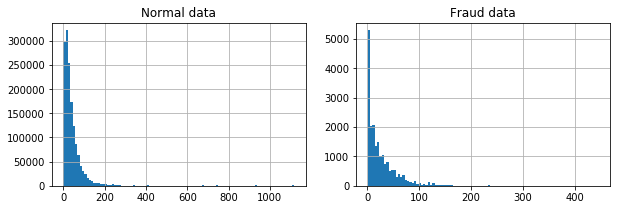

stscd_ratio


<Figure size 432x288 with 0 Axes>

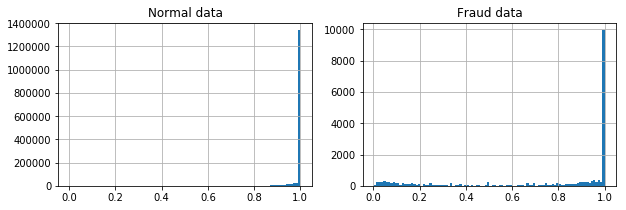

bacno_hcefg_nunique


<Figure size 432x288 with 0 Axes>

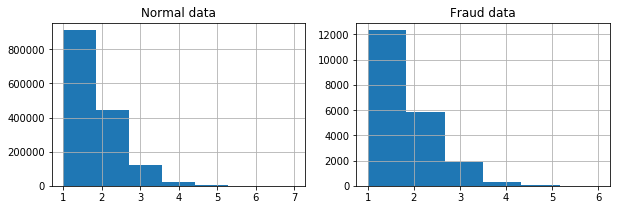

hcefg_value_counts


<Figure size 432x288 with 0 Axes>

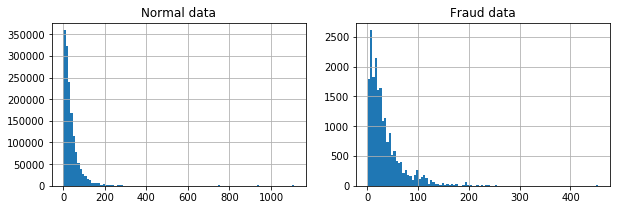

hcefg_ratio


<Figure size 432x288 with 0 Axes>

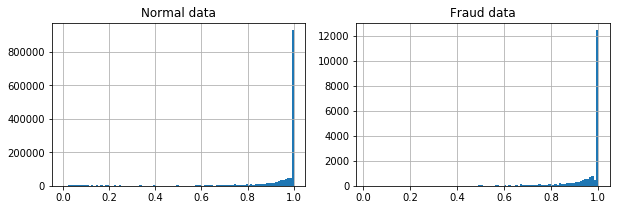

cano_txkey_nunique


<Figure size 432x288 with 0 Axes>

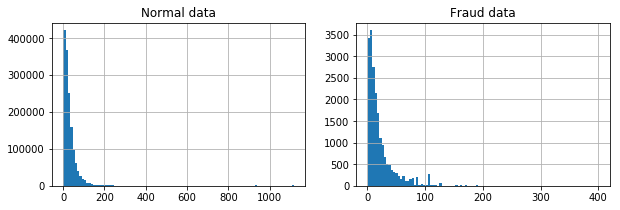

cano_stocn_nunique


<Figure size 432x288 with 0 Axes>

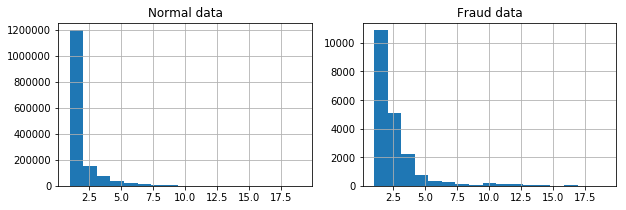

stocn_value_counts_cano


<Figure size 432x288 with 0 Axes>

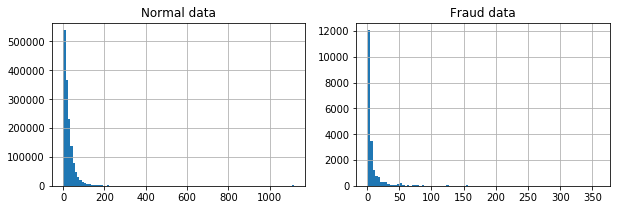

stocn_ratio_cano


<Figure size 432x288 with 0 Axes>

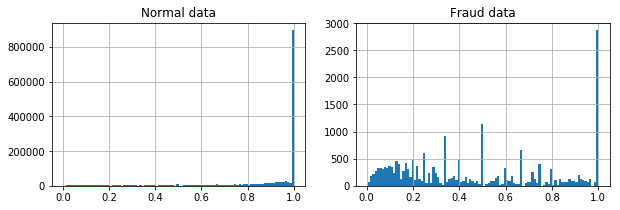

cano_csmcu_nunique


<Figure size 432x288 with 0 Axes>

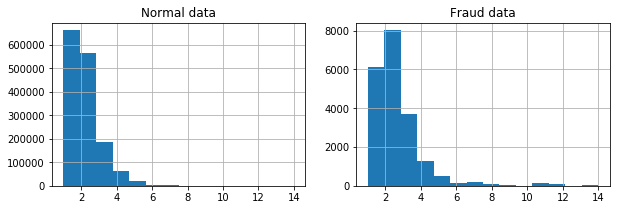

csmcu_value_counts_cano


<Figure size 432x288 with 0 Axes>

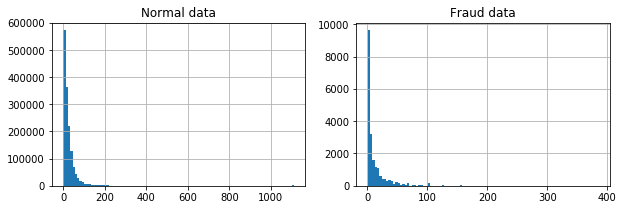

csmcu_ratio_cano


<Figure size 432x288 with 0 Axes>

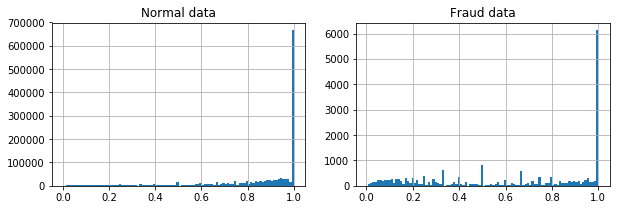

cano_mchno_nunique


<Figure size 432x288 with 0 Axes>

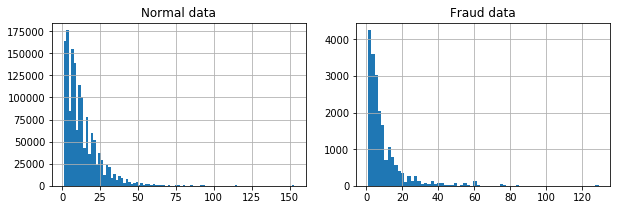

mchno_value_counts_cano


<Figure size 432x288 with 0 Axes>

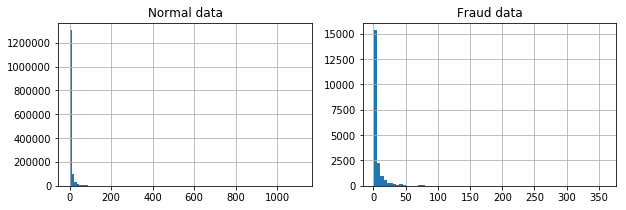

mchno_ratio_cano


<Figure size 432x288 with 0 Axes>

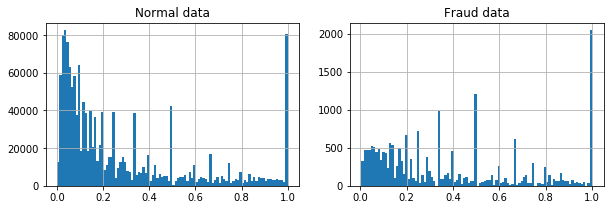

cano_acqic_nunique


<Figure size 432x288 with 0 Axes>

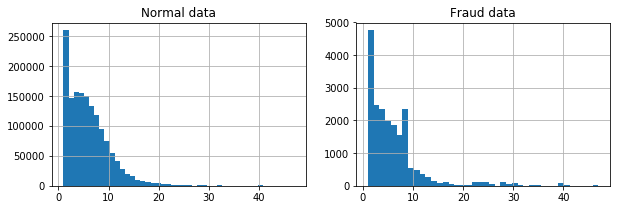

acqic_value_counts_cano


<Figure size 432x288 with 0 Axes>

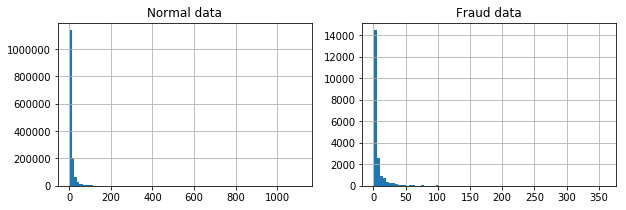

acqic_ratio_cano


<Figure size 432x288 with 0 Axes>

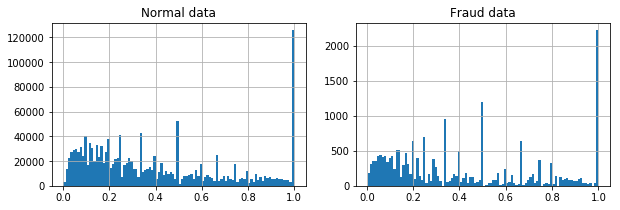

cano_mcc_nunique


<Figure size 432x288 with 0 Axes>

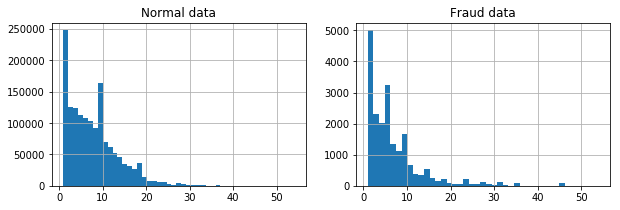

mcc_value_counts_cano


<Figure size 432x288 with 0 Axes>

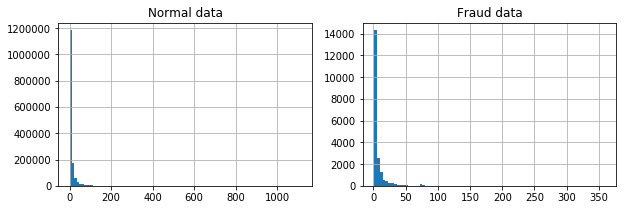

mcc_ratio_cano


<Figure size 432x288 with 0 Axes>

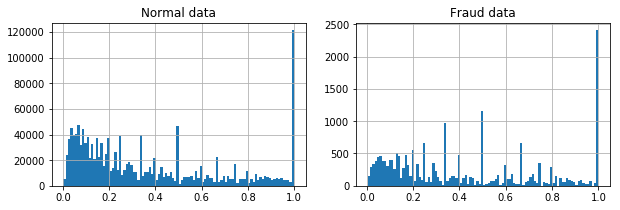

cano_scity_nunique


<Figure size 432x288 with 0 Axes>

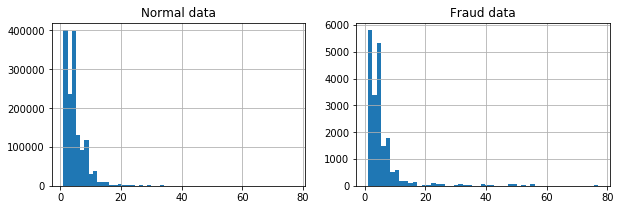

scity_value_counts_cano


<Figure size 432x288 with 0 Axes>

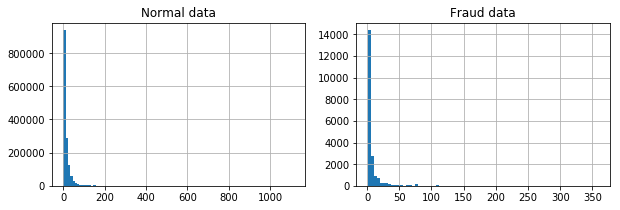

scity_ratio_cano


<Figure size 432x288 with 0 Axes>

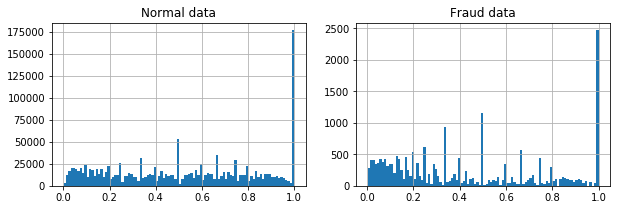

cano_contp_nunique


<Figure size 432x288 with 0 Axes>

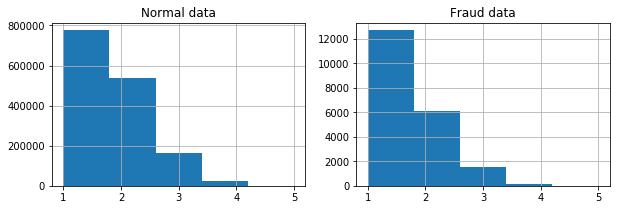

contp_value_counts_cano


<Figure size 432x288 with 0 Axes>

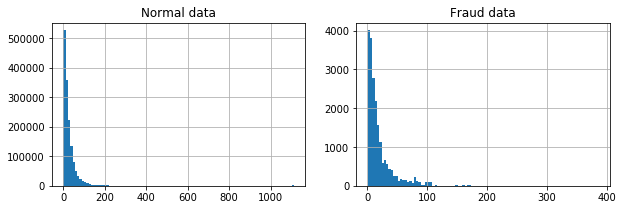

contp_ratio_cano


<Figure size 432x288 with 0 Axes>

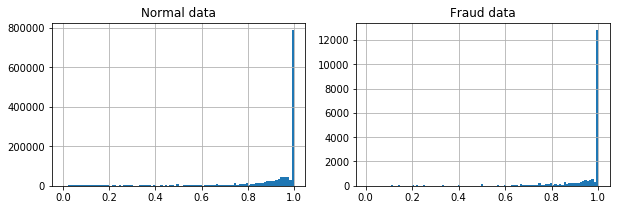

cano_etymd_nunique


<Figure size 432x288 with 0 Axes>

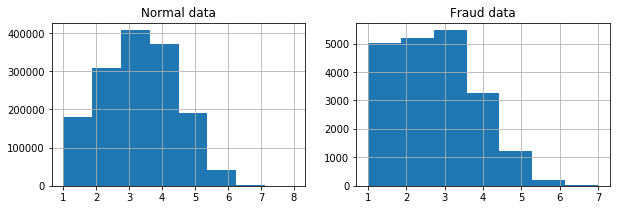

etymd_value_counts_cano


<Figure size 432x288 with 0 Axes>

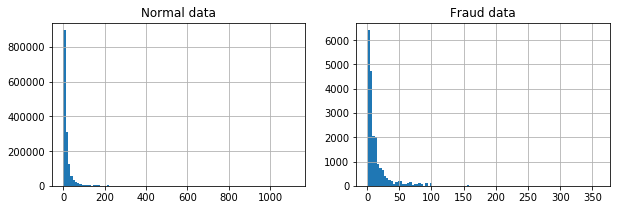

etymd_ratio_cano


<Figure size 432x288 with 0 Axes>

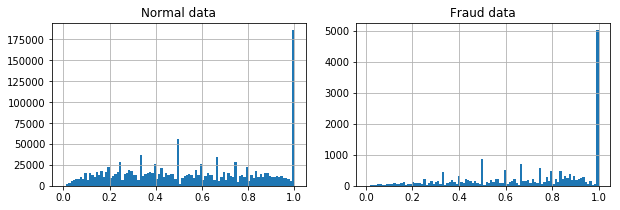

cano_stscd_nunique


<Figure size 432x288 with 0 Axes>

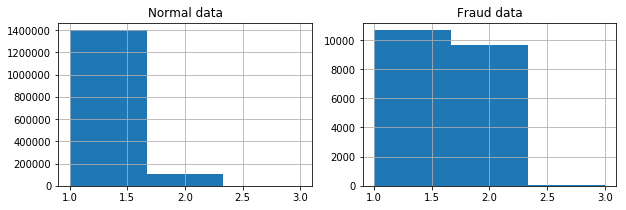

stscd_value_counts_cano


<Figure size 432x288 with 0 Axes>

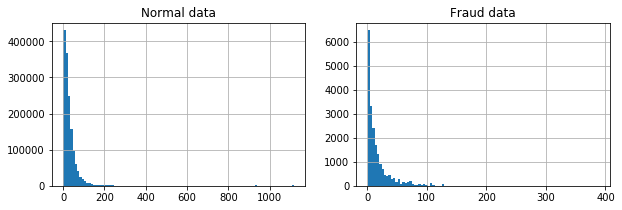

stscd_ratio_cano


<Figure size 432x288 with 0 Axes>

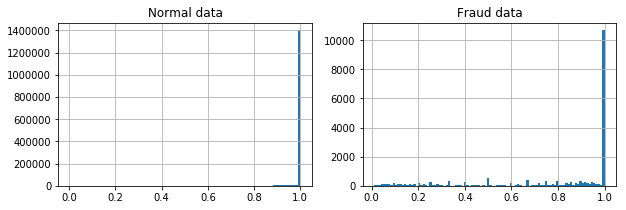

cano_hcefg_nunique


<Figure size 432x288 with 0 Axes>

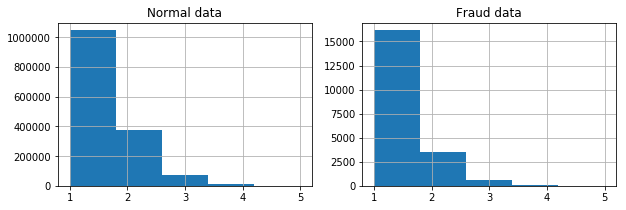

hcefg_value_counts_cano


<Figure size 432x288 with 0 Axes>

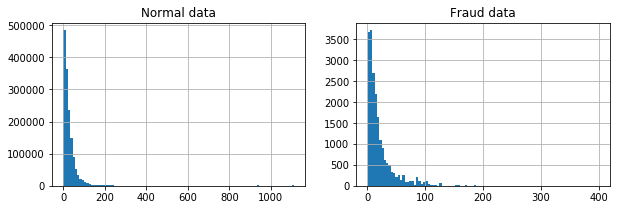

hcefg_ratio_cano


<Figure size 432x288 with 0 Axes>

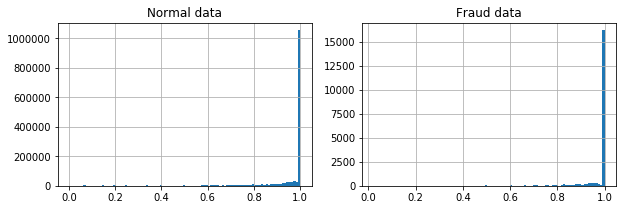

cano_only_consecutive_stscd2


<Figure size 432x288 with 0 Axes>

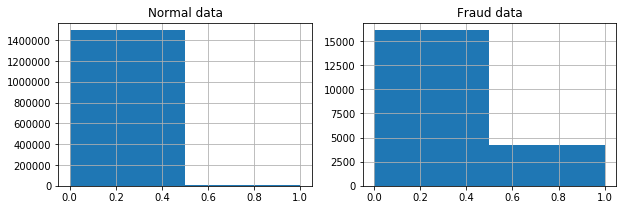

bacno_consecutive_and_only_ecfg


<Figure size 432x288 with 0 Axes>

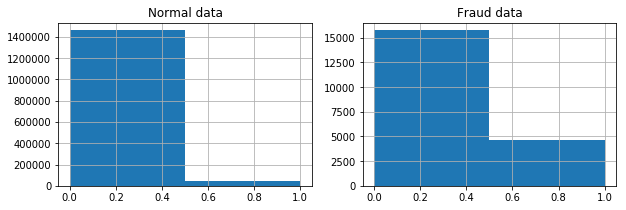

cano_lastday_use


<Figure size 432x288 with 0 Axes>

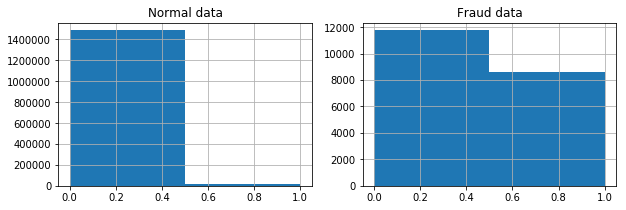

cano_lastday_use_twokind


<Figure size 432x288 with 0 Axes>

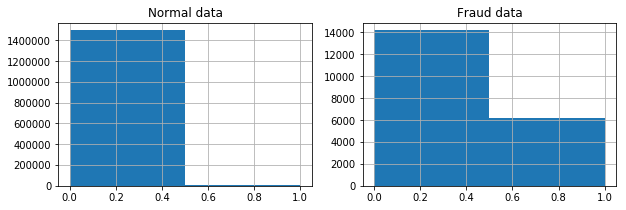

cano_lastlocdt


<Figure size 432x288 with 0 Axes>

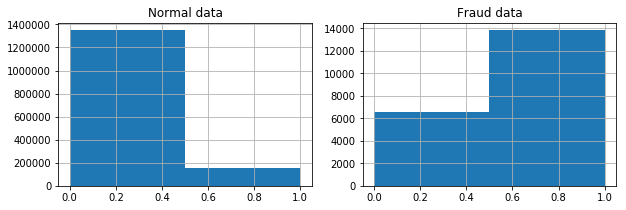

bacno_lastlocdt


<Figure size 432x288 with 0 Axes>

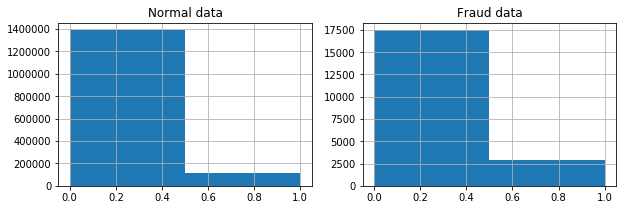

cano_lastlocdt2


<Figure size 432x288 with 0 Axes>

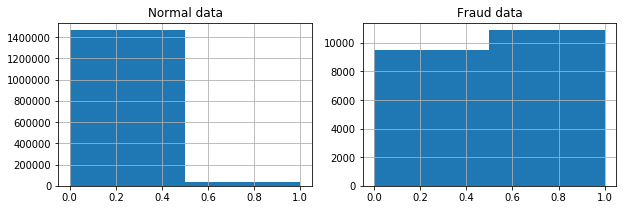

bacno_stscd_equal2


<Figure size 432x288 with 0 Axes>

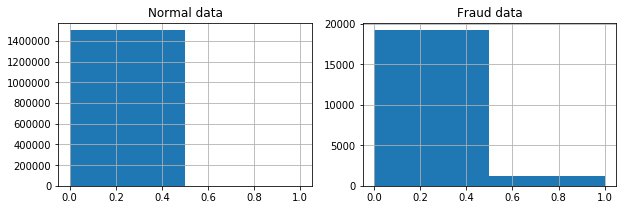

bacno_ecfg_equal1


<Figure size 432x288 with 0 Axes>

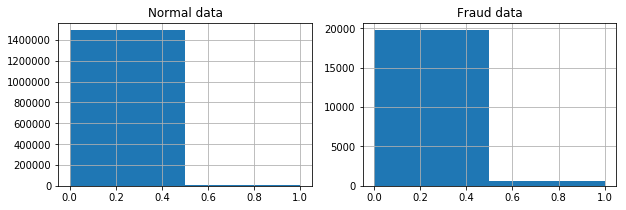

bacno_1_count


<Figure size 432x288 with 0 Axes>

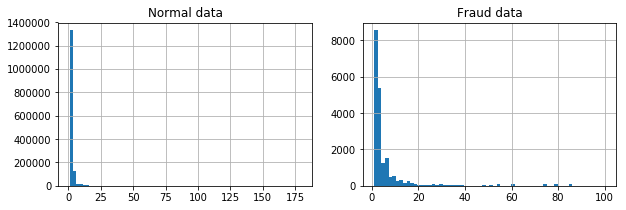

bacno_2day_count


<Figure size 432x288 with 0 Axes>

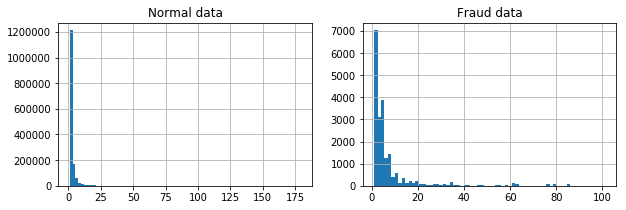

bacno_3day_count


<Figure size 432x288 with 0 Axes>

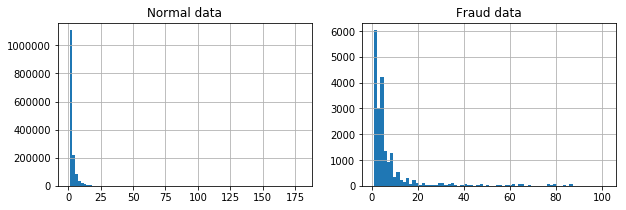

bacno_7day_count


<Figure size 432x288 with 0 Axes>

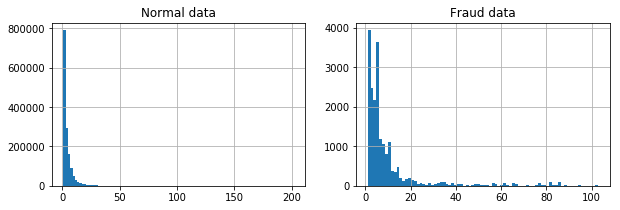

bacno_2day_after_count


<Figure size 432x288 with 0 Axes>

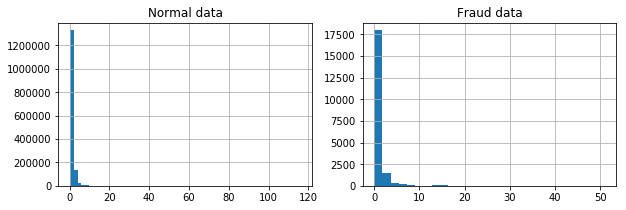

bacno_3day_after_count


<Figure size 432x288 with 0 Axes>

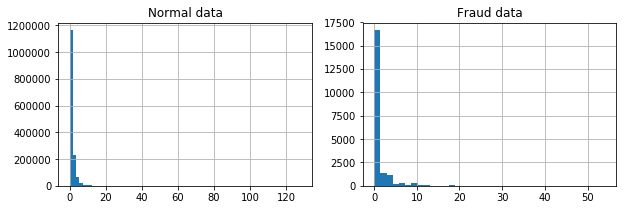

bacno_7day_after_count


<Figure size 432x288 with 0 Axes>

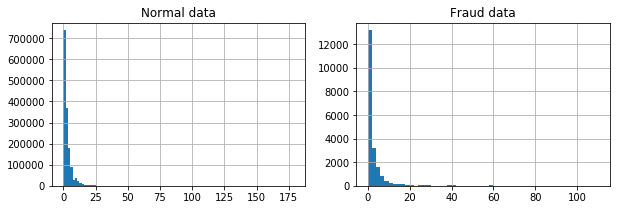

bacno_cano_changetimes


<Figure size 432x288 with 0 Axes>

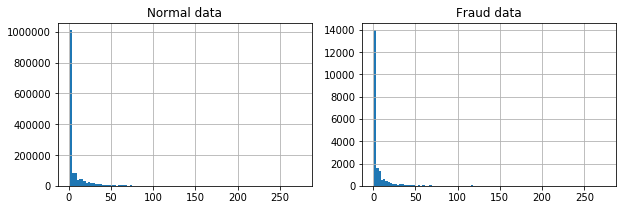

cano_change_ratio


<Figure size 432x288 with 0 Axes>

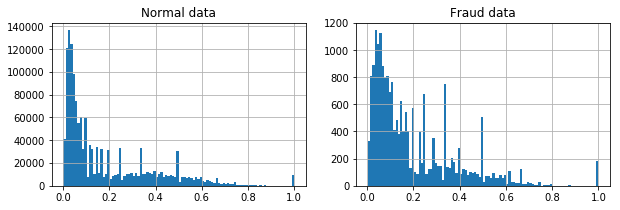

bacno_locdt_diff


<Figure size 432x288 with 0 Axes>

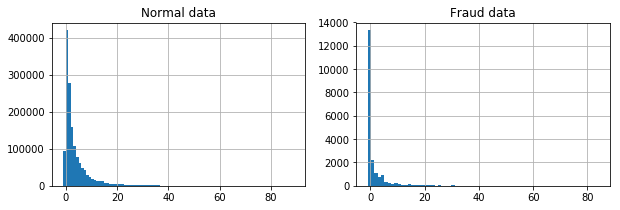

bacno_loctm_diff


<Figure size 432x288 with 0 Axes>

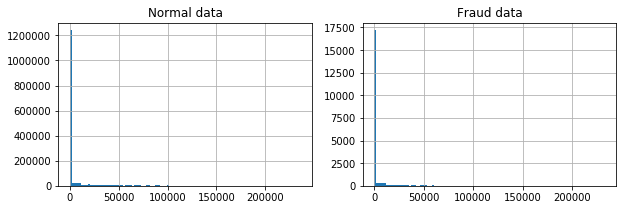

bacno_cano_monoincrease


<Figure size 432x288 with 0 Axes>

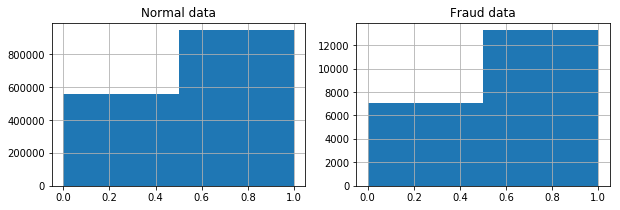

bacno_contp_mode


<Figure size 432x288 with 0 Axes>

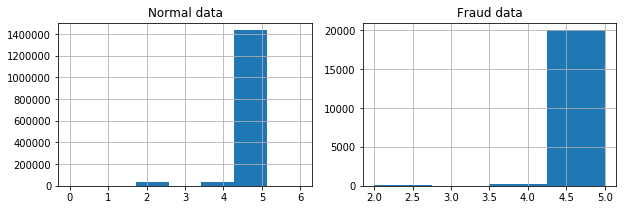

cano_contp_mode


<Figure size 432x288 with 0 Axes>

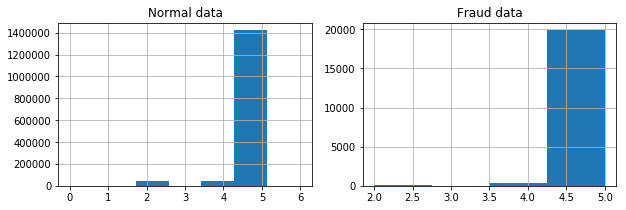

bacno_etymd_mode


<Figure size 432x288 with 0 Axes>

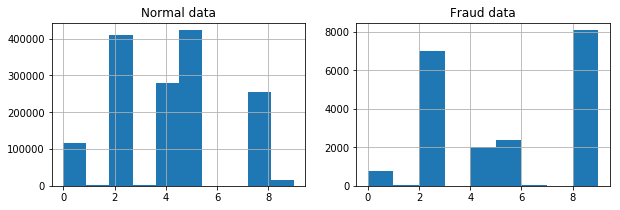

cano_etymd_mode


<Figure size 432x288 with 0 Axes>

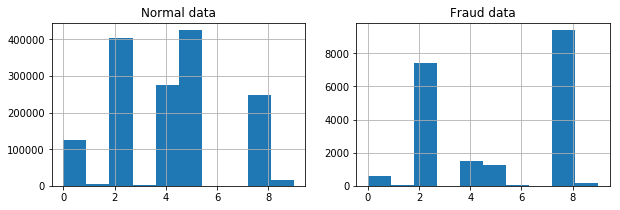

bacno_mchno_mode


<Figure size 432x288 with 0 Axes>

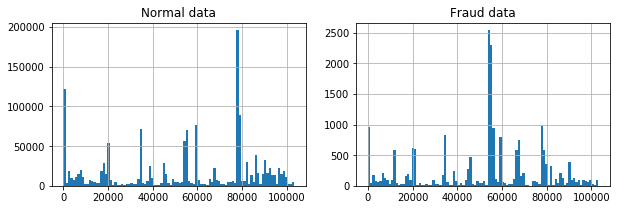

cano_mchno_mode


<Figure size 432x288 with 0 Axes>

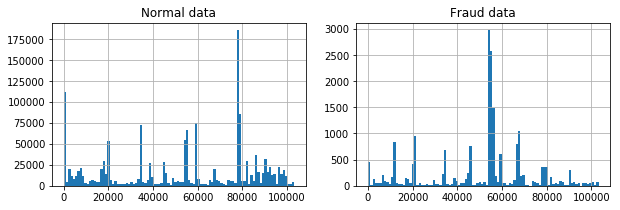

bacno_acqic_mode


<Figure size 432x288 with 0 Axes>

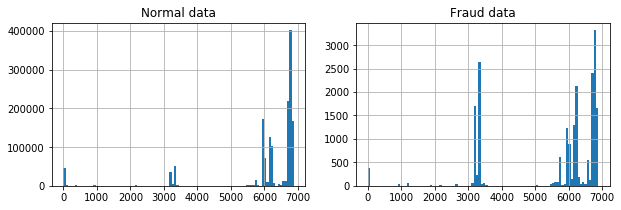

cano_acqic_mode


<Figure size 432x288 with 0 Axes>

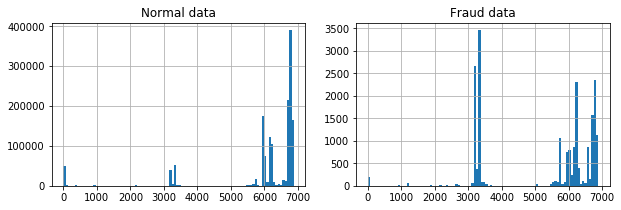

bacno_mcc_mode


<Figure size 432x288 with 0 Axes>

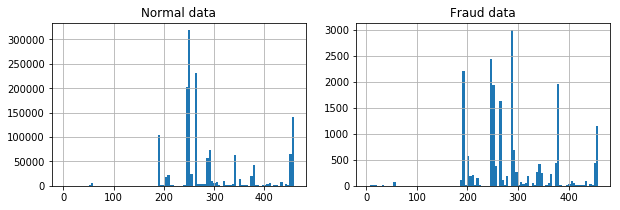

cano_mcc_mode


<Figure size 432x288 with 0 Axes>

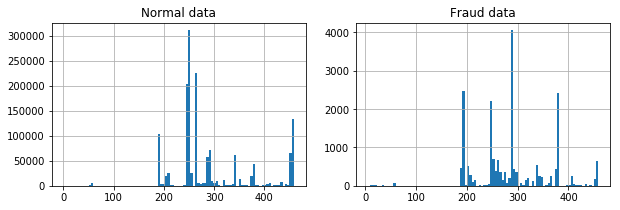

bacno_ecfg_mode


<Figure size 432x288 with 0 Axes>

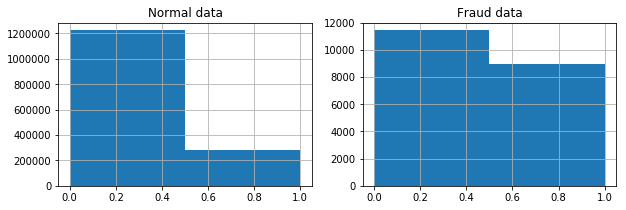

cano_ecfg_mode


<Figure size 432x288 with 0 Axes>

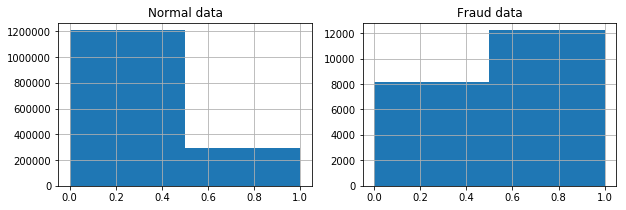

bacno_hcefg_mode


<Figure size 432x288 with 0 Axes>

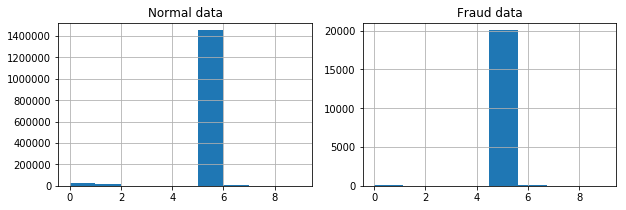

cano_hcefg_mode


<Figure size 432x288 with 0 Axes>

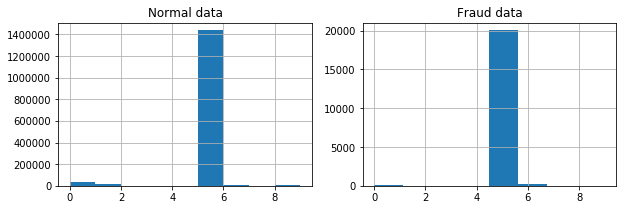

bacno_stscd_mode


<Figure size 432x288 with 0 Axes>

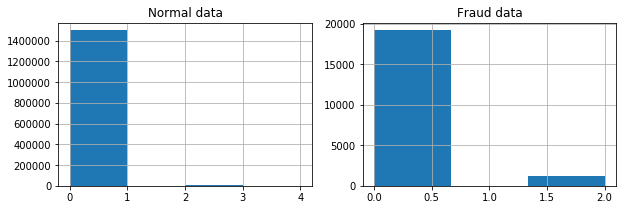

cano_stscd_mode


<Figure size 432x288 with 0 Axes>

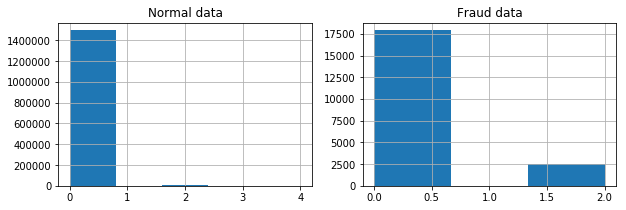

bacno_contp_diff1


<Figure size 432x288 with 0 Axes>

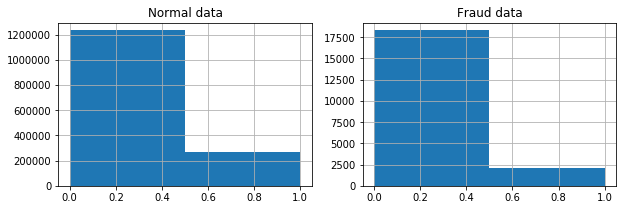

bacno_contp_diff2


<Figure size 432x288 with 0 Axes>

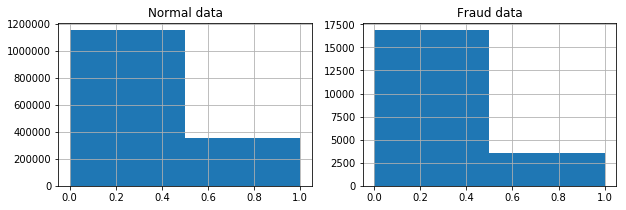

bacno_contp_diff3


<Figure size 432x288 with 0 Axes>

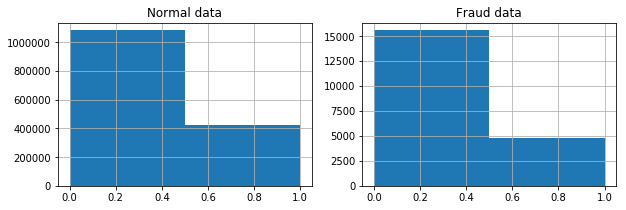

bacno_etymd_diff1


<Figure size 432x288 with 0 Axes>

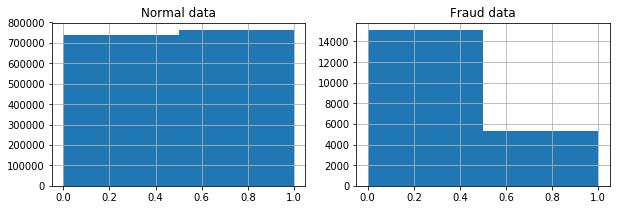

bacno_etymd_diff2


<Figure size 432x288 with 0 Axes>

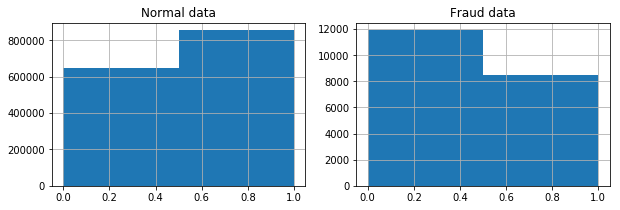

bacno_etymd_diff3


<Figure size 432x288 with 0 Axes>

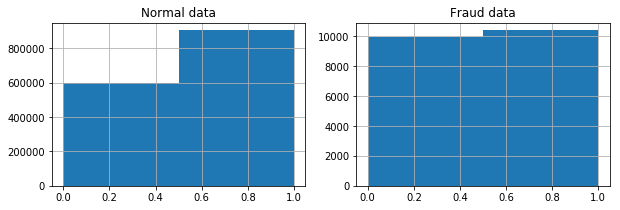

bacno_mchno_diff1


<Figure size 432x288 with 0 Axes>

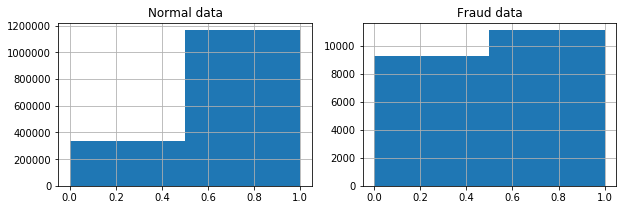

bacno_mchno_diff2


<Figure size 432x288 with 0 Axes>

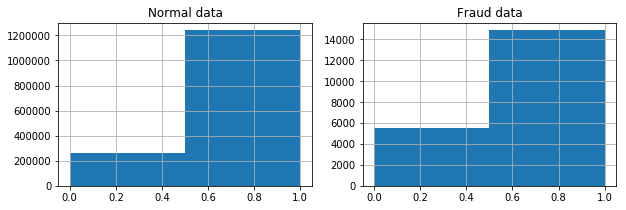

bacno_mchno_diff3


<Figure size 432x288 with 0 Axes>

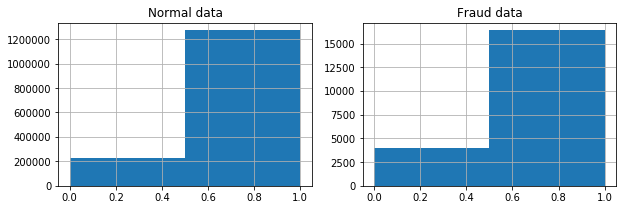

bacno_acqic_diff1


<Figure size 432x288 with 0 Axes>

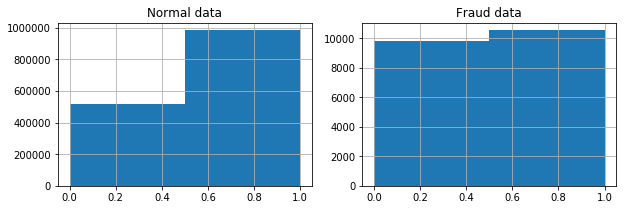

bacno_acqic_diff2


<Figure size 432x288 with 0 Axes>

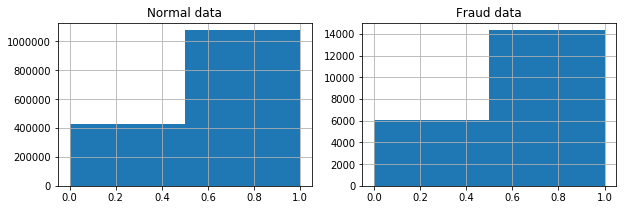

bacno_acqic_diff3


<Figure size 432x288 with 0 Axes>

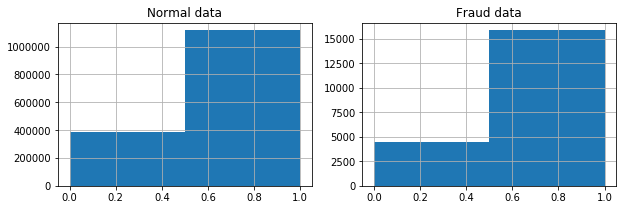

bacno_mcc_diff1


<Figure size 432x288 with 0 Axes>

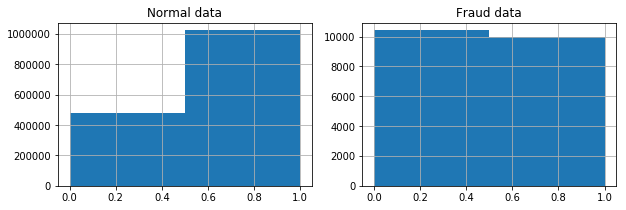

bacno_mcc_diff2


<Figure size 432x288 with 0 Axes>

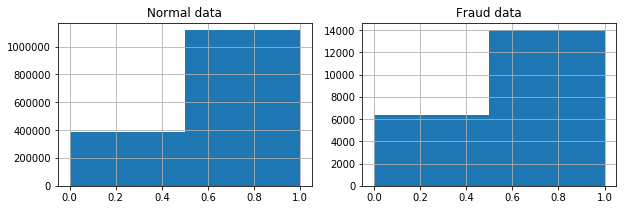

bacno_mcc_diff3


<Figure size 432x288 with 0 Axes>

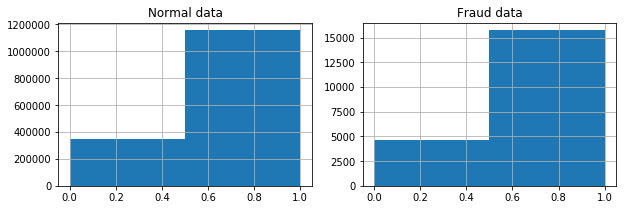

bacno_ecfg_diff1


<Figure size 432x288 with 0 Axes>

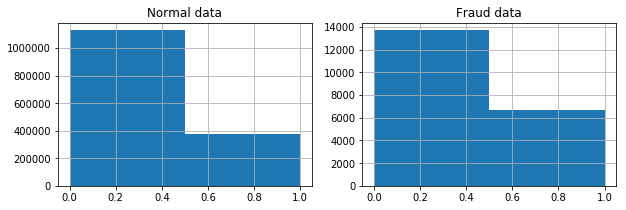

bacno_ecfg_diff2


<Figure size 432x288 with 0 Axes>

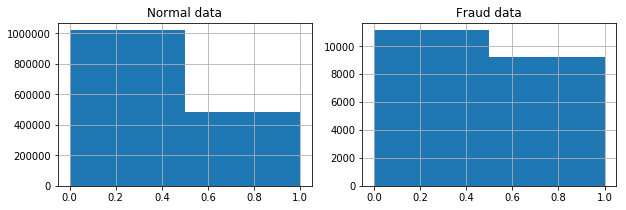

bacno_ecfg_diff3


<Figure size 432x288 with 0 Axes>

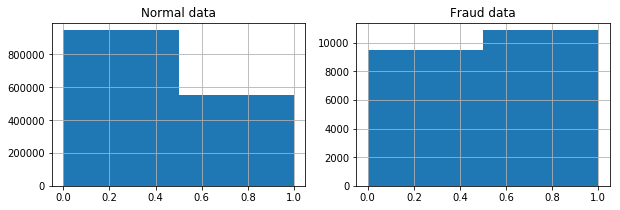

bacno_hcefg_diff1


<Figure size 432x288 with 0 Axes>

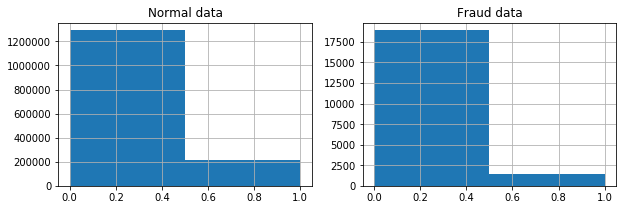

bacno_hcefg_diff2


<Figure size 432x288 with 0 Axes>

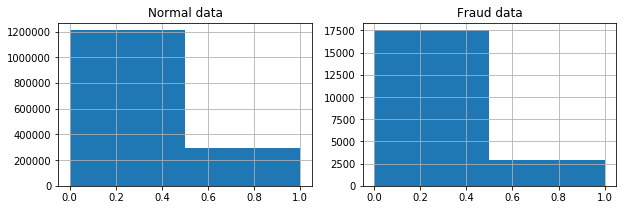

bacno_hcefg_diff3


<Figure size 432x288 with 0 Axes>

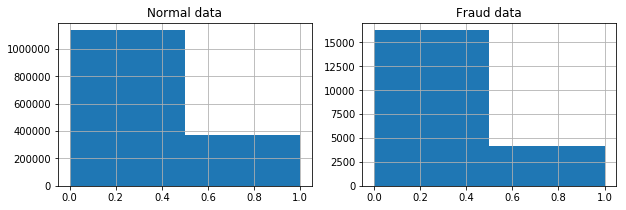

bacno_stscd_diff1


<Figure size 432x288 with 0 Axes>

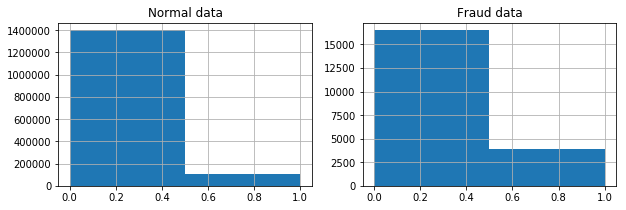

bacno_stscd_diff2


<Figure size 432x288 with 0 Axes>

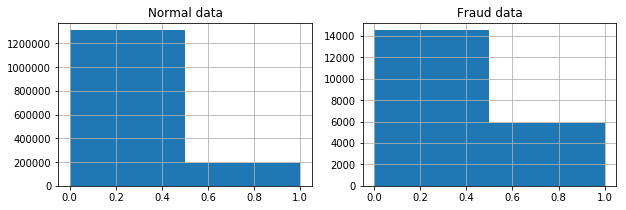

bacno_stscd_diff3


<Figure size 432x288 with 0 Axes>

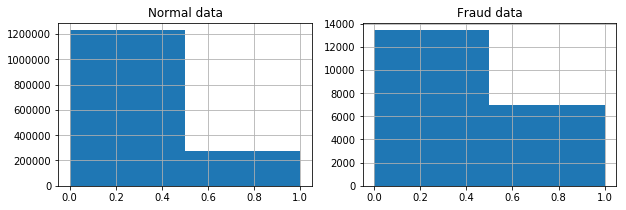

bacno_stocn_diff1


<Figure size 432x288 with 0 Axes>

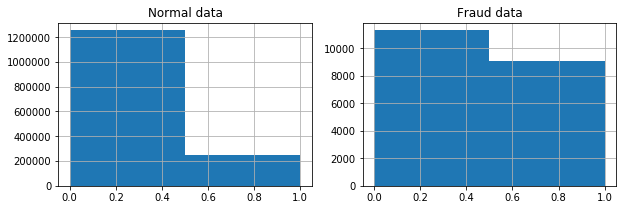

bacno_stocn_diff2


<Figure size 432x288 with 0 Axes>

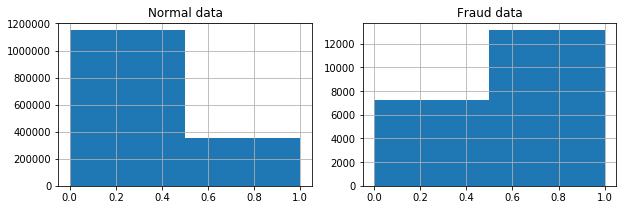

bacno_stocn_diff3


<Figure size 432x288 with 0 Axes>

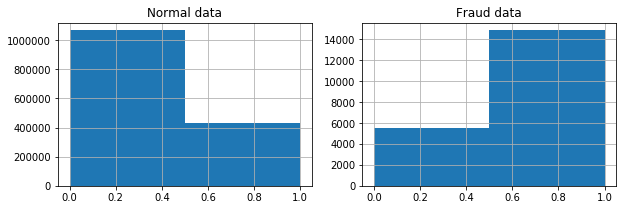

bacno_scity_diff1


<Figure size 432x288 with 0 Axes>

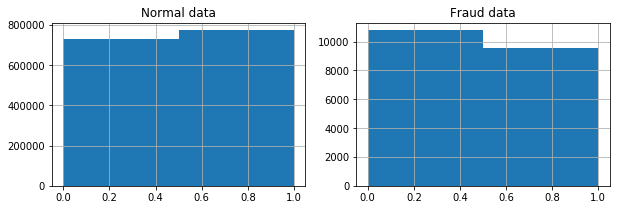

bacno_scity_diff2


<Figure size 432x288 with 0 Axes>

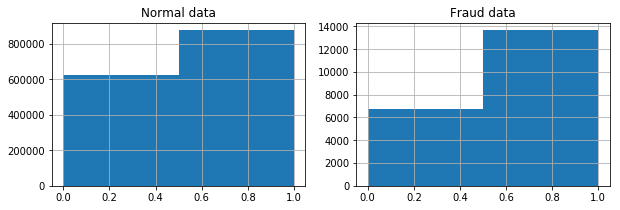

bacno_scity_diff3


<Figure size 432x288 with 0 Axes>

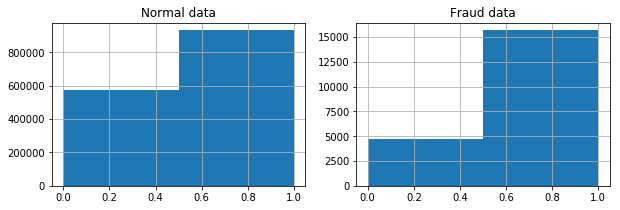

bacno_csmcu_diff1


<Figure size 432x288 with 0 Axes>

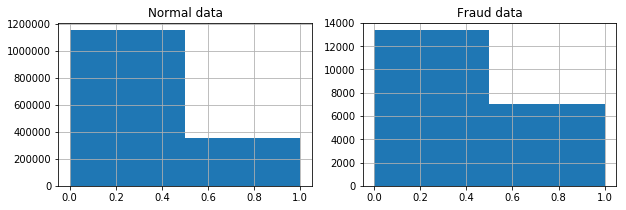

bacno_csmcu_diff2


<Figure size 432x288 with 0 Axes>

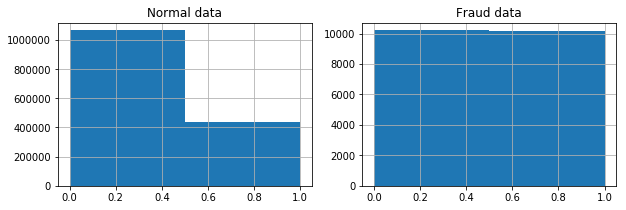

bacno_csmcu_diff3


<Figure size 432x288 with 0 Axes>

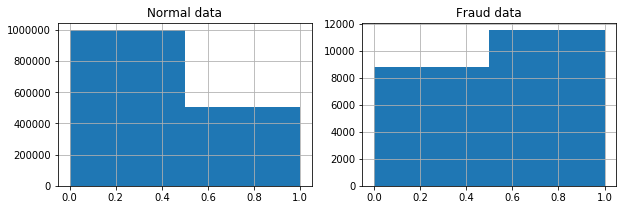

cano_contp_diff1


<Figure size 432x288 with 0 Axes>

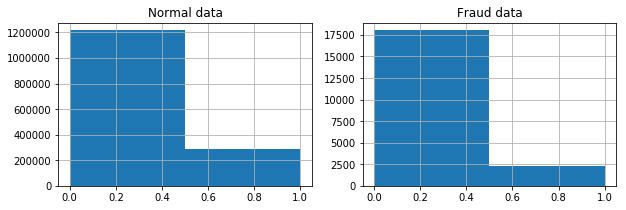

cano_contp_diff2


<Figure size 432x288 with 0 Axes>

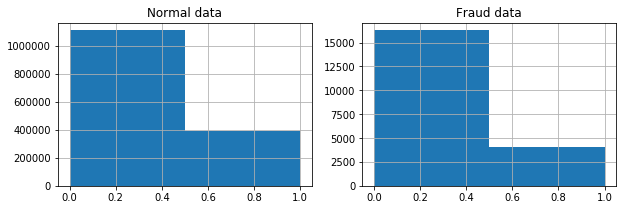

cano_contp_diff3


<Figure size 432x288 with 0 Axes>

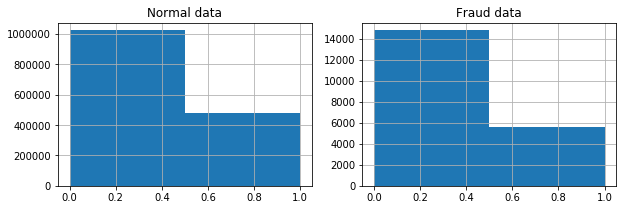

cano_etymd_diff1


<Figure size 432x288 with 0 Axes>

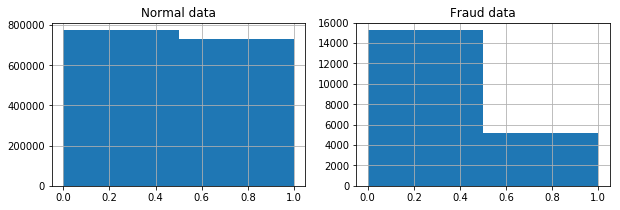

cano_etymd_diff2


<Figure size 432x288 with 0 Axes>

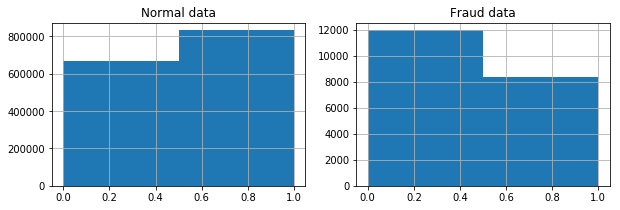

cano_etymd_diff3


<Figure size 432x288 with 0 Axes>

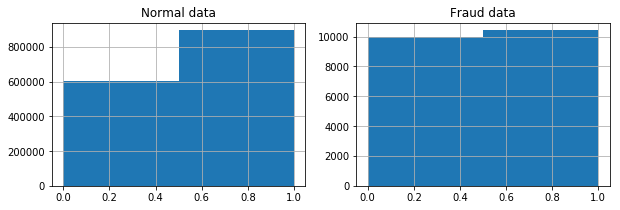

cano_mchno_diff1


<Figure size 432x288 with 0 Axes>

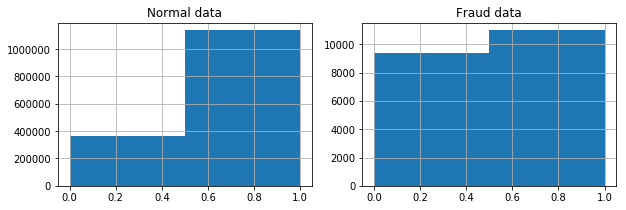

cano_mchno_diff2


<Figure size 432x288 with 0 Axes>

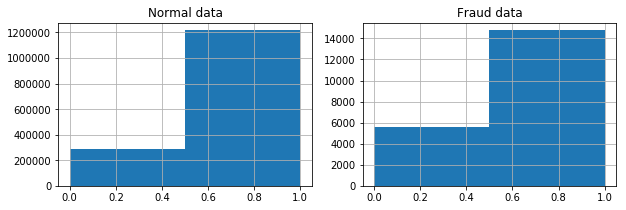

cano_mchno_diff3


<Figure size 432x288 with 0 Axes>

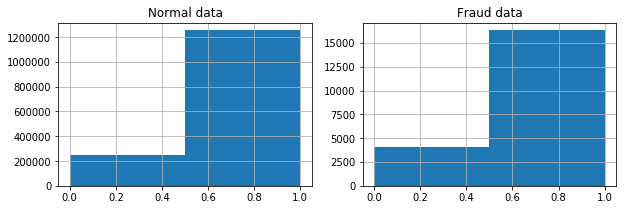

cano_acqic_diff1


<Figure size 432x288 with 0 Axes>

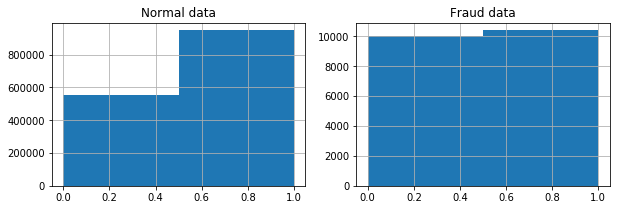

cano_acqic_diff2


<Figure size 432x288 with 0 Axes>

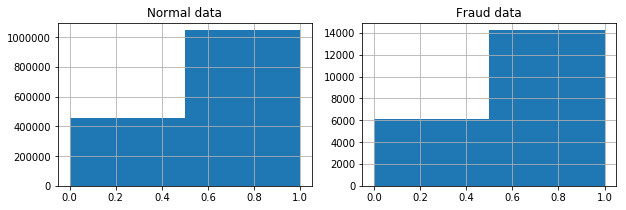

cano_acqic_diff3


<Figure size 432x288 with 0 Axes>

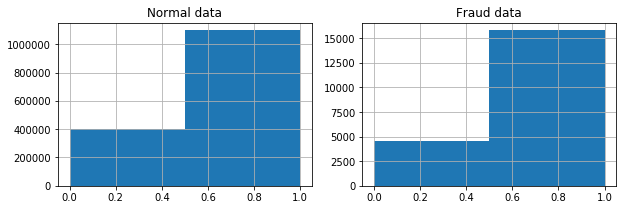

cano_mcc_diff1


<Figure size 432x288 with 0 Axes>

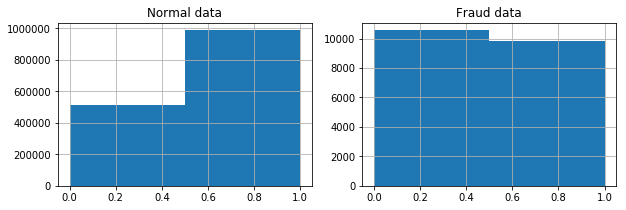

cano_mcc_diff2


<Figure size 432x288 with 0 Axes>

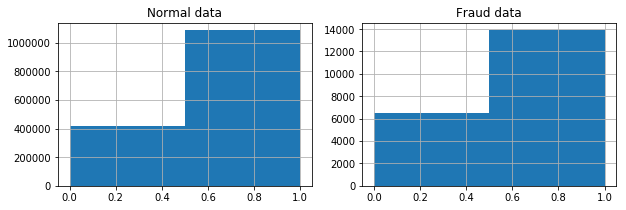

cano_mcc_diff3


<Figure size 432x288 with 0 Axes>

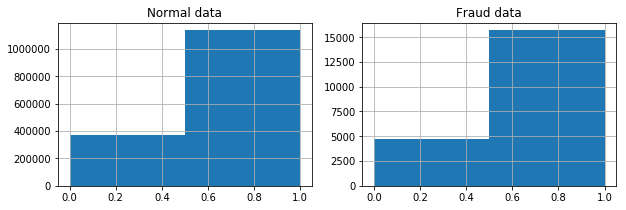

cano_ecfg_diff1


<Figure size 432x288 with 0 Axes>

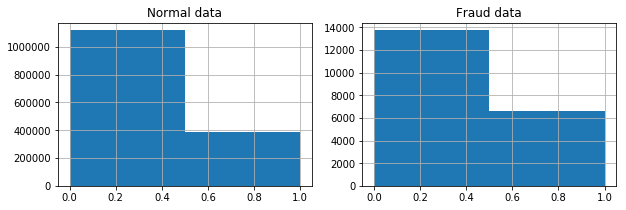

cano_ecfg_diff2


<Figure size 432x288 with 0 Axes>

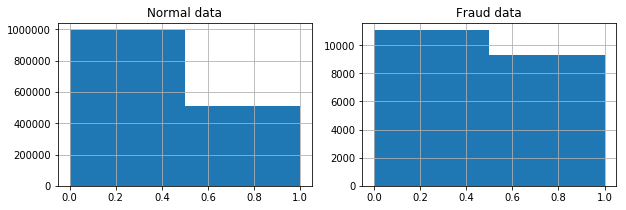

cano_ecfg_diff3


<Figure size 432x288 with 0 Axes>

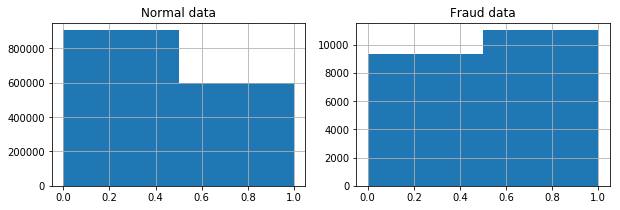

cano_hcefg_diff1


<Figure size 432x288 with 0 Axes>

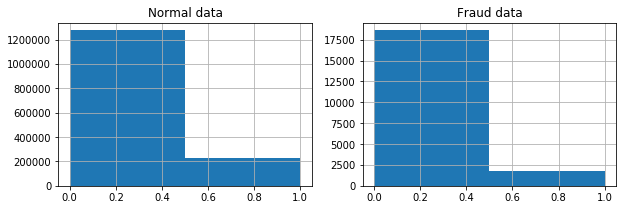

cano_hcefg_diff2


<Figure size 432x288 with 0 Axes>

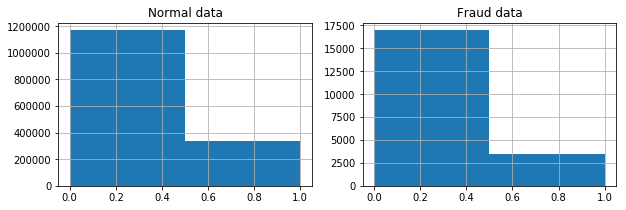

cano_hcefg_diff3


<Figure size 432x288 with 0 Axes>

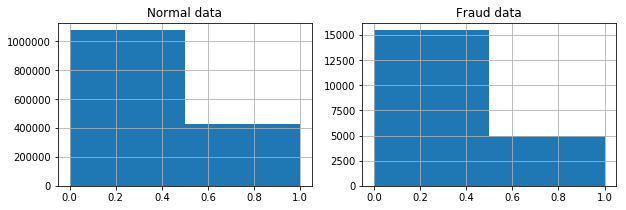

cano_stscd_diff1


<Figure size 432x288 with 0 Axes>

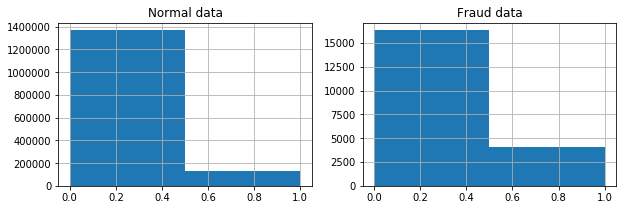

cano_stscd_diff2


<Figure size 432x288 with 0 Axes>

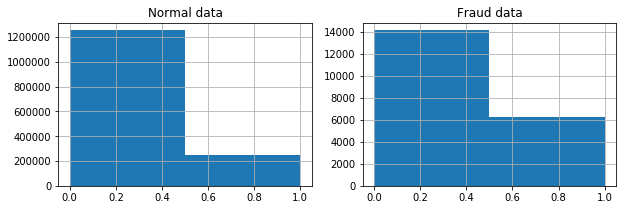

cano_stscd_diff3


<Figure size 432x288 with 0 Axes>

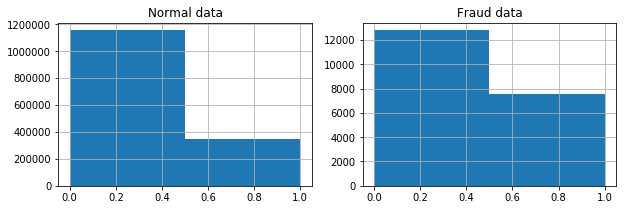

cano_stocn_diff1


<Figure size 432x288 with 0 Axes>

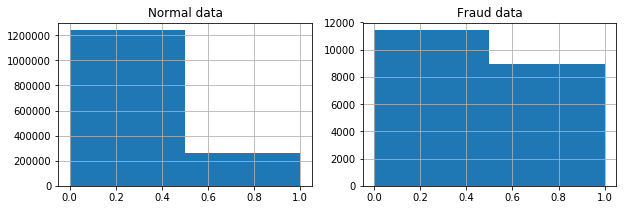

cano_stocn_diff2


<Figure size 432x288 with 0 Axes>

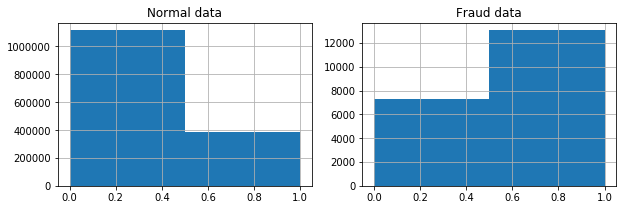

cano_stocn_diff3


<Figure size 432x288 with 0 Axes>

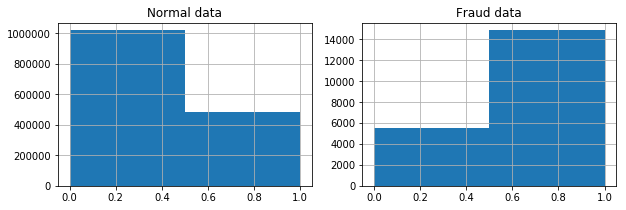

cano_scity_diff1


<Figure size 432x288 with 0 Axes>

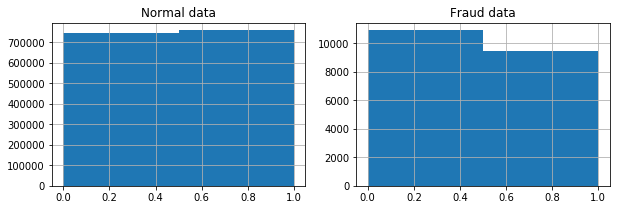

cano_scity_diff2


<Figure size 432x288 with 0 Axes>

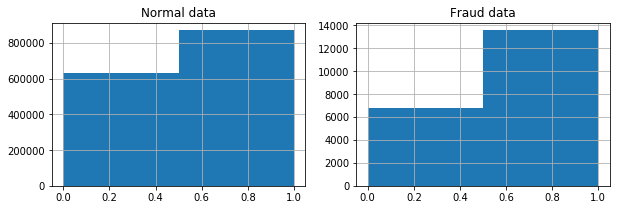

cano_scity_diff3


<Figure size 432x288 with 0 Axes>

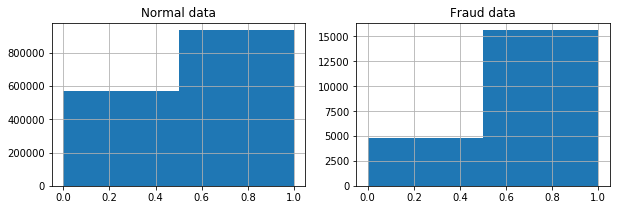

cano_csmcu_diff1


<Figure size 432x288 with 0 Axes>

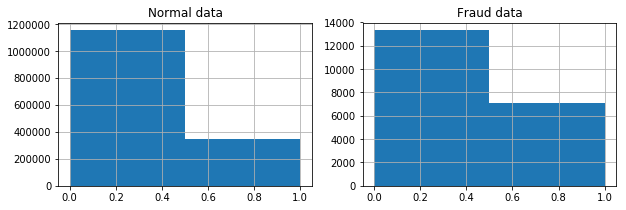

cano_csmcu_diff2


<Figure size 432x288 with 0 Axes>

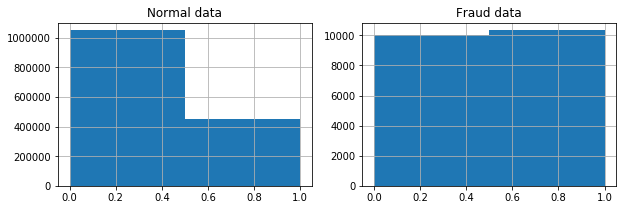

cano_csmcu_diff3


<Figure size 432x288 with 0 Axes>

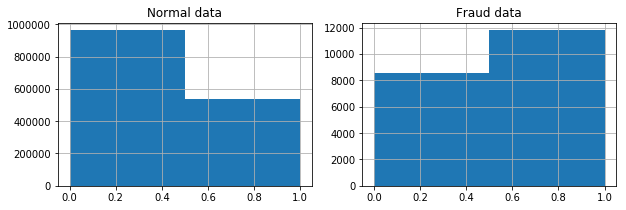

pca2_feature_1


<Figure size 432x288 with 0 Axes>

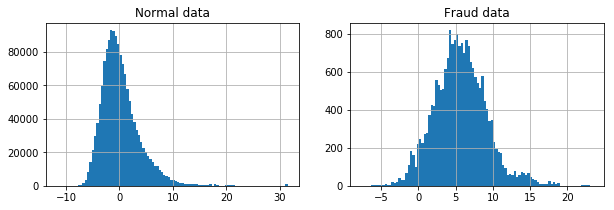

pca2_feature_2


<Figure size 432x288 with 0 Axes>

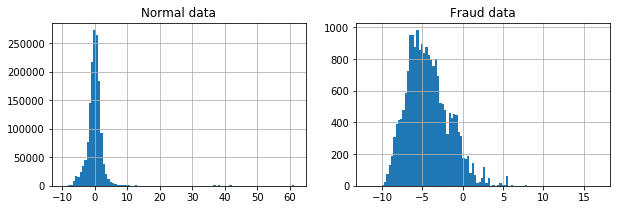

pca3_feature_1


<Figure size 432x288 with 0 Axes>

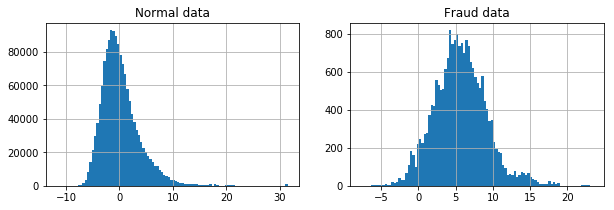

pca3_feature_2


<Figure size 432x288 with 0 Axes>

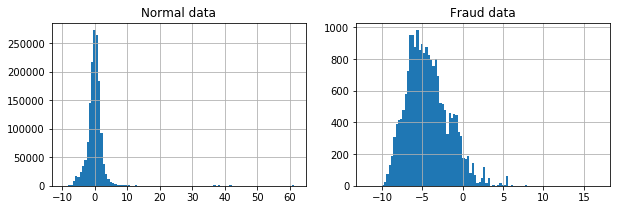

pca3_feature_3


<Figure size 432x288 with 0 Axes>

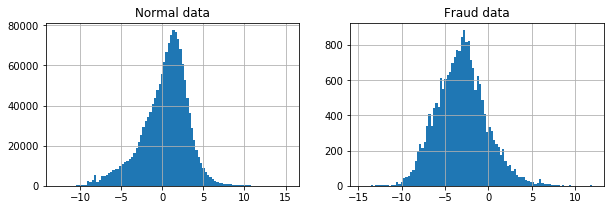

isolationtree_all_feature


<Figure size 432x288 with 0 Axes>

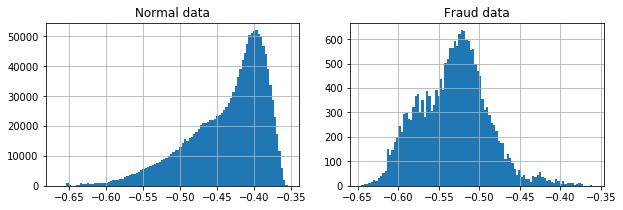

isolationtree_all_feature2


<Figure size 432x288 with 0 Axes>

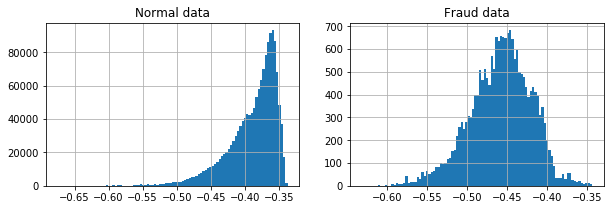

isolationtree_all_feature3


<Figure size 432x288 with 0 Axes>

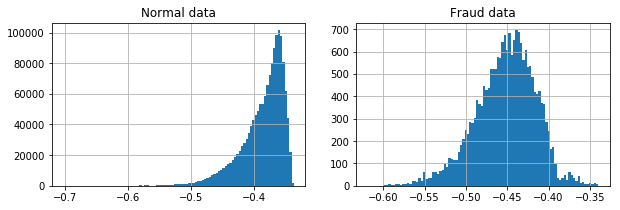

isolationtree_all_feature4


<Figure size 432x288 with 0 Axes>

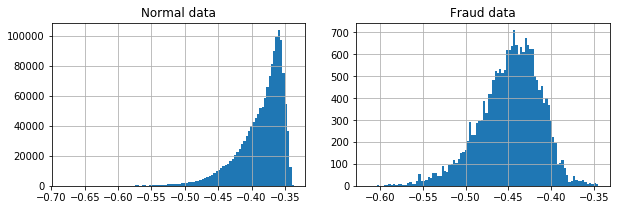

kmeans_all_feature


<Figure size 432x288 with 0 Axes>

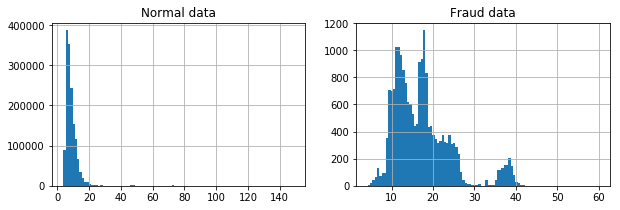

kmeans_all_feature2


<Figure size 432x288 with 0 Axes>

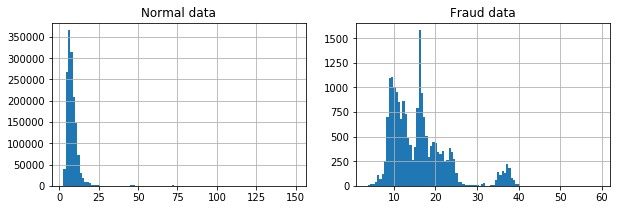

kmeans_all_feature3


<Figure size 432x288 with 0 Axes>

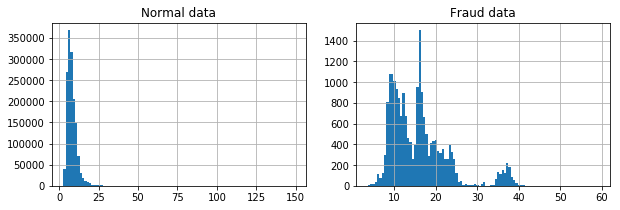

kmeans_all_feature4


<Figure size 432x288 with 0 Axes>

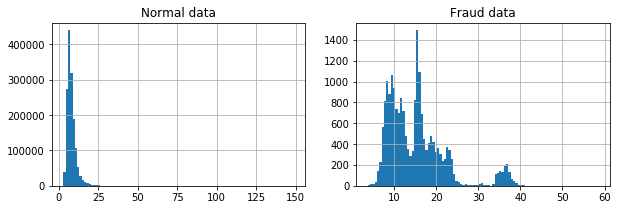

kmeans_all_feature5


<Figure size 432x288 with 0 Axes>

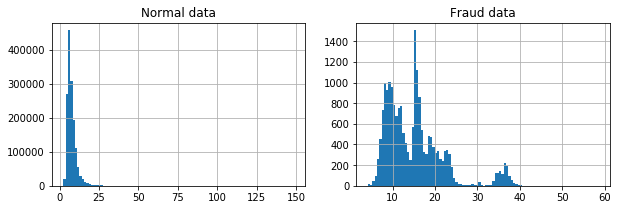

svm_rbf


<Figure size 432x288 with 0 Axes>

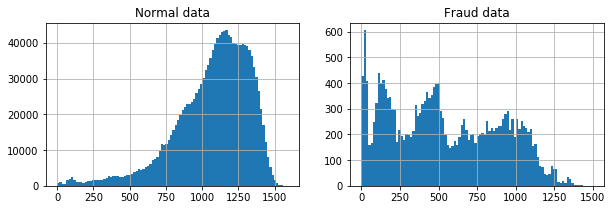

In [7]:
normal_data = all_data[all_data['fraud_ind']==0]
fraud_data = all_data[all_data['fraud_ind']==1]

for c in normal_data.columns:
    print(c)
    plt.clf()
    fig, axs = plt.subplots(1,2,figsize=(10,3))

    bins = normal_data[c].nunique() if normal_data[c].nunique()<100 else 100
    normal_data[c].hist(bins=bins,ax=axs[0])
    axs[0].set_title('Normal data')
    bins = fraud_data[c].nunique() if fraud_data[c].nunique()<100 else 100
    fraud_data[c].hist(bins=bins,ax=axs[1])
    axs[1].set_title('Fraud data')
    plt.show()


### 檢查在test data中,新出現的類別有多少
bacno, mchno, acqic, mcc, stocn, scity, csmcu 

In [8]:
def find_new_category(x,target_name):
    x_train = x[x['locdt']<=90][target_name].unique()
    x_test = x[x['locdt']>90][target_name].unique()
    
    print(target_name)
    print('{} categories in Training data:'.format(x_train.shape[0]))
    print('{} categories in Testing data:'.format(x_test.shape[0]))

    x_new_test=[]
    for b in x_test:
        if b not in x_train:
            x_new_test.append(b)

    print('{} new categories'.format(len(x_new_test)))    

In [9]:
# 幾乎所有在test data的都是新用戶 乾
# 所以重點特徵工程不能使用用戶過去的fraud記錄
find_new_category(all_data,'bacno')

# 幾乎都太多只出現在test data上的新類別,這樣得轉換可以用來訓練(TODO)

find_new_category(all_data,'mchno')
find_new_category(all_data,'acqic')
find_new_category(all_data,'mcc')
find_new_category(all_data,'stocn')
find_new_category(all_data,'scity')
find_new_category(all_data,'csmcu')


bacno
95214 categories in Training data:
71099 categories in Testing data:
67971 new categories
mchno
89316 categories in Training data:
45501 categories in Testing data:
13467 new categories
acqic
6051 categories in Training data:
3748 categories in Testing data:
815 new categories
mcc
434 categories in Training data:
372 categories in Testing data:
26 new categories
stocn
103 categories in Training data:
87 categories in Testing data:
6 new categories
scity
5698 categories in Training data:
2857 categories in Testing data:
949 new categories
csmcu
72 categories in Training data:
57 categories in Testing data:
4 new categories


## 觀察large category的feature是否有很多種bacno的fraud

In [ ]:
# mchno_bacno_count = all_data.groupby('mchno').apply(lambda s:s[s['fraud_ind']==1]['bacno'].nunique())
# acqic_bacno_count = all_data.groupby('acqic').apply(lambda s:s[s['fraud_ind']==1]['bacno'].nunique())
# mcc_bacno_count = all_data.groupby('mcc').apply(lambda s:s[s['fraud_ind']==1]['bacno'].nunique())

# print(mchno_bacno_count.sum())
# print(mchno_bacno_count[mchno_bacno_count>1].sort_values())

# print(acqic_bacno_count.sum())
# print(acqic_bacno_count[acqic_bacno_count>1].sort_values())

# print(mcc_bacno_count.sum())
# print(mcc_bacno_count[mcc_bacno_count>1].sort_values())

## 以每個bacno來看fraud情況
* 找出使用者被盜刷卡時，和一般的交易差在哪裡


In [ ]:
bacno_fraud_count = all_data.groupby('bacno').apply(lambda s:s[s['fraud_ind']==1]['bacno'].shape[0])

In [ ]:
# print('All fraud instance',all_data.fraud_ind.sum(skipna=True))
# print('{} different bacno'.format(bacno_fraud_count[bacno_fraud_count>0].shape[0]))

# bacno_fraud_count[(bacno_fraud_count<10)&(bacno_fraud_count>0)].hist(bins=9)
# plt.show()
# plt.clf()
# bacno_fraud_count[(bacno_fraud_count>0)].hist(bins=100)

## 幾乎都只被騙過一兩次

In [ ]:
list1=['locdt','cano','etymd','mchno','acqic','mcc','stocn','conam','fraud_ind']
list2=['locdt','conam','cano','ecfg','stscd','stocn','mchno','fraud_ind']
list3=['locdt','conam','cano','stocn','scity','flbmk','csmcu','ecfg','fraud_ind']
list4=['locdt','cano','contp','bacno_contp_diff1','fraud_ind']
# 
# ,'ecfg','etymd'
bacno_10fraud_more_list = bacno_fraud_count[(bacno_fraud_count==1)].index
pd.set_option('display.max_rows', 1000)
# print(x)
# pd.reset_option('display.max_rows')

cnt=0
for b in bacno_10fraud_more_list:
    cnt+=1
    if cnt>300:
        break
    print()
    
    print(b,all_data[all_data['bacno']==b]['fraud_ind'].sum())
    print(all_data[all_data['bacno']==b][list4])
        
#     print(all_data[all_data['bacno']==b][list4].sort_values(by=['locdt']))

In [ ]:
print(all_data.bacno_contp_mode.value_counts())

In [ ]:
for i in all_data.columns:
    print(i)
    

In [ ]:
all_data = all_data.sort_values(by=['bacno','locdt','loctm'],)
print(all_data[['bacno','locdt','loctm']])

In [ ]:
list1=['locdt','cano','etymd','mchno','acqic','mcc','stocn','conam','fraud_ind']
list2=['locdt','loctm','cano','bacno_loctm_diff','fraud_ind']
# 
# ,'ecfg'

bacno_10fraud_more_list = bacno_fraud_count[(bacno_fraud_count==1)].index
pd.set_option('display.max_rows', 1000)
# print(x)
# pd.reset_option('display.max_rows')

cnt=0
for b in bacno_10fraud_more_list:
    cnt+=1
    if cnt>100:
        break
    print()
    
    print(b,all_data[all_data['bacno']==b]['fraud_ind'].sum())
    print(all_data[all_data['bacno']==b][list2])

曾經在該國被盜刷的紀錄
曾經在該mchno被盜刷的紀錄
曾經在該mchno被盜刷
最後一筆是不是盜刷


In [ ]:
a = pd.DataFrame([[1,2,3],[2,3,4]],columns=['a','b','c'])
a

In [ ]:
b = a[a['b']==2]
b

In [ ]:
a.loc[a['b']==2,'a']=2
a

In [ ]:
tmp_df = all_data.groupby(['bacno']).apply()